In [1]:
import pandas as pd
import numpy as np
!pip install st_dbscan
from st_dbscan import ST_DBSCAN
from datetime import datetime
import time
import matplotlib.pyplot as plt
import os
import geopandas as gpd
import pandas as pd
from sklearn.cluster import DBSCAN
import seaborn as sns
from itertools import product
from sklearn.preprocessing import MinMaxScaler
import matplotlib.colors as mcolors

# Functions

In [2]:
# Plot the clustering result
def plot(data, labels):
    colors = ['#a6cee3', '#1f78b4', '#b2df8a', '#33a02c', '#fb9a99', '#e31a1c', '#fdbf6f', '#ff7f00', '#cab2d6', '#6a3d9a']
    for i in range(-1, len(set(labels))):
        if i == -1:
            col = [0, 0, 0, 1]
        else:
            col = colors[i % len(colors)]

        clust = data[np.where(labels == i)]
        plt.scatter(clust[:, 1], clust[:, 2], c=[col], s=10)
    plt.show()

In [3]:
def run_st_dbscan(disasters, space_thres_list, time_thres_list, num_thres_list):
    """
    Runs ST_DBSCAN on the given DataFrame with all combinations of parameters.

    Parameters:
    - disasters: DataFrame containing columns 'centroid_lat', 'centroid_lon', 'daysSinceStart'.
    - space_thres_list: List of spatial thresholds.
    - time_thres_list: List of temporal thresholds.
    - num_thres_list: List of minimum number of points to form a cluster.

    Returns:
    - disasters: The updated DataFrame with new cluster fields for each parameter combination.
    """
    # Ensure the data chunk is properly prepared
    st_chunk = disasters[['centroid_lat', 'centroid_lon', 'daysSinceStart']].values
    st_chunk = st_chunk[~np.isnan(st_chunk).any(axis=1)]

    if st_chunk.size == 0:
        raise ValueError("No valid data points for clustering.")

    # Prepare a list to store results for CSV export
    results = []

    # Loop through all combinations of parameters
    for space_thres, time_thres, num_thres in product(space_thres_list, time_thres_list, num_thres_list):
        # Instantiate ST_DBSCAN
        st_dbscan = ST_DBSCAN(eps1=space_thres, eps2=time_thres, min_samples=num_thres)

        # Fit the data
        st_dbscan.fit(st_chunk)

        # Create a new column name for the cluster labels
        cluster_field = f'st_cluster_{space_thres}_{time_thres}_{num_thres}'

        # Add cluster labels to the original DataFrame
        disasters[cluster_field] = st_dbscan.labels  # Use labels_ if applicable

        # Calculate metrics
        total_clusters = disasters[cluster_field].max()
        percent_clustered = 100 * (1 - len(disasters[disasters[cluster_field] == -1]) / len(disasters))

        # Append the results for this parameter combination
        results.append({
            'space_thres': space_thres,
            'time_thres': time_thres,
            'num_thres': num_thres,
            'total_clusters': total_clusters,
            'percent_clustered': percent_clustered
        })

        # Optional: Print summary for each parameter combination
        print(f"Processed: {cluster_field}, Total clusters extracted: {total_clusters}, Percent clustered: {percent_clustered}%")

    # Save results to a CSV
    results_df = pd.DataFrame(results)
    os.makedirs('Clusters', exist_ok=True)  # Ensure the directory exists
    results_df.to_csv('Clusters/cluster_sensitivities_di.csv', index=False)

    return disasters


In [4]:
def plot_cluster_metric(df, cluster_field, value_field, title):
    """
    Calculate the range of a value field for each cluster, plot its KDE, and return the average range.

    Parameters:
        df (pd.DataFrame): The input DataFrame.
        cluster_field (str): The column name representing clusters.
        value_field (str): The column name for the metric to calculate.
        title (str): Title for the plot.

    Returns:
        float: The average range for the metric across clusters.
    """
    df = df[df[cluster_field] != -1]
    
    # Calculate the range for each cluster
    cluster_ranges = df.groupby(cluster_field)[value_field].agg(lambda x: x.max() - x.min())

    # Calculate the average range
    average_range = cluster_ranges.mean()
    max_range = cluster_ranges.max()
    var_range = cluster_ranges.var()

    # Plot the KDE of the ranges
    plt.figure(figsize=(8, 6))
    sns.kdeplot(cluster_ranges, fill=True)
    plt.title(title)
    plt.xlabel(f"Range of {value_field}")
    plt.ylabel("Density")
    plt.show()

    return average_range, max_range, var_range


In [5]:
def check_disaster_grouping(df, st_cluster_fields, disaster_field, title_field, print_complex = False):
    """
    Analyze disaster grouping for each st_cluster field and merge results to a CSV file.
    
    Parameters:
        df (pd.DataFrame): Input dataframe.
        st_cluster_fields (list): List of column names to analyze.
        disaster_field (str): The column representing disasterNumber.
        title_field (str): The column representing declarationTitle.
    
    Returns:
        None
    """
    output_file = 'Clusters/cluster_sensitivities_di.csv'
    results = []

    for st_cluster in st_cluster_fields:
        print(f"\nAnalyzing st_cluster field: {st_cluster}")
        
        # Group by disasterNumber and determine the unique st_cluster values
        disaster_groups = df.groupby(disaster_field)[st_cluster].unique()

        # Identify cases where disasterNumber is in multiple groups
        multi_group_disasters = [
            disaster for disaster, clusters in disaster_groups.items() 
            if len(clusters) > 1
        ]

        # Exclude cases where the groups are only -1 and one other group
        complex_multi_group_disasters = [
            disaster for disaster in multi_group_disasters
            if not (len(disaster_groups[disaster]) == 2 and -1 in disaster_groups[disaster])
        ]

        if print_complex:
            print("Details for complex cases:")
            for disaster in complex_multi_group_disasters:
                title = df[df[disaster_field] == disaster][title_field].iloc[0]
                clusters = disaster_groups[disaster]
                print(f"  {disaster_field}: {disaster}, Title: {title}, Clusters: {clusters}")

        # Count cases
        count_complex_cases = len(complex_multi_group_disasters)

        # Cluster metrics
        avg_duration, max_duration, var_duration = plot_cluster_metric(
            df, st_cluster, "daysSinceStart", 
            f"Distribution of Cluster Durations for {st_cluster}"
        )
        avg_lat_span, max_lat_span, var_lat_span = plot_cluster_metric(
            df, st_cluster, "centroid_lat", 
            f"Distribution of Event Latitude Span for {st_cluster}"
        )
        avg_lon_span, max_lon_span, var_lon_span = plot_cluster_metric(
            df, st_cluster, "centroid_lon", 
            f"Distribution of Event Longitude Span for {st_cluster}"
        )

        # Prepare results for this st_cluster
        results.append({
            'space_thres': st_cluster.split('_')[2],
            'time_thres': st_cluster.split('_')[3],
            'num_thres': st_cluster.split('_')[4],
            'avg_duration': avg_duration,
            'avg_lat_span': avg_lat_span,
            'avg_lon_span': avg_lon_span,
            'max_duration': max_duration,
            'max_lat_span': max_lat_span,
            'max_lon_span': max_lon_span,
            'var_duration': var_duration,
            'var_lat_span': var_lat_span,
            'var_lon_span': var_lon_span,
            'count_complex_cases': count_complex_cases
        })

    # Convert results to a DataFrame
    results_df = pd.DataFrame(results)

    # Ensure column types match before merging
    results_df['space_thres'] = results_df['space_thres'].astype(float).astype(str)
    results_df['time_thres'] = results_df['time_thres'].astype(float).astype(str)
    results_df['num_thres'] = results_df['num_thres'].astype(float).astype(str)

    try:
        existing_df = pd.read_csv(output_file)

        # Ensure matching types for the existing DataFrame
        existing_df['space_thres'] = existing_df['space_thres'].astype(float).astype(str)
        existing_df['time_thres'] = existing_df['time_thres'].astype(float).astype(str)
        existing_df['num_thres'] = existing_df['num_thres'].astype(float).astype(str)

        # Merge the DataFrames
        merged_df = pd.merge(existing_df, results_df, on=['space_thres', 'time_thres', 'num_thres'], how='outer')
    except FileNotFoundError:
        # If the file does not exist, use the new DataFrame directly
        merged_df = results_df

    # Save the merged DataFrame to the CSV file
    merged_df.to_csv(output_file, index=False)

In [6]:
def analyze_cluster_distributions(claims):
    # Step 1: Group by 'st_cluster'
    claims = claims[claims['st_cluster'] != -1]
    
    grouped = claims.groupby('st_cluster')

    # Step 2: Calculate dur_span, lat_span, and lon_span for each cluster
    cluster_stats = grouped.agg(
        dur_span=('daysSinceStart', lambda x: x.max() - x.min()),
        lat_span=('latitude', lambda x: x.max() - x.min()),
        lon_span=('longitude', lambda x: x.max() - x.min())
    ).reset_index()

    # Step 3: Plot KDE distributions for each metric
    metrics = ['dur_span', 'lat_span', 'lon_span']
    for metric in metrics:
        plt.figure(figsize=(8, 5))
        sns.kdeplot(cluster_stats[metric], shade=True, label=f"{metric} distribution")
        median_value = cluster_stats[metric].median()
        plt.axvline(median_value, color='red', linestyle='--', label=f'Median: {median_value:.2f}')
        plt.title(f"KDE Plot for {metric}")
        plt.xlabel(metric)
        plt.ylabel("Density")
        plt.legend()
        plt.show()

    # Step 4: Print max and average for each metric
    for metric in metrics:
        max_value = cluster_stats[metric].max()
        mean_value = cluster_stats[metric].mean()
        max_cluster = cluster_stats.loc[cluster_stats[metric].idxmax(), 'st_cluster']
        print(f"{metric}: Max = {max_value:.2f} (Cluster {max_cluster}), Average = {mean_value:.2f}")

# Clustering Params

In [7]:
space_thres_list = [0.5, 1, 2, 3, 4]
time_thres_list = [1, 3, 5, 7, 14, 30]
num_thres_list = [3, 5, 7, 10]

# Create a folder for temporary files
temp_folder = "Clusters"
os.makedirs(temp_folder, exist_ok=True)

# Disaster Data Load

In [10]:
disasters = pd.read_csv("final_filtered_disasters.csv")

# Ensure that 'fullFIPS' is properly formatted as a 5-character string
disasters['fullFIPS'] = disasters['fullFIPS'].astype(int).astype(str)
disasters['fullFIPS'] = disasters['fullFIPS'].apply(lambda x: str(x).zfill(5))

# Preprocess 'incidentBeginDate' to numeric days
disasters['incidentBeginDate'] = pd.to_datetime(disasters['incidentBeginDate'])  # Ensure column is datetime type

origin_date = disasters['incidentBeginDate'].min()
disasters['daysSinceStart'] = (disasters['incidentBeginDate'] - origin_date).dt.days
disasters['date'] = pd.to_datetime(disasters['daysSinceStart'], unit='D', origin=origin_date)

# Create a unique index for each row
disasters['index'] = disasters.index

In [11]:
# Path to your shapefile
county_shapefile_path = '../Local_Data/Geospatial/tl_2019_us_county.shp'

# Load the shapefile using GeoPandas
gdf = gpd.read_file(county_shapefile_path)

# Ensure the GEOID column exists (modify if your column has a different name)
if 'GEOID' not in gdf.columns:
    raise ValueError("The GEOID column is not found in the shapefile.")

# Calculate centroids and extract coordinates to two decimal places
gdf['centroid_lat'] = gdf.geometry.centroid.y.round(2)
gdf['centroid_lon'] = gdf.geometry.centroid.x.round(2)

# Create a DataFrame with GEOID, latitude, and longitude
centroid_df = gdf[['GEOID', 'centroid_lat', 'centroid_lon']]

# Ensure that 'fullFIPS' is properly formatted as a 5-character string
centroid_df['GEOID'] = centroid_df['GEOID'].astype(int).astype(str)
centroid_df['GEOID'] = centroid_df['GEOID'].apply(lambda x: str(x).zfill(5))

# Save to CSV
output_csv_path = 'county_centroids.csv'
centroid_df.to_csv(output_csv_path, index=False)

print(f"Centroid data saved to {output_csv_path}")

/tmp/ipykernel_409/80369829.py:12: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf['centroid_lat'] = gdf.geometry.centroid.y.round(2)
/tmp/ipykernel_409/80369829.py:13: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf['centroid_lon'] = gdf.geometry.centroid.x.round(2)
/tmp/ipykernel_409/80369829.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  centroid_df['GEOID'] = centroid_df['GEOID'].astype(int).astype(str)
/tmp/ipykernel_409/80369829.py:20: SettingWithCopyWar

Centroid data saved to county_centroids.csv


In [12]:
# Merge the latitude and longitude columns onto the disasters dataframe
disasters = disasters.merge(
    centroid_df[['GEOID', 'centroid_lat', 'centroid_lon']],
    left_on='fullFIPS',
    right_on='GEOID',
    how='left'
)

# Drop the GEOID column if you don't need it
disasters = disasters.drop(columns=['GEOID'])

In [11]:
run_st_dbscan(disasters, space_thres_list, time_thres_list, num_thres_list)
# Save only the index and cluster columns
disasters.to_csv(f"{temp_folder}/clustered_disasters_sensitivity.csv", index=False)

Processed: st_cluster_0.5_1_3, Total clusters extracted: 1196, Percent clustered: 91.30809962737791%
Processed: st_cluster_0.5_1_5, Total clusters extracted: 824, Percent clustered: 81.27083741910178%
Processed: st_cluster_0.5_1_7, Total clusters extracted: 560, Percent clustered: 68.75073543832124%
Processed: st_cluster_0.5_1_10, Total clusters extracted: 376, Percent clustered: 51.69248872327907%
Processed: st_cluster_0.5_3_3, Total clusters extracted: 1146, Percent clustered: 94.36752304373407%
Processed: st_cluster_0.5_3_5, Total clusters extracted: 819, Percent clustered: 86.83271229652874%
Processed: st_cluster_0.5_3_7, Total clusters extracted: 590, Percent clustered: 77.6858207491665%
Processed: st_cluster_0.5_3_10, Total clusters extracted: 409, Percent clustered: 65.32261227691704%
Processed: st_cluster_0.5_5_3, Total clusters extracted: 1131, Percent clustered: 94.48911551284566%
Processed: st_cluster_0.5_5_5, Total clusters extracted: 818, Percent clustered: 87.209256717003

/tmp/ipykernel_6754/2127638540.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  disasters[cluster_field] = st_dbscan.labels  # Use labels_ if applicable


Processed: st_cluster_3_30_10, Total clusters extracted: 450, Percent clustered: 93.63404589135125%


/tmp/ipykernel_6754/2127638540.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  disasters[cluster_field] = st_dbscan.labels  # Use labels_ if applicable


Processed: st_cluster_4_1_3, Total clusters extracted: 735, Percent clustered: 98.57226907236713%


/tmp/ipykernel_6754/2127638540.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  disasters[cluster_field] = st_dbscan.labels  # Use labels_ if applicable


Processed: st_cluster_4_1_5, Total clusters extracted: 626, Percent clustered: 96.77976073739949%


/tmp/ipykernel_6754/2127638540.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  disasters[cluster_field] = st_dbscan.labels  # Use labels_ if applicable


Processed: st_cluster_4_1_7, Total clusters extracted: 533, Percent clustered: 94.26946460090214%


/tmp/ipykernel_6754/2127638540.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  disasters[cluster_field] = st_dbscan.labels  # Use labels_ if applicable


Processed: st_cluster_4_1_10, Total clusters extracted: 432, Percent clustered: 90.03333987056286%


/tmp/ipykernel_6754/2127638540.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  disasters[cluster_field] = st_dbscan.labels  # Use labels_ if applicable


Processed: st_cluster_4_3_3, Total clusters extracted: 686, Percent clustered: 99.2116101196313%


/tmp/ipykernel_6754/2127638540.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  disasters[cluster_field] = st_dbscan.labels  # Use labels_ if applicable


Processed: st_cluster_4_3_5, Total clusters extracted: 593, Percent clustered: 97.91331633653657%


/tmp/ipykernel_6754/2127638540.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  disasters[cluster_field] = st_dbscan.labels  # Use labels_ if applicable


Processed: st_cluster_4_3_7, Total clusters extracted: 520, Percent clustered: 96.28946852323985%


/tmp/ipykernel_6754/2127638540.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  disasters[cluster_field] = st_dbscan.labels  # Use labels_ if applicable


Processed: st_cluster_4_3_10, Total clusters extracted: 446, Percent clustered: 93.86154147872132%


/tmp/ipykernel_6754/2127638540.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  disasters[cluster_field] = st_dbscan.labels  # Use labels_ if applicable


Processed: st_cluster_4_5_3, Total clusters extracted: 670, Percent clustered: 99.29005687389684%


/tmp/ipykernel_6754/2127638540.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  disasters[cluster_field] = st_dbscan.labels  # Use labels_ if applicable


Processed: st_cluster_4_5_5, Total clusters extracted: 582, Percent clustered: 98.05452049421454%


/tmp/ipykernel_6754/2127638540.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  disasters[cluster_field] = st_dbscan.labels  # Use labels_ if applicable


Processed: st_cluster_4_5_7, Total clusters extracted: 509, Percent clustered: 96.47381839576387%


/tmp/ipykernel_6754/2127638540.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  disasters[cluster_field] = st_dbscan.labels  # Use labels_ if applicable


Processed: st_cluster_4_5_10, Total clusters extracted: 437, Percent clustered: 94.17925083349677%


/tmp/ipykernel_6754/2127638540.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  disasters[cluster_field] = st_dbscan.labels  # Use labels_ if applicable


Processed: st_cluster_4_7_3, Total clusters extracted: 660, Percent clustered: 99.2979015493234%


/tmp/ipykernel_6754/2127638540.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  disasters[cluster_field] = st_dbscan.labels  # Use labels_ if applicable


Processed: st_cluster_4_7_5, Total clusters extracted: 573, Percent clustered: 98.08197685820748%


/tmp/ipykernel_6754/2127638540.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  disasters[cluster_field] = st_dbscan.labels  # Use labels_ if applicable


Processed: st_cluster_4_7_7, Total clusters extracted: 503, Percent clustered: 96.56795450088252%


/tmp/ipykernel_6754/2127638540.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  disasters[cluster_field] = st_dbscan.labels  # Use labels_ if applicable


Processed: st_cluster_4_7_10, Total clusters extracted: 432, Percent clustered: 94.29692096489508%


/tmp/ipykernel_6754/2127638540.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  disasters[cluster_field] = st_dbscan.labels  # Use labels_ if applicable


Processed: st_cluster_4_14_3, Total clusters extracted: 652, Percent clustered: 99.30574622474995%


/tmp/ipykernel_6754/2127638540.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  disasters[cluster_field] = st_dbscan.labels  # Use labels_ if applicable


Processed: st_cluster_4_14_5, Total clusters extracted: 567, Percent clustered: 98.1133555599137%


/tmp/ipykernel_6754/2127638540.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  disasters[cluster_field] = st_dbscan.labels  # Use labels_ if applicable


Processed: st_cluster_4_14_7, Total clusters extracted: 498, Percent clustered: 96.61502255344186%


/tmp/ipykernel_6754/2127638540.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  disasters[cluster_field] = st_dbscan.labels  # Use labels_ if applicable


Processed: st_cluster_4_14_10, Total clusters extracted: 430, Percent clustered: 94.42635810943322%


/tmp/ipykernel_6754/2127638540.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  disasters[cluster_field] = st_dbscan.labels  # Use labels_ if applicable


Processed: st_cluster_4_30_3, Total clusters extracted: 652, Percent clustered: 99.31359090017651%


/tmp/ipykernel_6754/2127638540.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  disasters[cluster_field] = st_dbscan.labels  # Use labels_ if applicable


Processed: st_cluster_4_30_5, Total clusters extracted: 567, Percent clustered: 98.12120023534027%


/tmp/ipykernel_6754/2127638540.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  disasters[cluster_field] = st_dbscan.labels  # Use labels_ if applicable


Processed: st_cluster_4_30_7, Total clusters extracted: 498, Percent clustered: 96.62678956658168%


/tmp/ipykernel_6754/2127638540.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  disasters[cluster_field] = st_dbscan.labels  # Use labels_ if applicable


Processed: st_cluster_4_30_10, Total clusters extracted: 430, Percent clustered: 94.4302804471465%


In [8]:
disasters = pd.read_csv(f"{temp_folder}/clustered_disasters_sensitivity.csv")

In [9]:
# Generate the list of column names
st_cluster_fields = [
    f"st_cluster_{space}_{time}_{num}" 
    for space, time, num in product(space_thres_list, time_thres_list, num_thres_list)
]

In [10]:
len(set(disasters['disasterNumber']))

1476


Analyzing st_cluster field: st_cluster_0.5_1_3


/tmp/ipykernel_6754/391820935.py:26: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(cluster_ranges, fill=True)


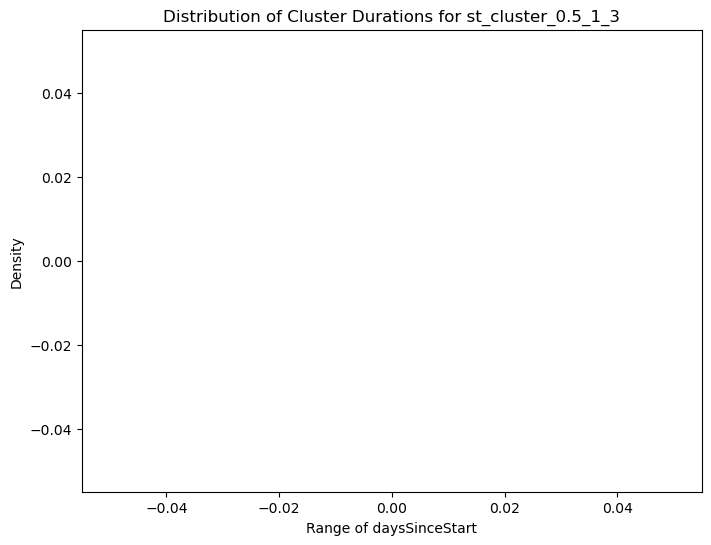

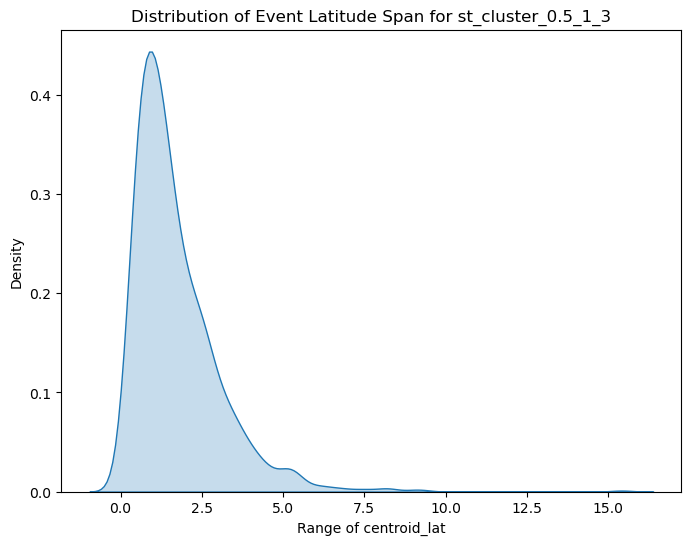

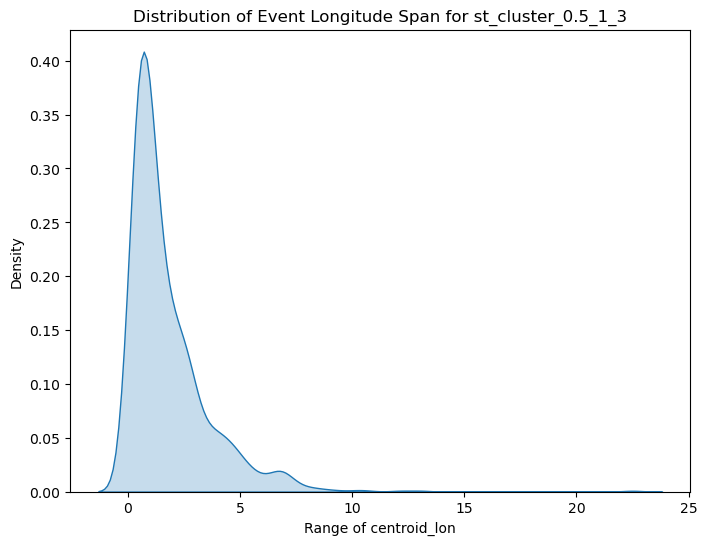


Analyzing st_cluster field: st_cluster_0.5_1_5


/tmp/ipykernel_6754/391820935.py:26: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(cluster_ranges, fill=True)


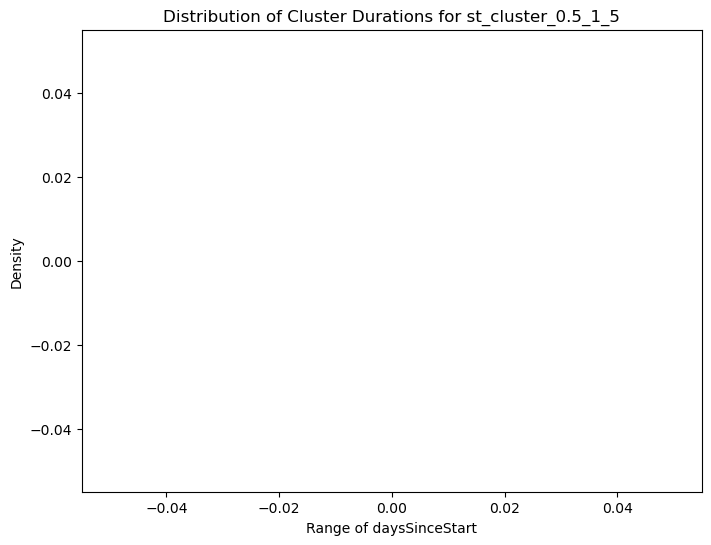

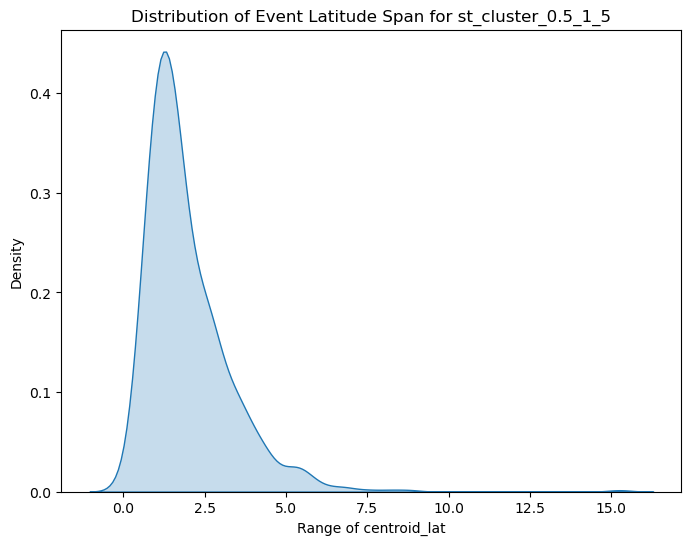

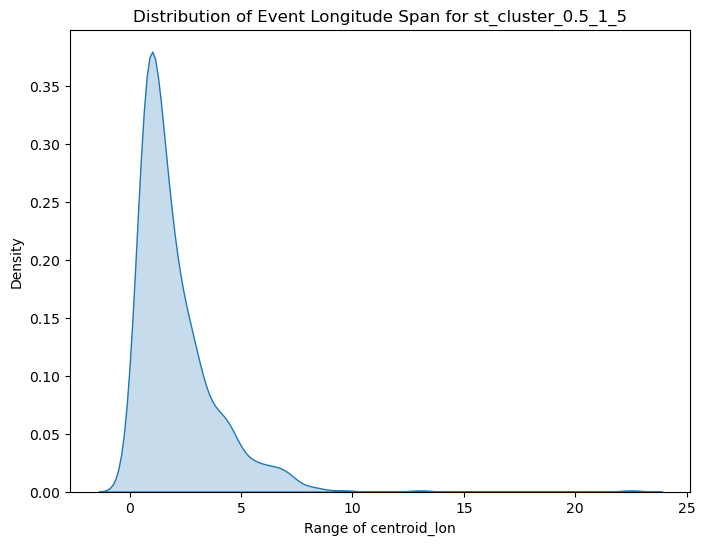


Analyzing st_cluster field: st_cluster_0.5_1_7


/tmp/ipykernel_6754/391820935.py:26: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(cluster_ranges, fill=True)


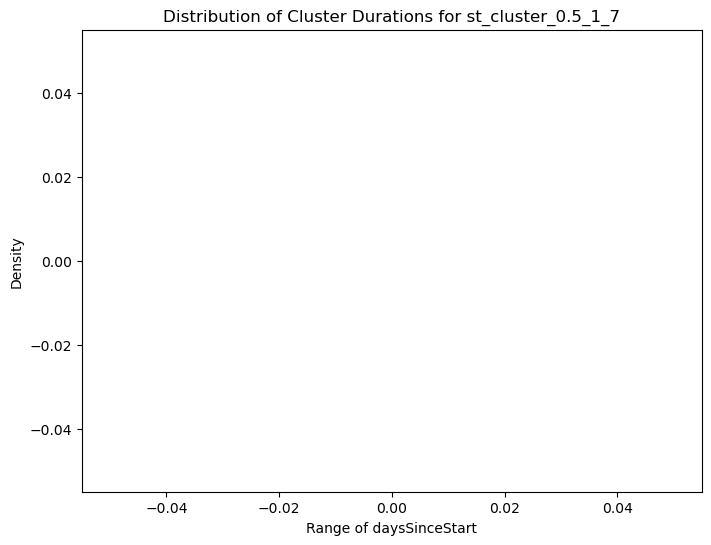

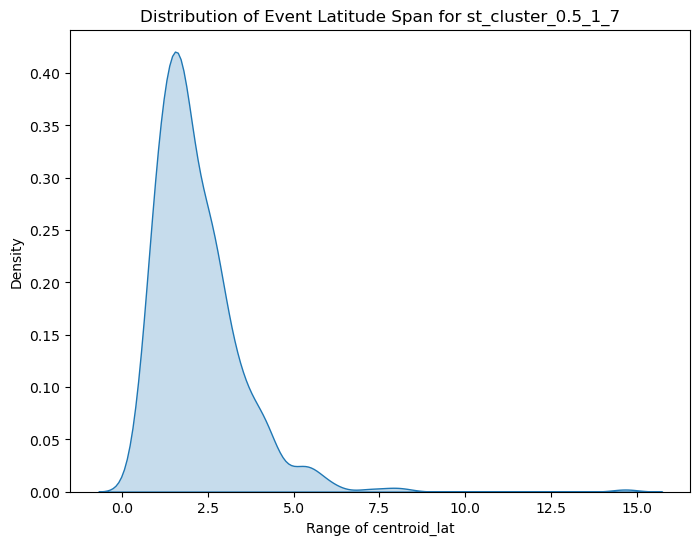

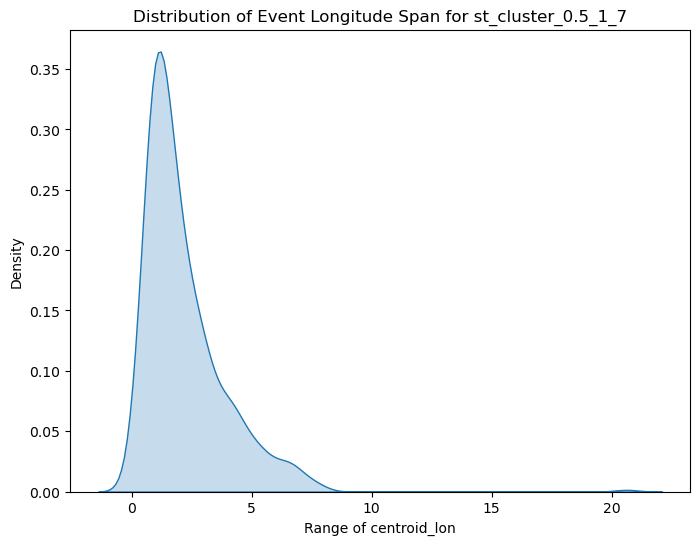


Analyzing st_cluster field: st_cluster_0.5_1_10


/tmp/ipykernel_6754/391820935.py:26: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(cluster_ranges, fill=True)


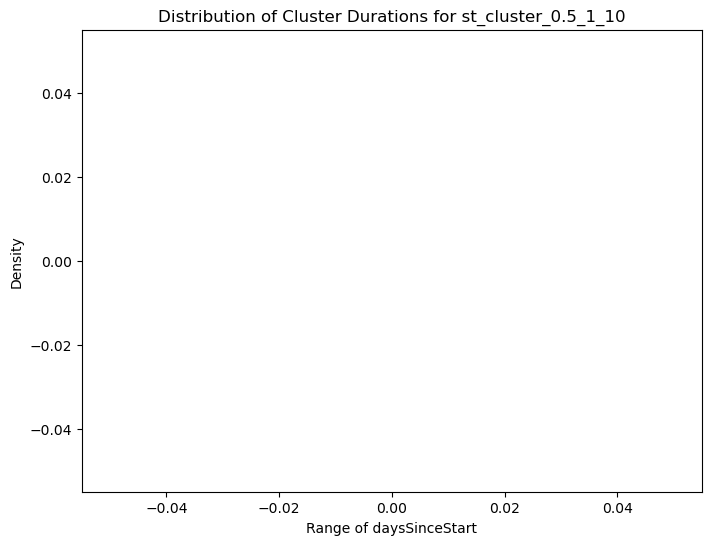

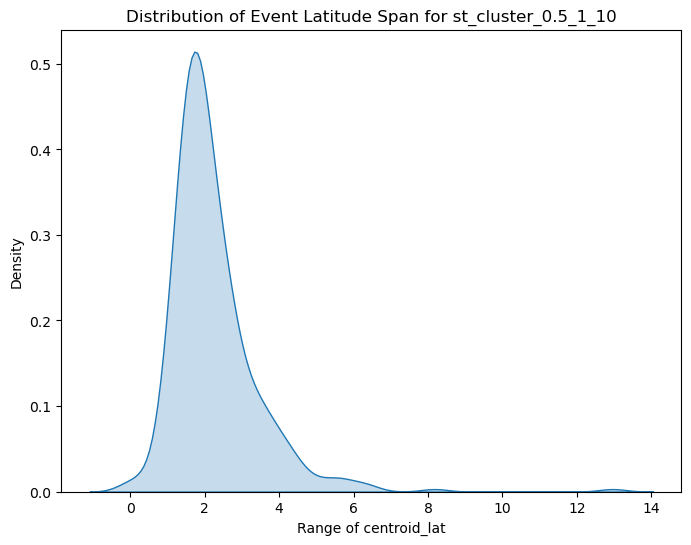

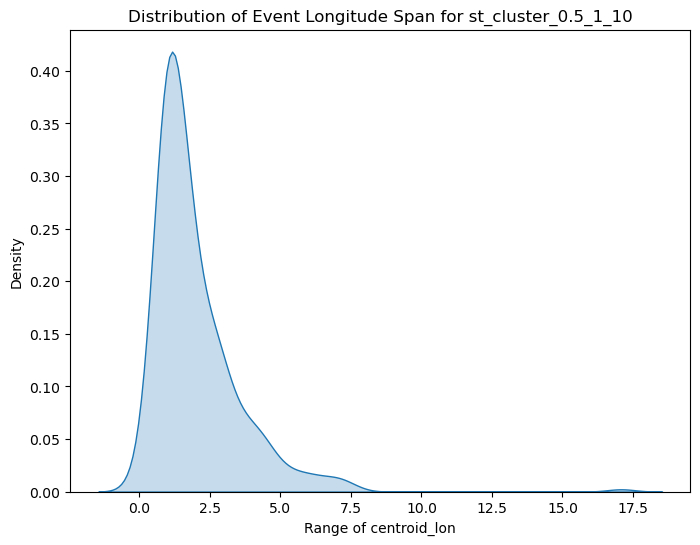


Analyzing st_cluster field: st_cluster_0.5_3_3


/tmp/ipykernel_6754/391820935.py:26: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(cluster_ranges, fill=True)


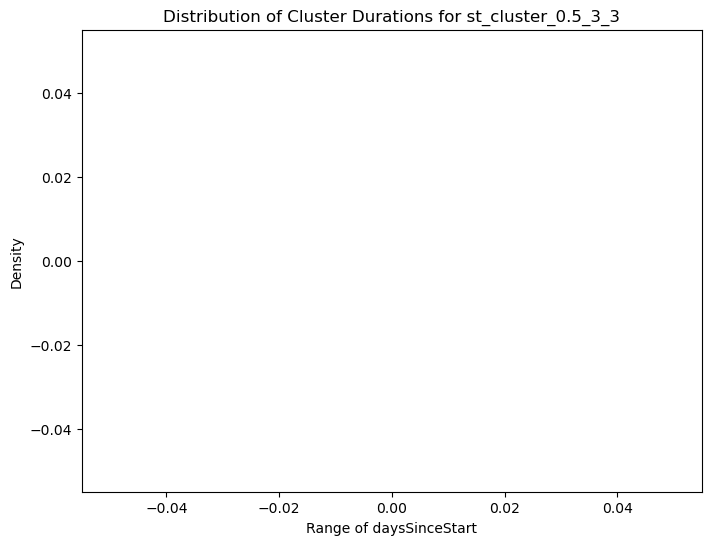

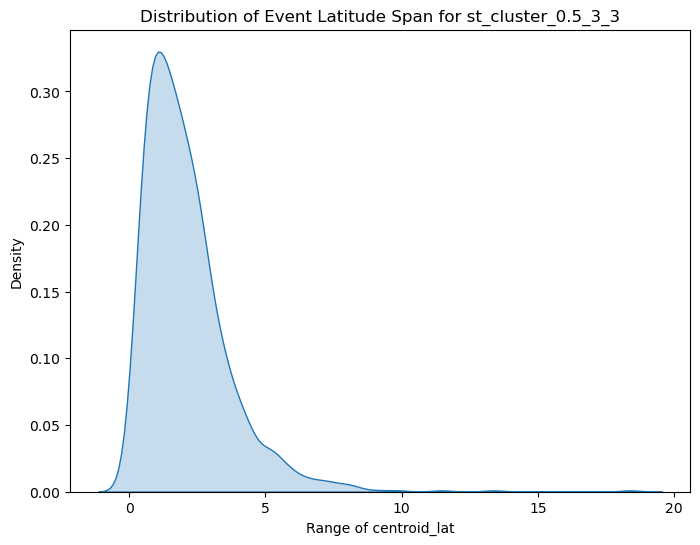

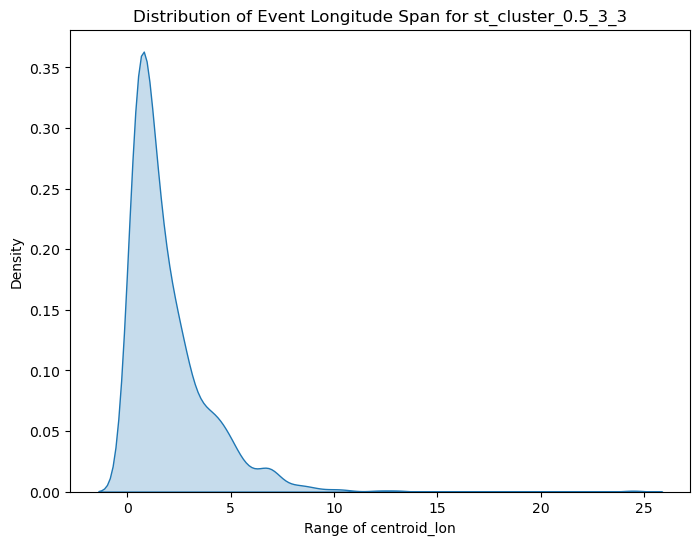


Analyzing st_cluster field: st_cluster_0.5_3_5


/tmp/ipykernel_6754/391820935.py:26: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(cluster_ranges, fill=True)


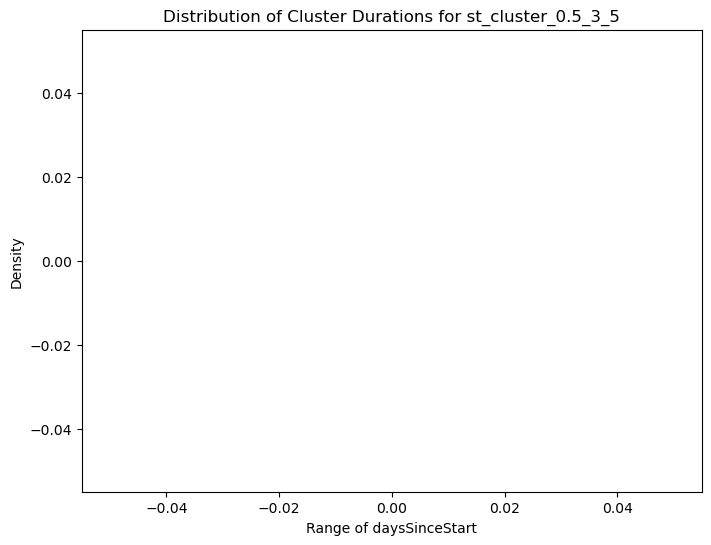

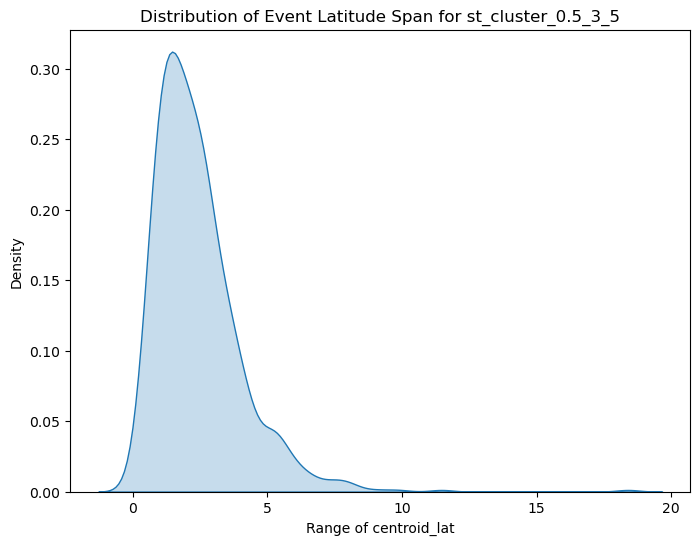

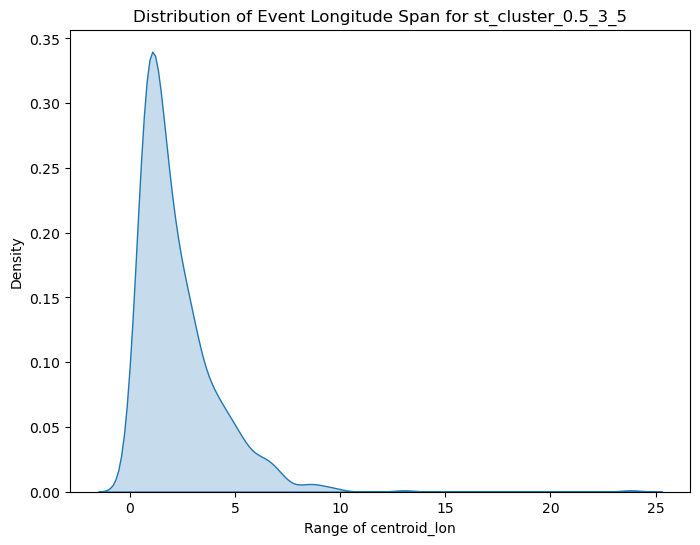


Analyzing st_cluster field: st_cluster_0.5_3_7


/tmp/ipykernel_6754/391820935.py:26: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(cluster_ranges, fill=True)


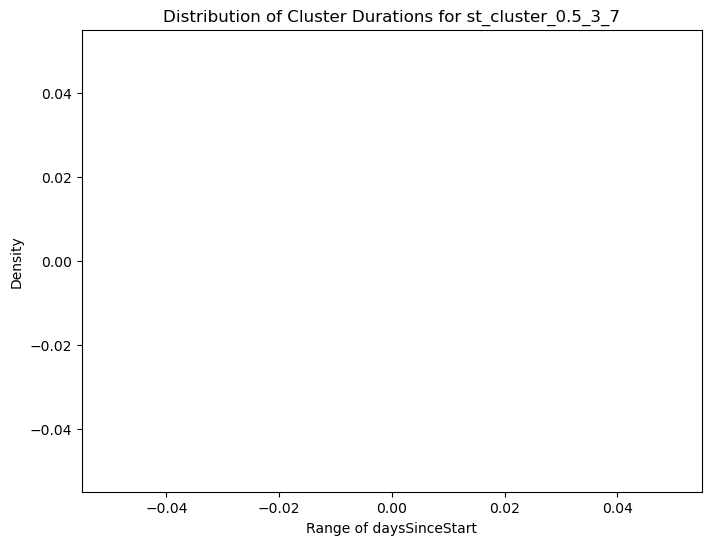

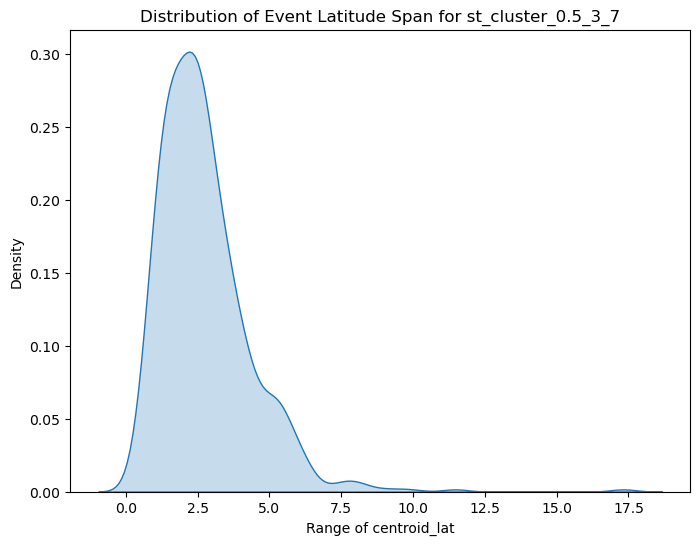

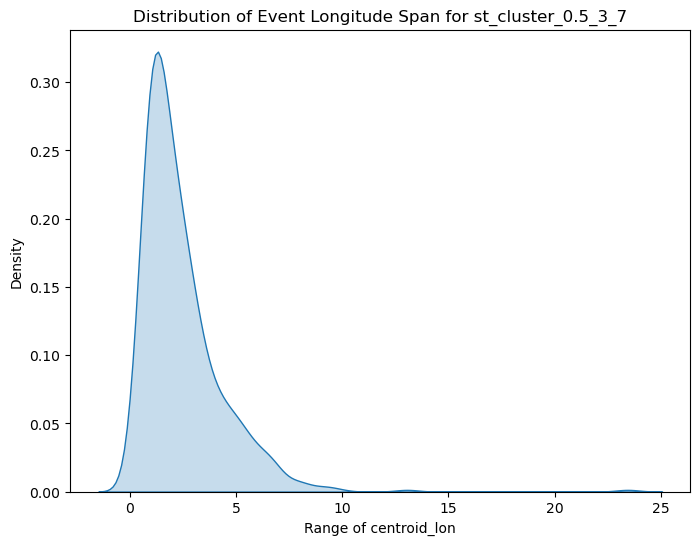


Analyzing st_cluster field: st_cluster_0.5_3_10


/tmp/ipykernel_6754/391820935.py:26: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(cluster_ranges, fill=True)


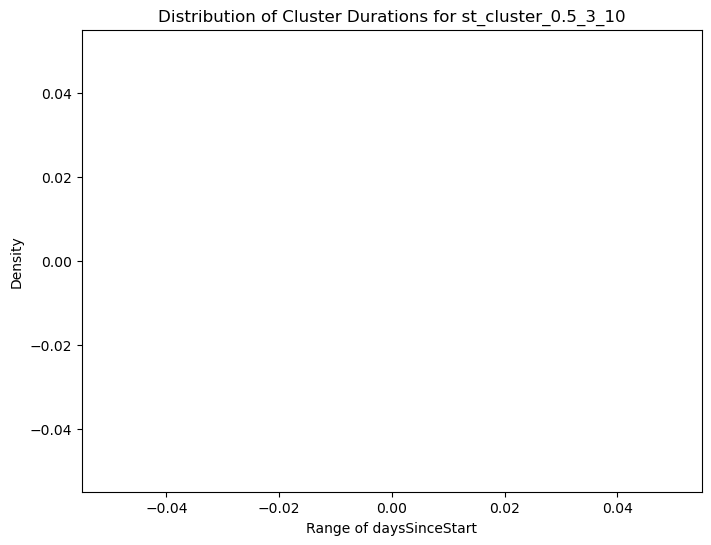

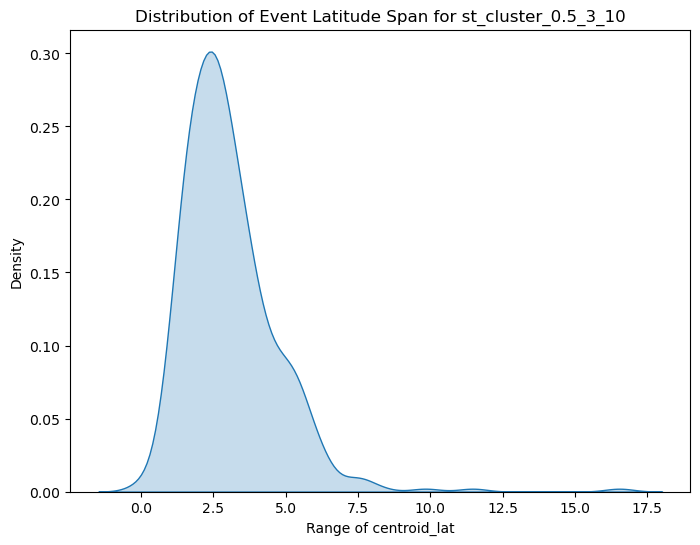

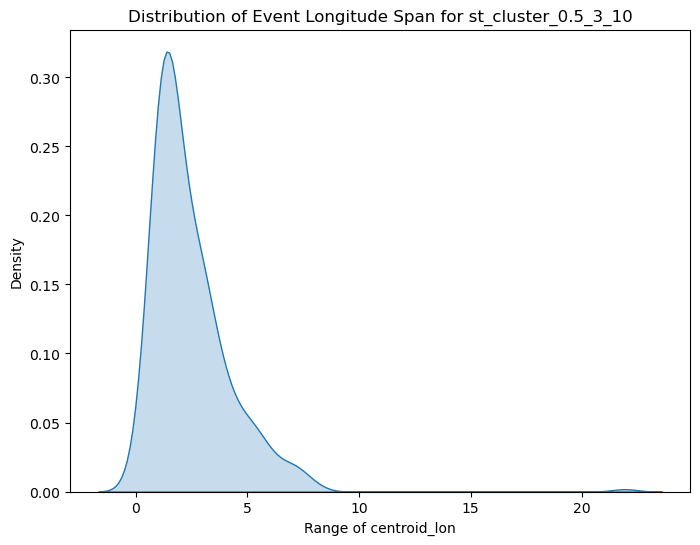


Analyzing st_cluster field: st_cluster_0.5_5_3


/tmp/ipykernel_6754/391820935.py:26: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(cluster_ranges, fill=True)


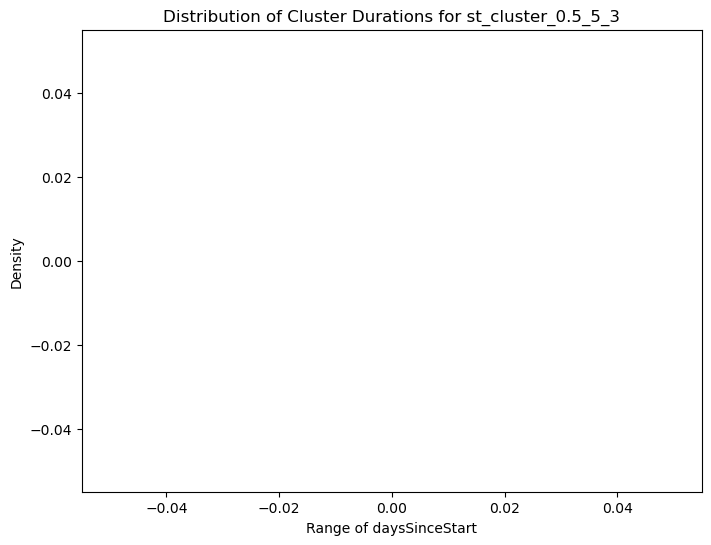

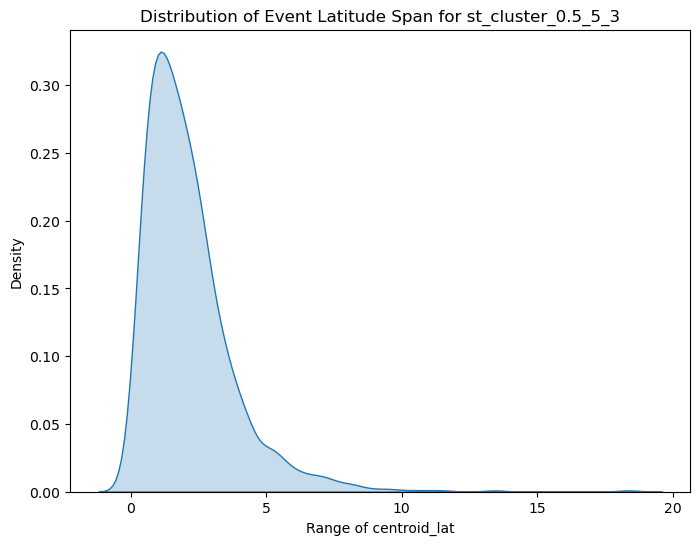

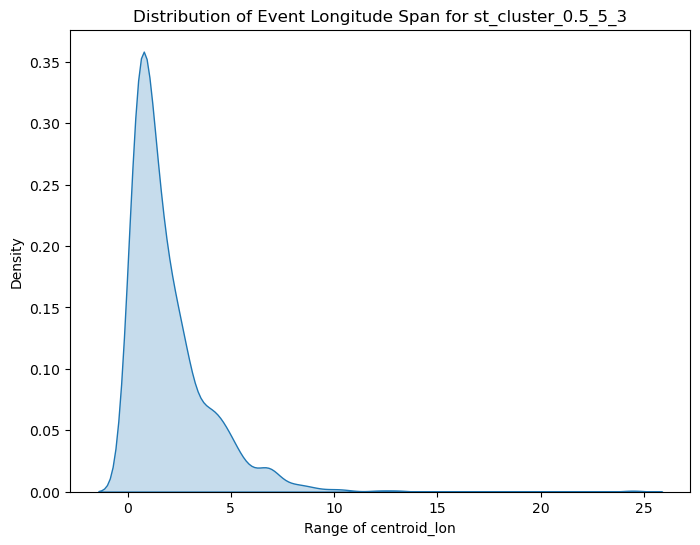


Analyzing st_cluster field: st_cluster_0.5_5_5


/tmp/ipykernel_6754/391820935.py:26: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(cluster_ranges, fill=True)


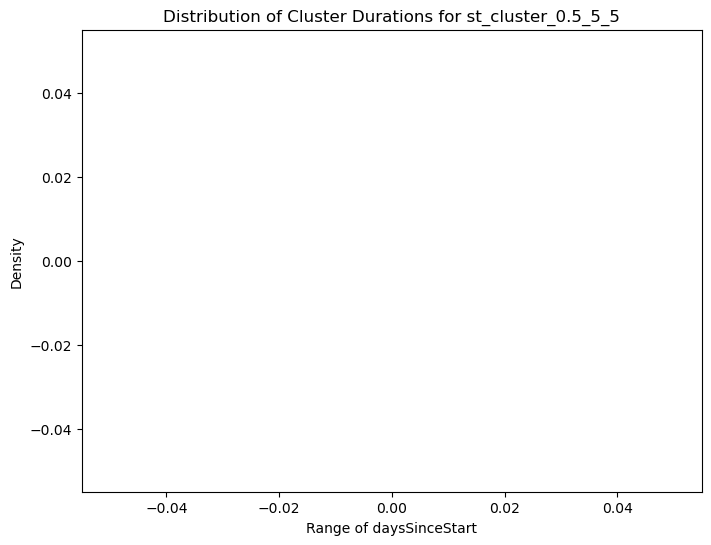

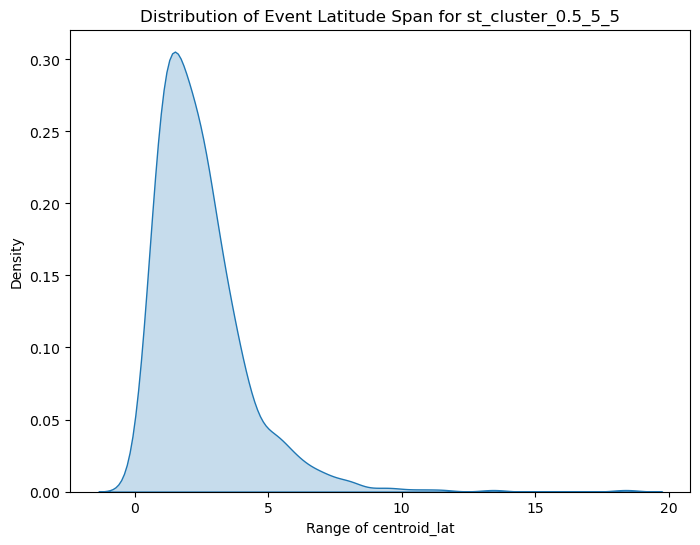

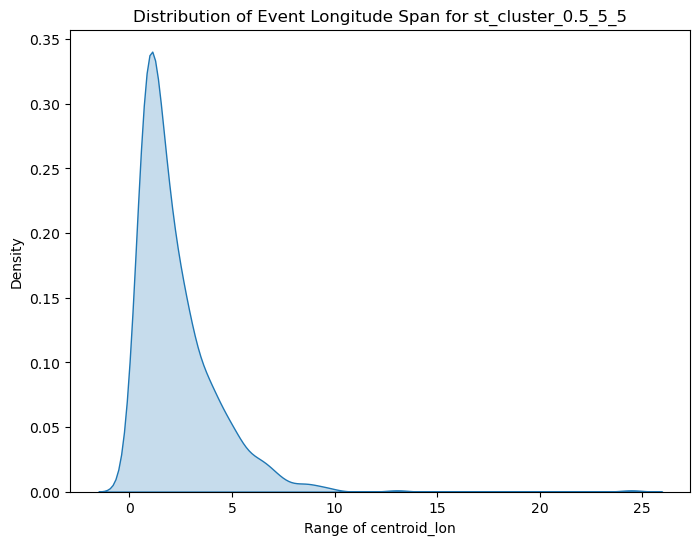


Analyzing st_cluster field: st_cluster_0.5_5_7


/tmp/ipykernel_6754/391820935.py:26: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(cluster_ranges, fill=True)


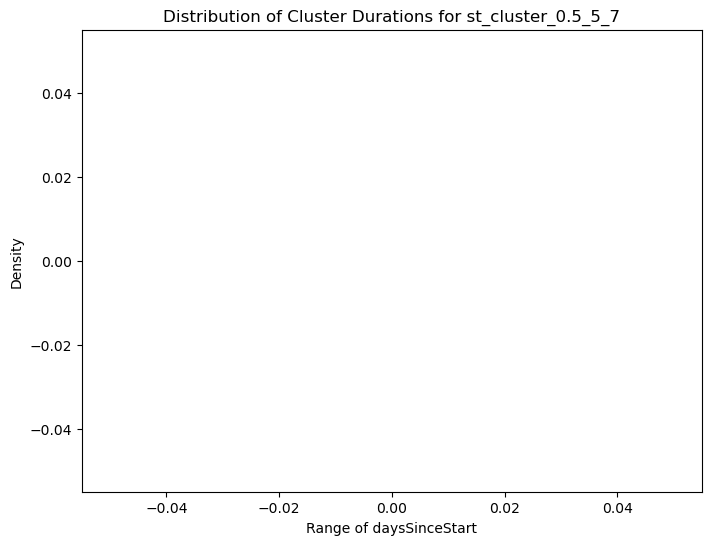

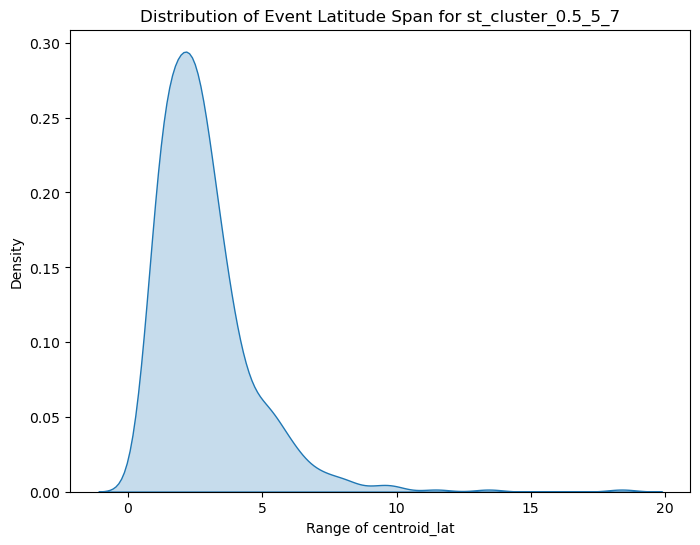

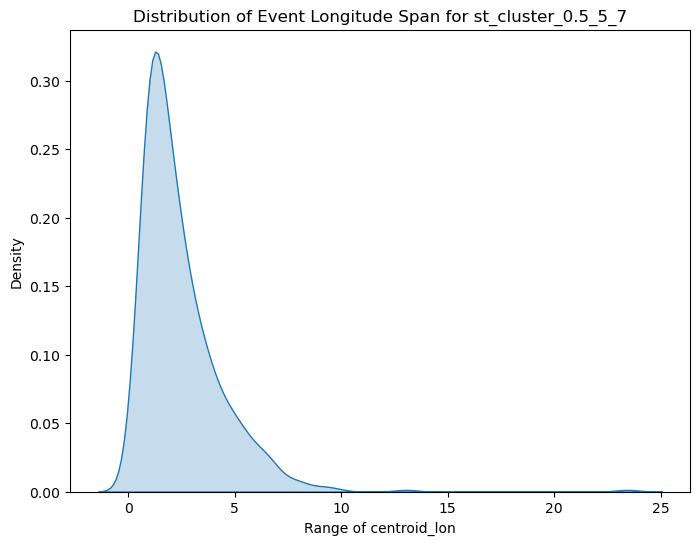


Analyzing st_cluster field: st_cluster_0.5_5_10


/tmp/ipykernel_6754/391820935.py:26: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(cluster_ranges, fill=True)


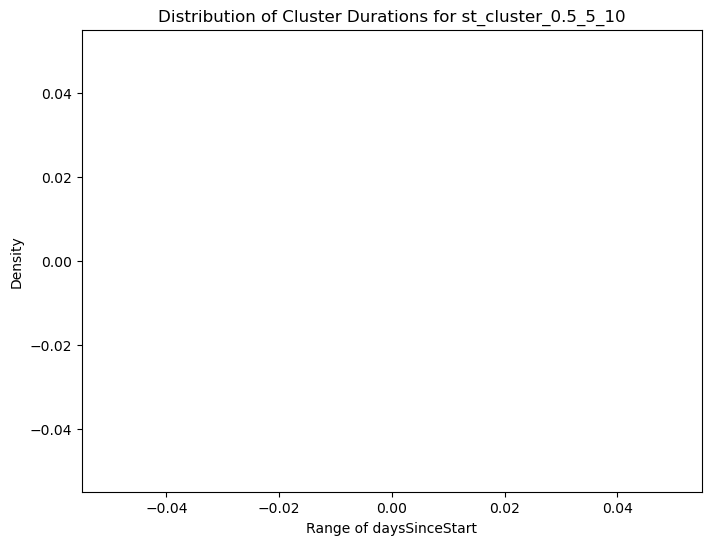

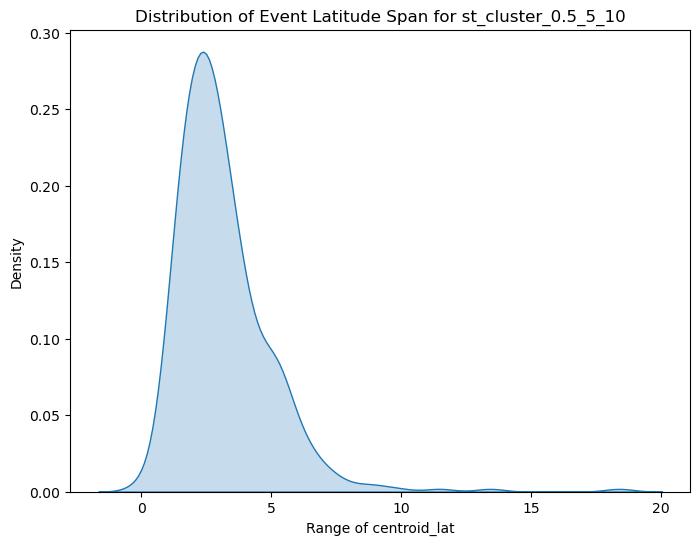

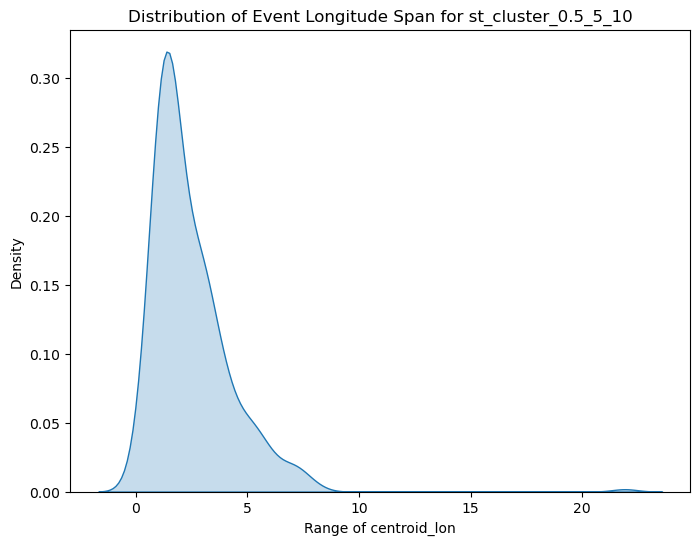


Analyzing st_cluster field: st_cluster_0.5_7_3


/tmp/ipykernel_6754/391820935.py:26: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(cluster_ranges, fill=True)


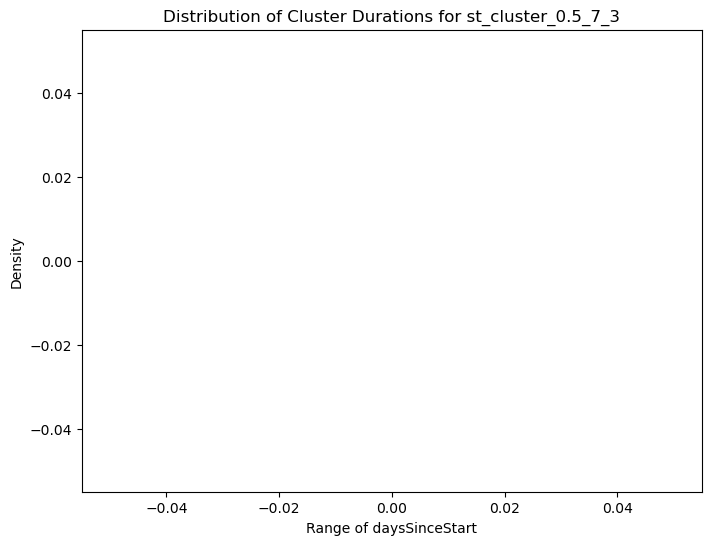

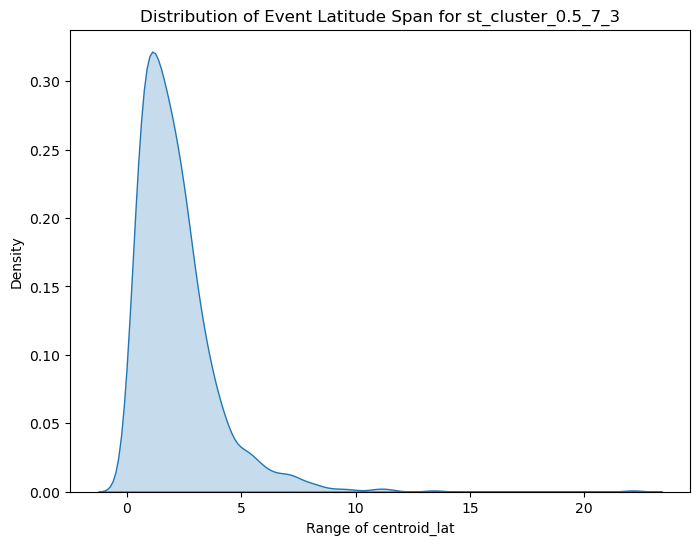

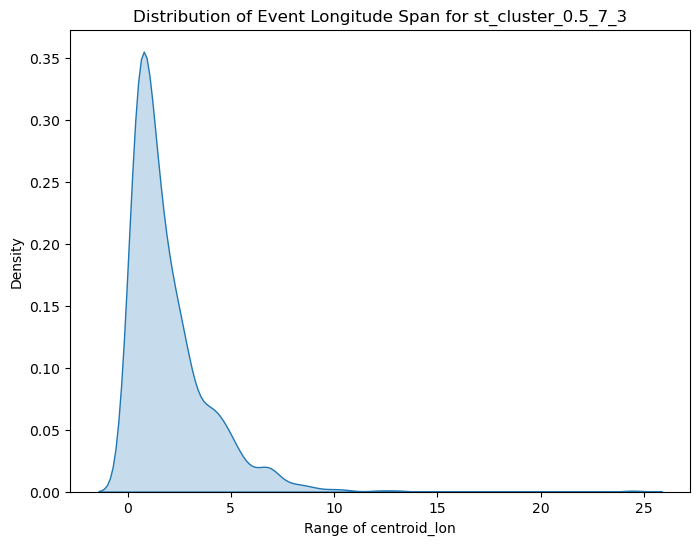


Analyzing st_cluster field: st_cluster_0.5_7_5


/tmp/ipykernel_6754/391820935.py:26: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(cluster_ranges, fill=True)


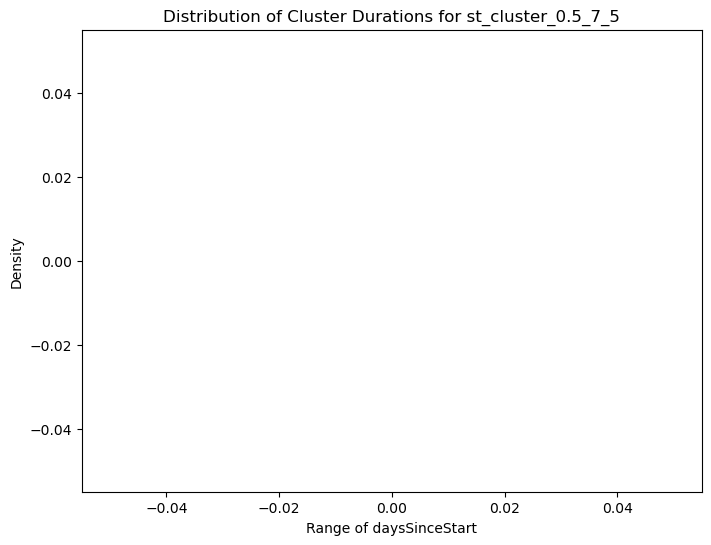

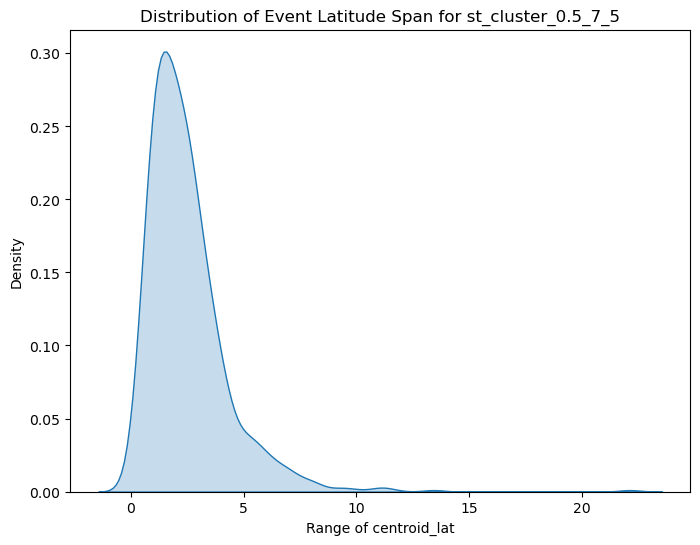

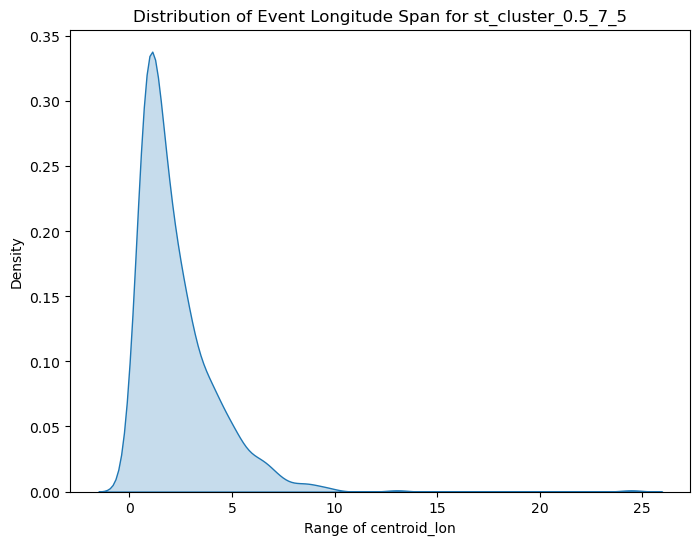


Analyzing st_cluster field: st_cluster_0.5_7_7


/tmp/ipykernel_6754/391820935.py:26: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(cluster_ranges, fill=True)


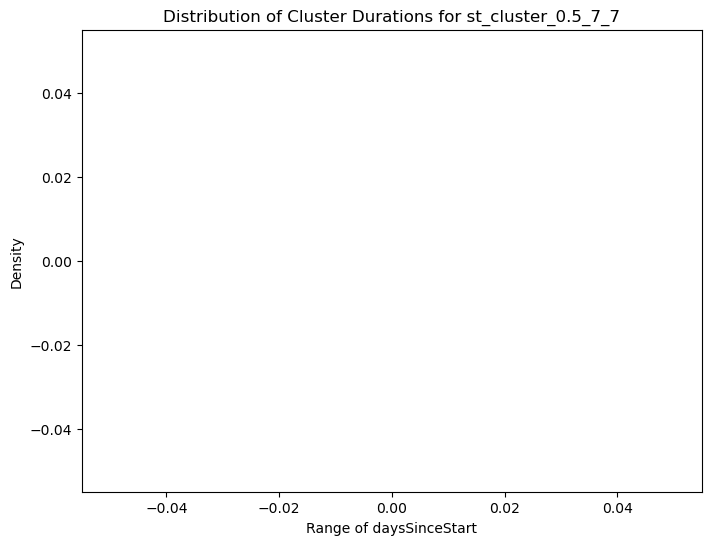

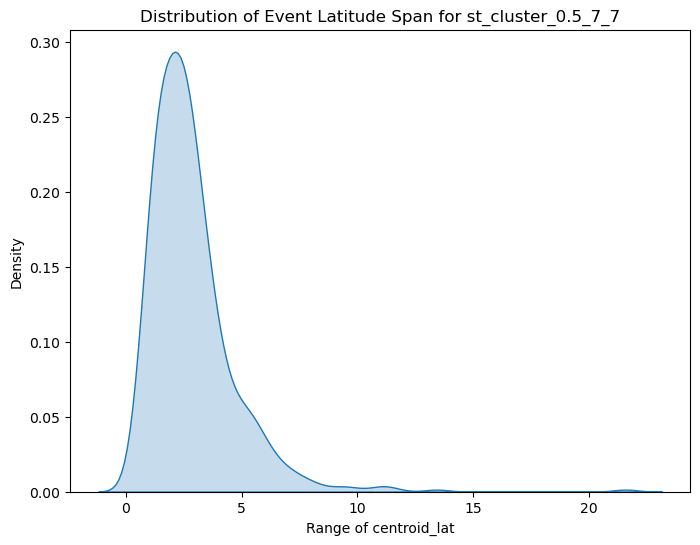

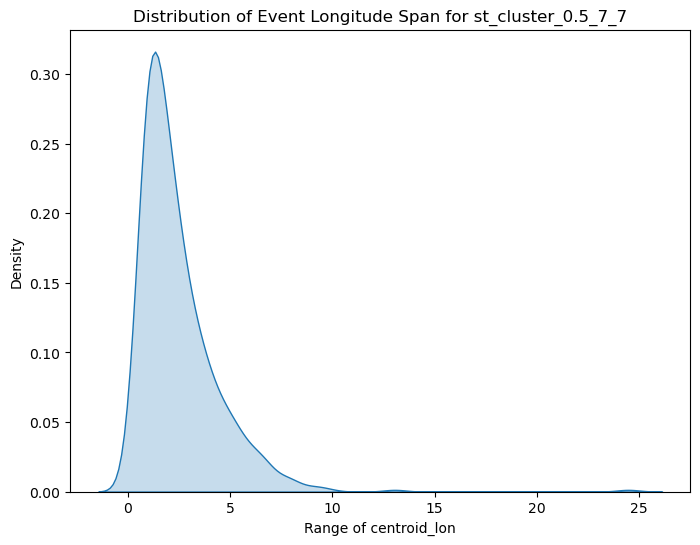


Analyzing st_cluster field: st_cluster_0.5_7_10


/tmp/ipykernel_6754/391820935.py:26: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(cluster_ranges, fill=True)


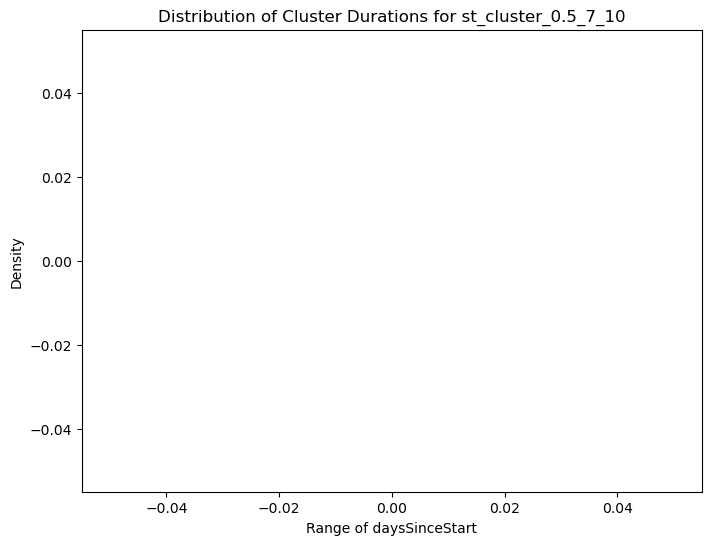

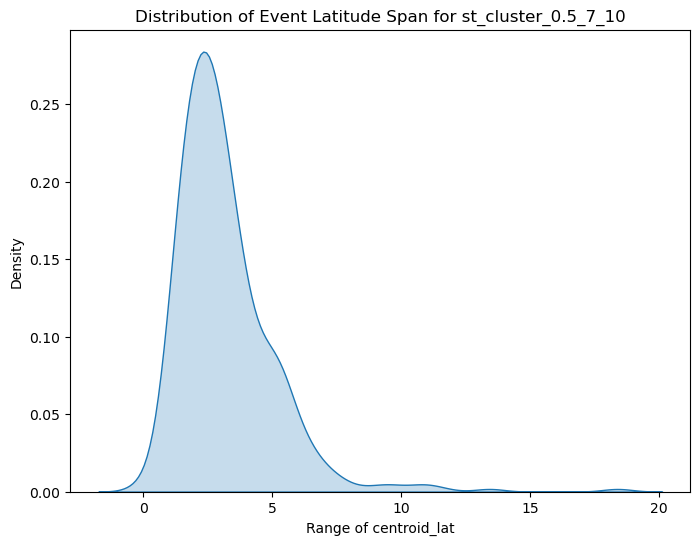

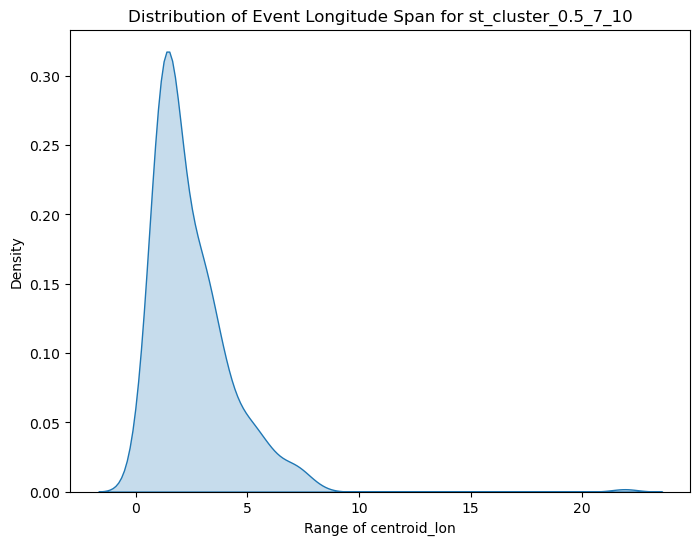


Analyzing st_cluster field: st_cluster_0.5_14_3


/tmp/ipykernel_6754/391820935.py:26: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(cluster_ranges, fill=True)


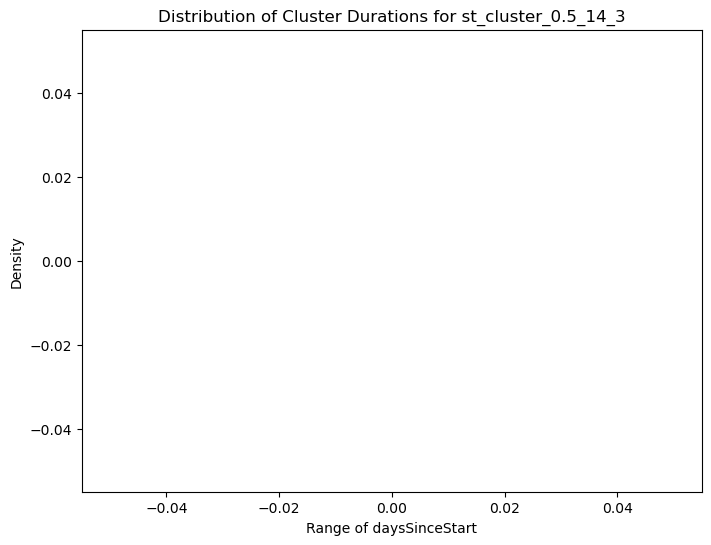

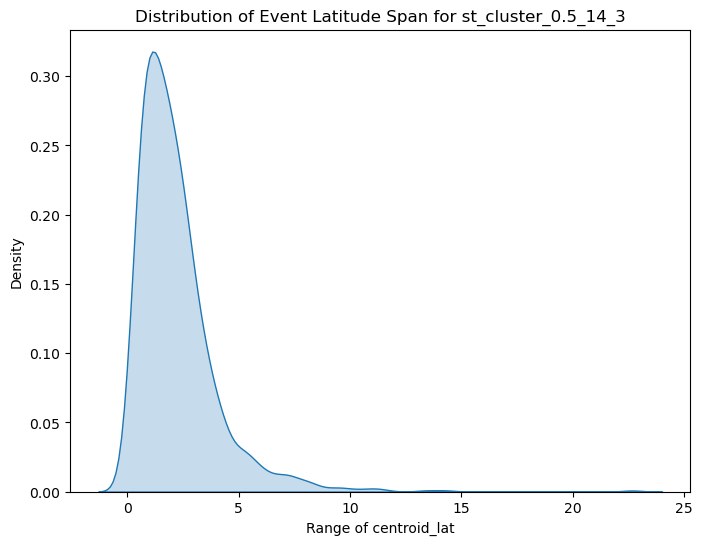

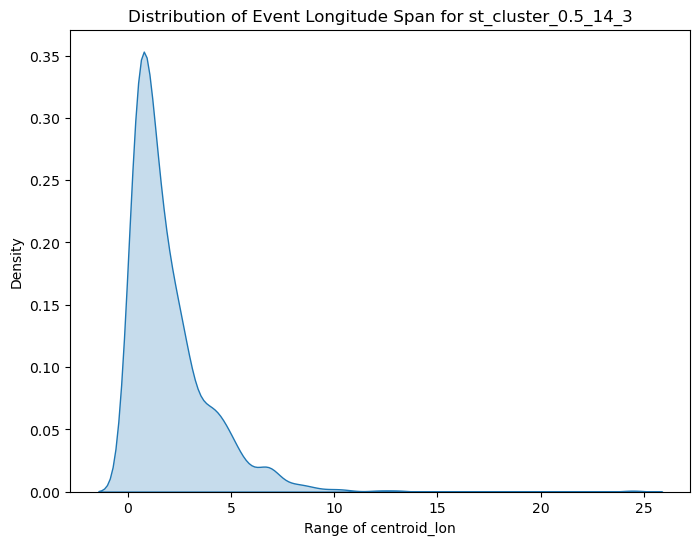


Analyzing st_cluster field: st_cluster_0.5_14_5


/tmp/ipykernel_6754/391820935.py:26: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(cluster_ranges, fill=True)


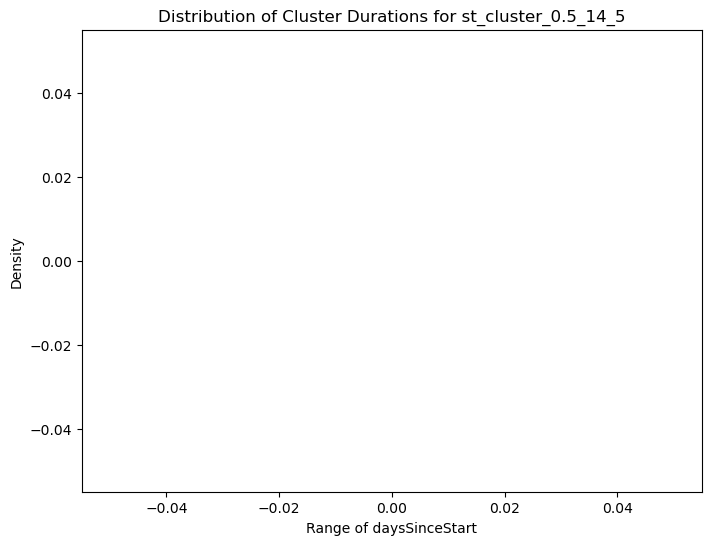

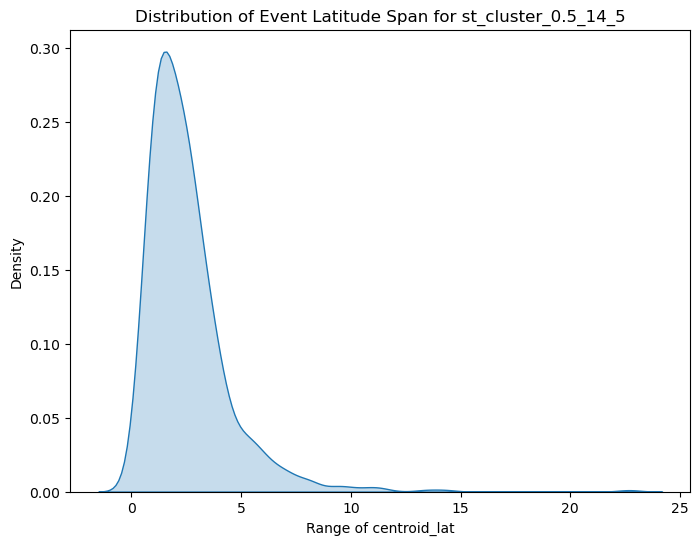

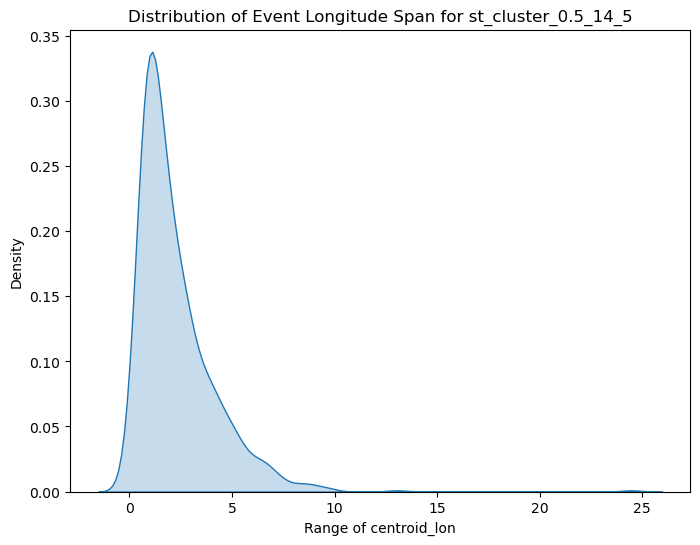


Analyzing st_cluster field: st_cluster_0.5_14_7


/tmp/ipykernel_6754/391820935.py:26: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(cluster_ranges, fill=True)


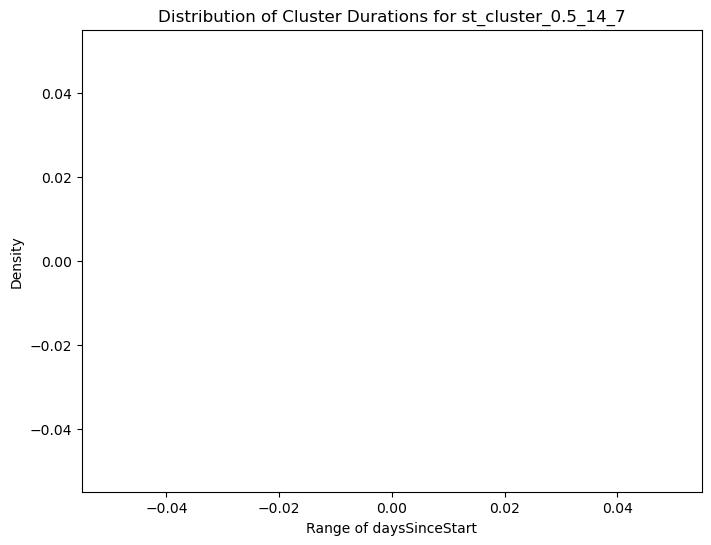

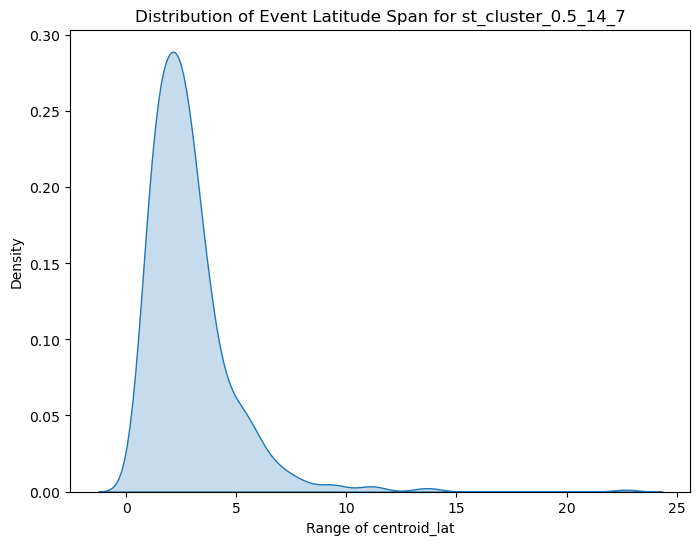

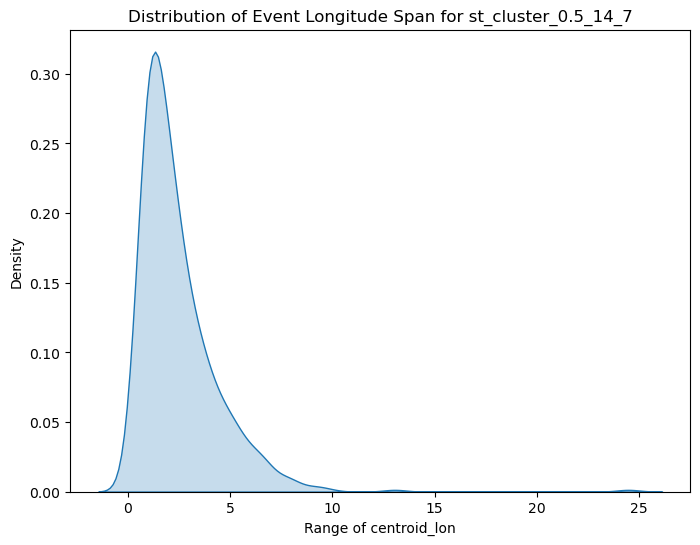


Analyzing st_cluster field: st_cluster_0.5_14_10


/tmp/ipykernel_6754/391820935.py:26: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(cluster_ranges, fill=True)


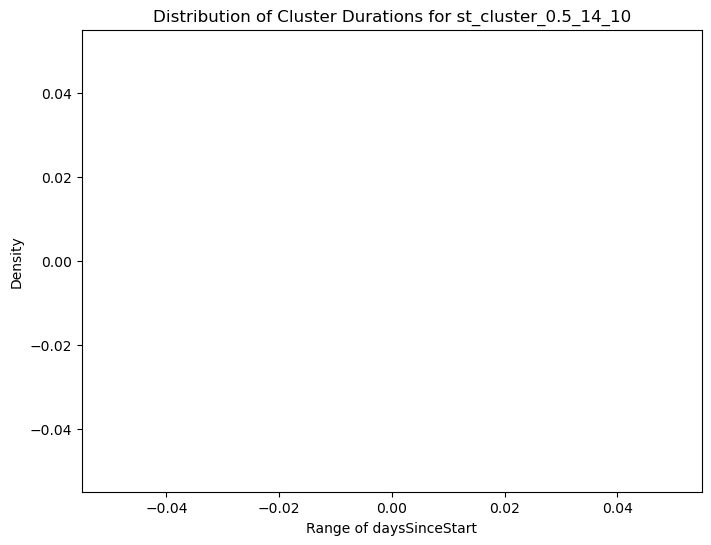

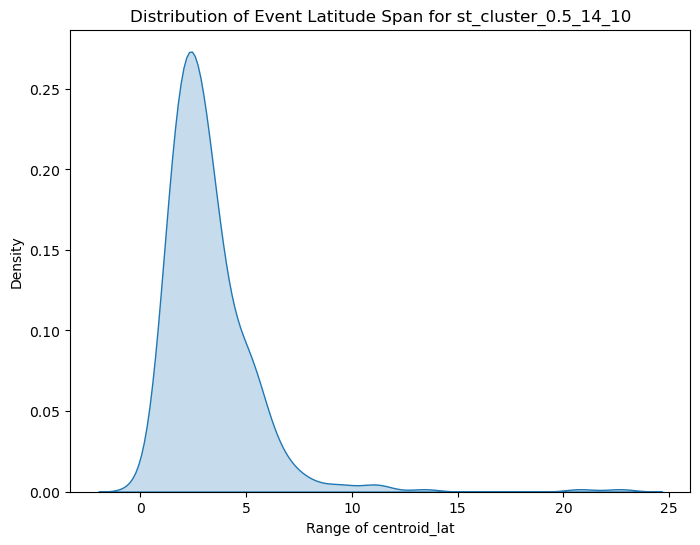

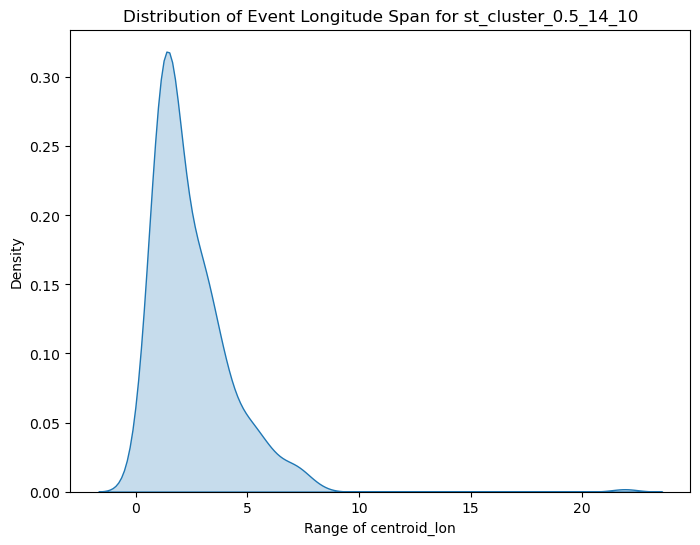


Analyzing st_cluster field: st_cluster_0.5_30_3


/tmp/ipykernel_6754/391820935.py:26: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(cluster_ranges, fill=True)


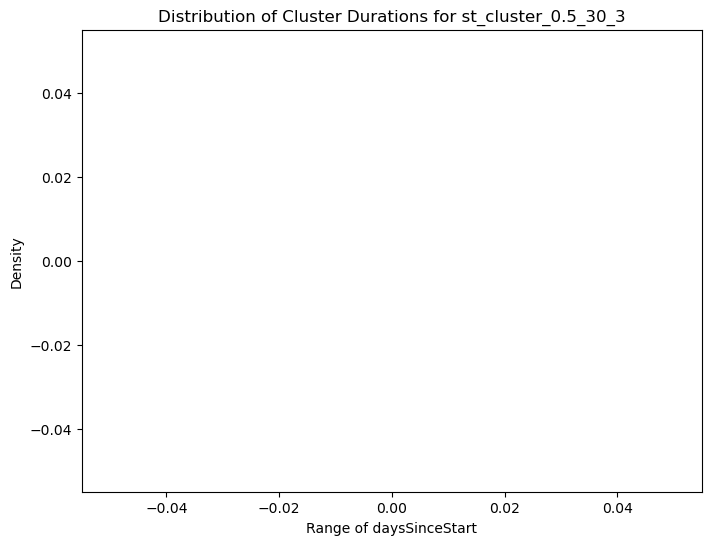

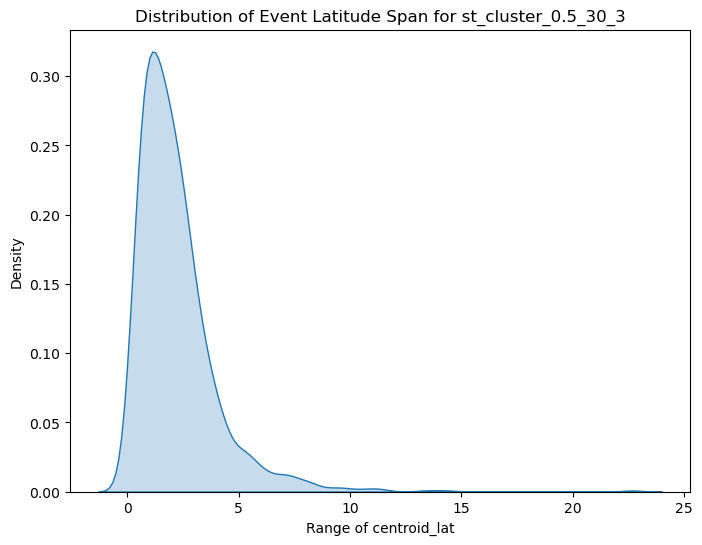

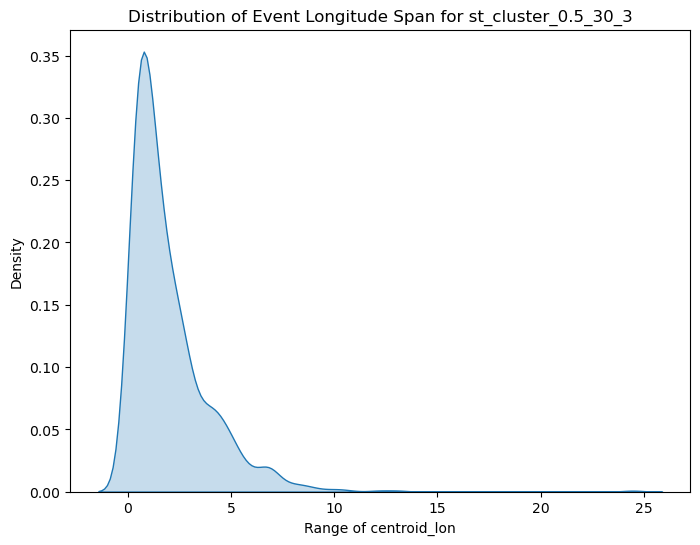


Analyzing st_cluster field: st_cluster_0.5_30_5


/tmp/ipykernel_6754/391820935.py:26: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(cluster_ranges, fill=True)


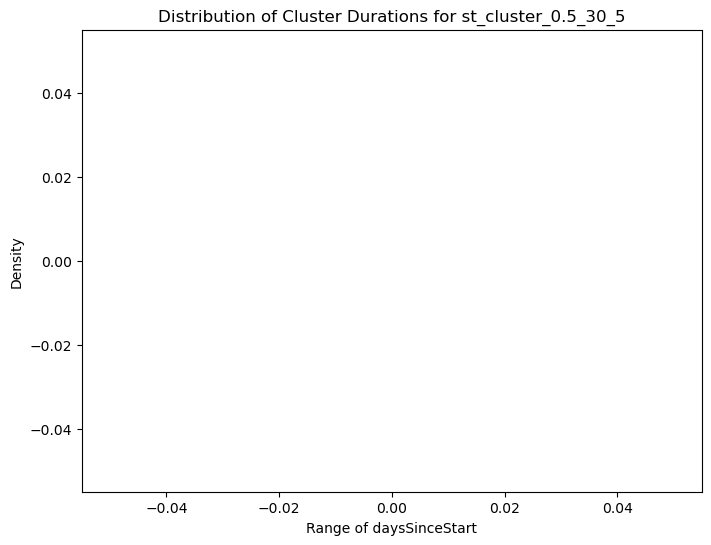

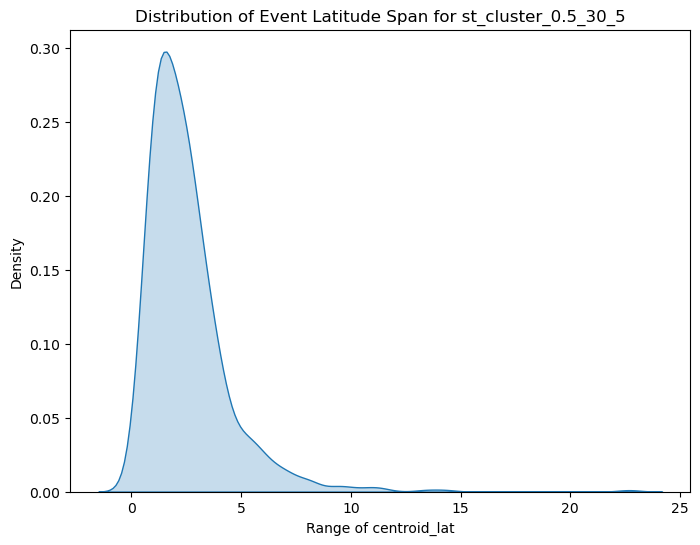

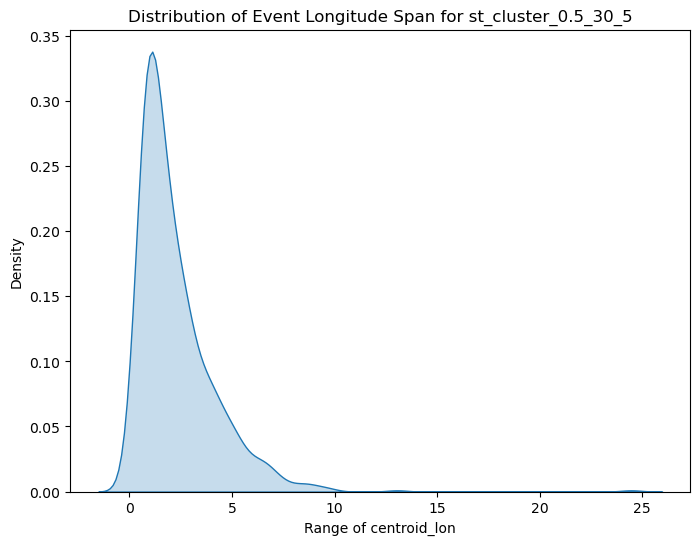


Analyzing st_cluster field: st_cluster_0.5_30_7


/tmp/ipykernel_6754/391820935.py:26: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(cluster_ranges, fill=True)


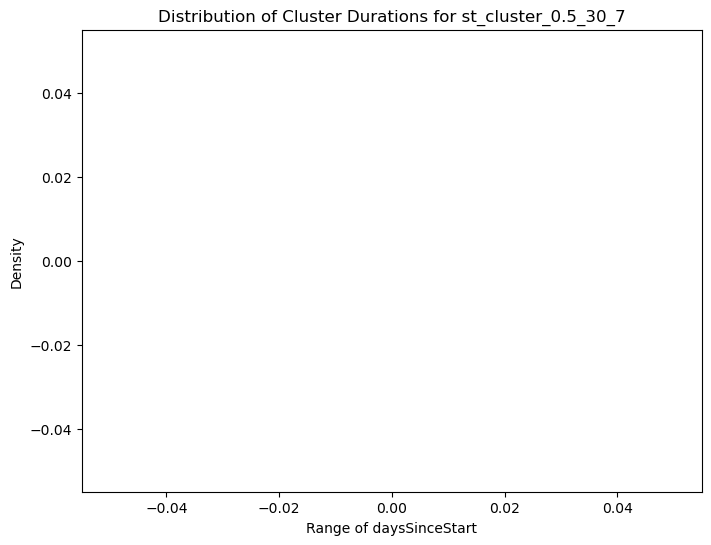

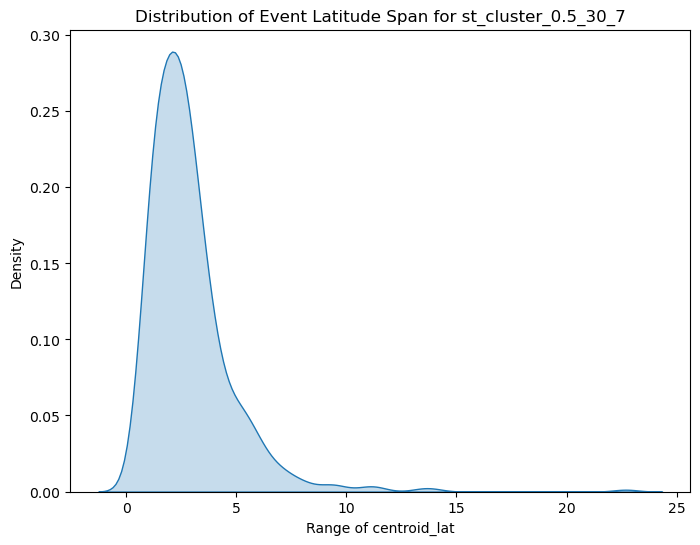

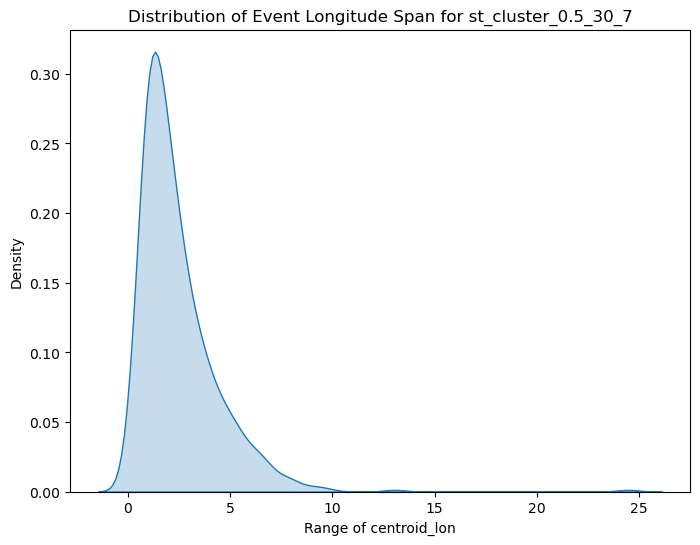


Analyzing st_cluster field: st_cluster_0.5_30_10


/tmp/ipykernel_6754/391820935.py:26: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(cluster_ranges, fill=True)


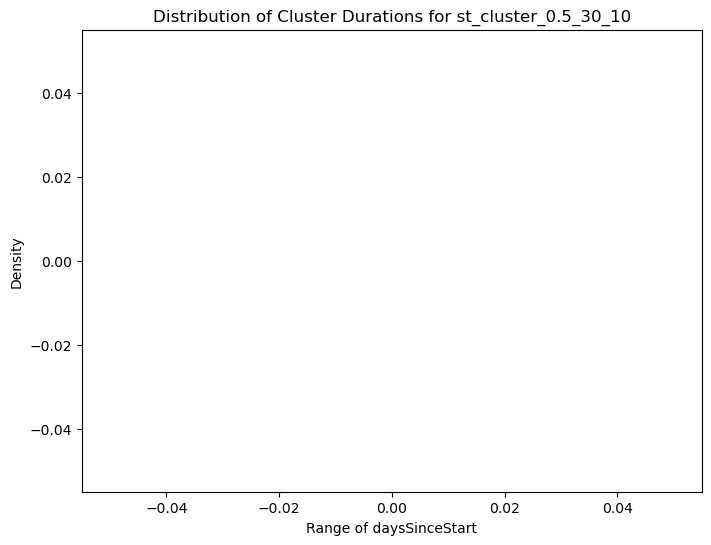

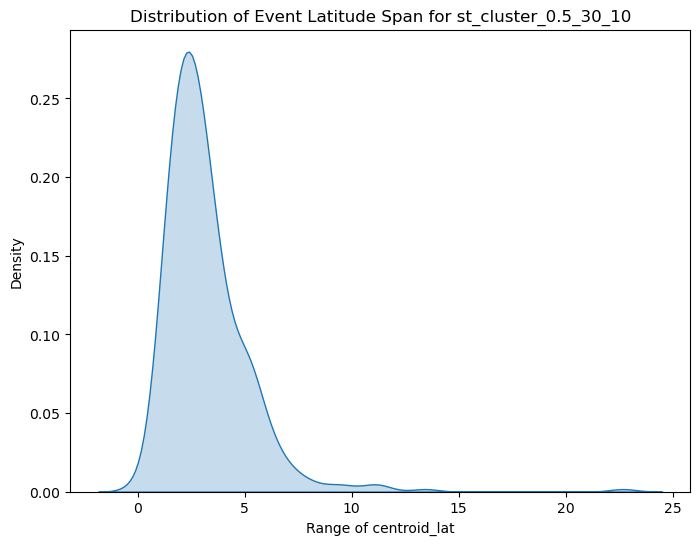

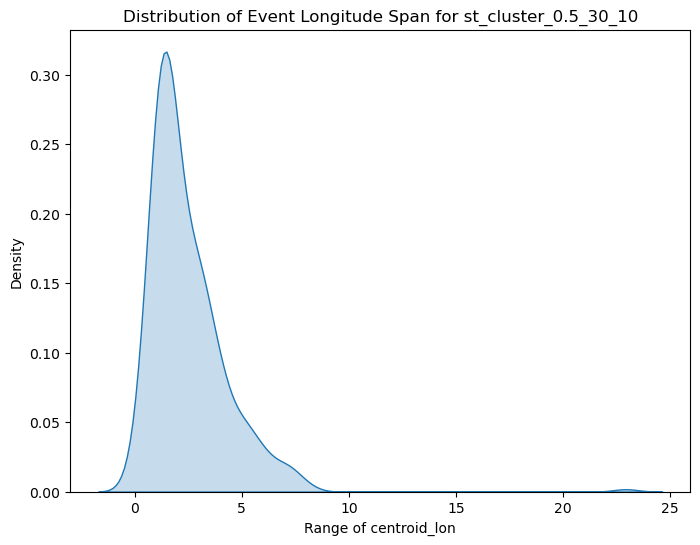


Analyzing st_cluster field: st_cluster_1_1_3


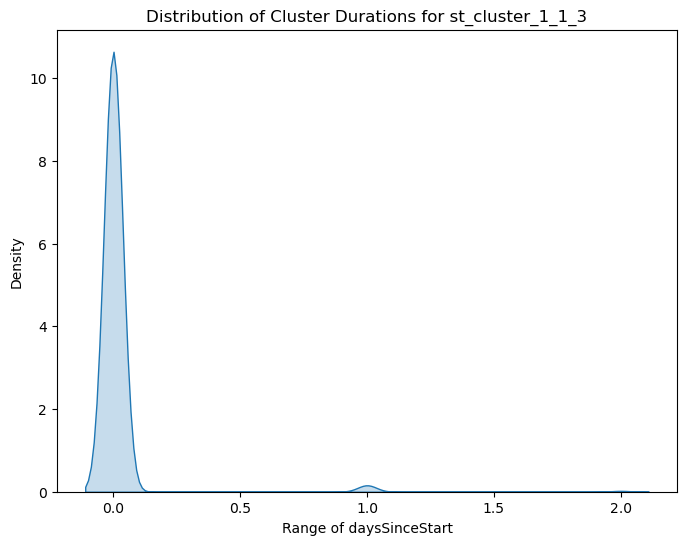

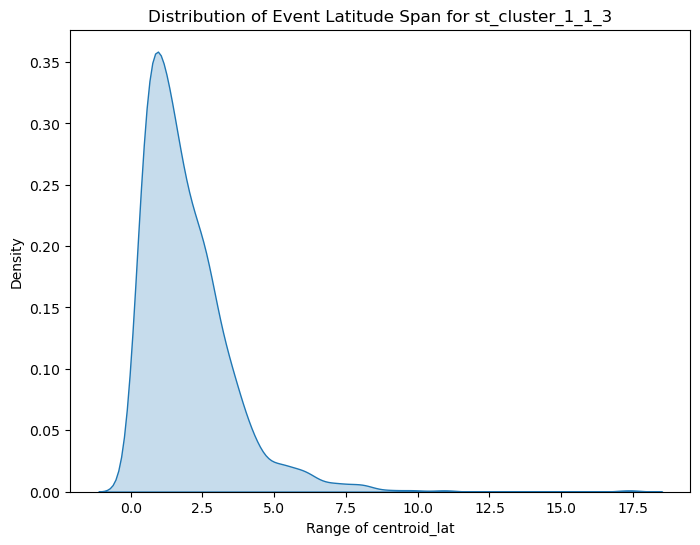

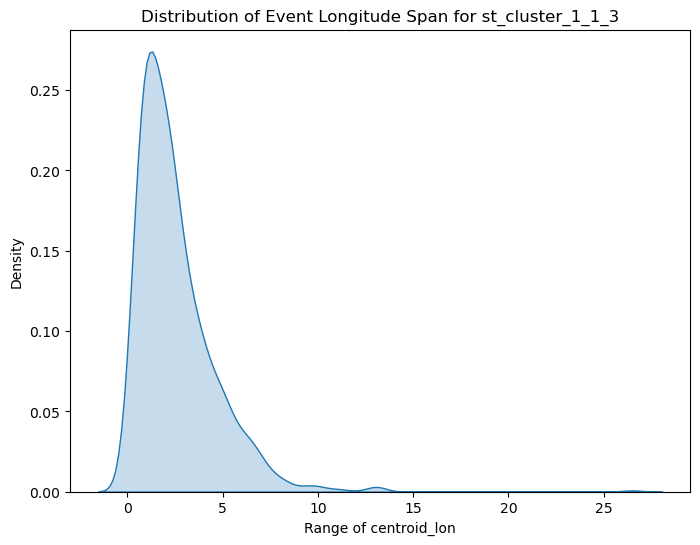


Analyzing st_cluster field: st_cluster_1_1_5


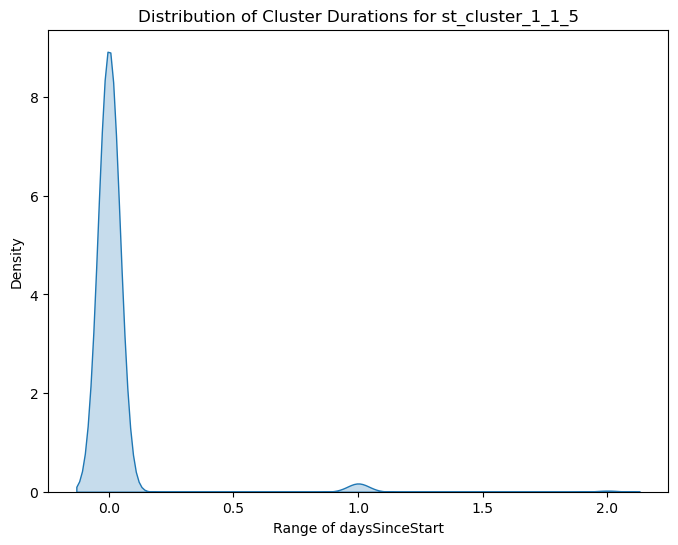

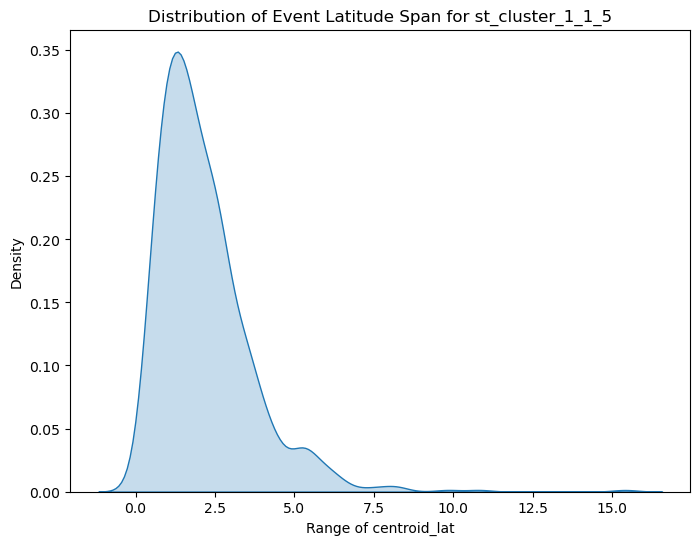

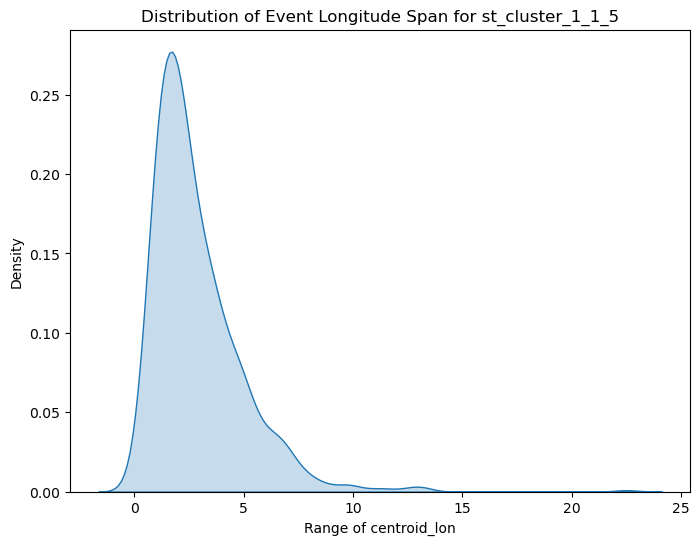


Analyzing st_cluster field: st_cluster_1_1_7


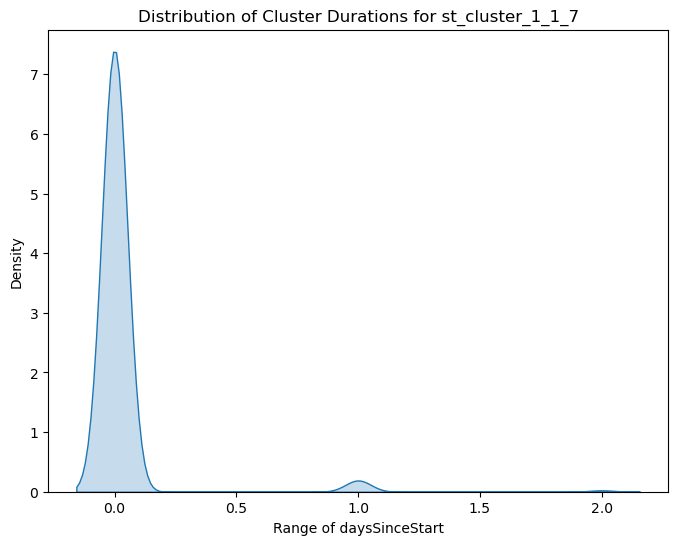

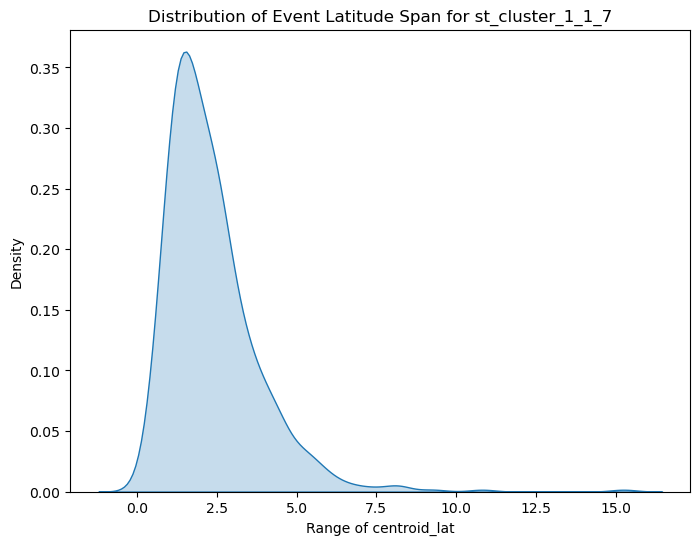

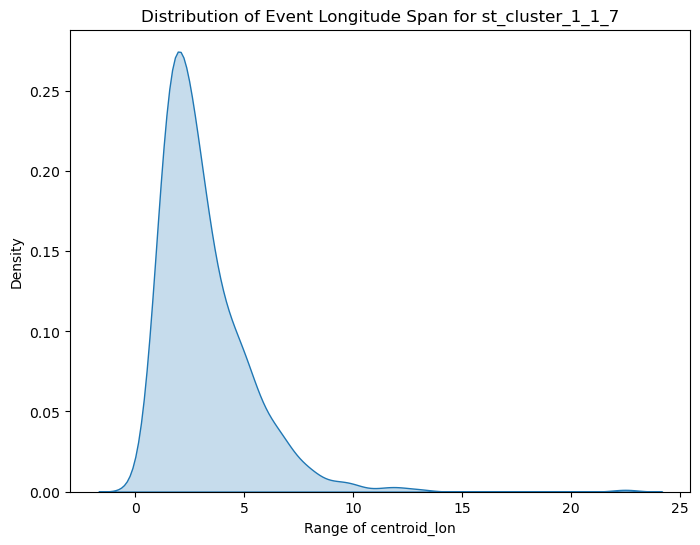


Analyzing st_cluster field: st_cluster_1_1_10


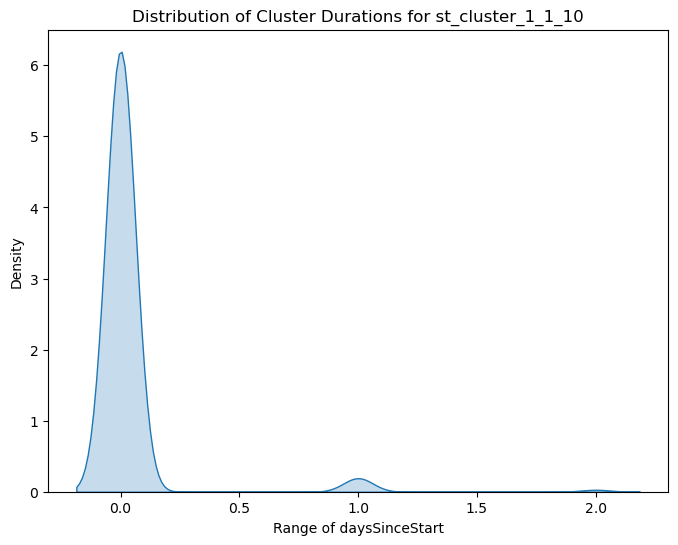

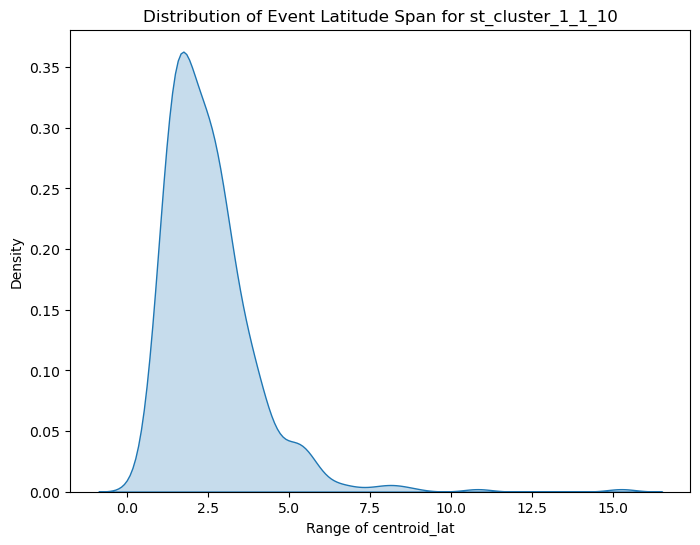

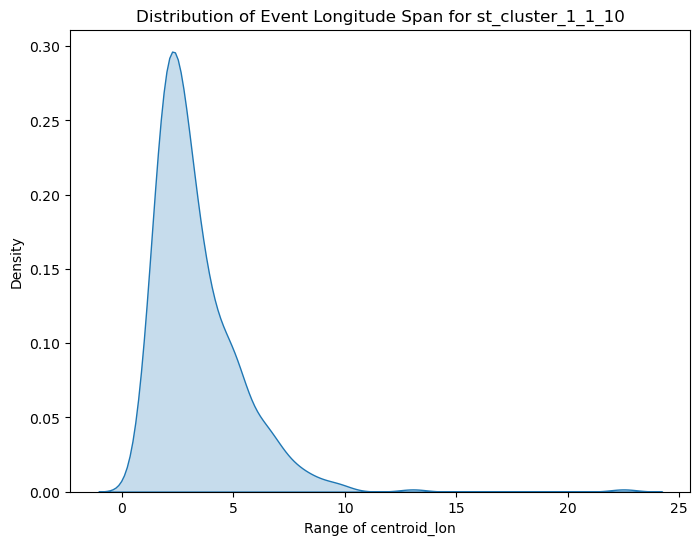


Analyzing st_cluster field: st_cluster_1_3_3


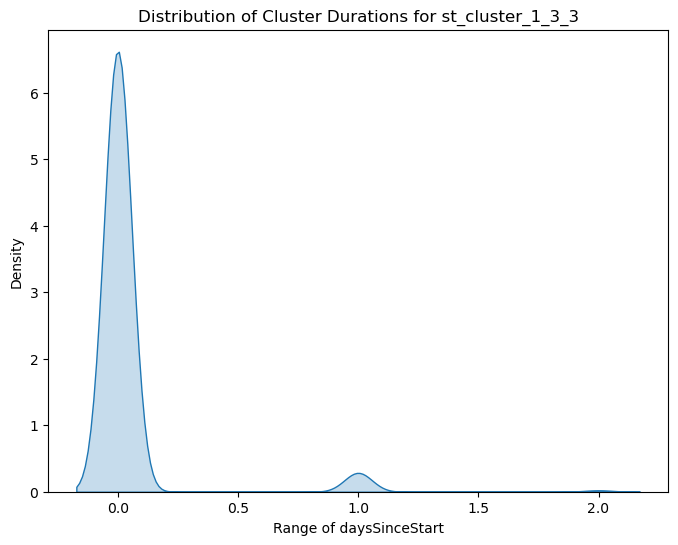

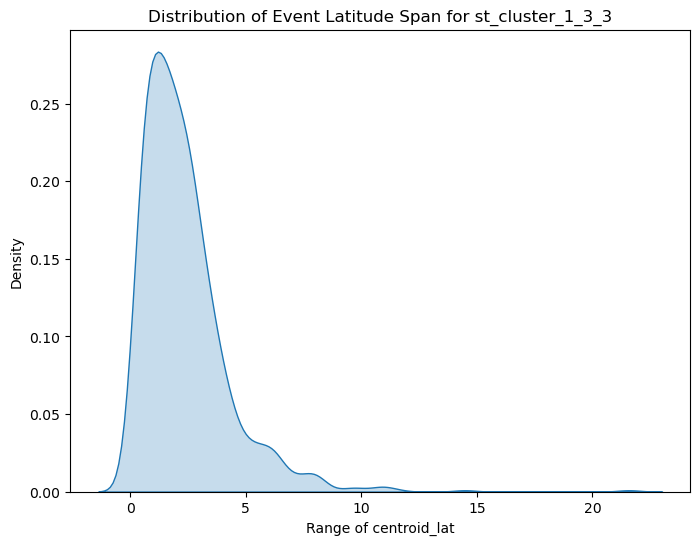

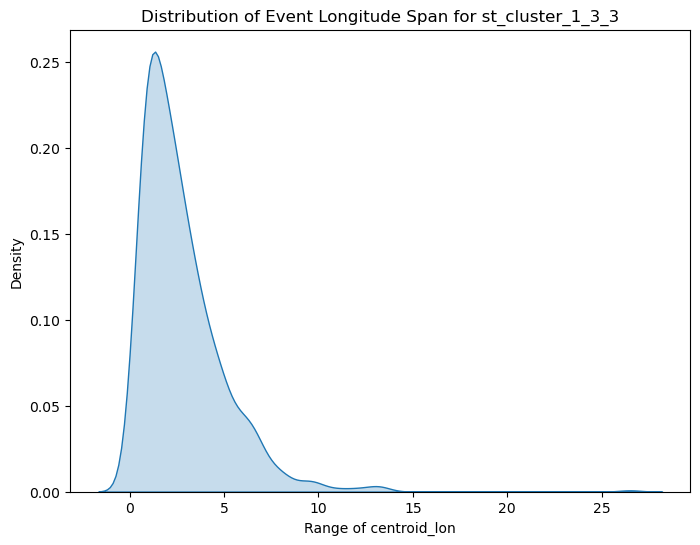


Analyzing st_cluster field: st_cluster_1_3_5


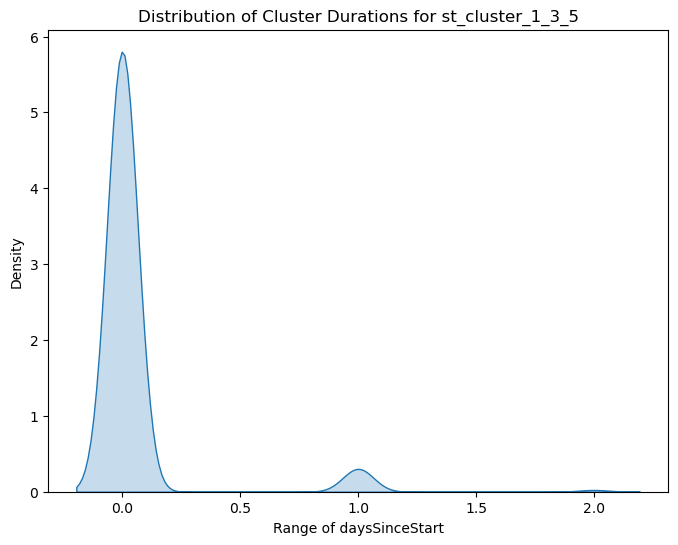

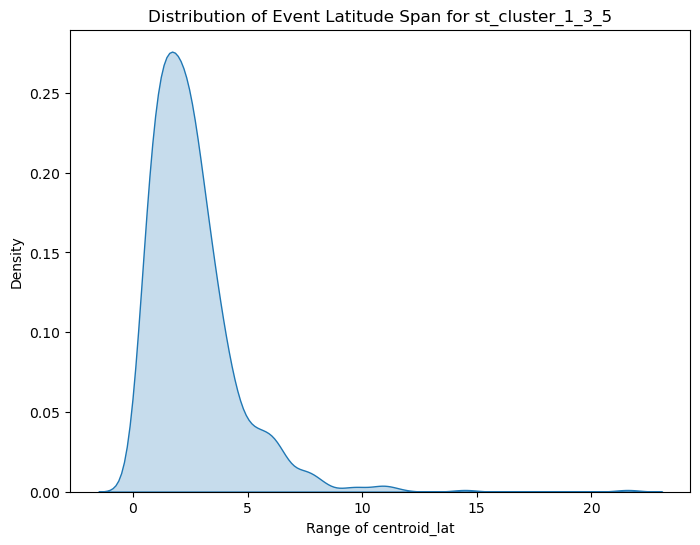

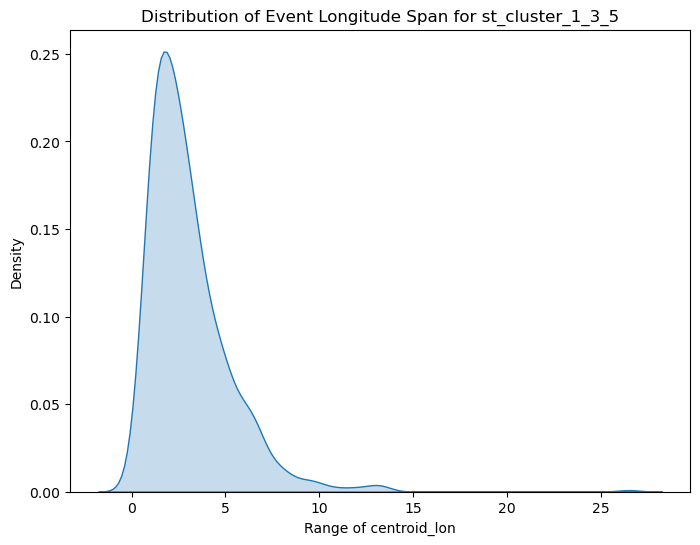


Analyzing st_cluster field: st_cluster_1_3_7


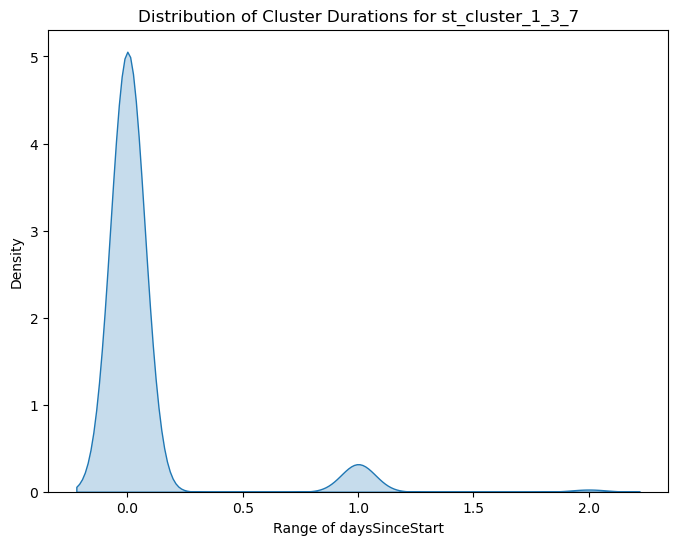

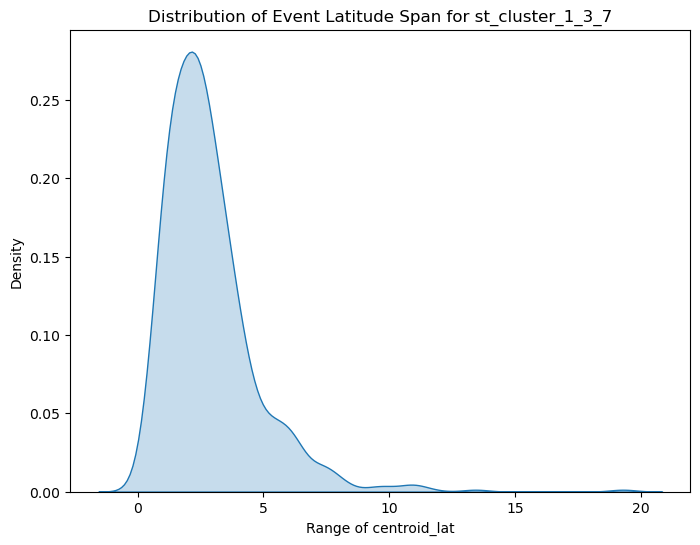

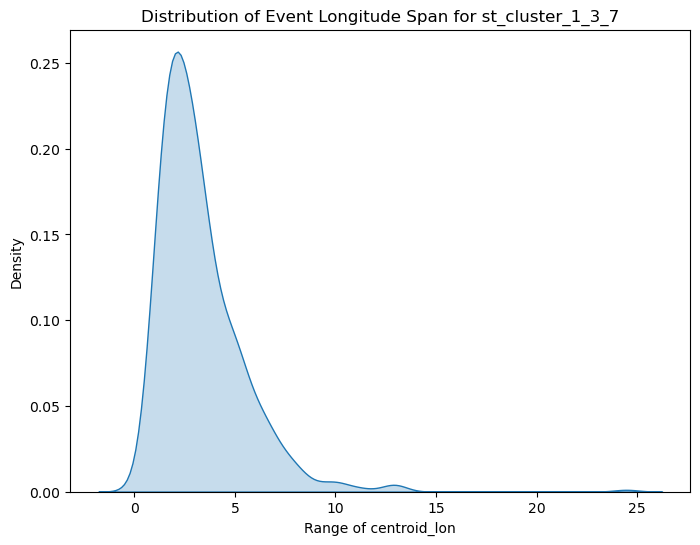


Analyzing st_cluster field: st_cluster_1_3_10


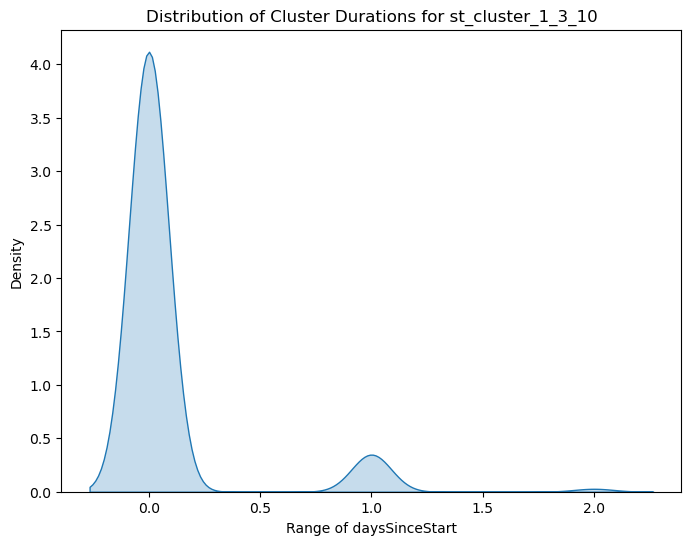

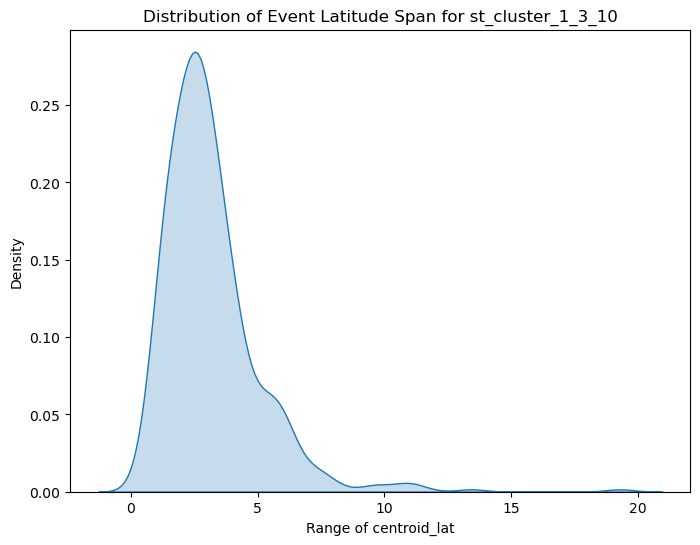

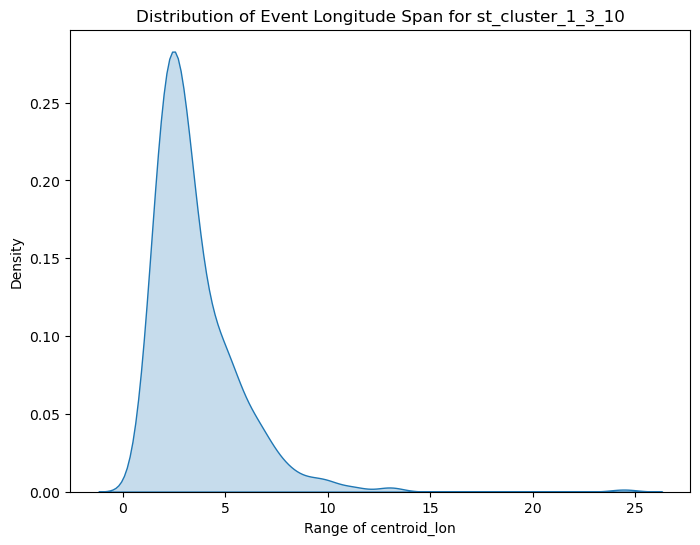


Analyzing st_cluster field: st_cluster_1_5_3


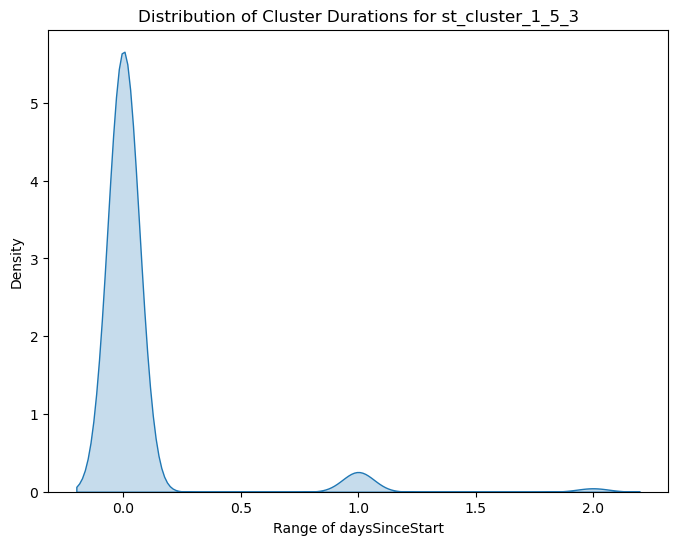

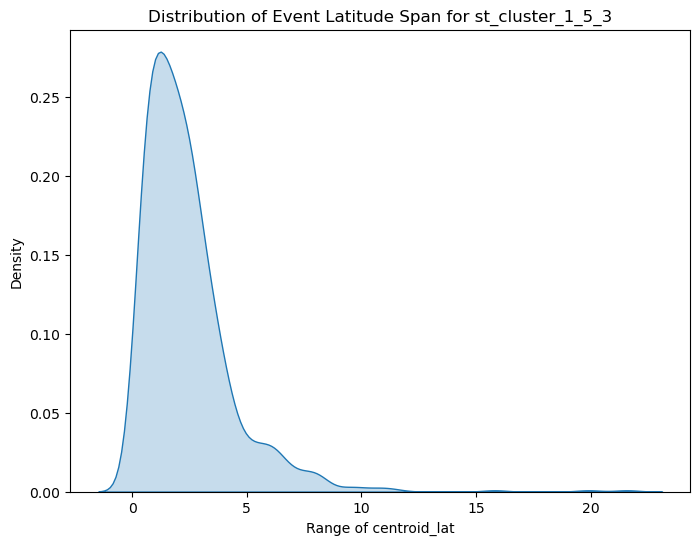

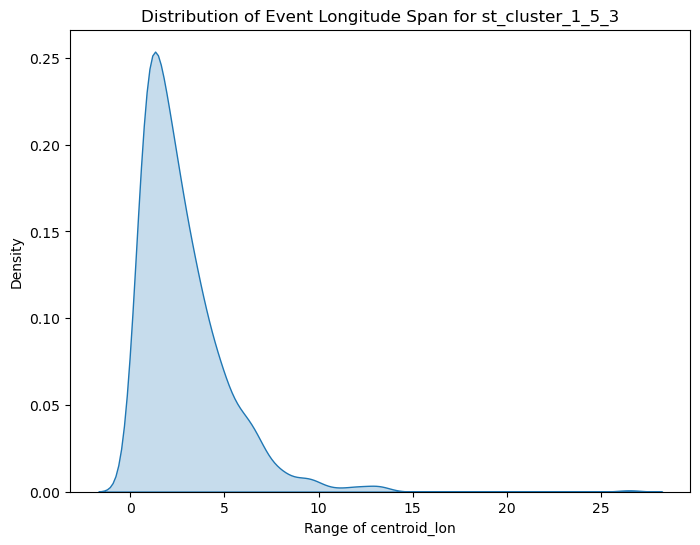


Analyzing st_cluster field: st_cluster_1_5_5


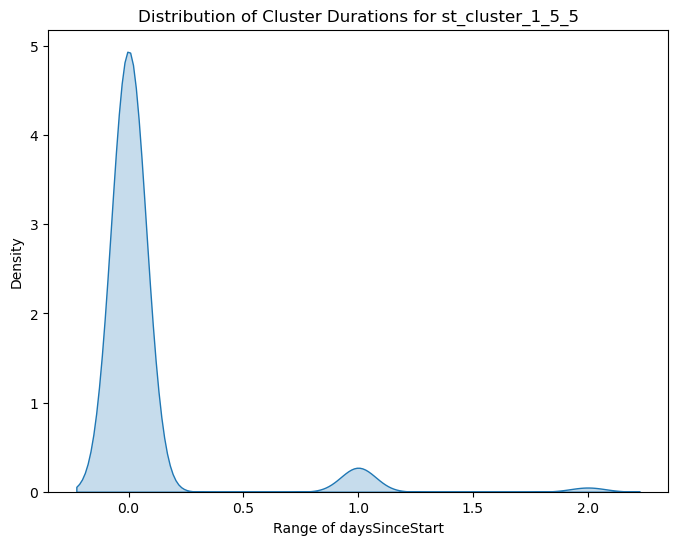

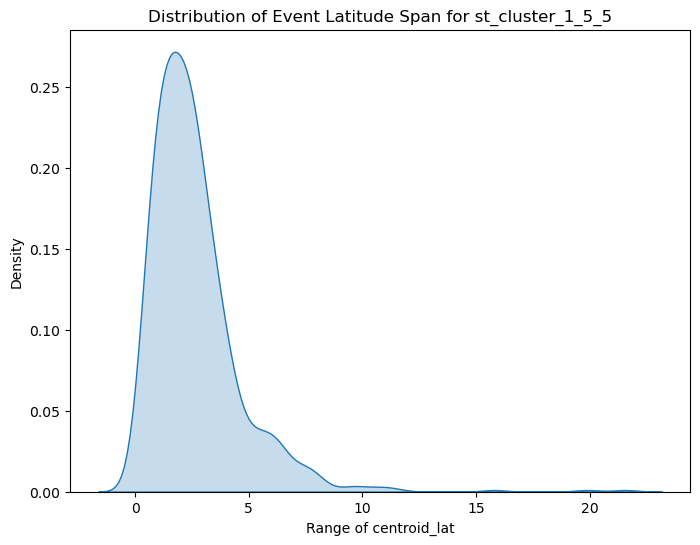

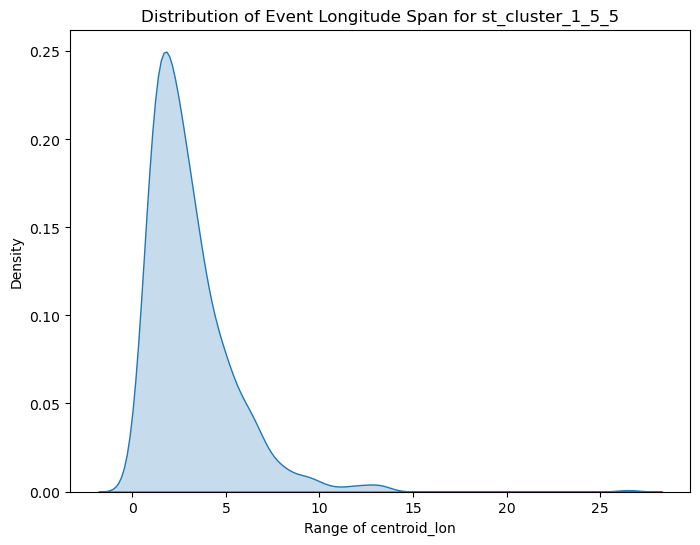


Analyzing st_cluster field: st_cluster_1_5_7


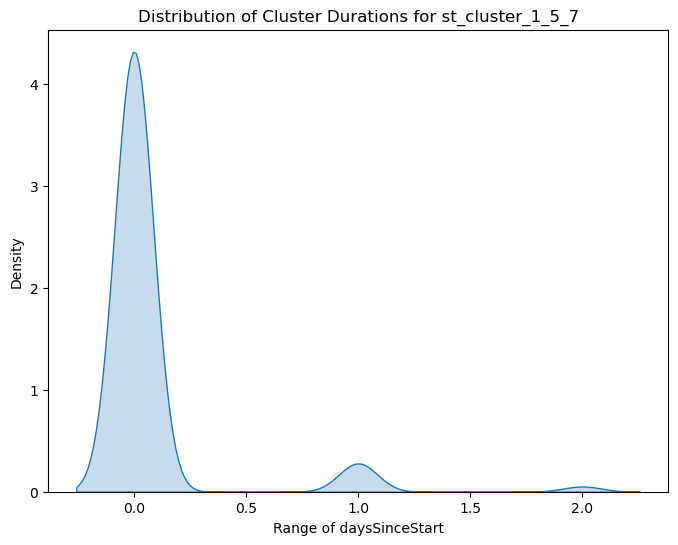

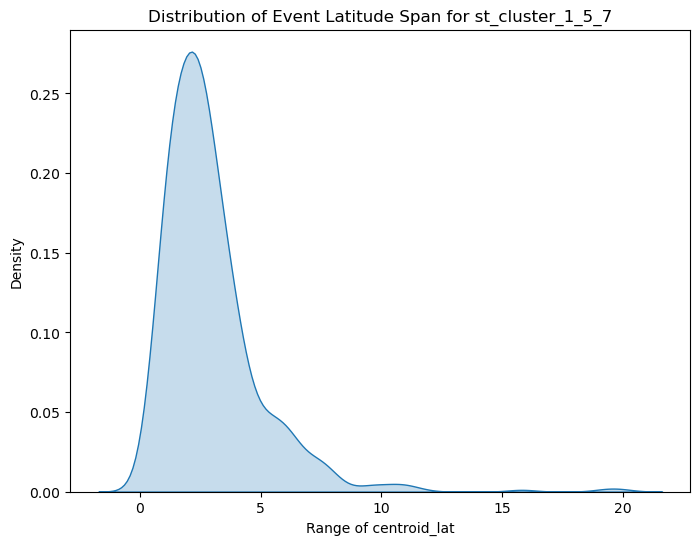

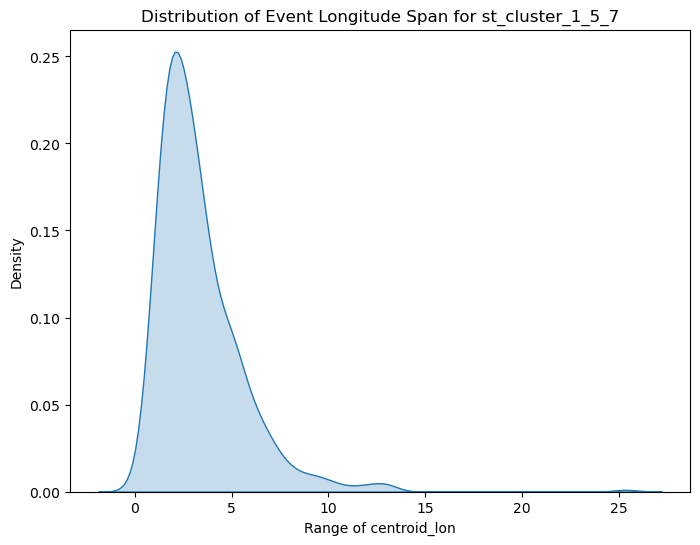


Analyzing st_cluster field: st_cluster_1_5_10


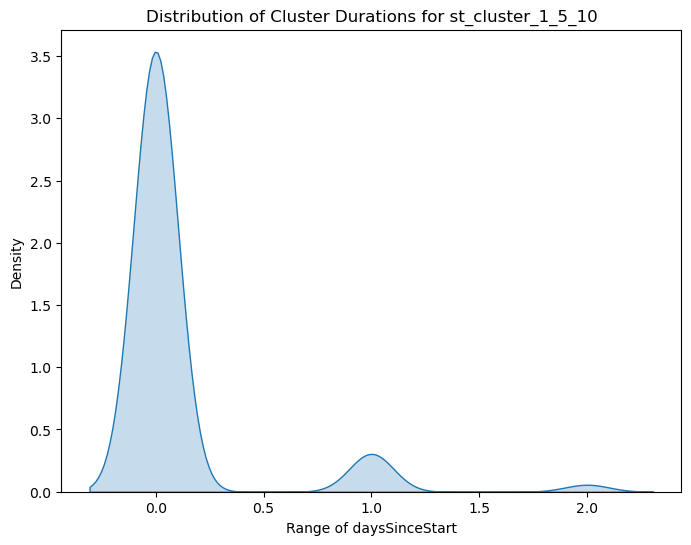

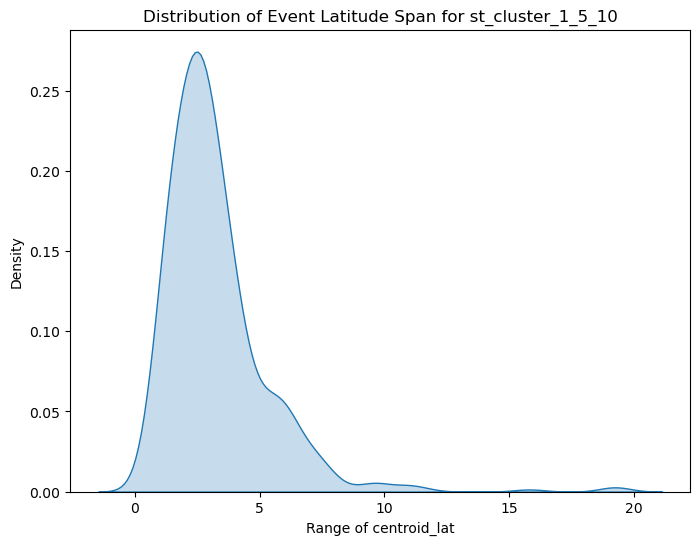

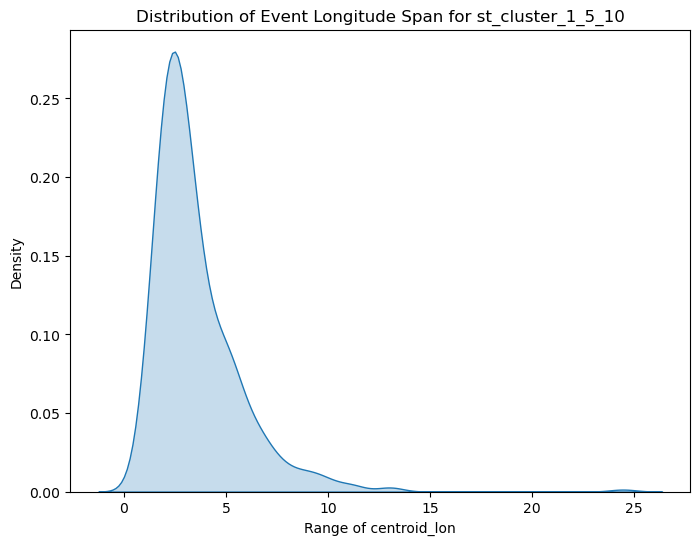


Analyzing st_cluster field: st_cluster_1_7_3


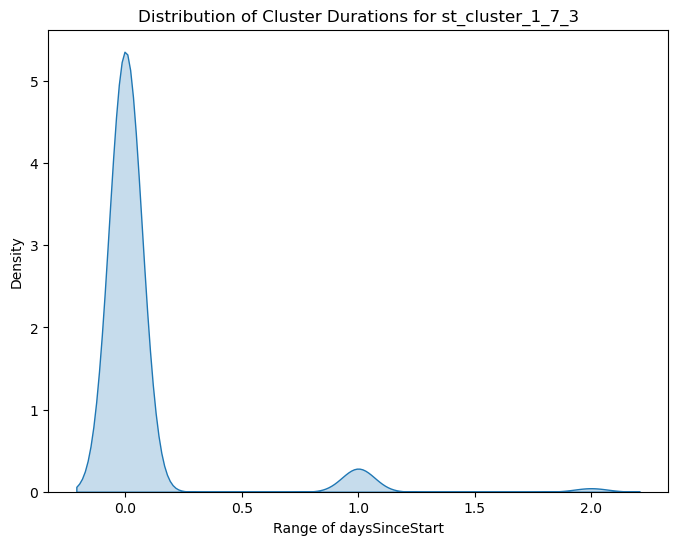

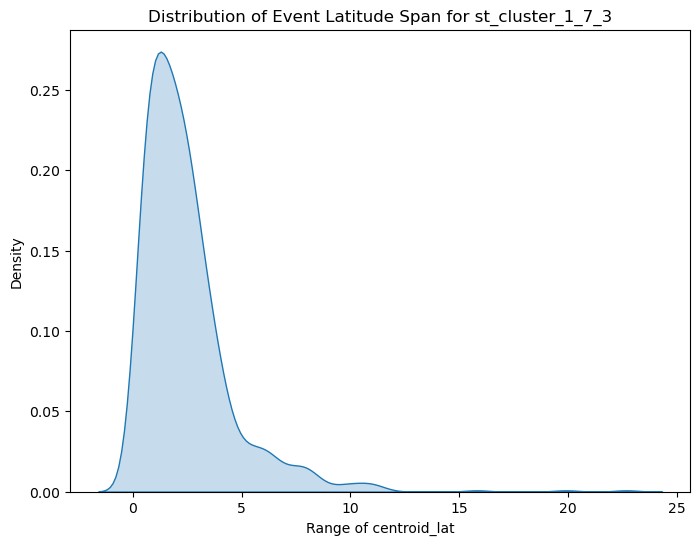

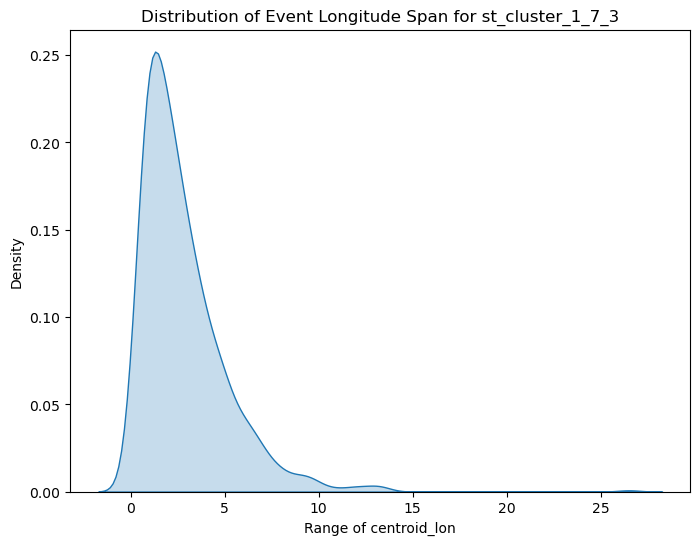


Analyzing st_cluster field: st_cluster_1_7_5


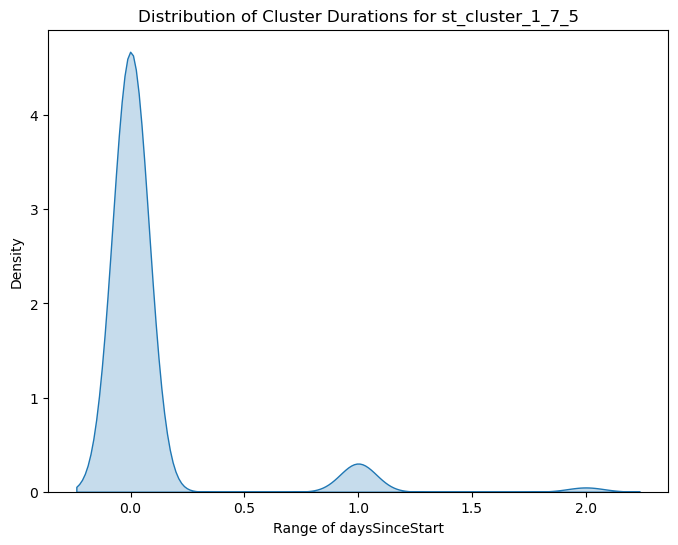

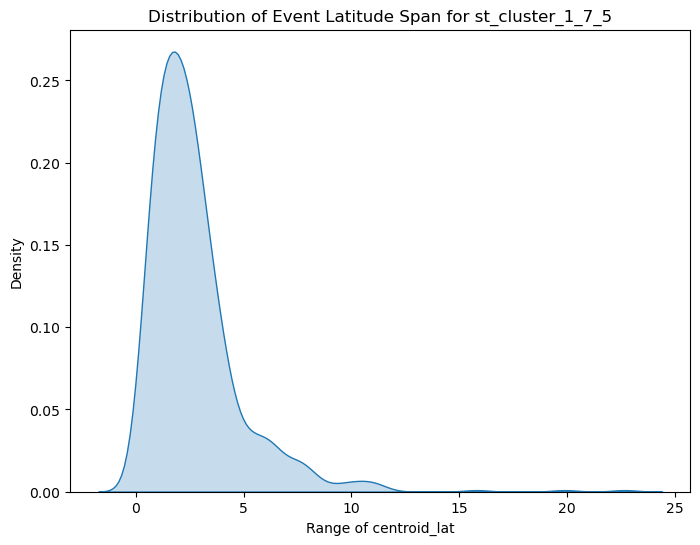

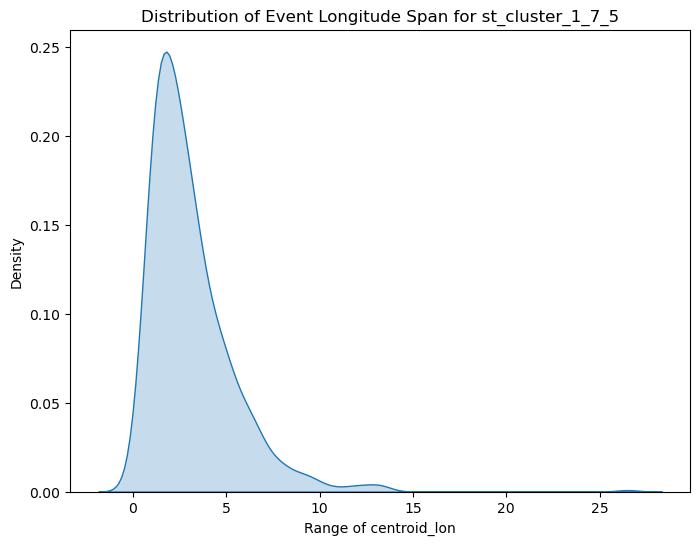


Analyzing st_cluster field: st_cluster_1_7_7


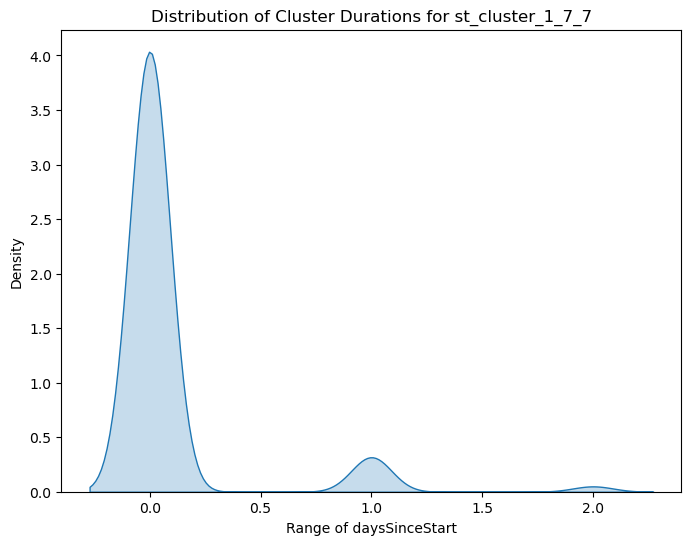

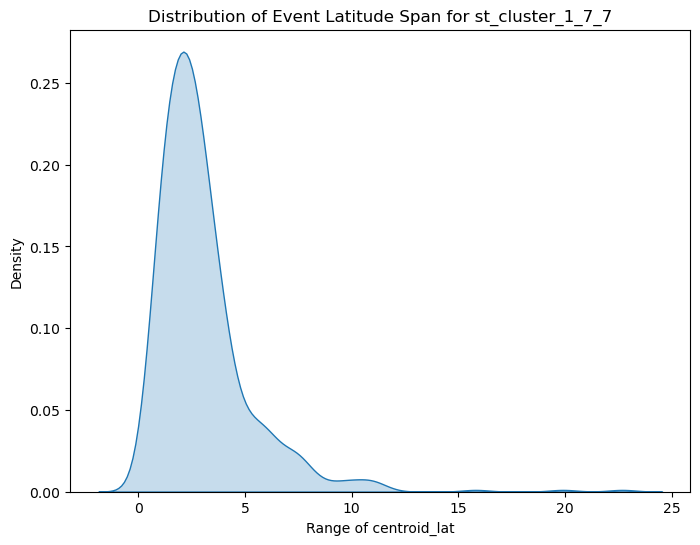

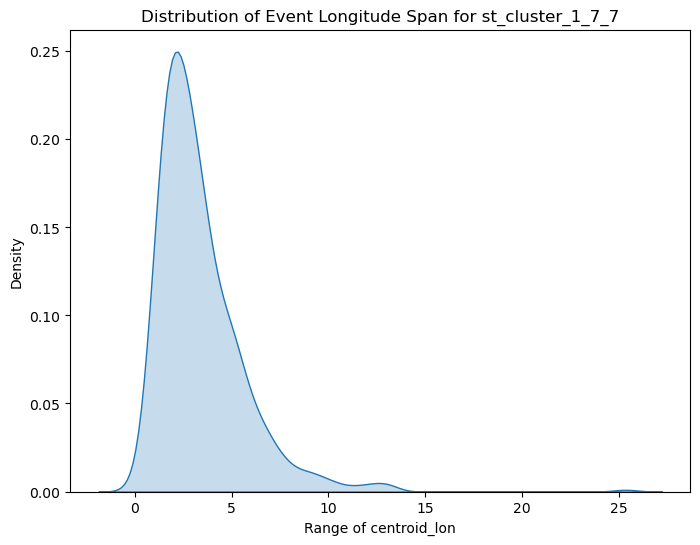


Analyzing st_cluster field: st_cluster_1_7_10


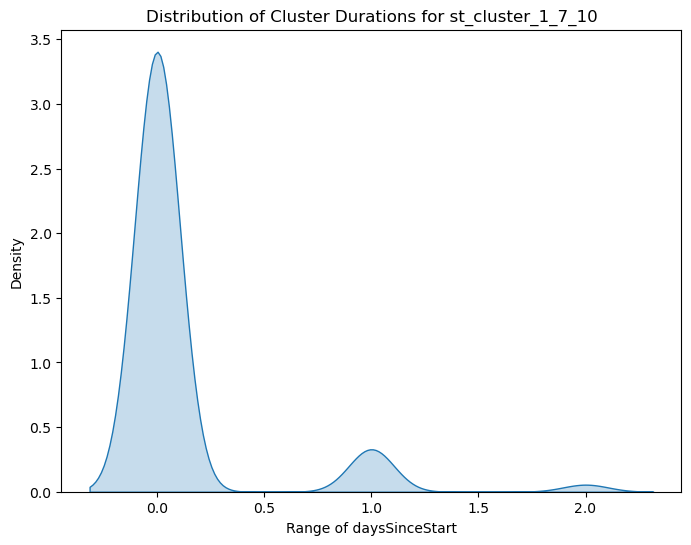

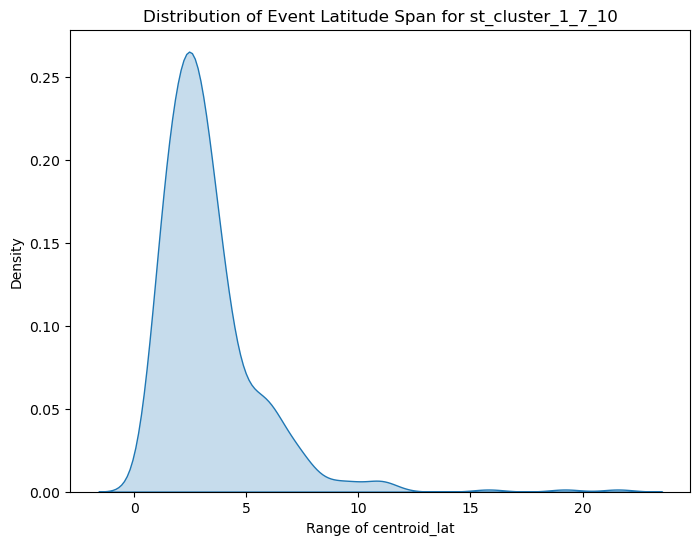

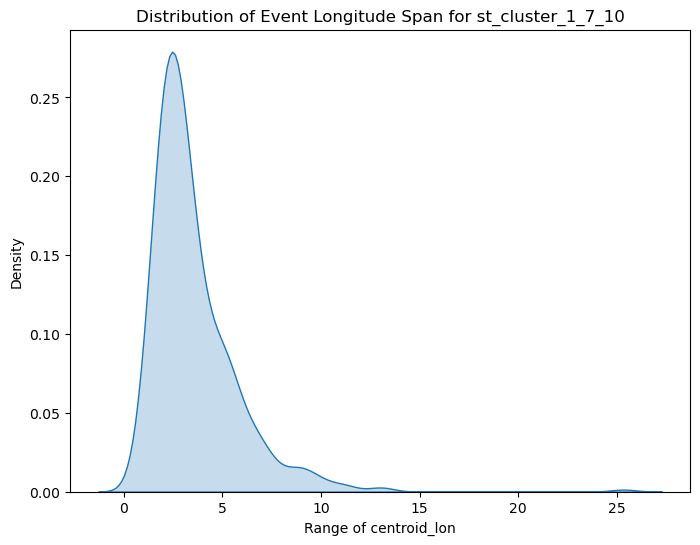


Analyzing st_cluster field: st_cluster_1_14_3


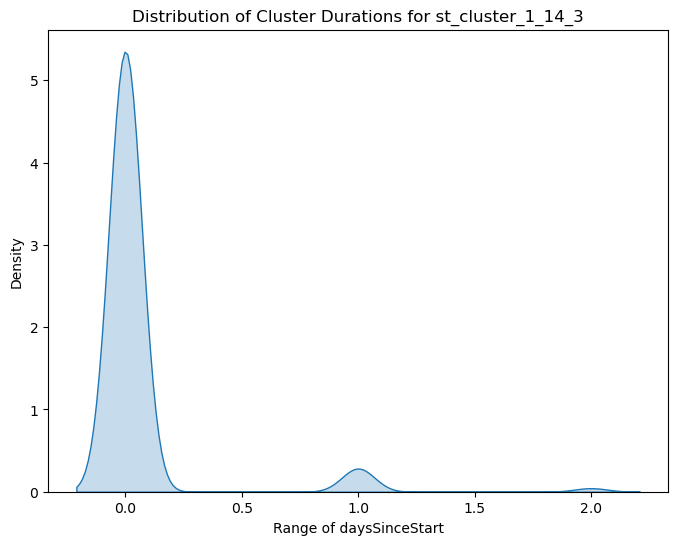

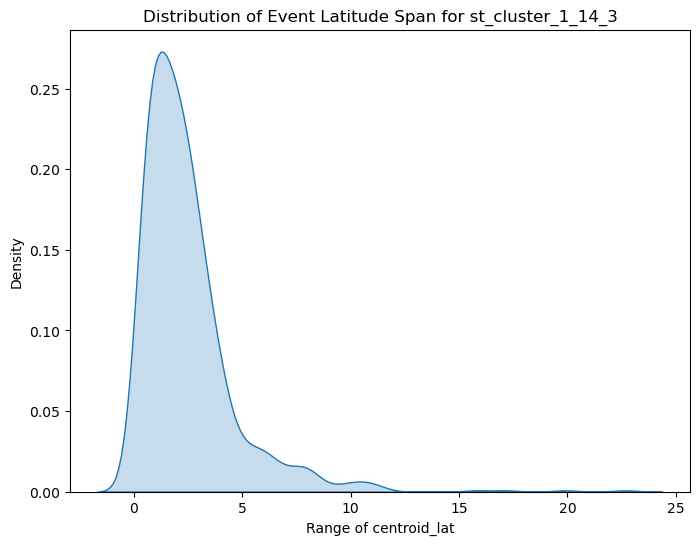

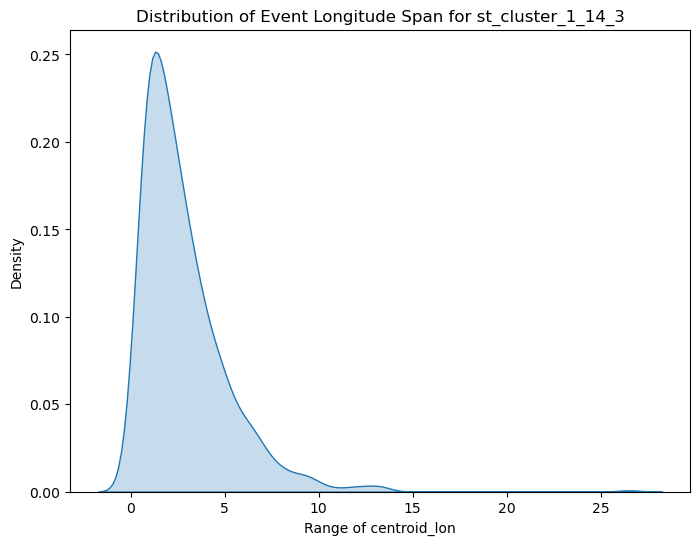


Analyzing st_cluster field: st_cluster_1_14_5


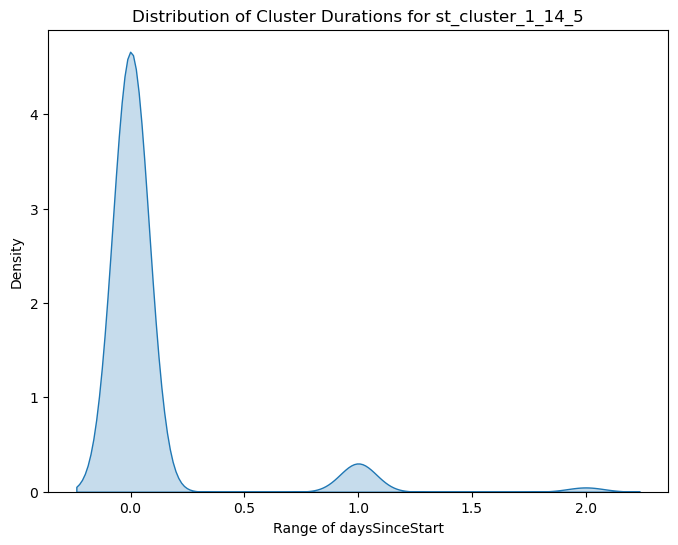

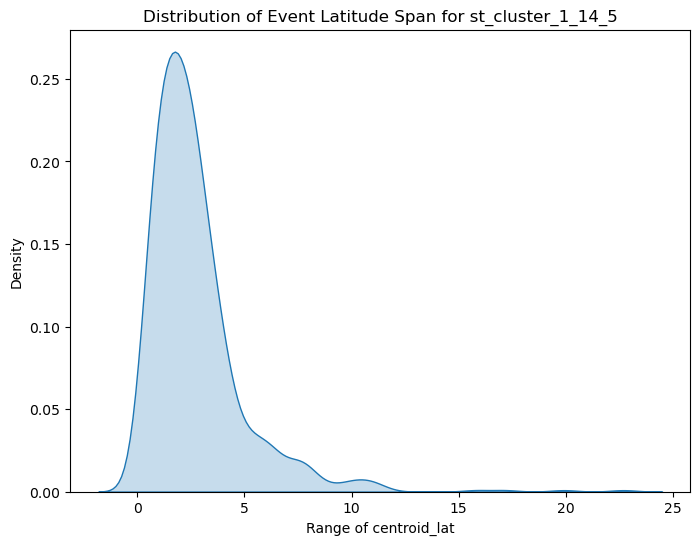

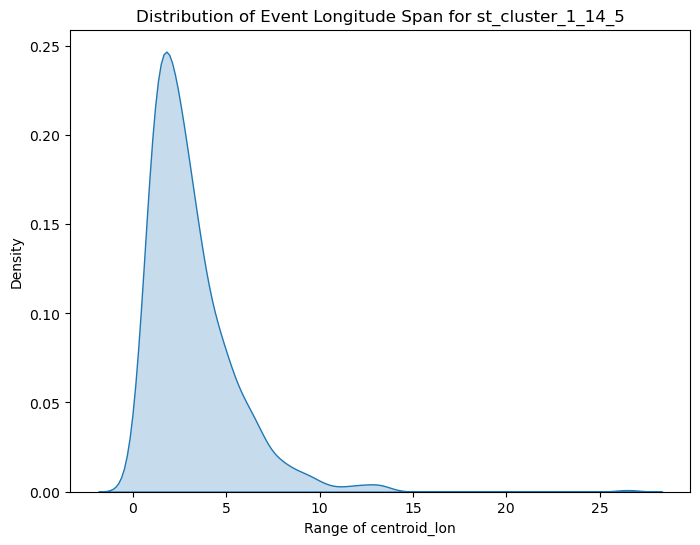


Analyzing st_cluster field: st_cluster_1_14_7


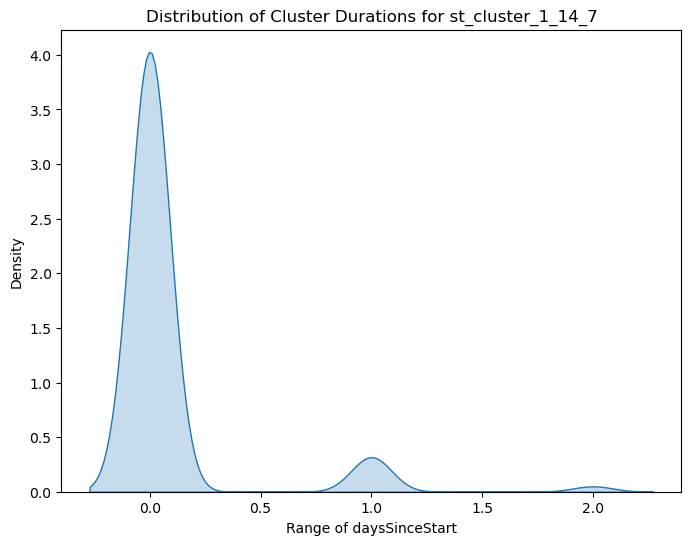

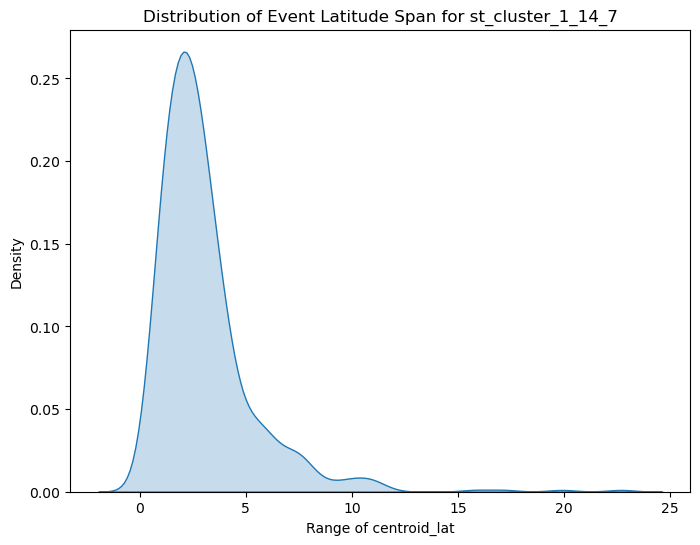

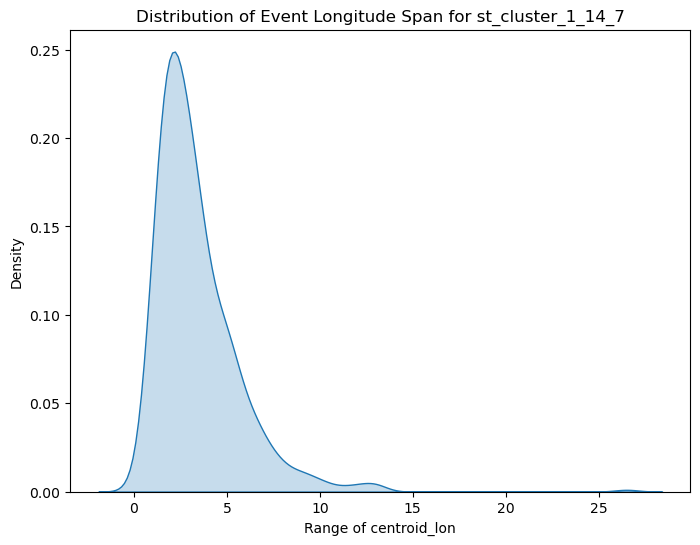


Analyzing st_cluster field: st_cluster_1_14_10


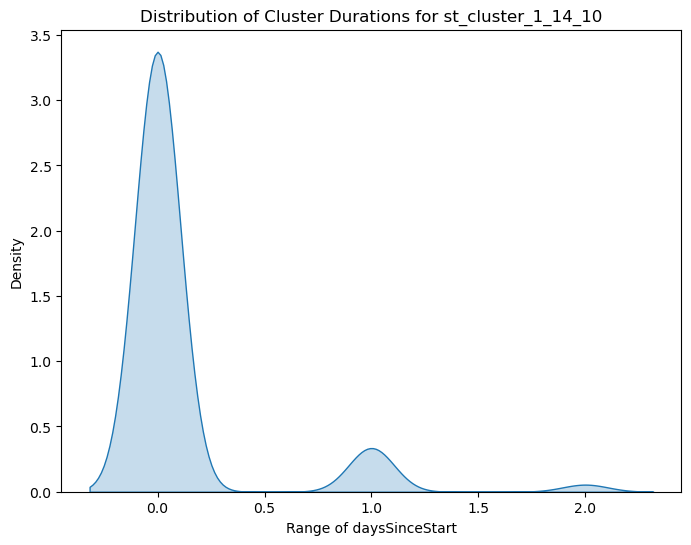

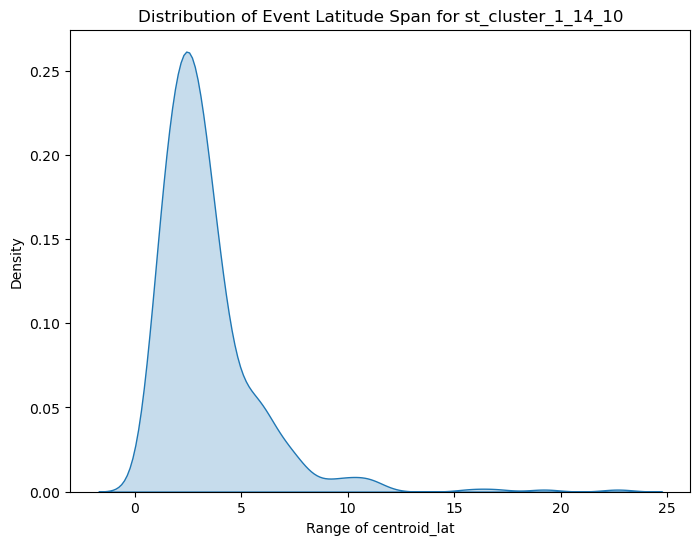

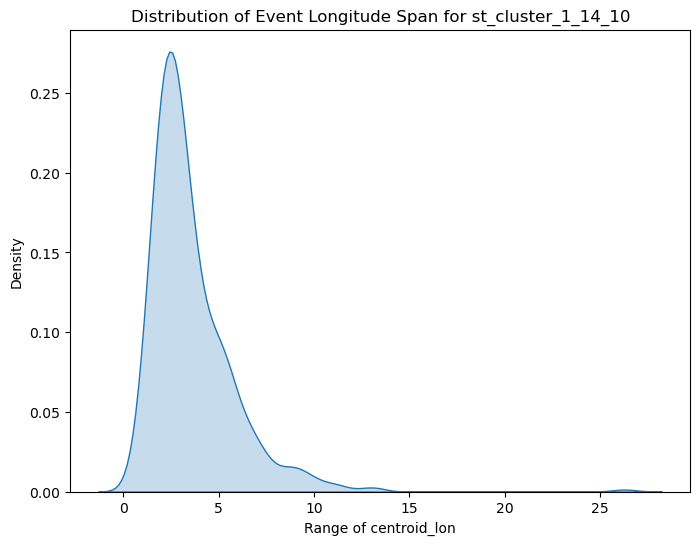


Analyzing st_cluster field: st_cluster_1_30_3


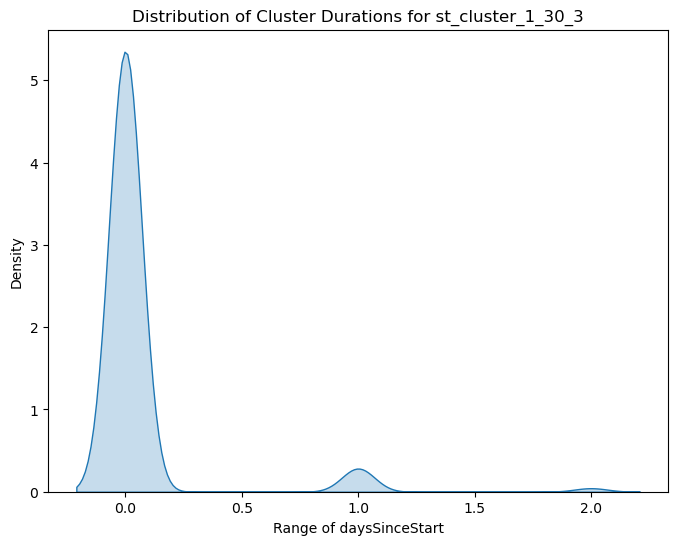

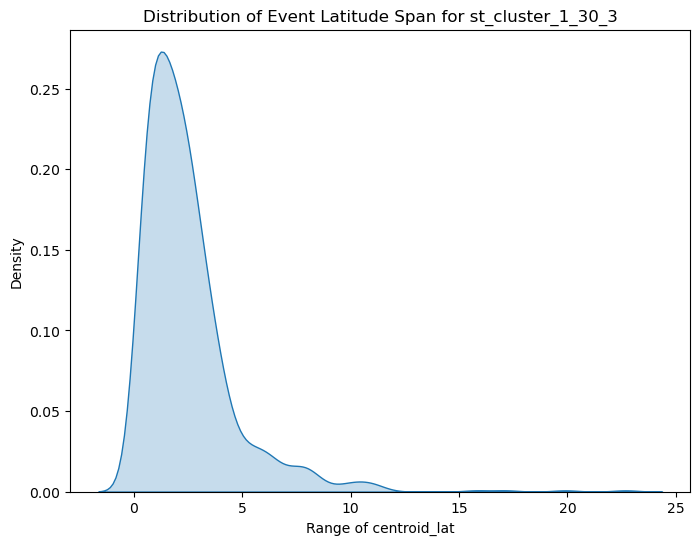

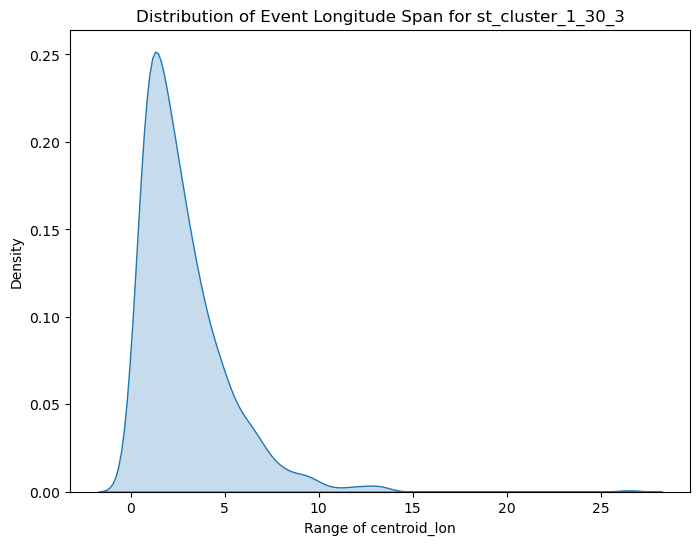


Analyzing st_cluster field: st_cluster_1_30_5


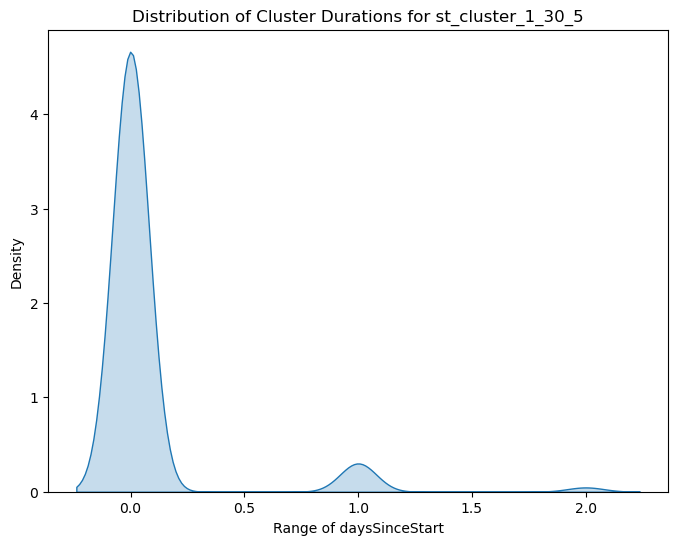

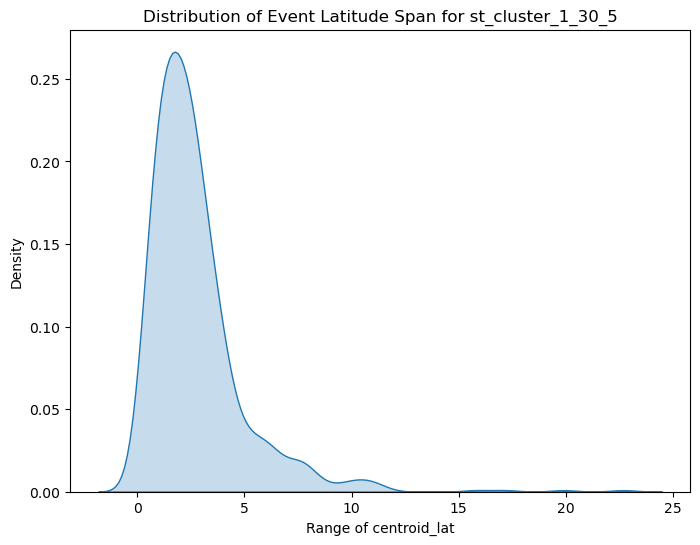

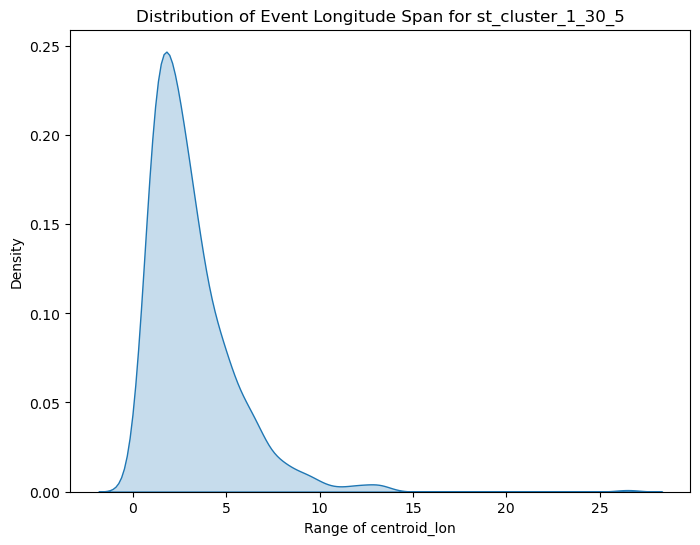


Analyzing st_cluster field: st_cluster_1_30_7


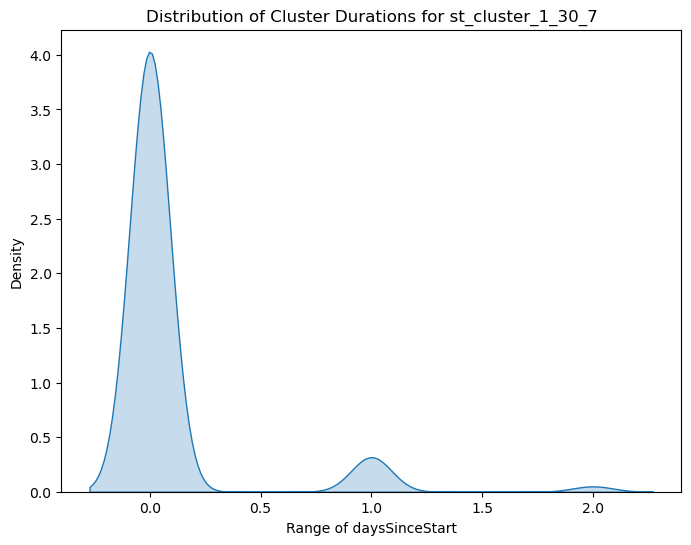

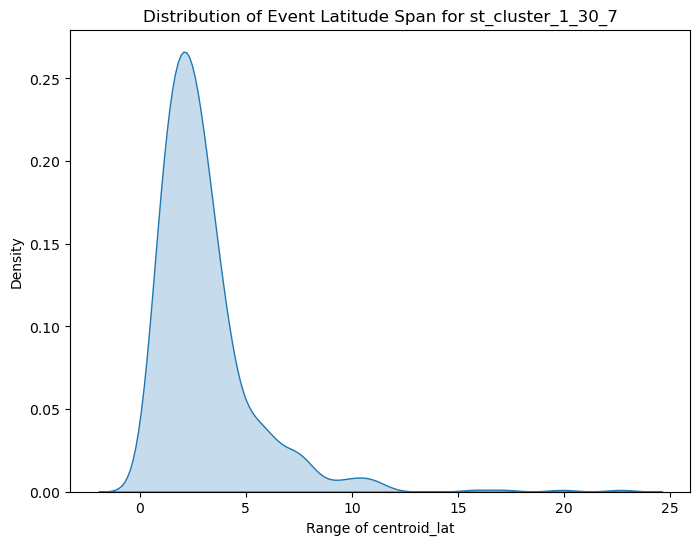

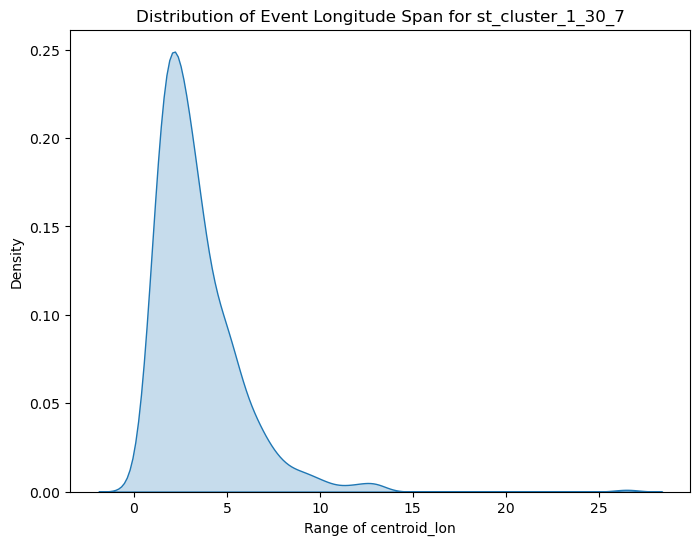


Analyzing st_cluster field: st_cluster_1_30_10


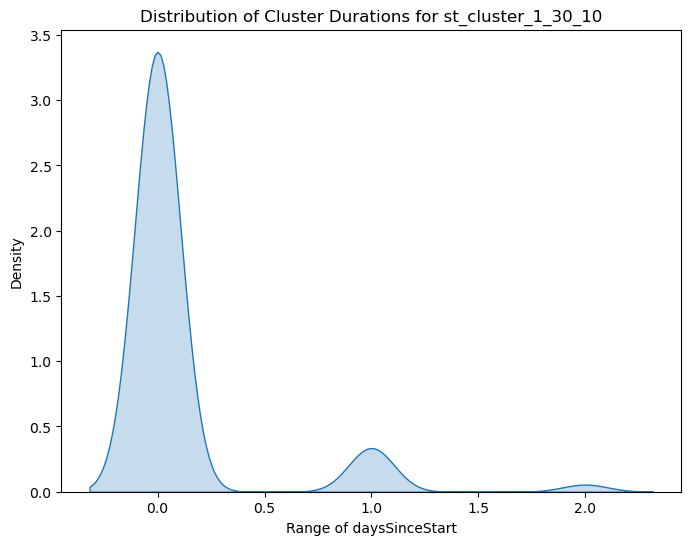

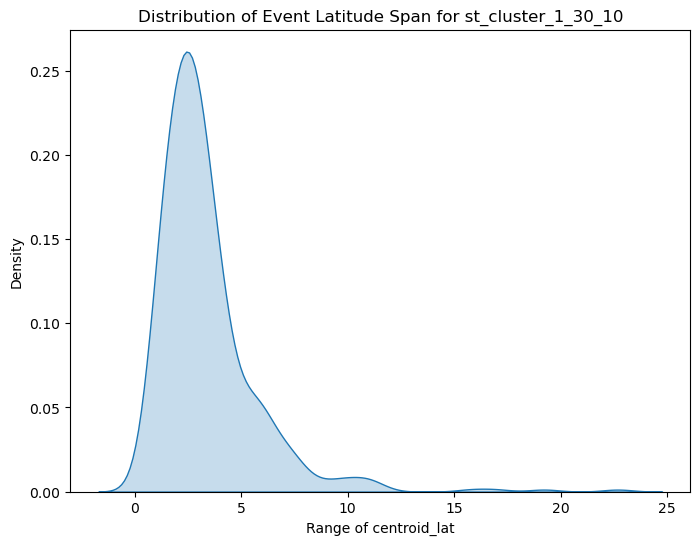

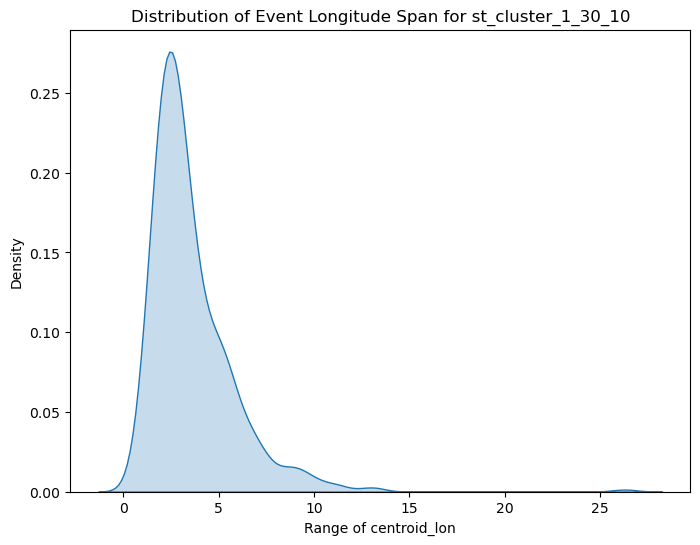


Analyzing st_cluster field: st_cluster_2_1_3


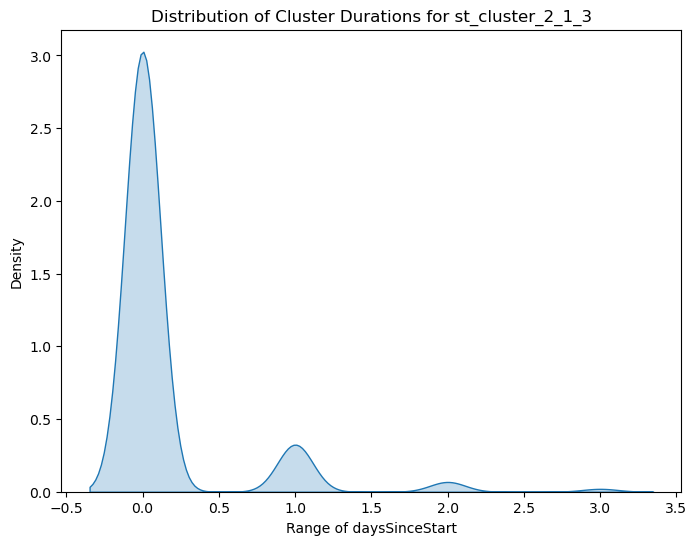

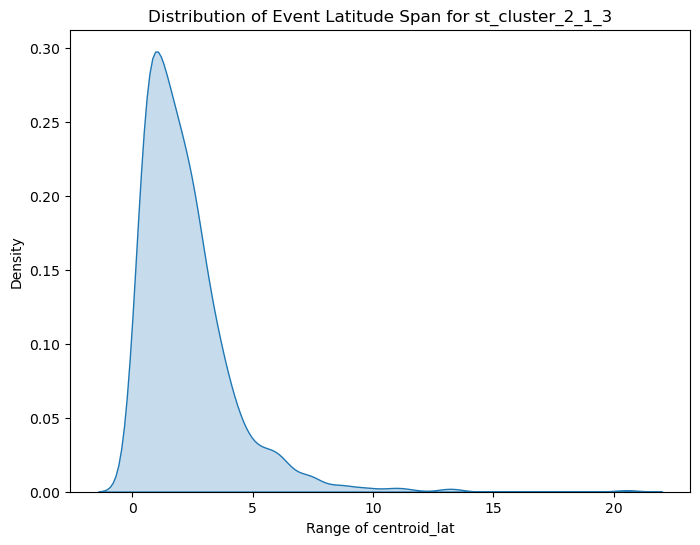

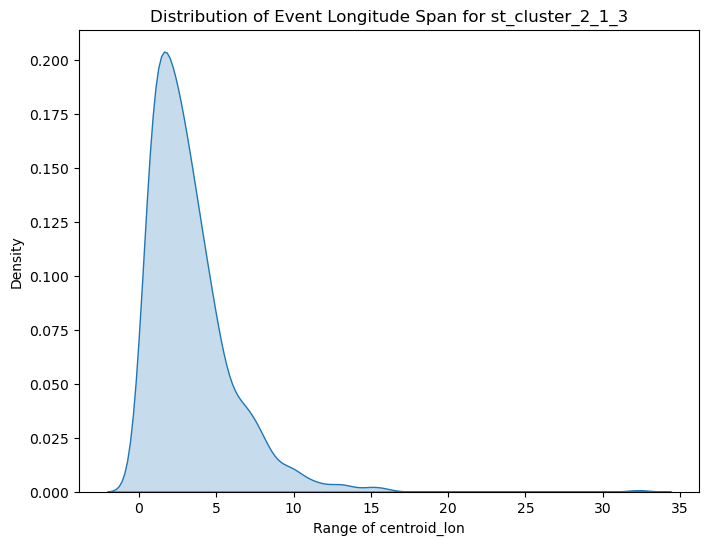


Analyzing st_cluster field: st_cluster_2_1_5


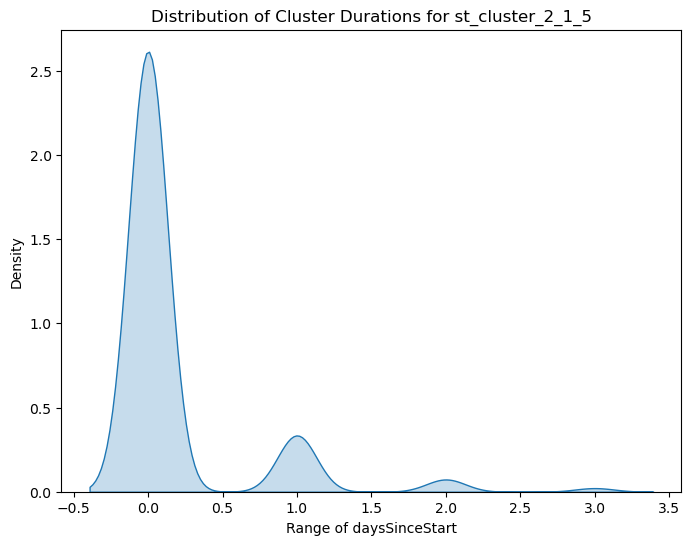

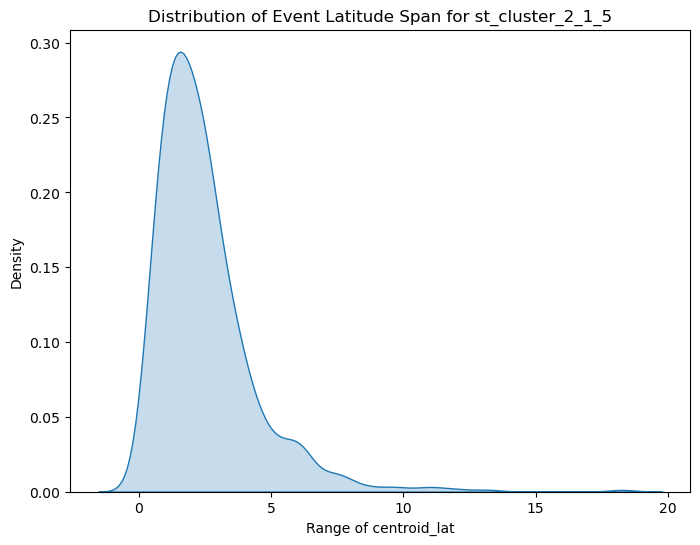

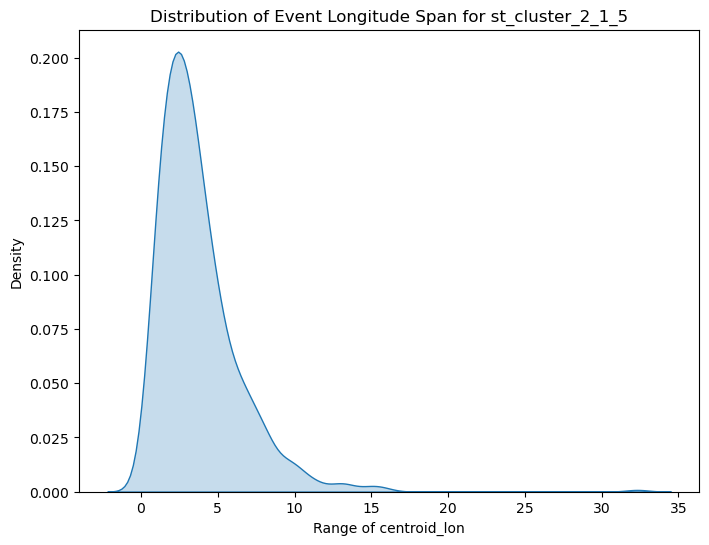


Analyzing st_cluster field: st_cluster_2_1_7


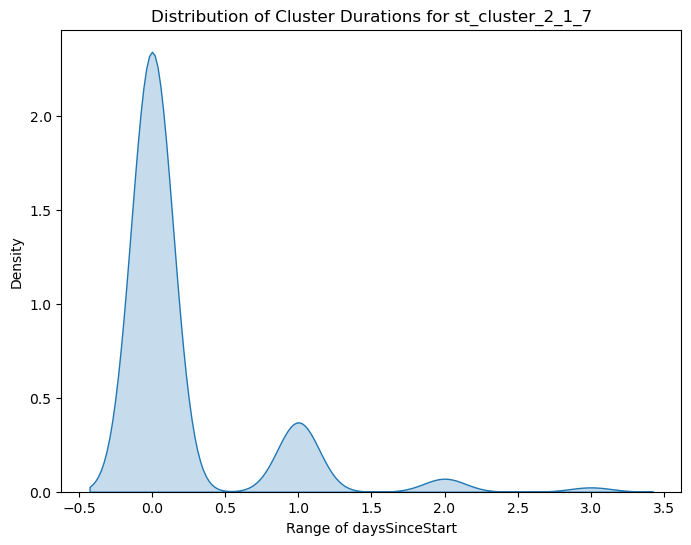

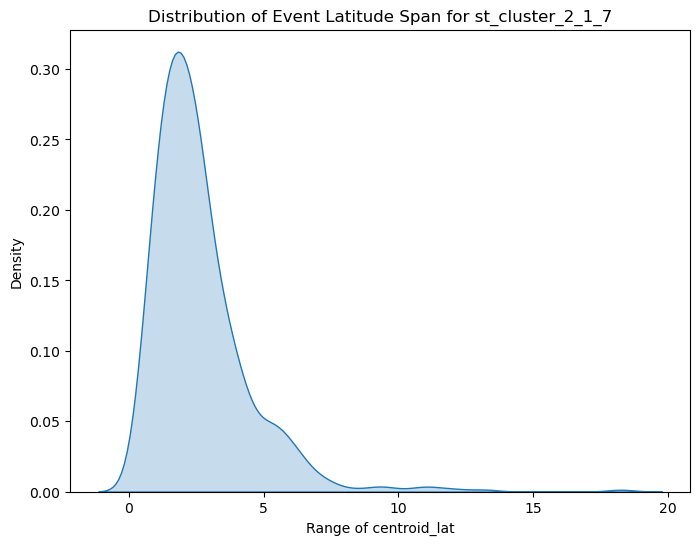

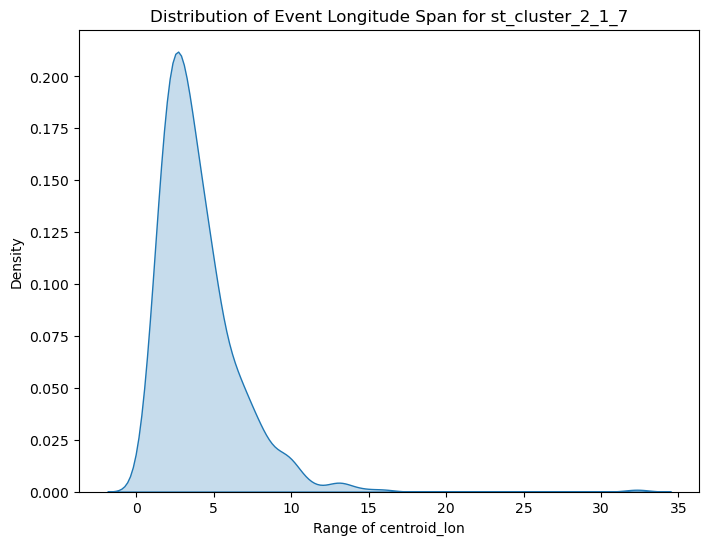


Analyzing st_cluster field: st_cluster_2_1_10


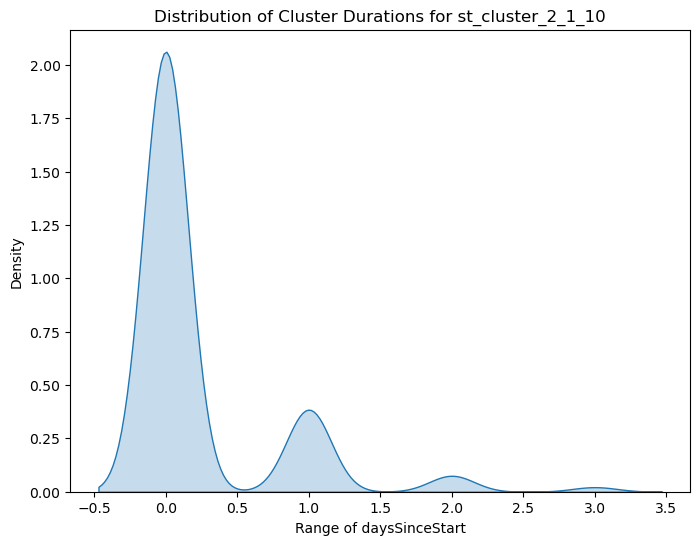

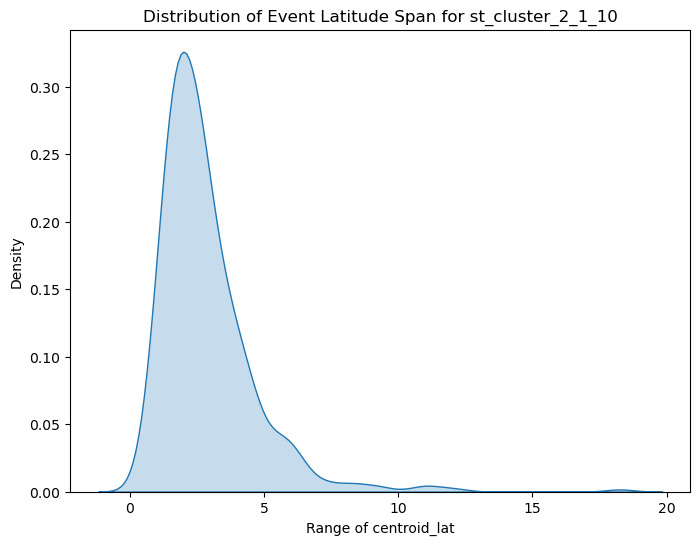

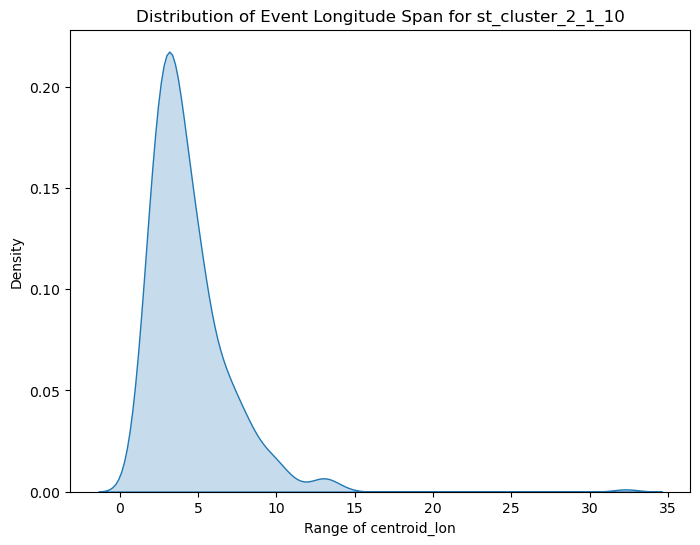


Analyzing st_cluster field: st_cluster_2_3_3


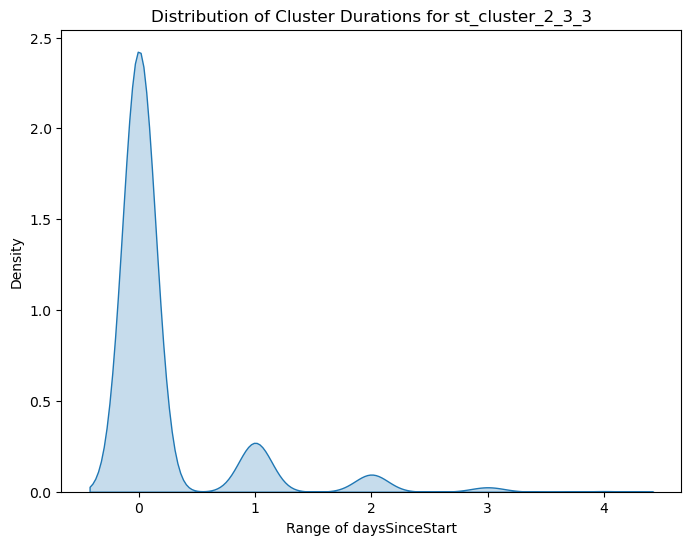

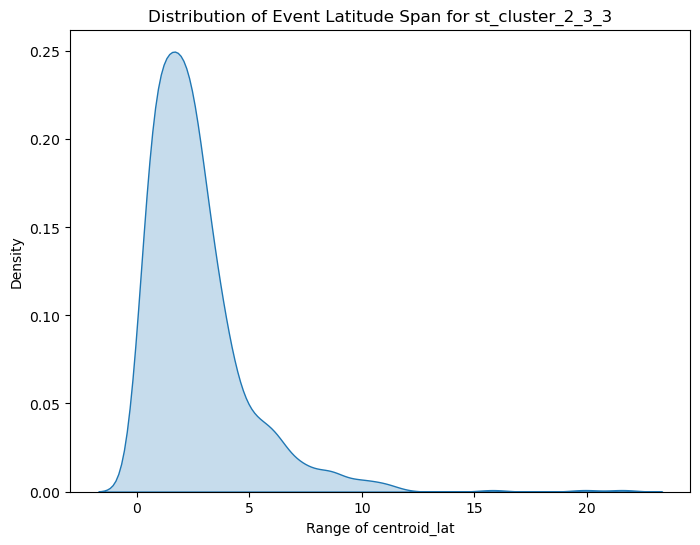

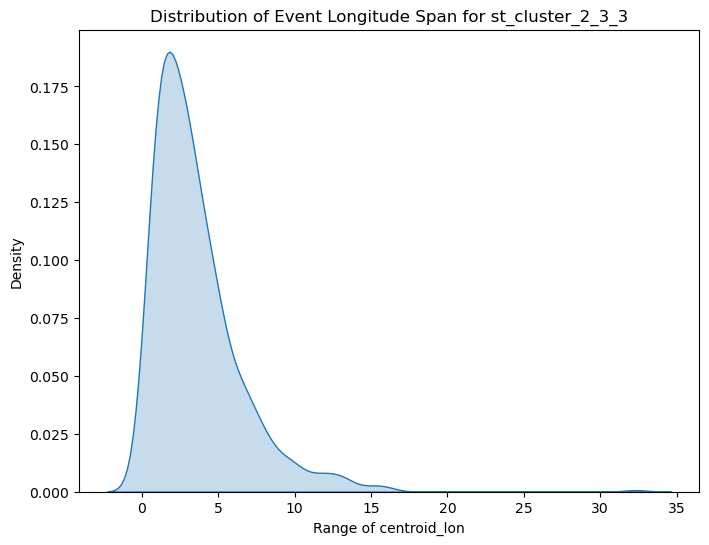


Analyzing st_cluster field: st_cluster_2_3_5


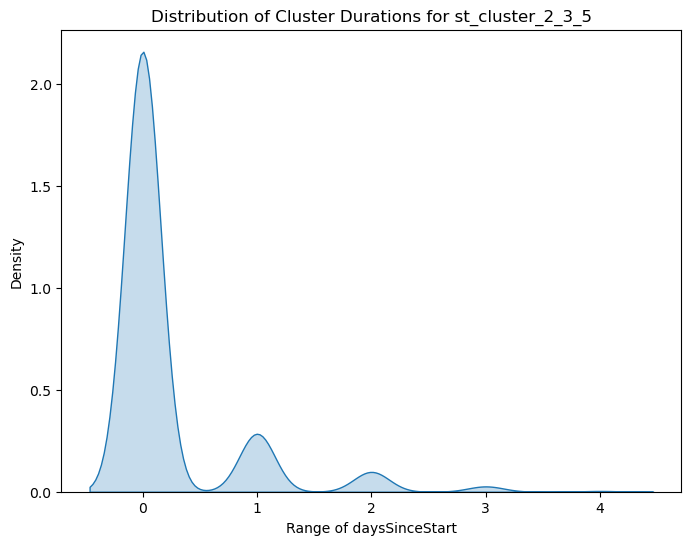

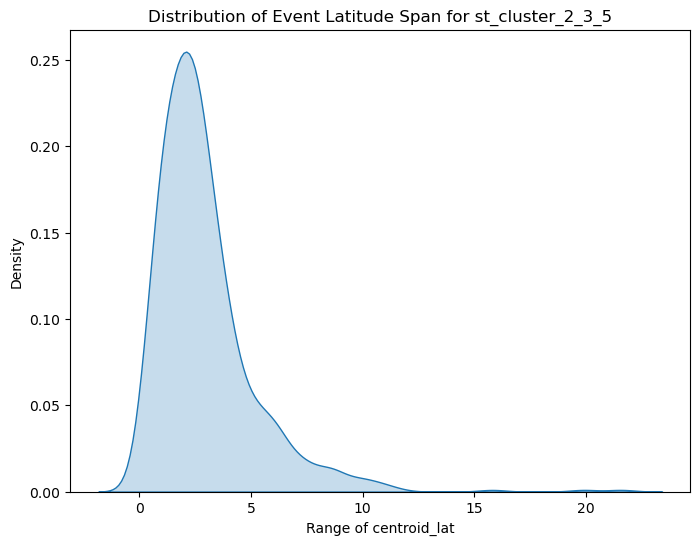

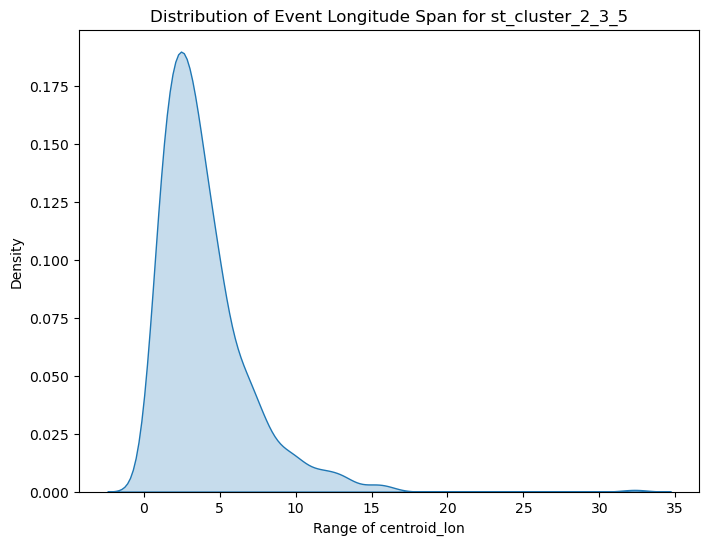


Analyzing st_cluster field: st_cluster_2_3_7


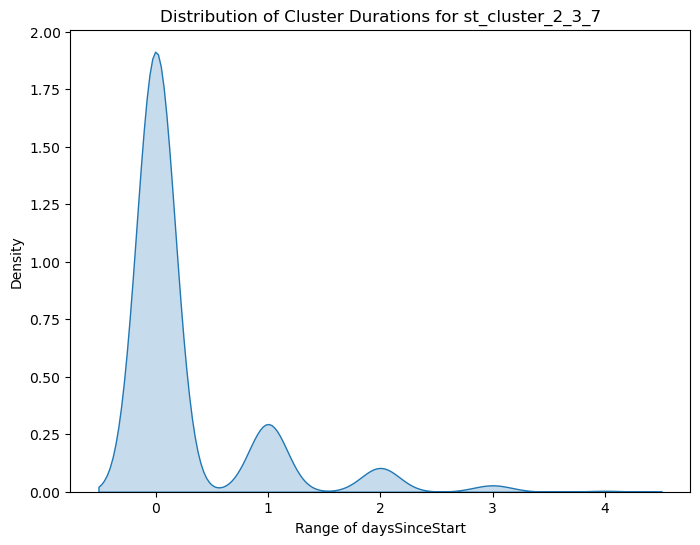

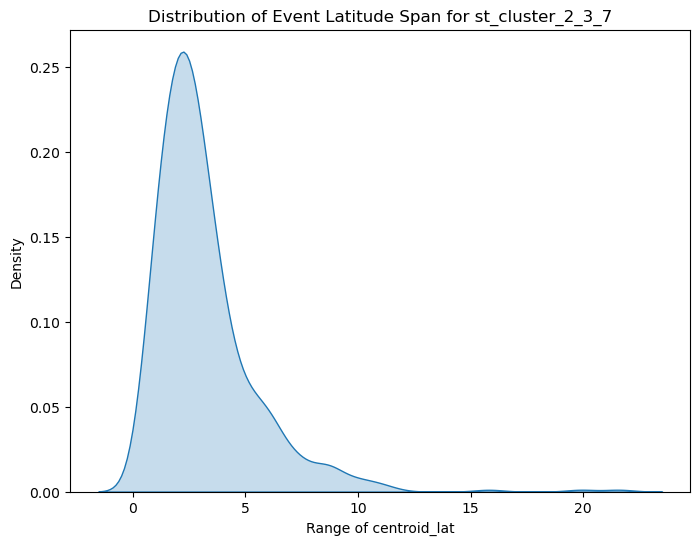

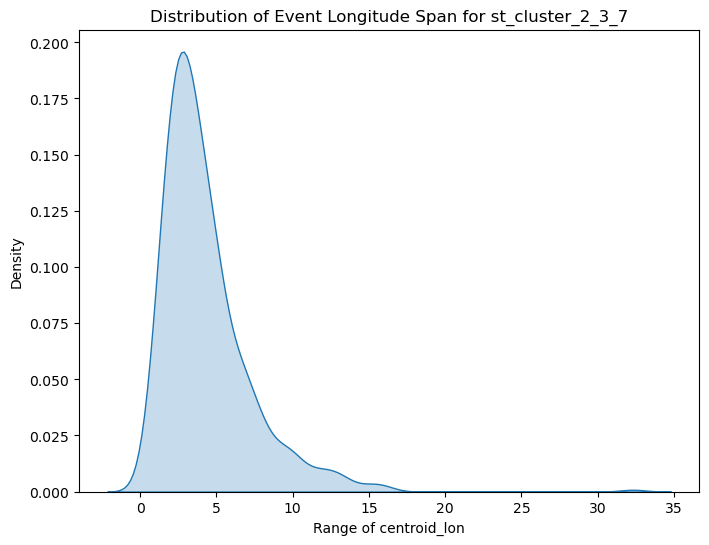


Analyzing st_cluster field: st_cluster_2_3_10


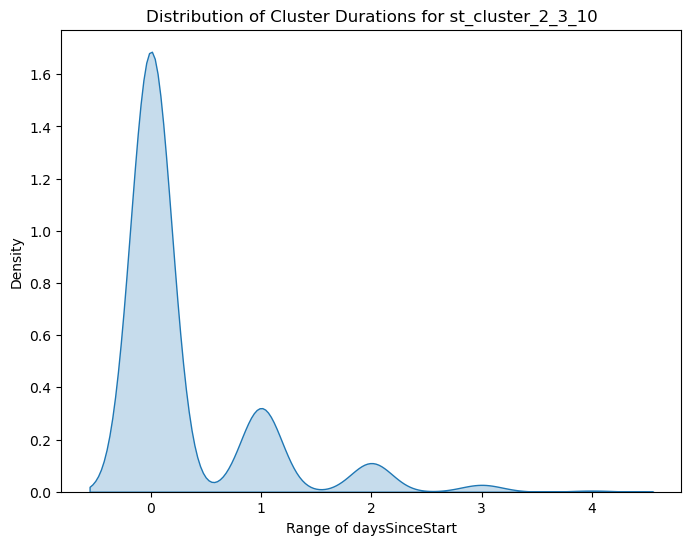

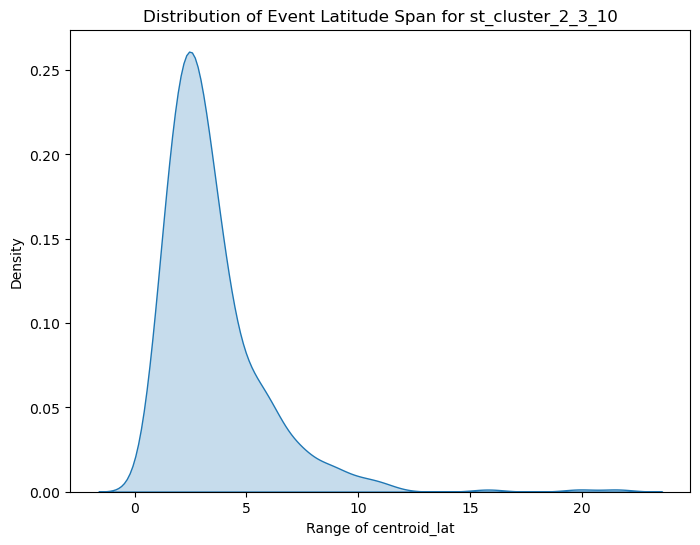

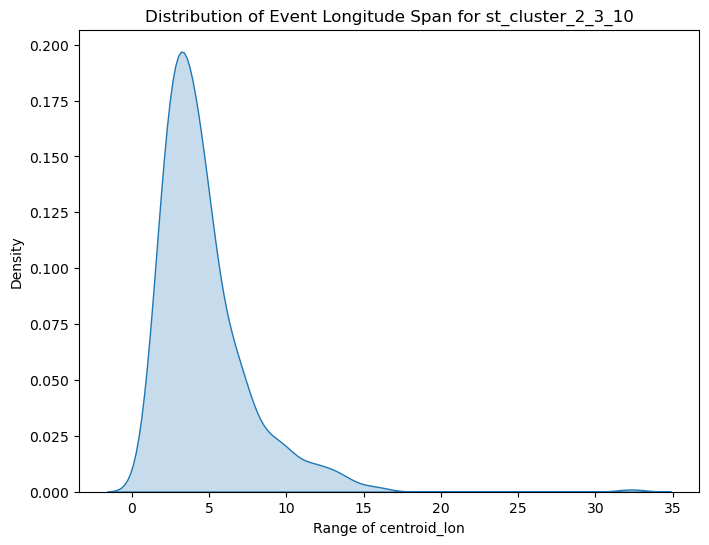


Analyzing st_cluster field: st_cluster_2_5_3


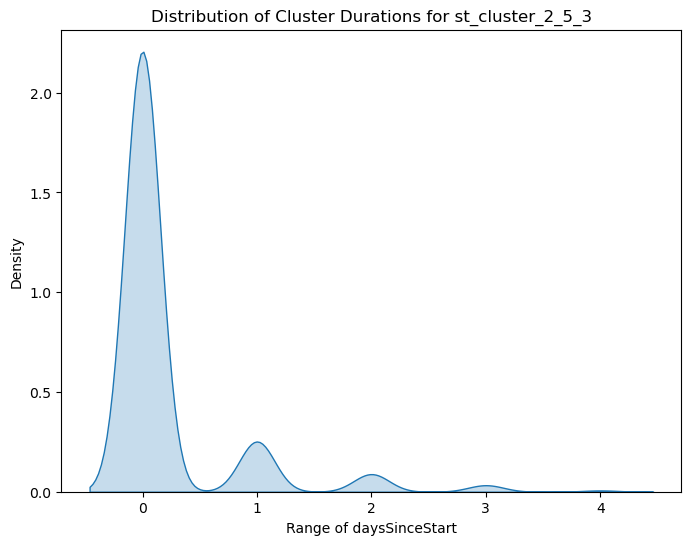

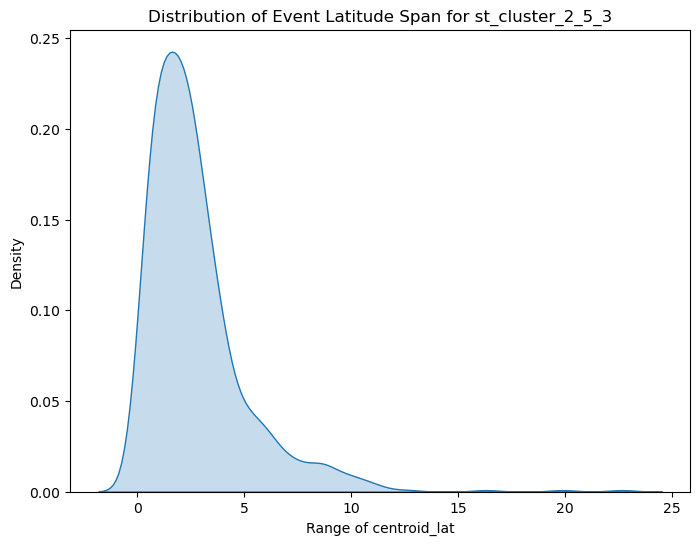

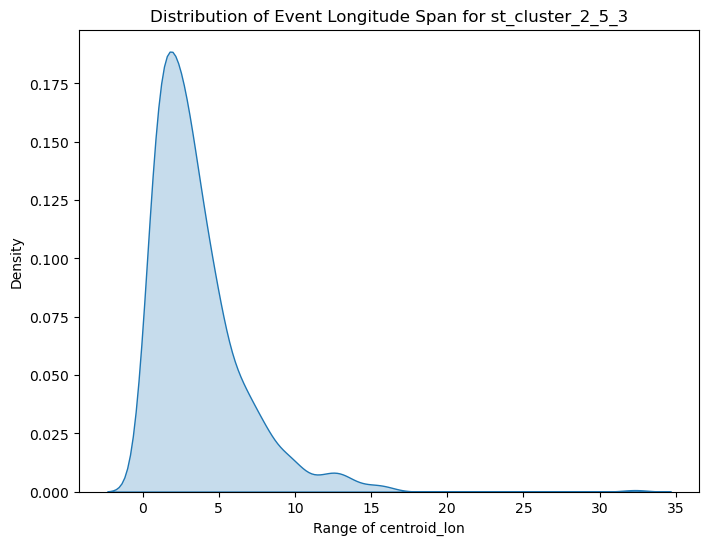


Analyzing st_cluster field: st_cluster_2_5_5


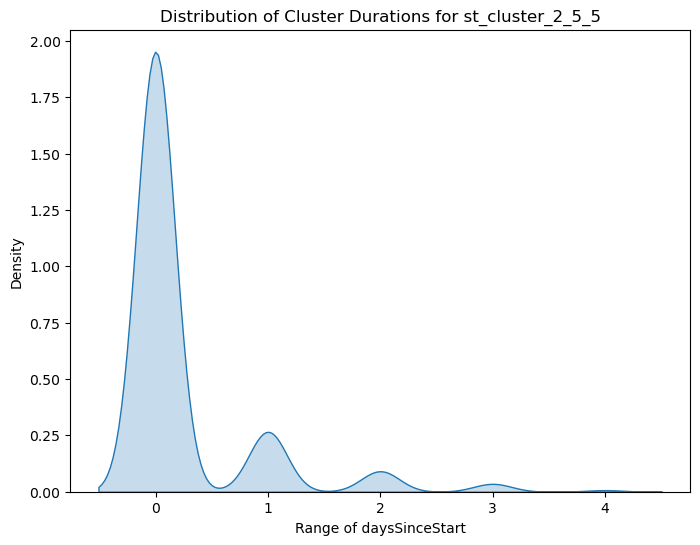

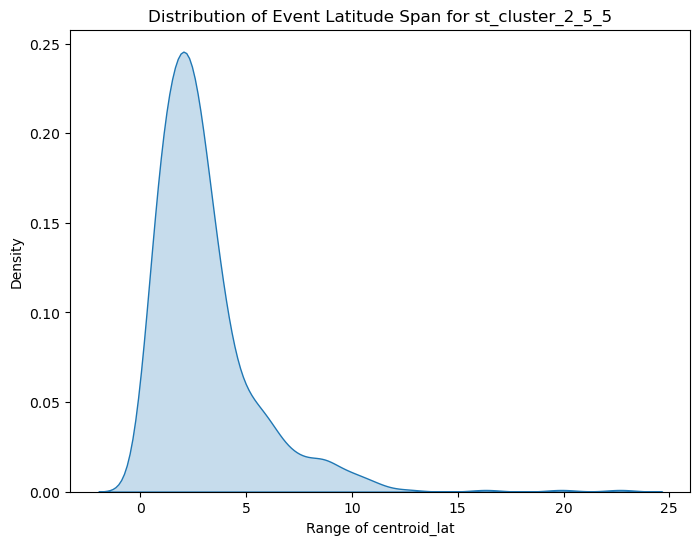

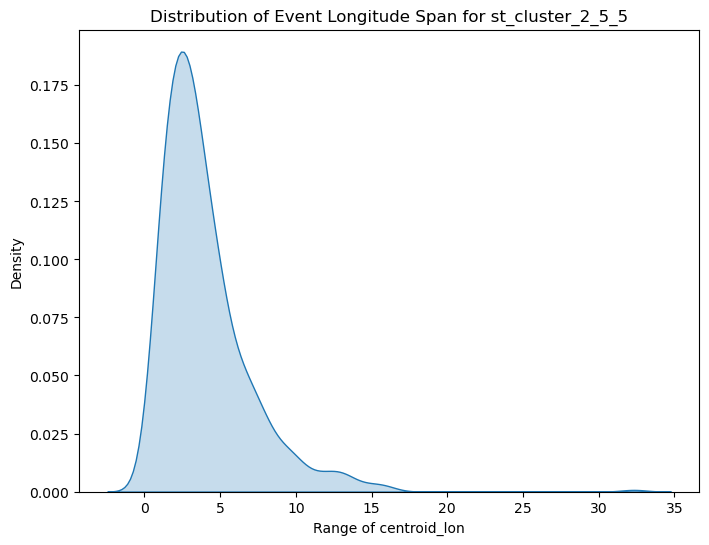


Analyzing st_cluster field: st_cluster_2_5_7


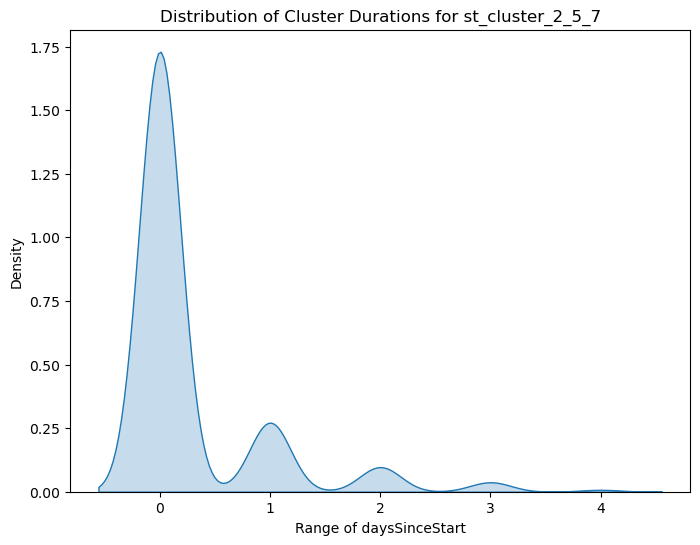

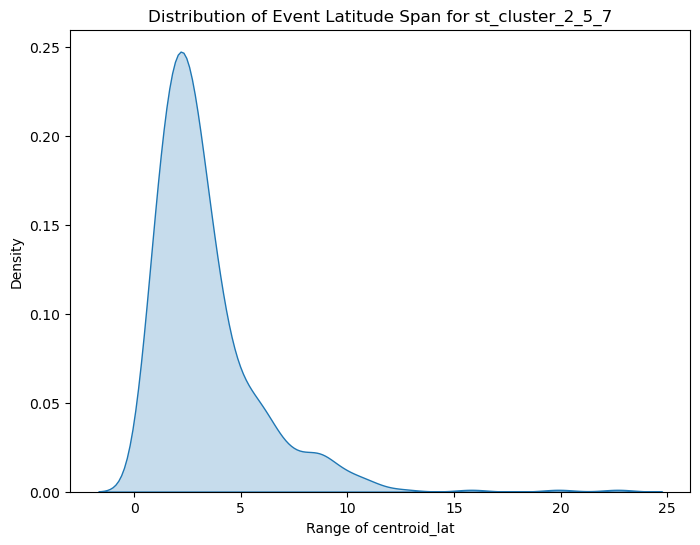

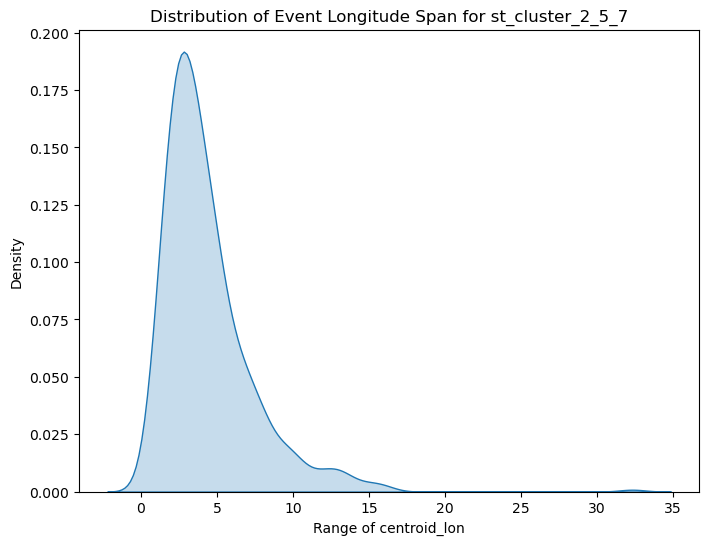


Analyzing st_cluster field: st_cluster_2_5_10


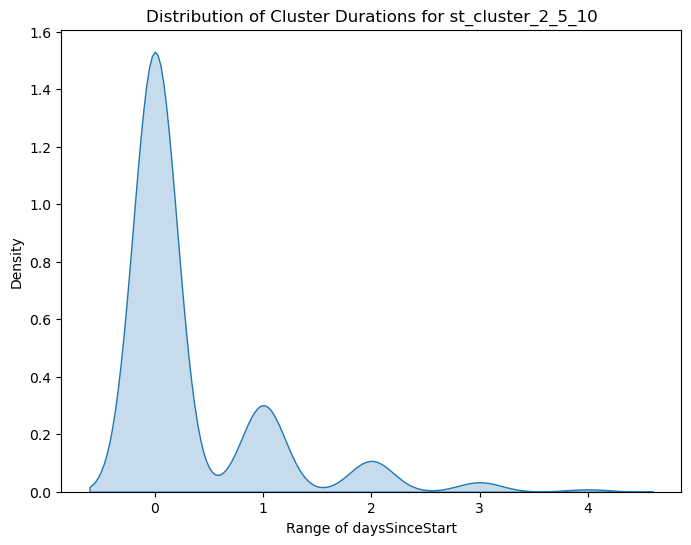

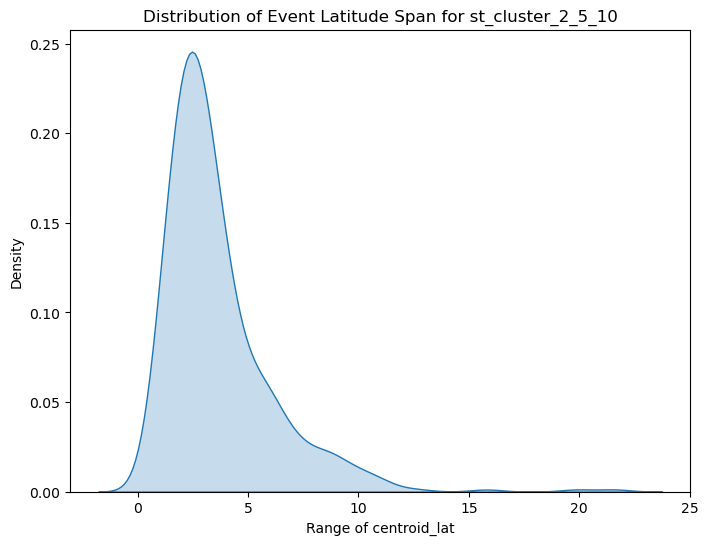

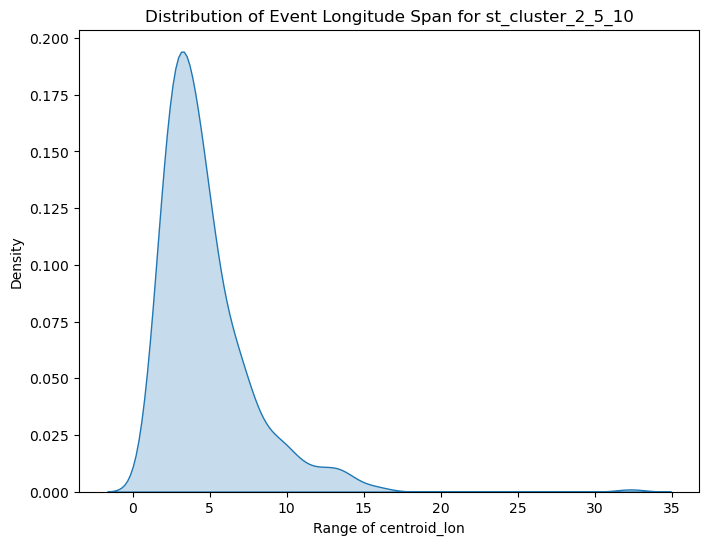


Analyzing st_cluster field: st_cluster_2_7_3


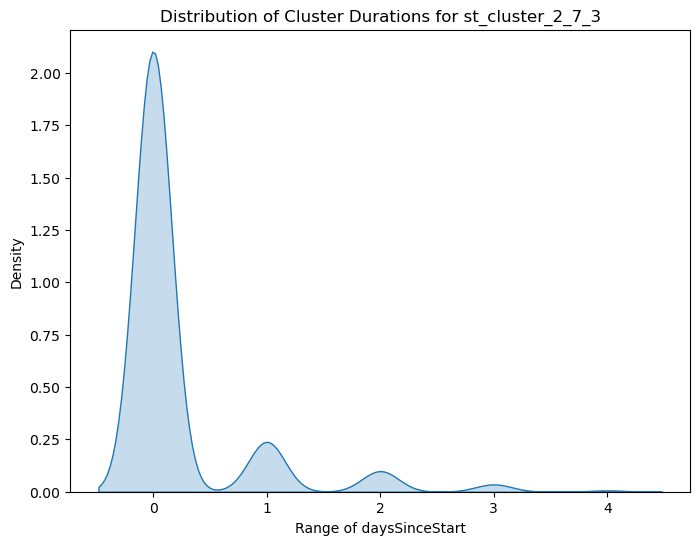

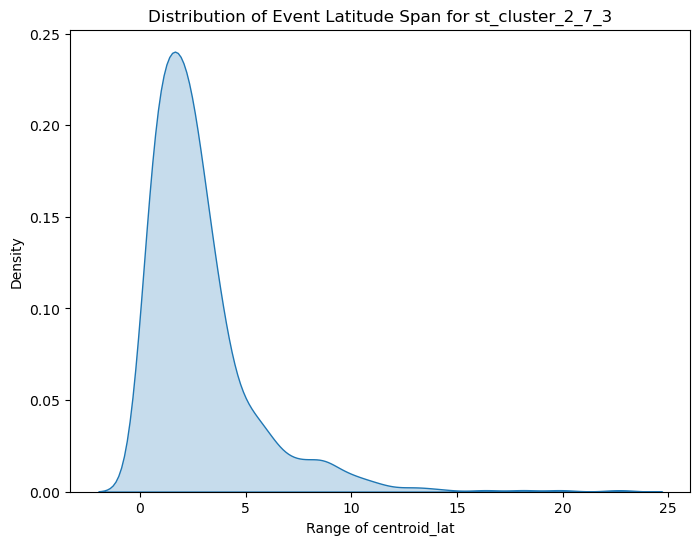

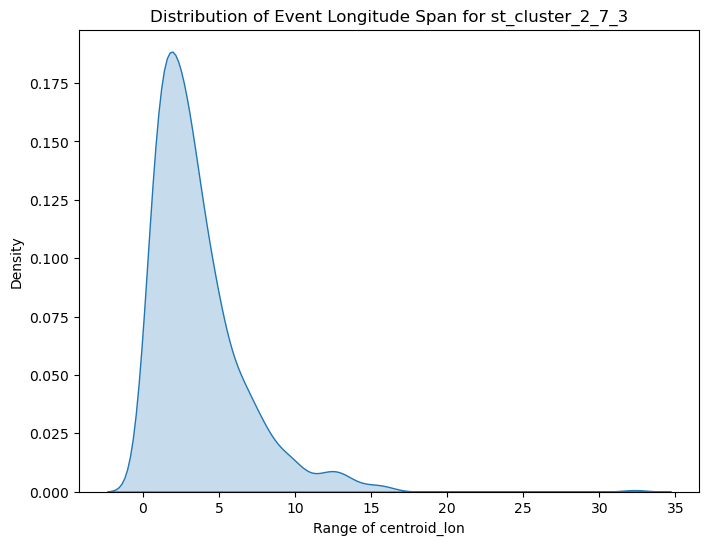


Analyzing st_cluster field: st_cluster_2_7_5


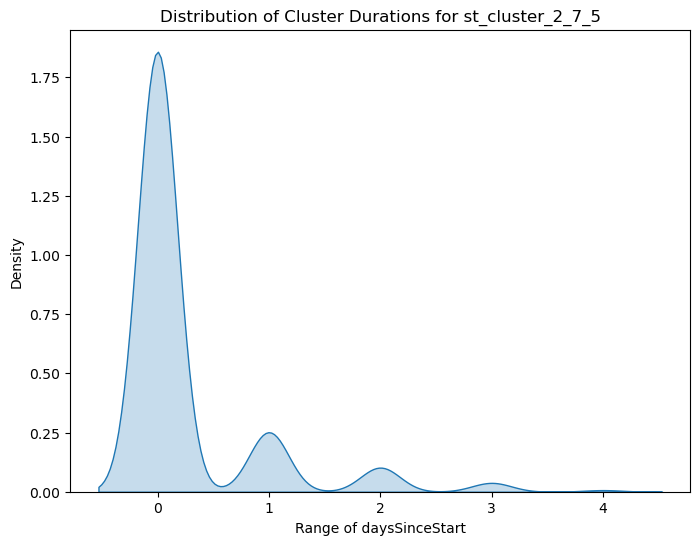

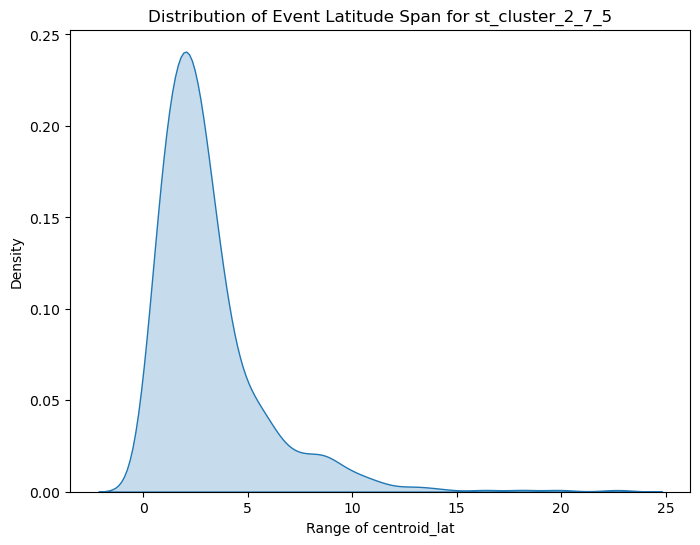

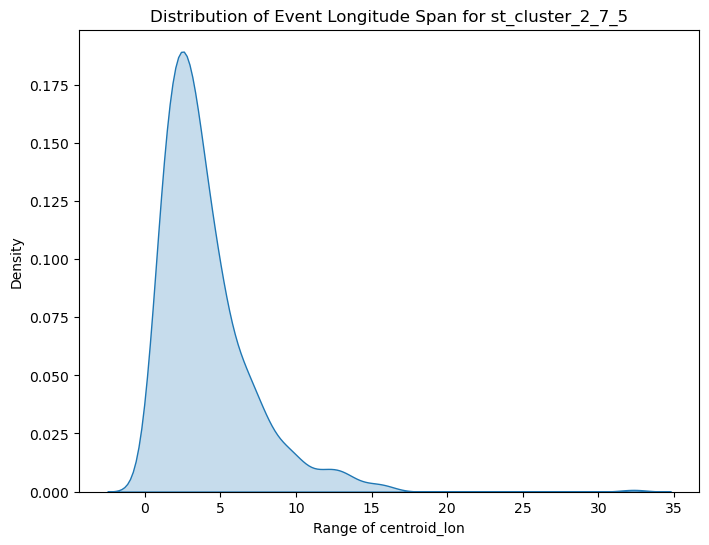


Analyzing st_cluster field: st_cluster_2_7_7


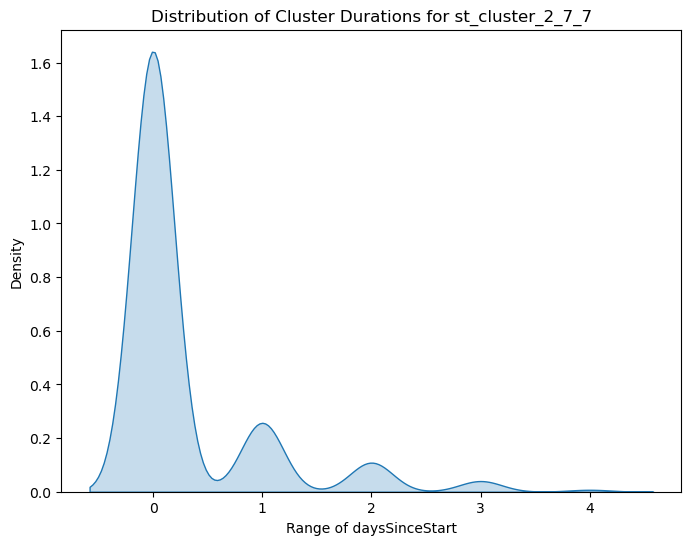

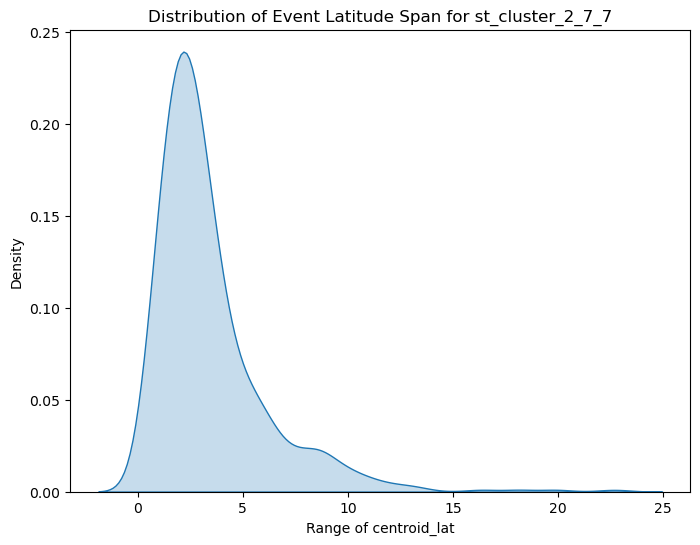

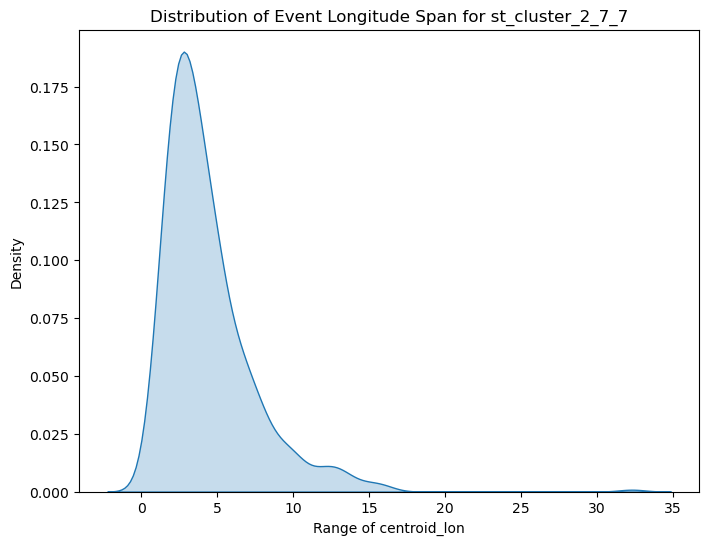


Analyzing st_cluster field: st_cluster_2_7_10


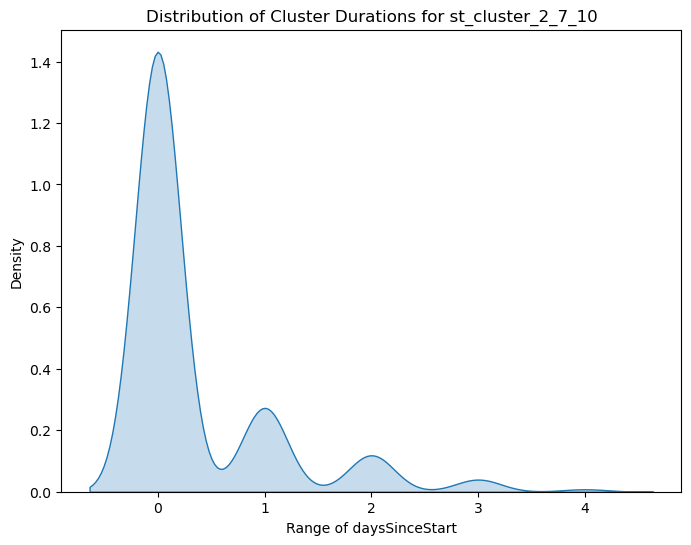

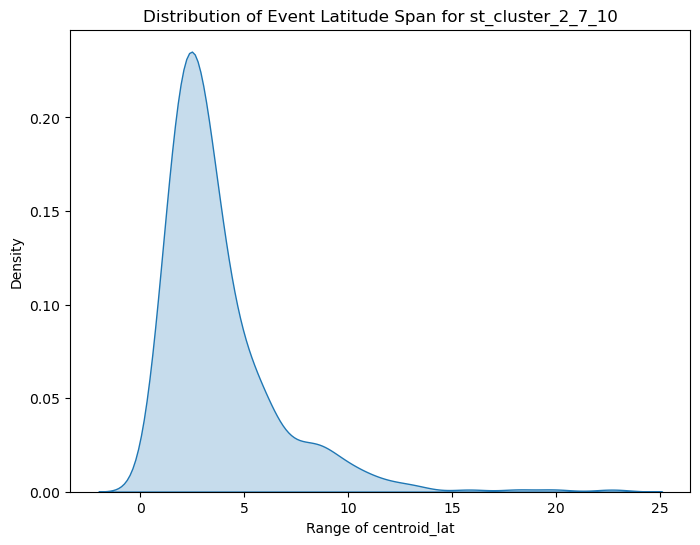

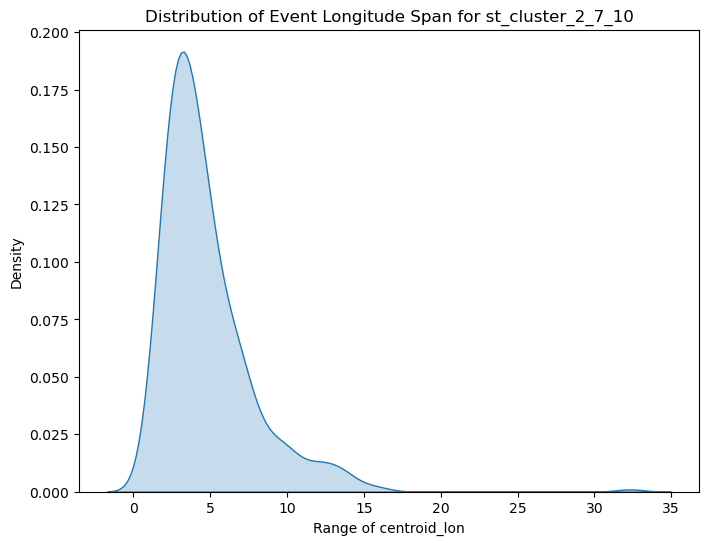


Analyzing st_cluster field: st_cluster_2_14_3


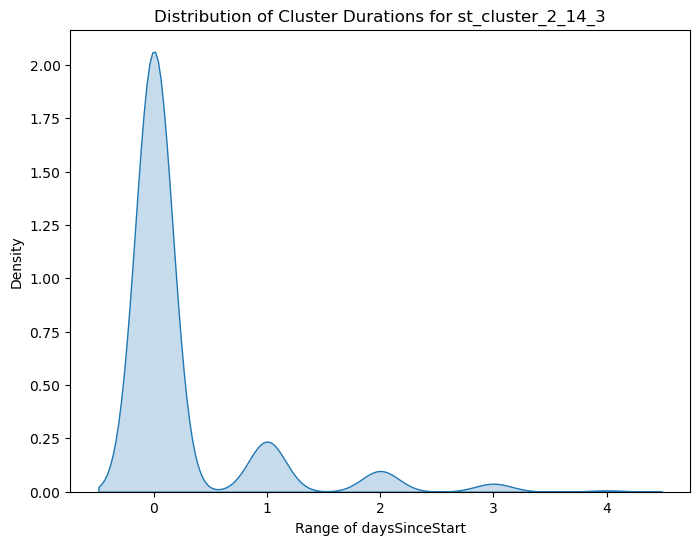

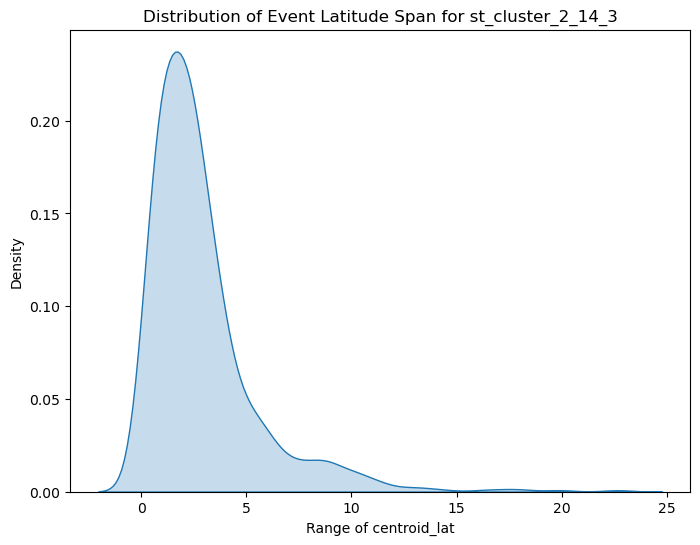

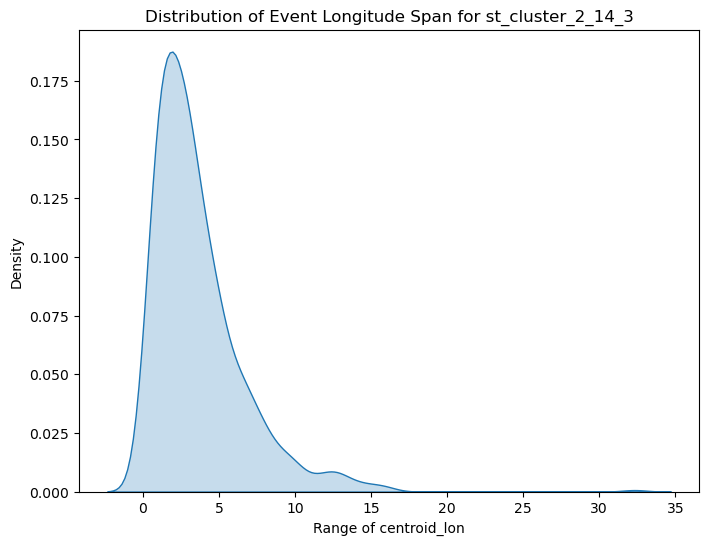


Analyzing st_cluster field: st_cluster_2_14_5


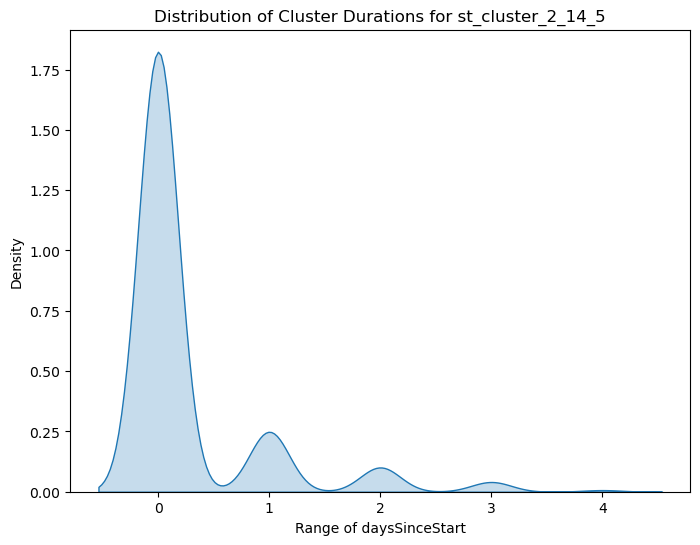

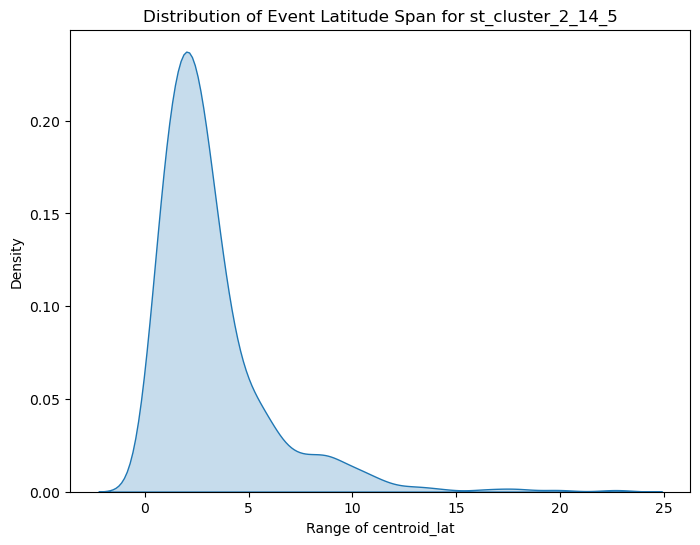

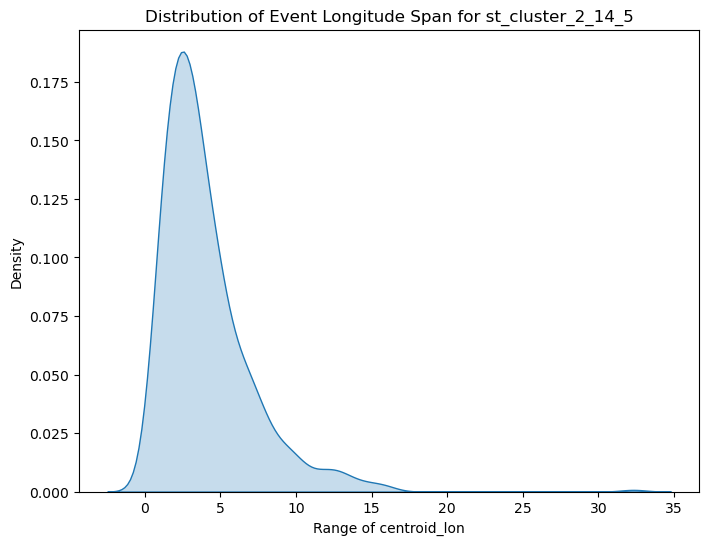


Analyzing st_cluster field: st_cluster_2_14_7


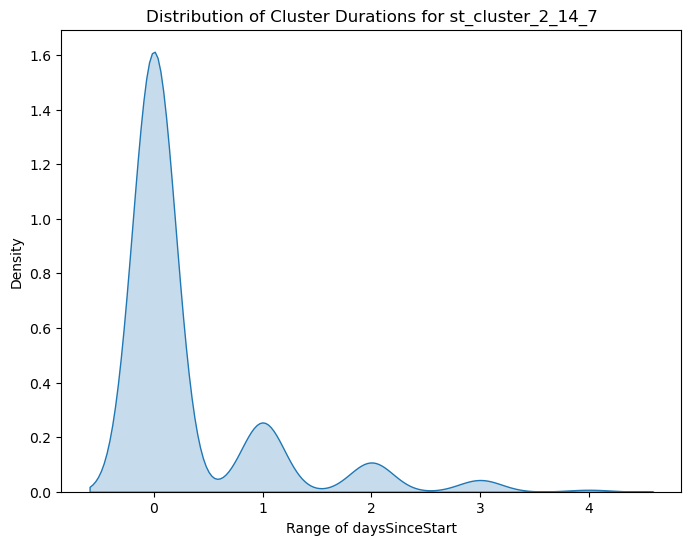

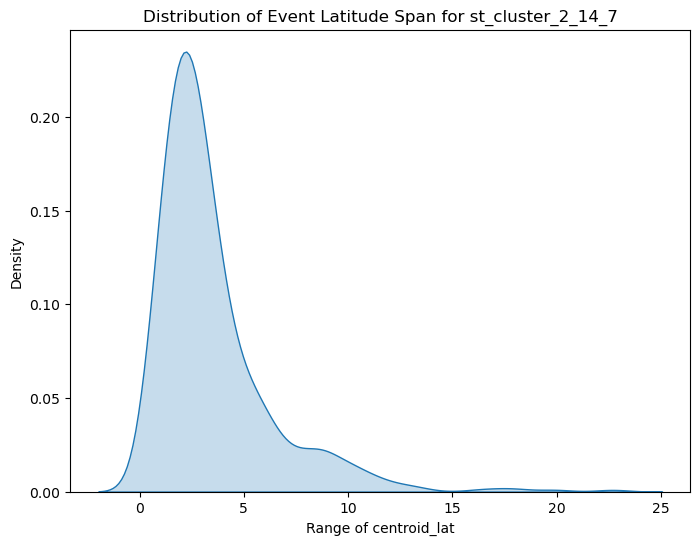

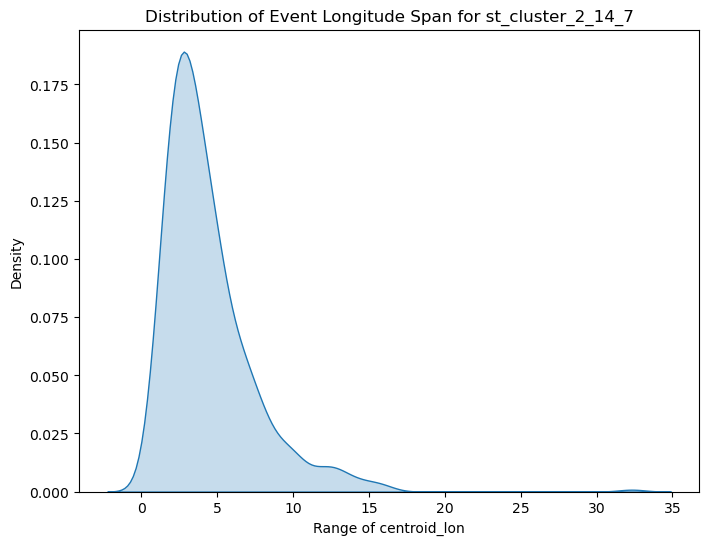


Analyzing st_cluster field: st_cluster_2_14_10


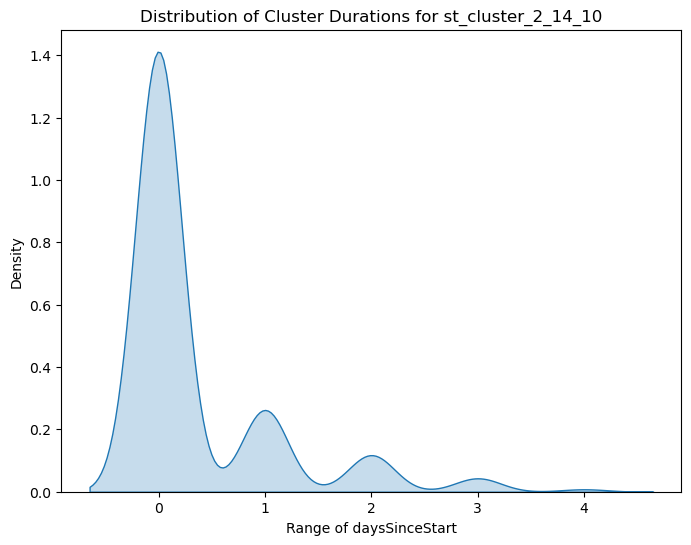

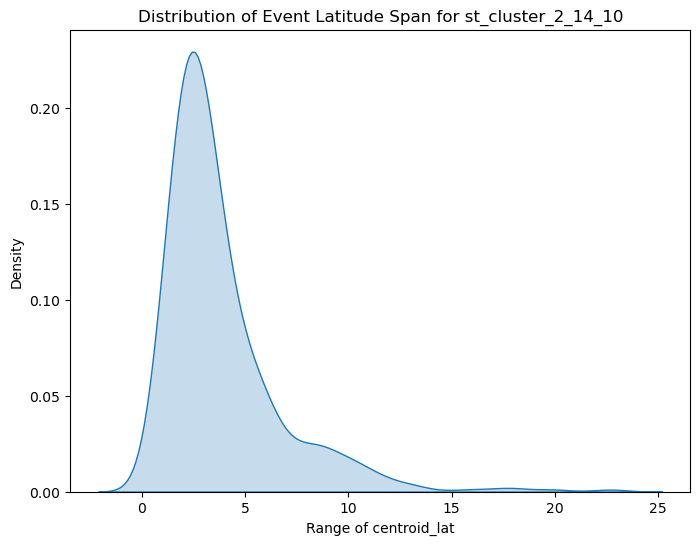

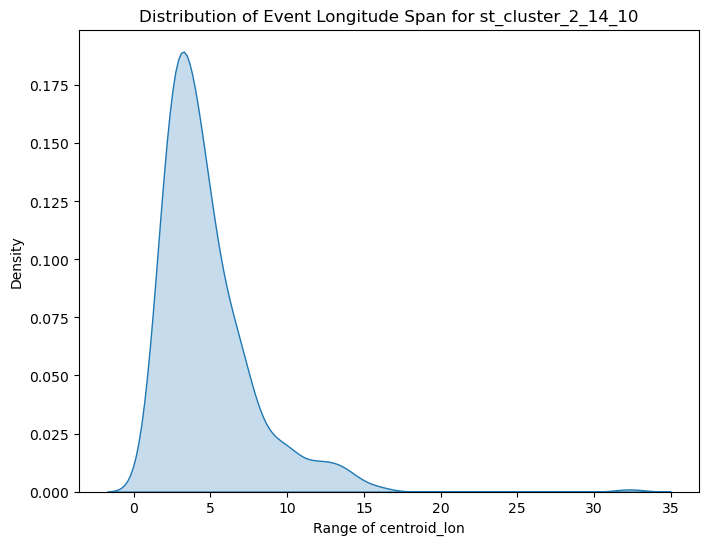


Analyzing st_cluster field: st_cluster_2_30_3


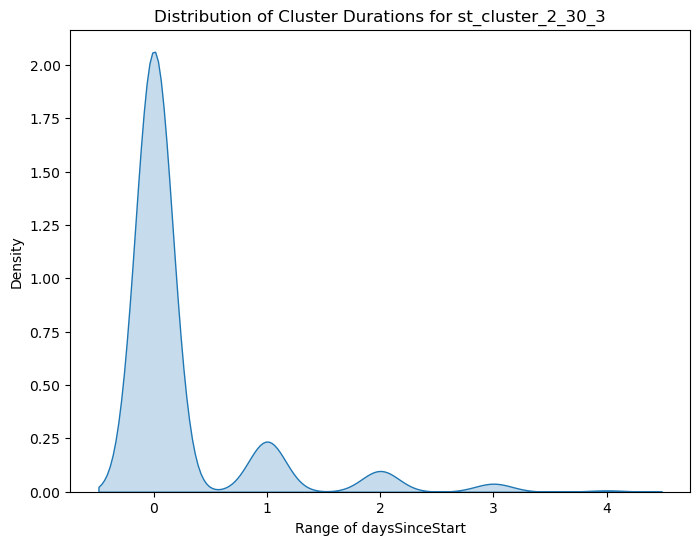

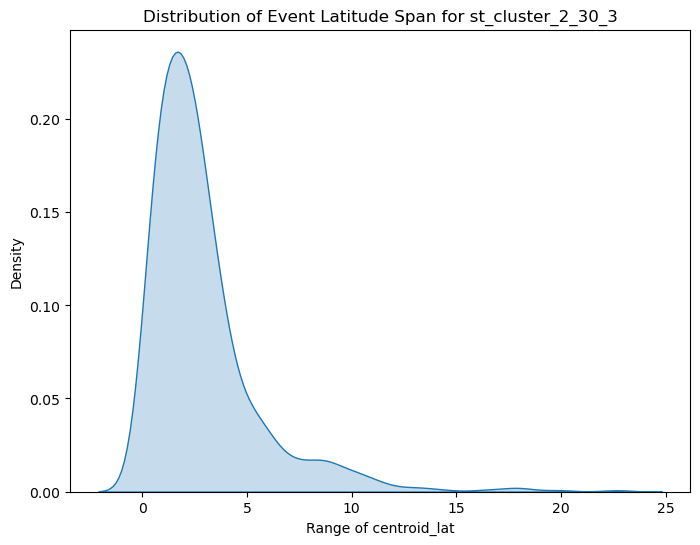

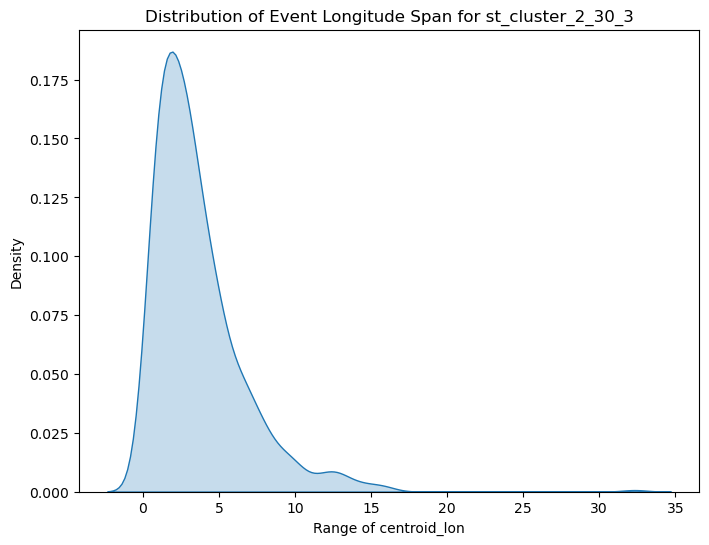


Analyzing st_cluster field: st_cluster_2_30_5


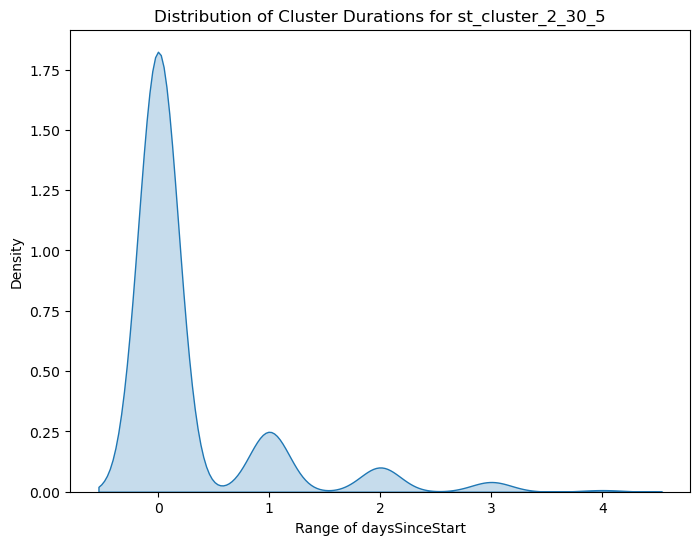

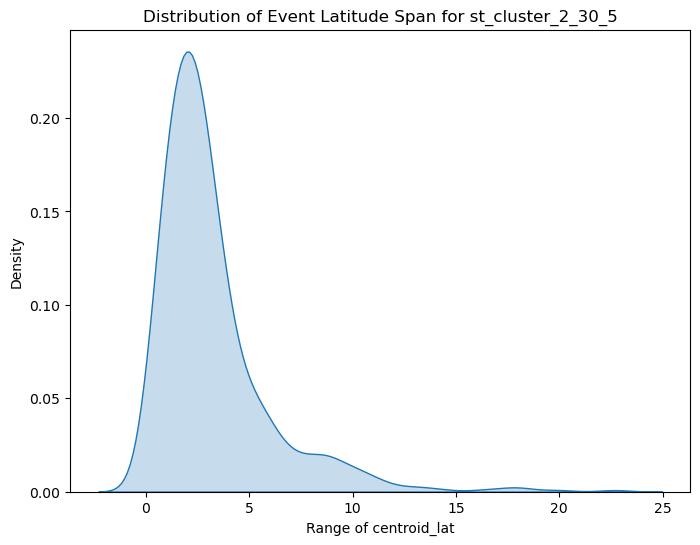

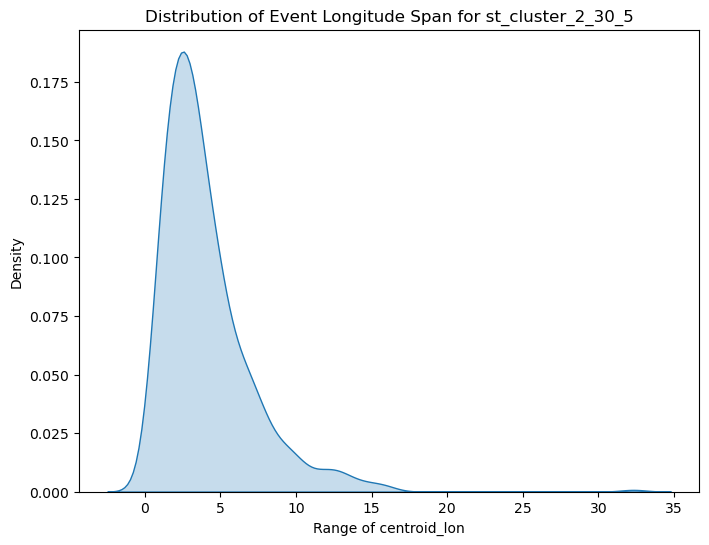


Analyzing st_cluster field: st_cluster_2_30_7


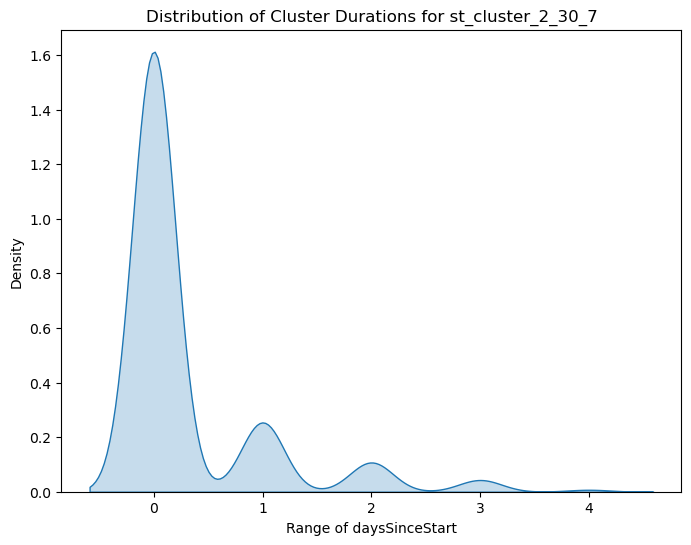

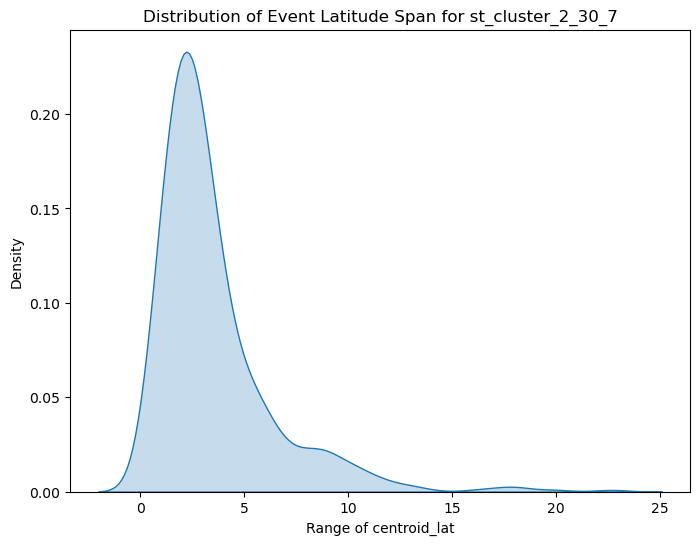

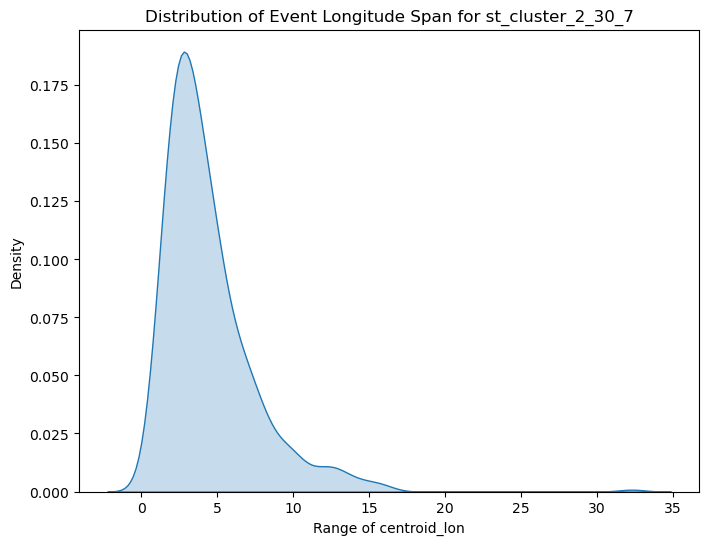


Analyzing st_cluster field: st_cluster_2_30_10


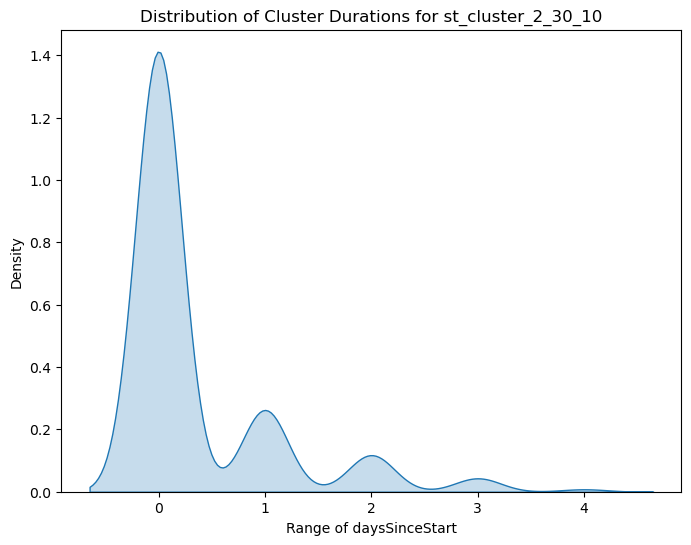

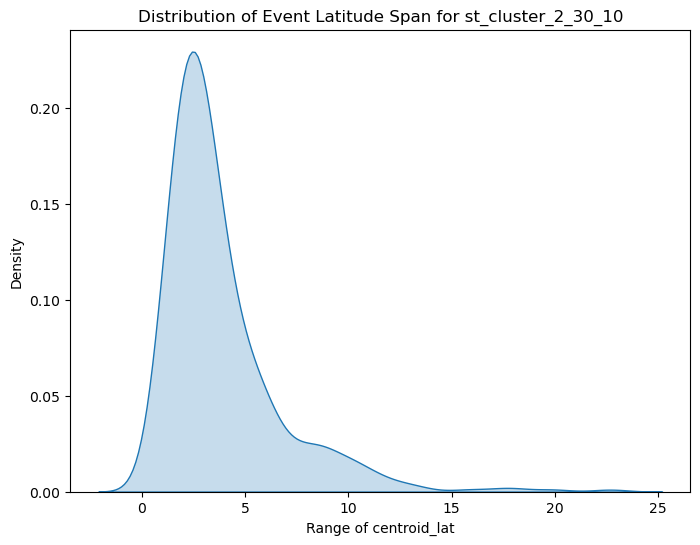

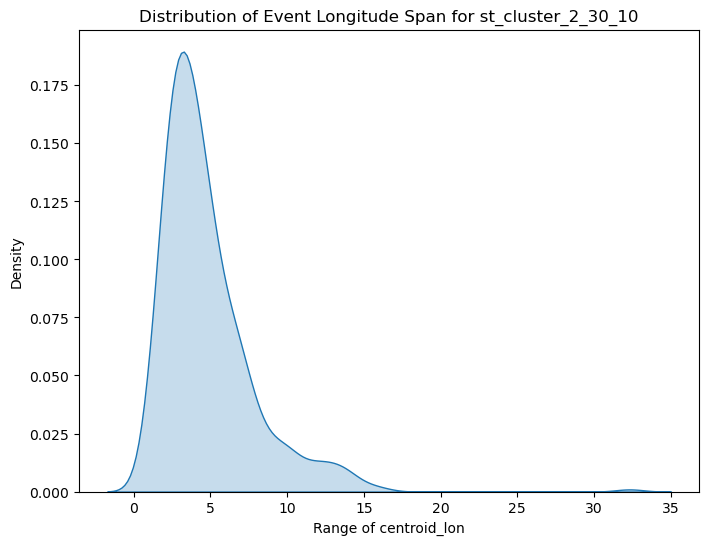


Analyzing st_cluster field: st_cluster_3_1_3


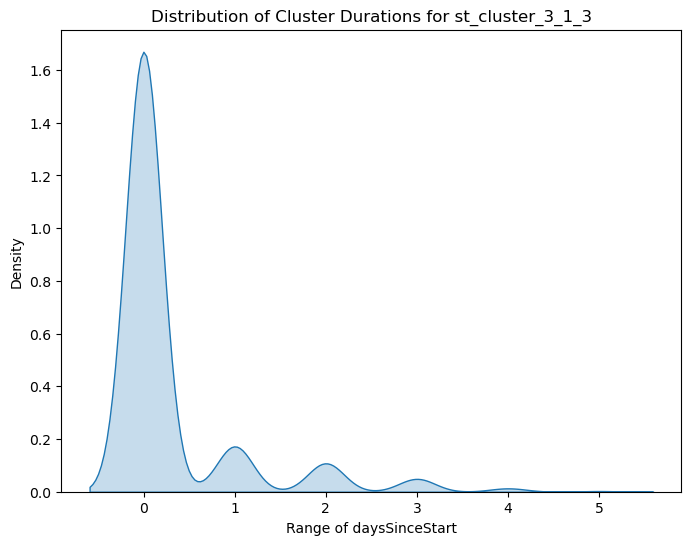

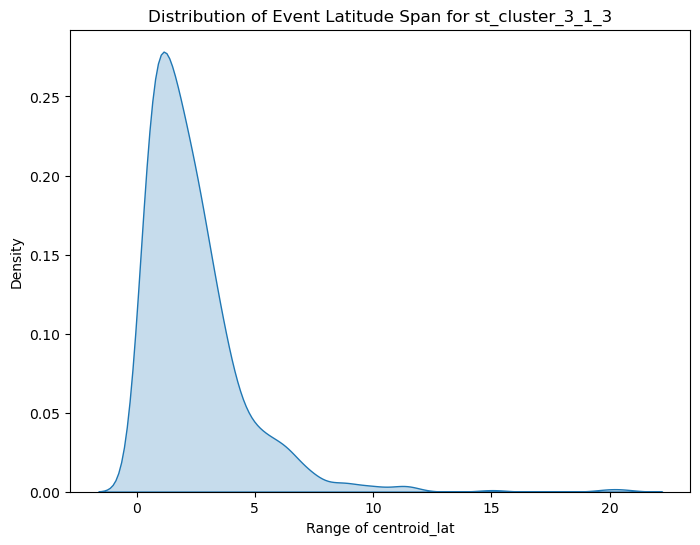

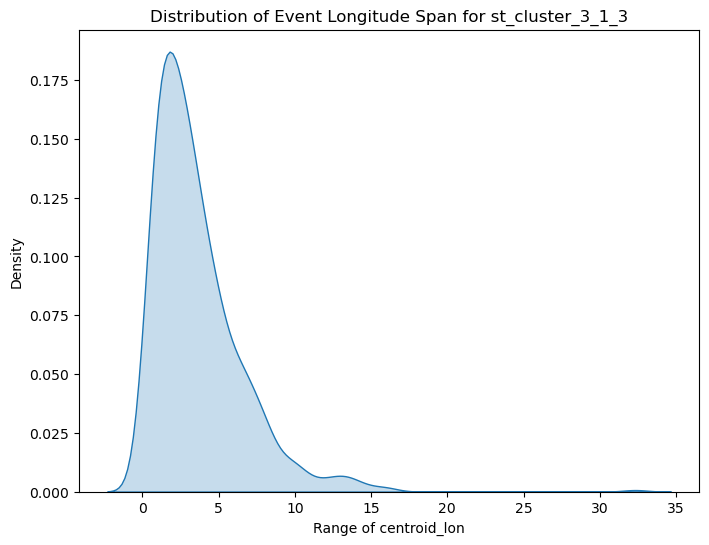


Analyzing st_cluster field: st_cluster_3_1_5


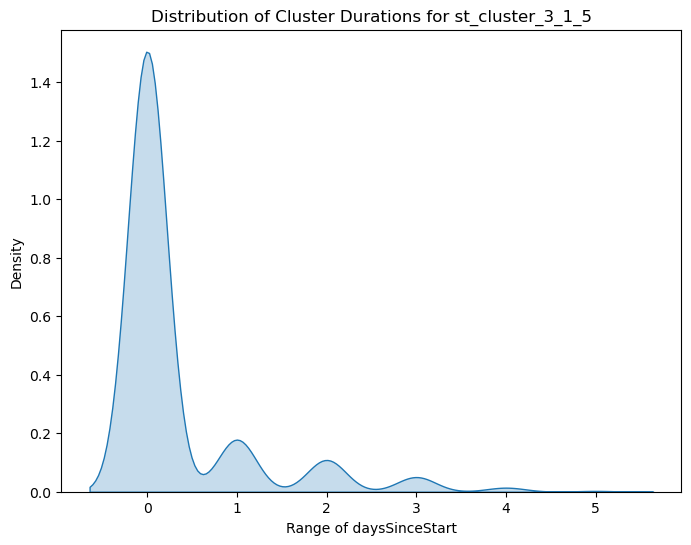

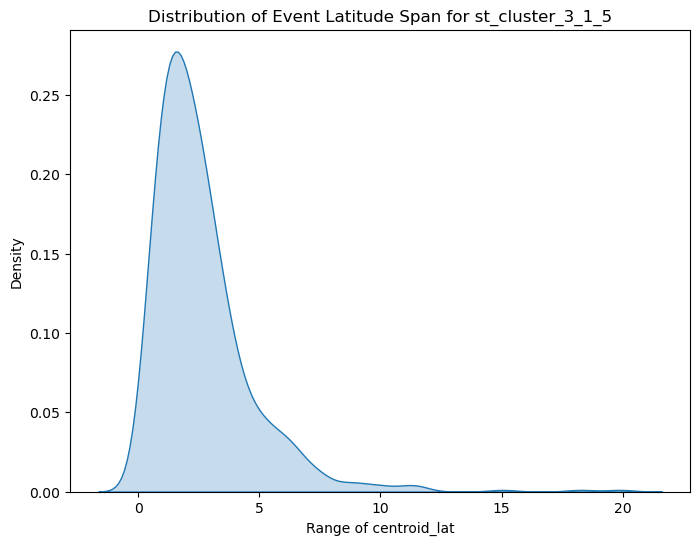

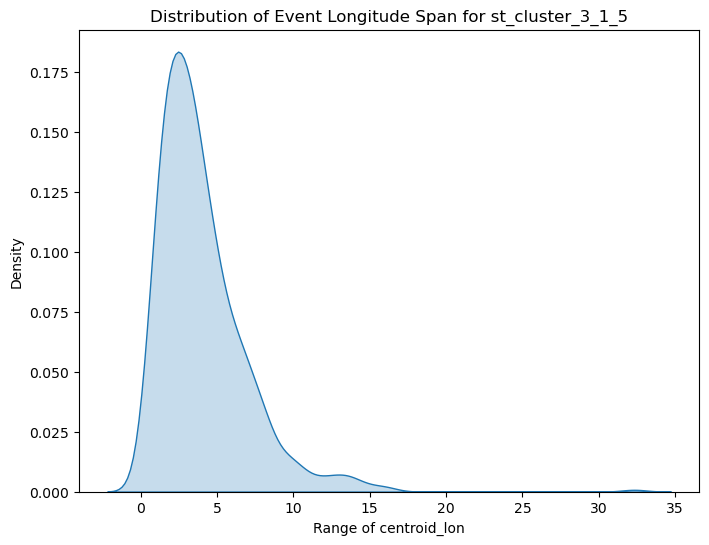


Analyzing st_cluster field: st_cluster_3_1_7


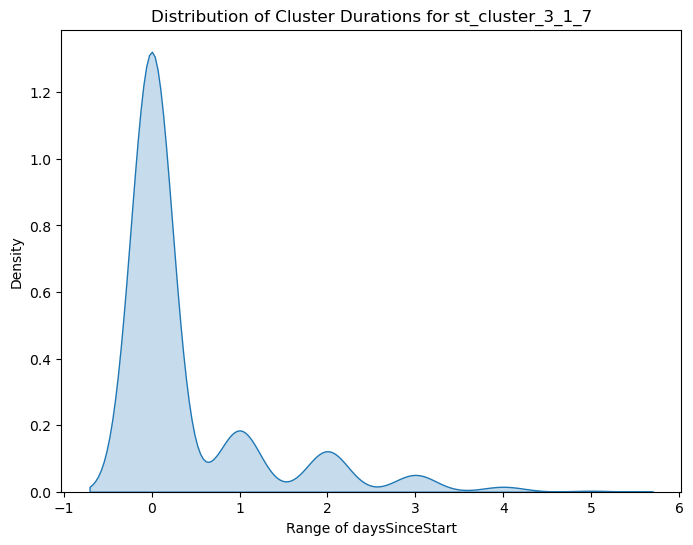

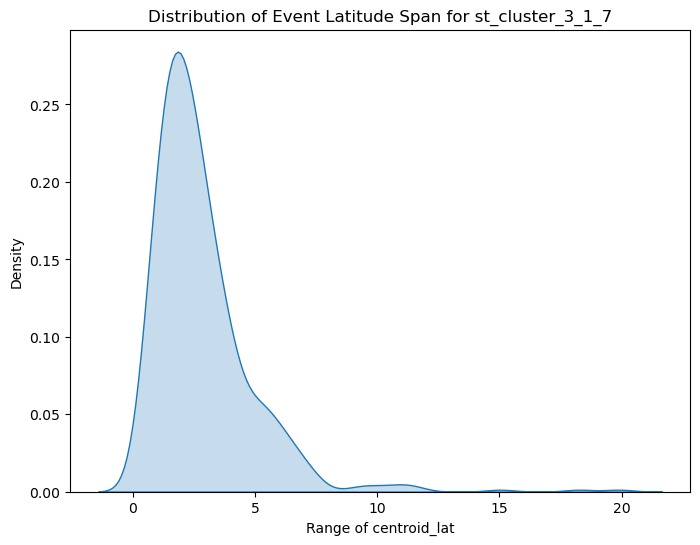

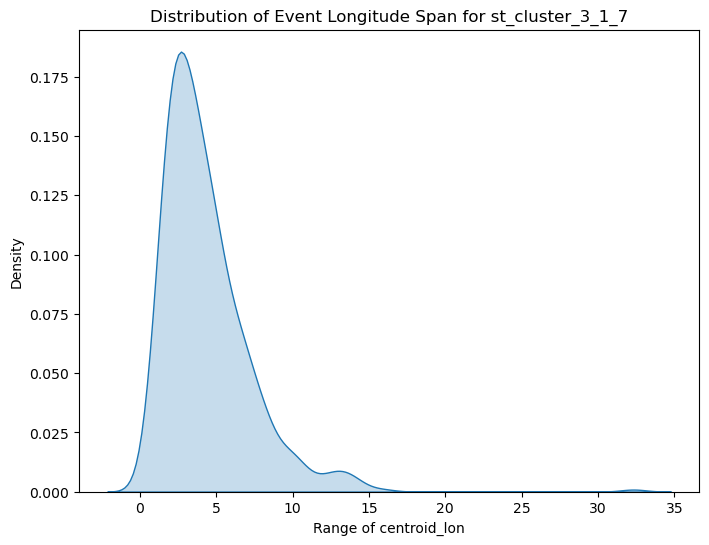


Analyzing st_cluster field: st_cluster_3_1_10


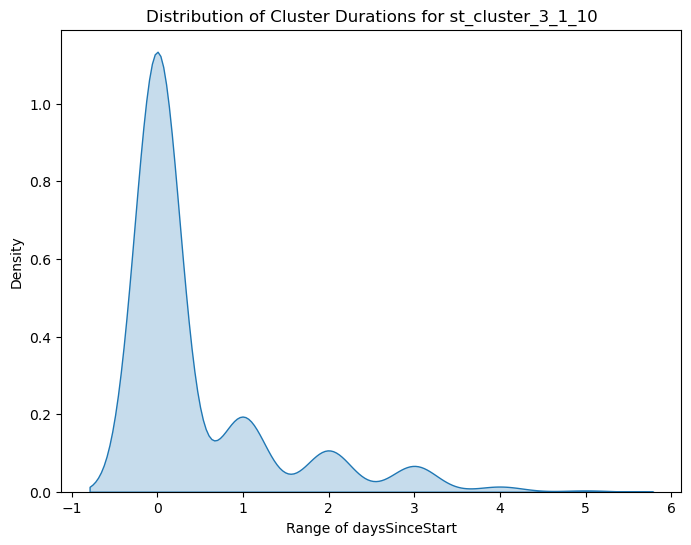

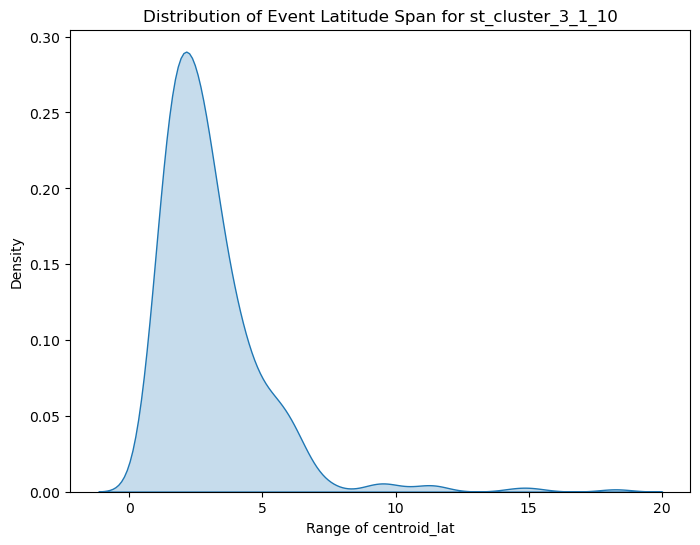

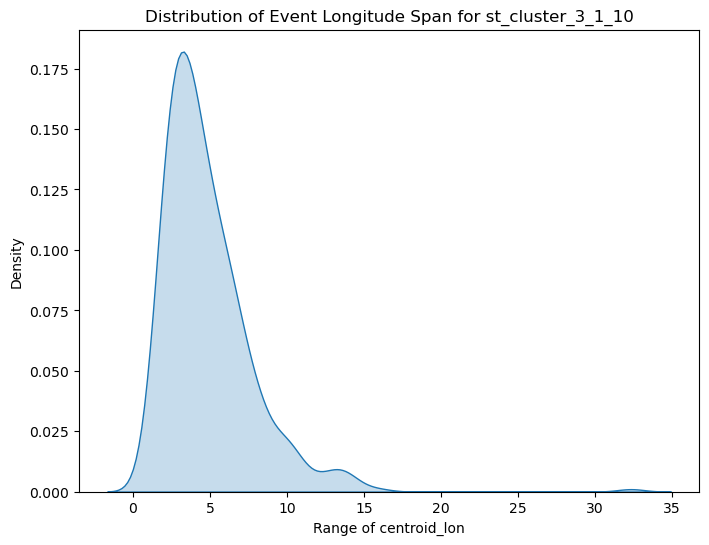


Analyzing st_cluster field: st_cluster_3_3_3


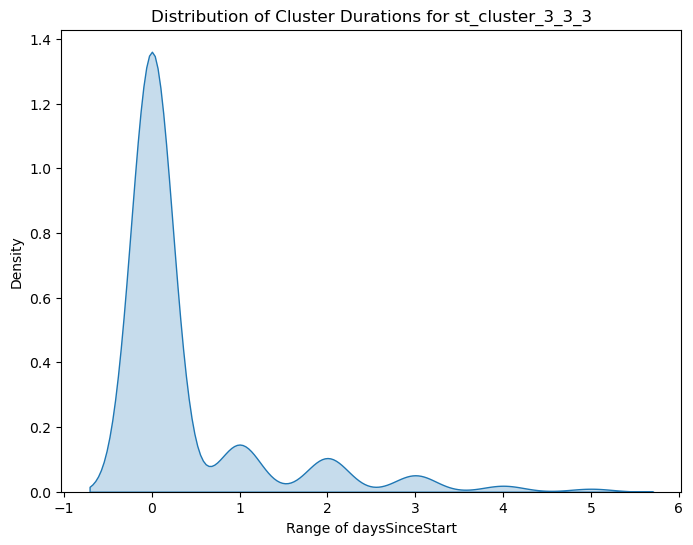

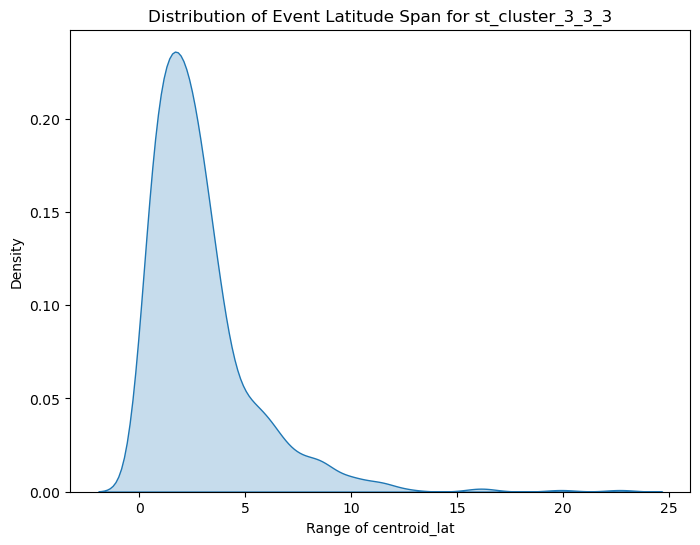

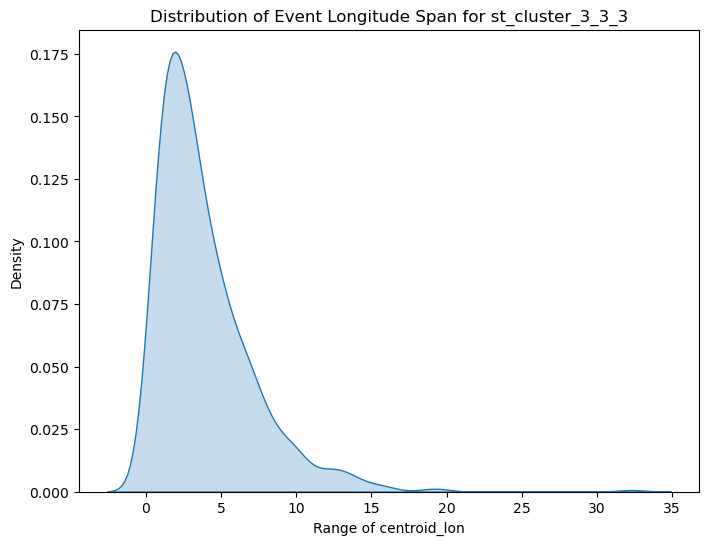


Analyzing st_cluster field: st_cluster_3_3_5


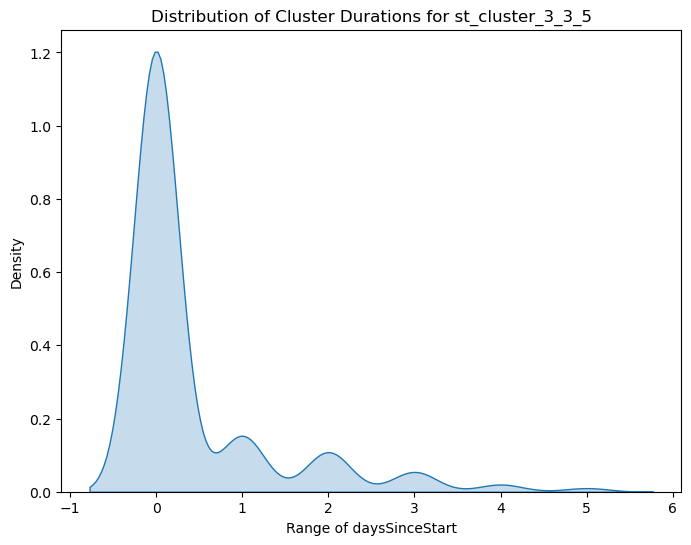

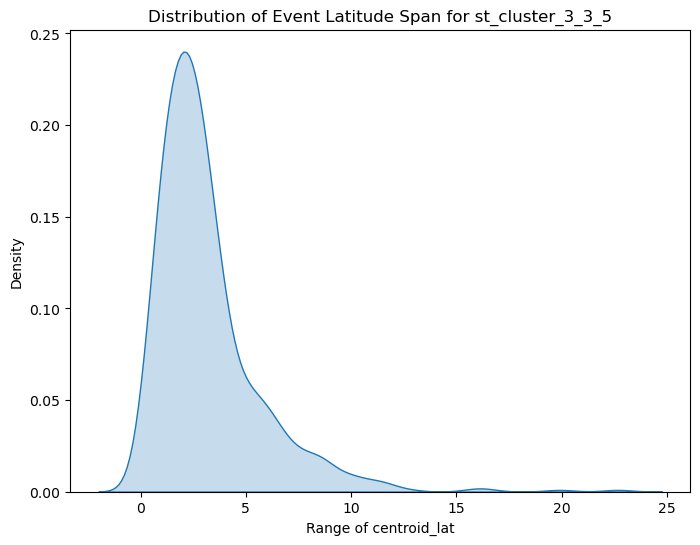

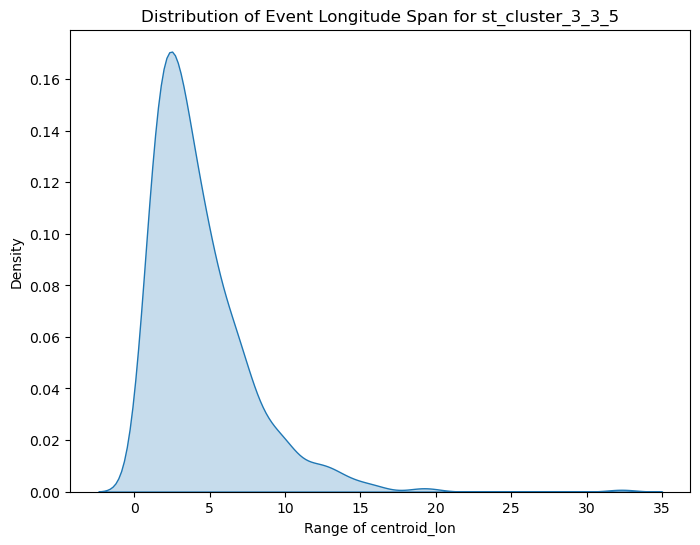


Analyzing st_cluster field: st_cluster_3_3_7


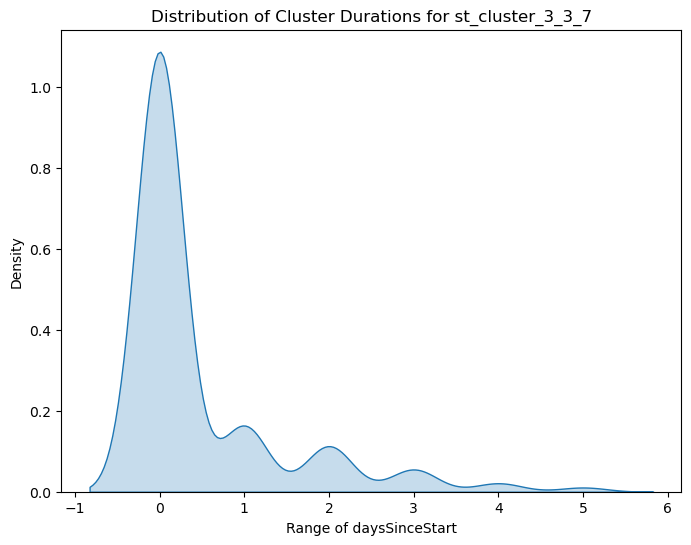

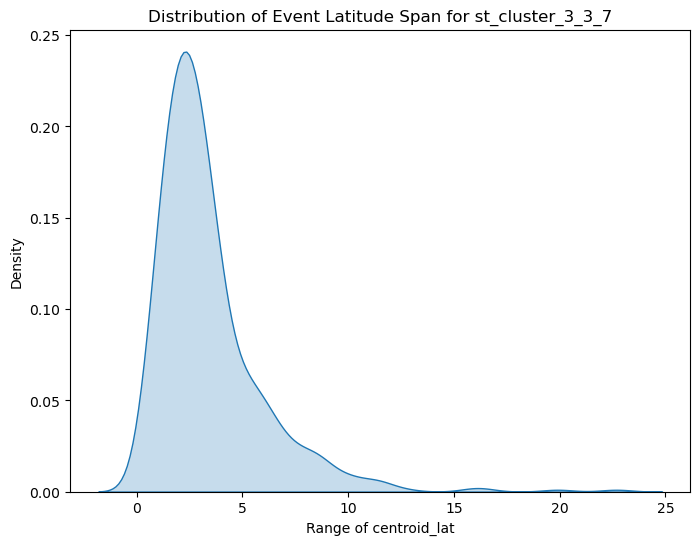

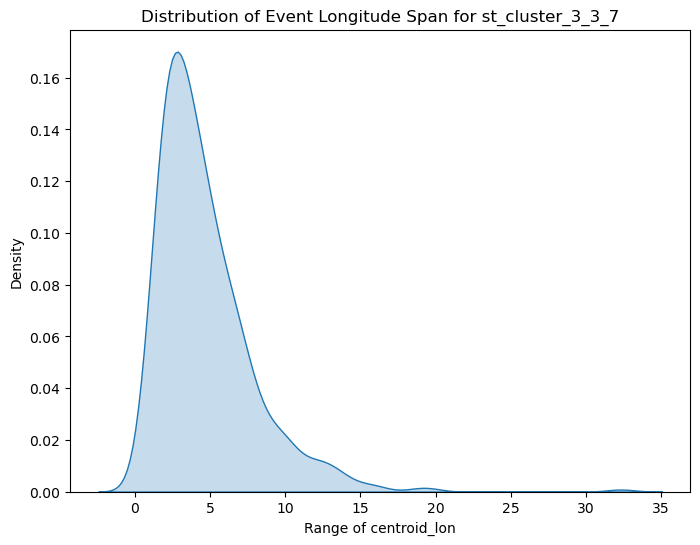


Analyzing st_cluster field: st_cluster_3_3_10


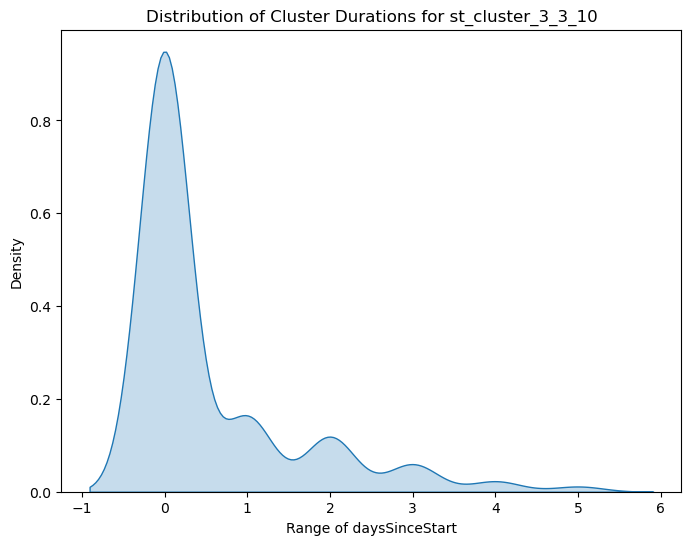

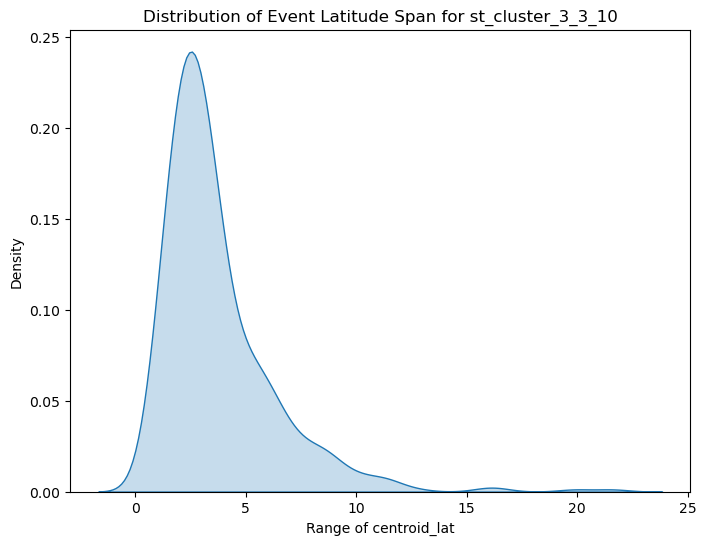

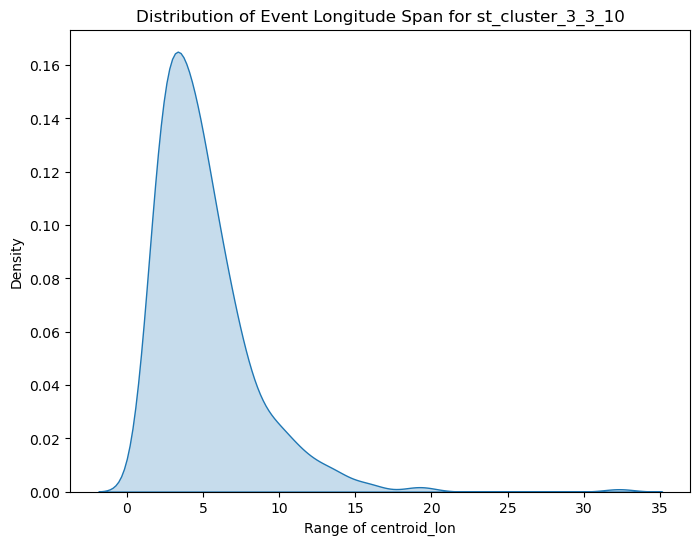


Analyzing st_cluster field: st_cluster_3_5_3


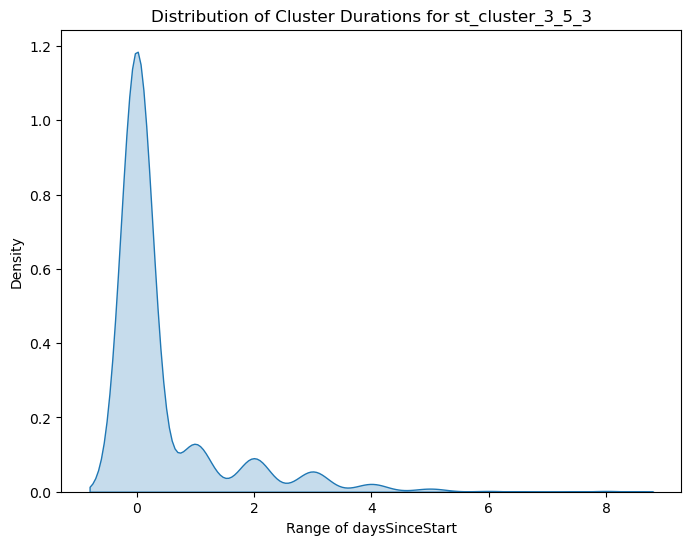

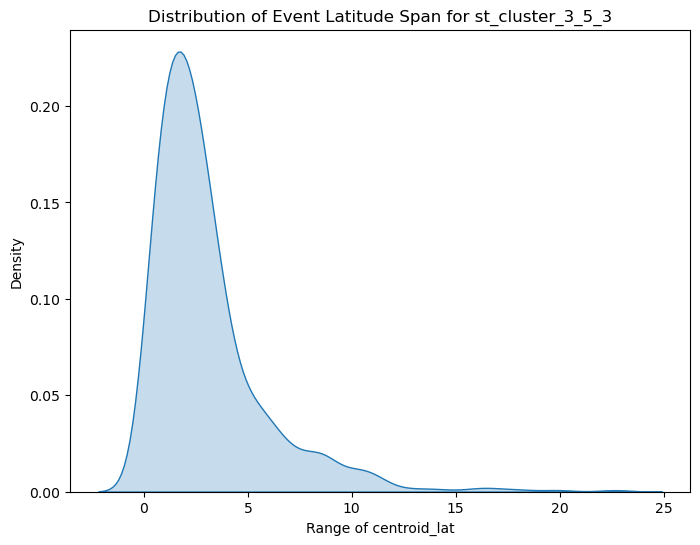

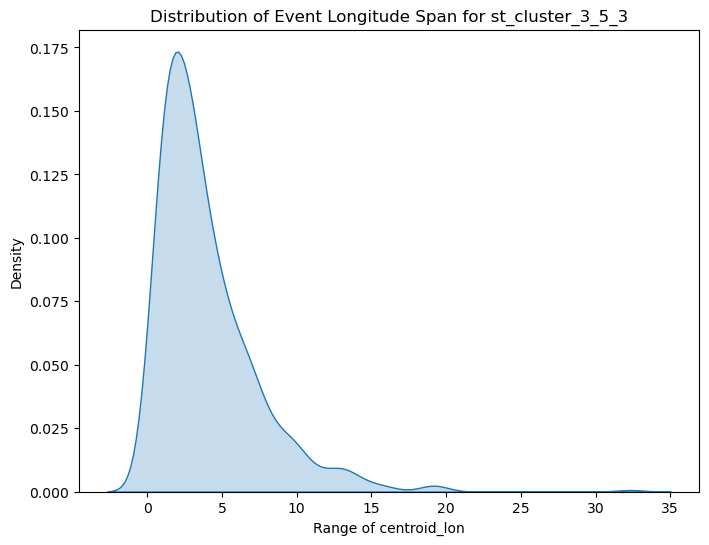


Analyzing st_cluster field: st_cluster_3_5_5


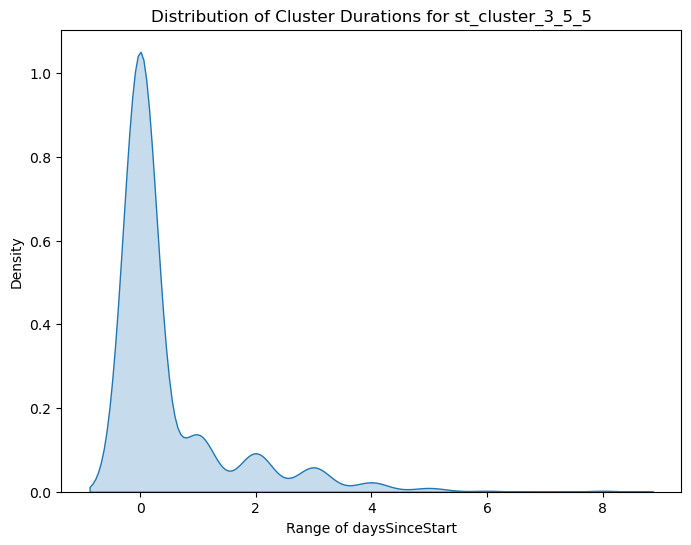

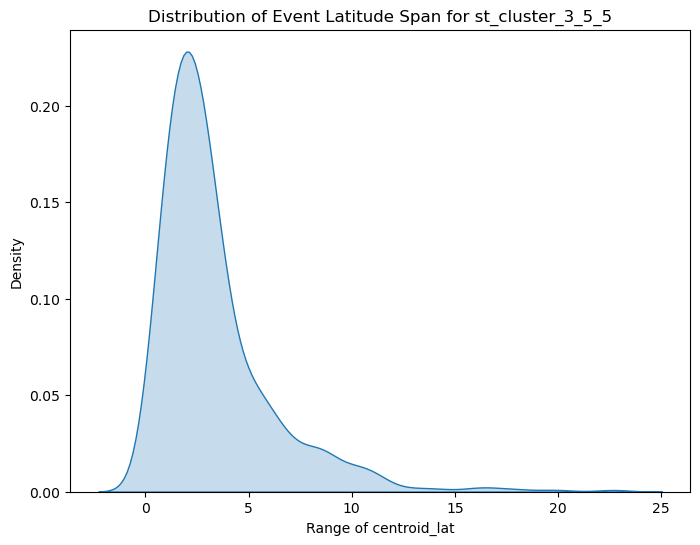

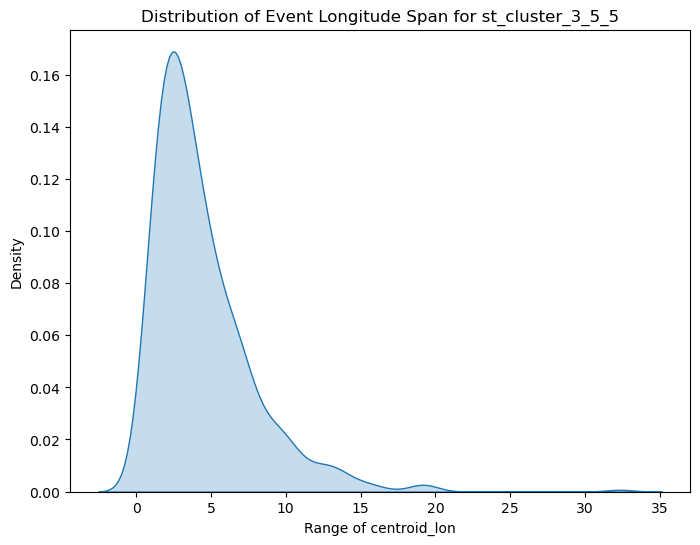


Analyzing st_cluster field: st_cluster_3_5_7


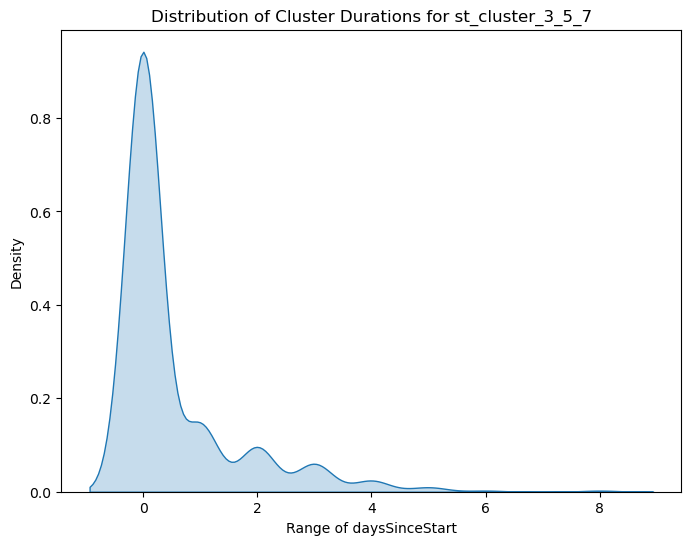

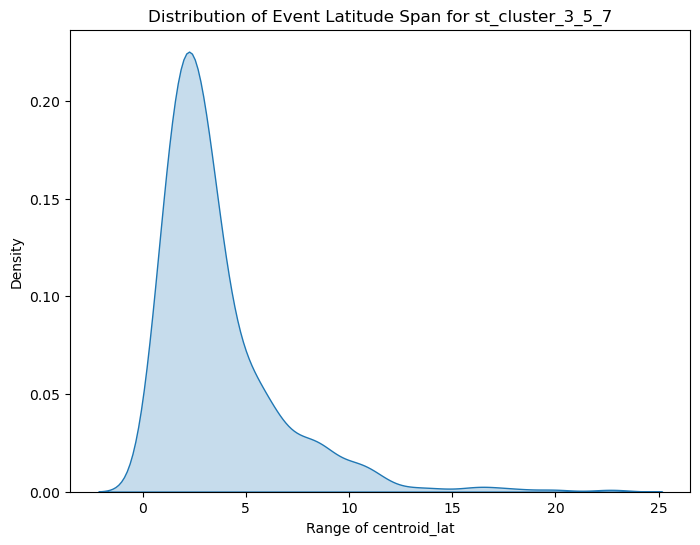

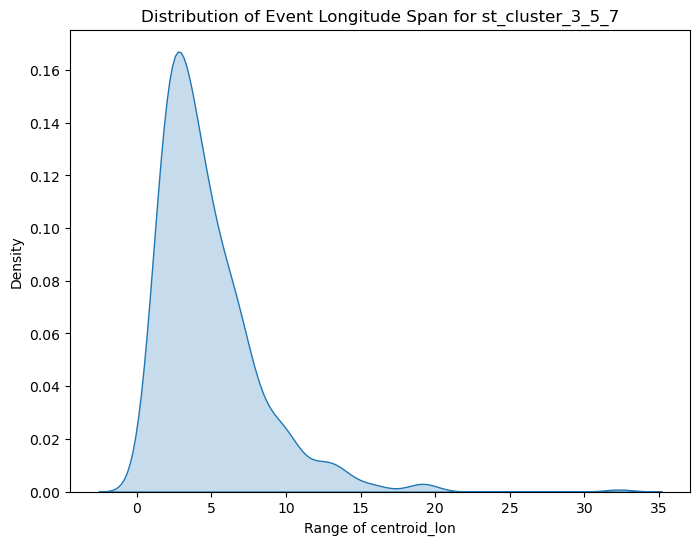


Analyzing st_cluster field: st_cluster_3_5_10


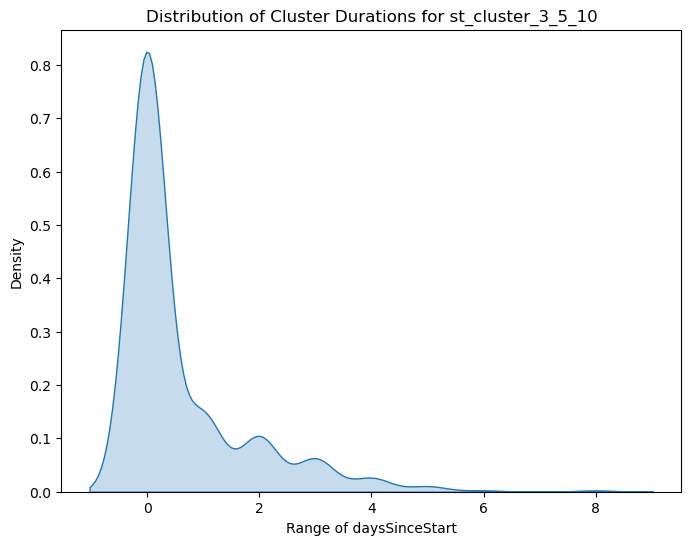

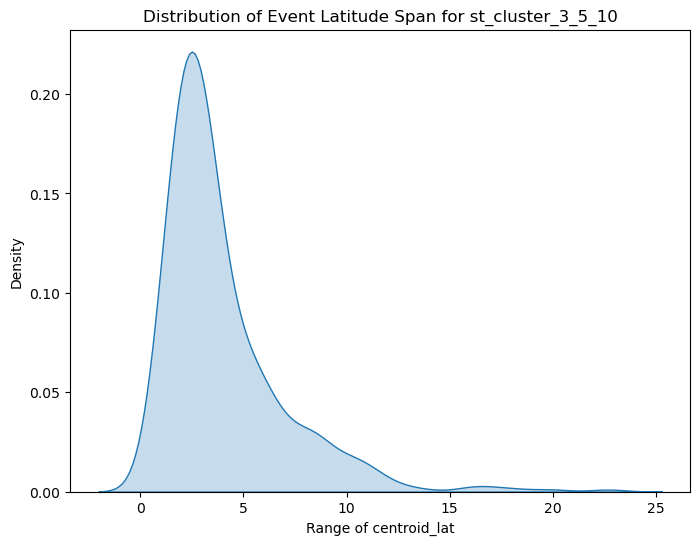

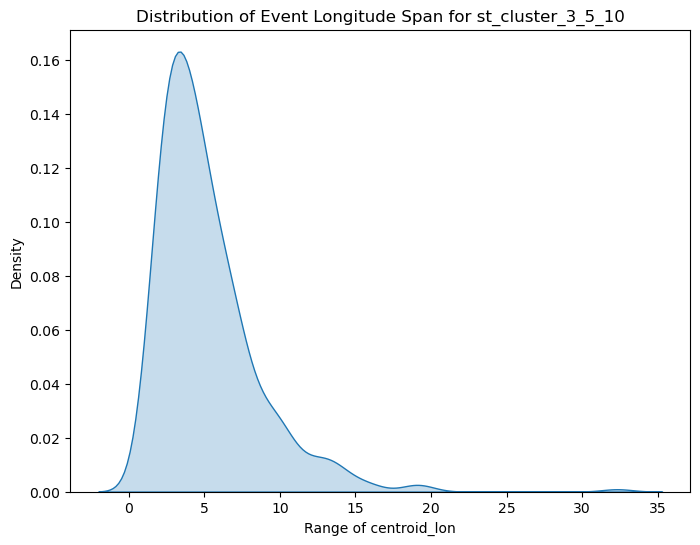


Analyzing st_cluster field: st_cluster_3_7_3


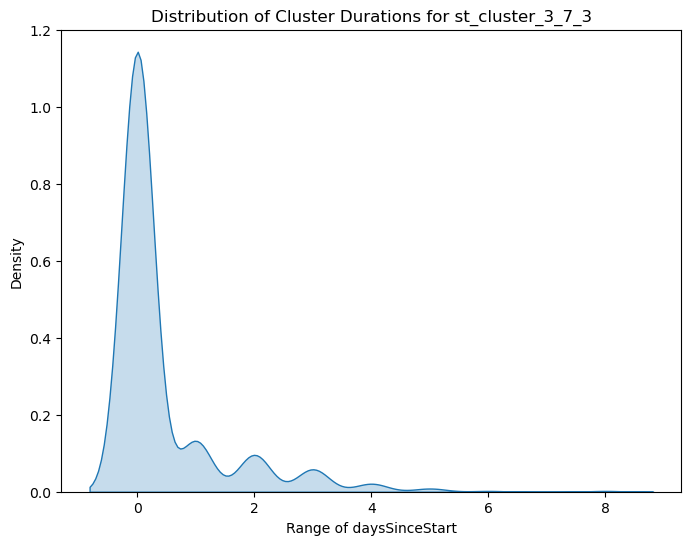

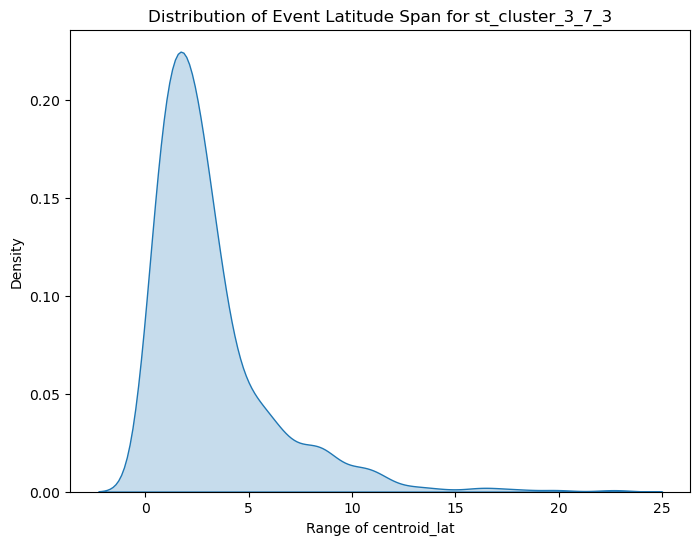

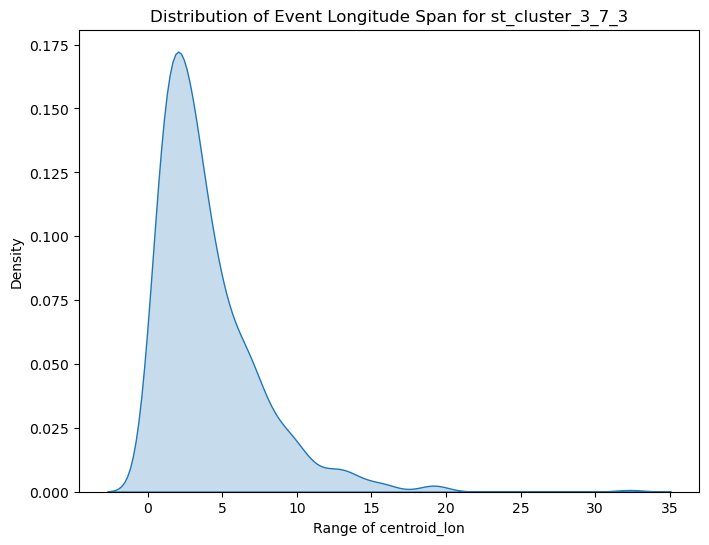


Analyzing st_cluster field: st_cluster_3_7_5


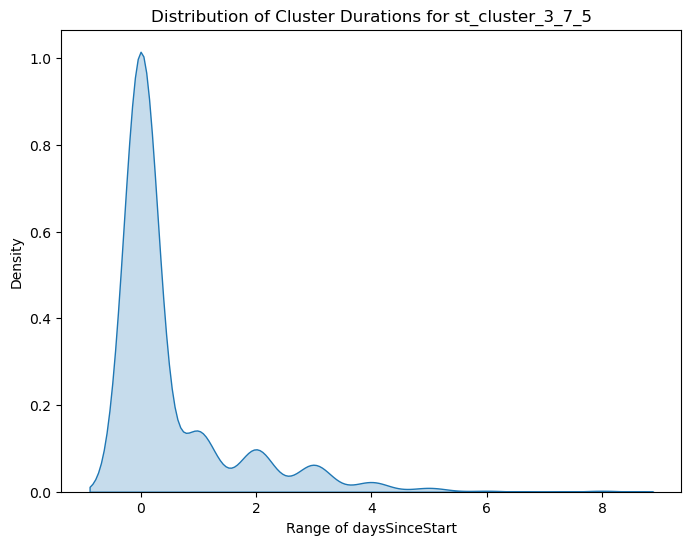

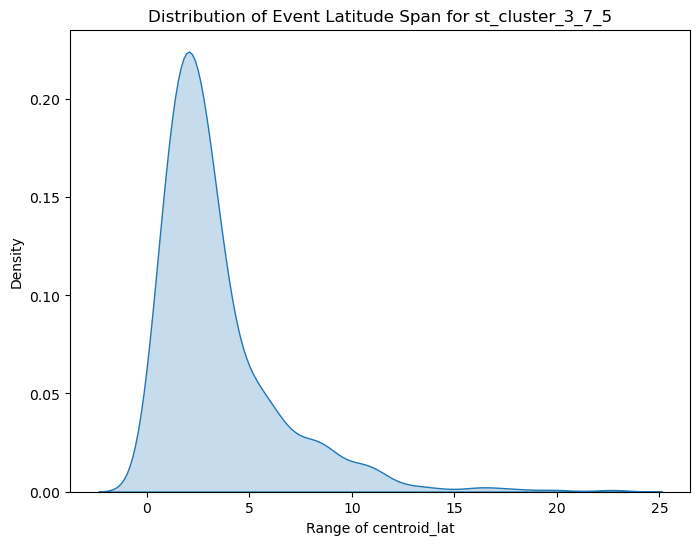

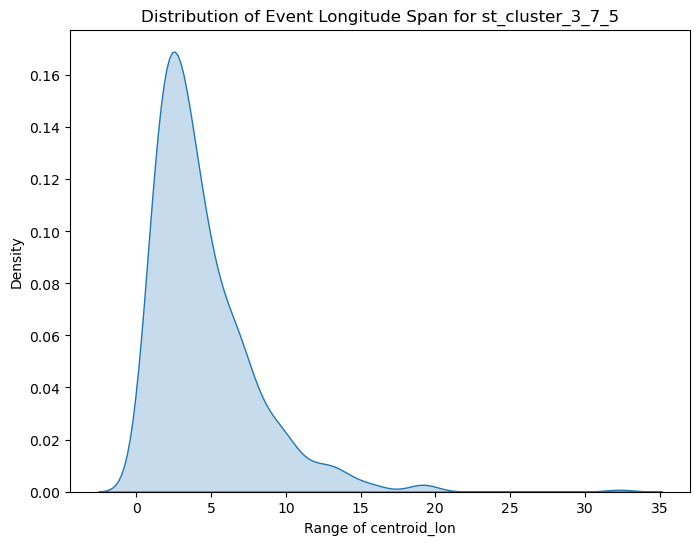


Analyzing st_cluster field: st_cluster_3_7_7


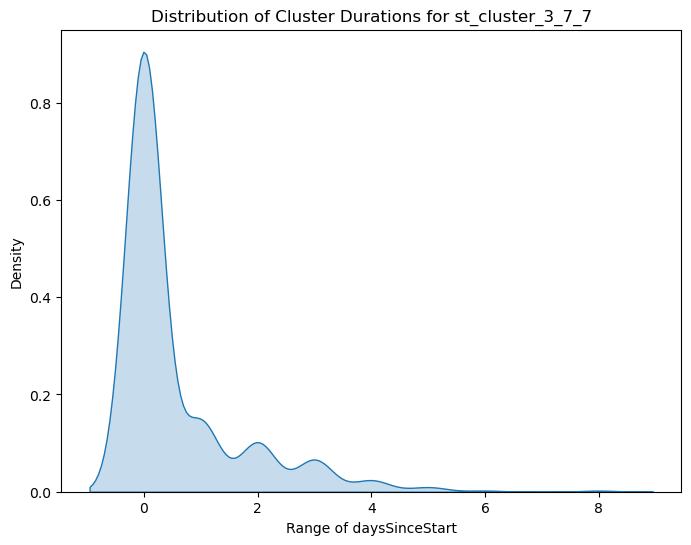

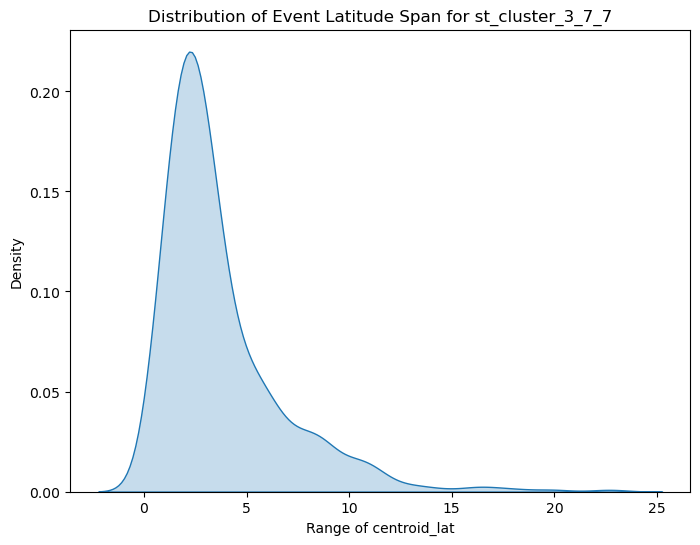

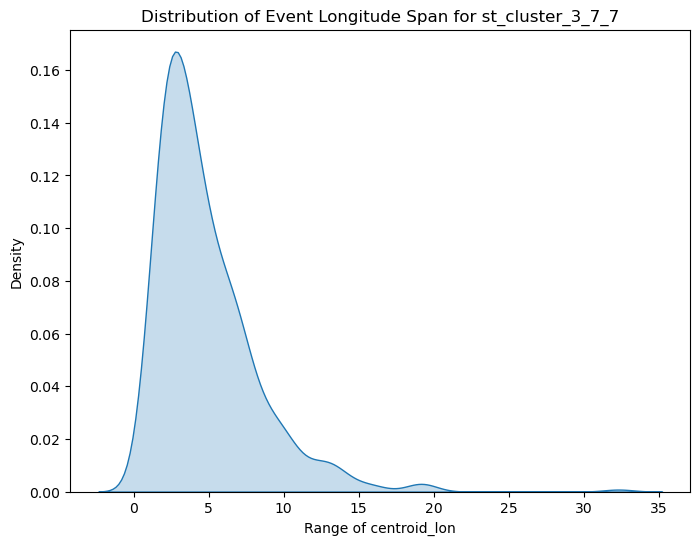


Analyzing st_cluster field: st_cluster_3_7_10


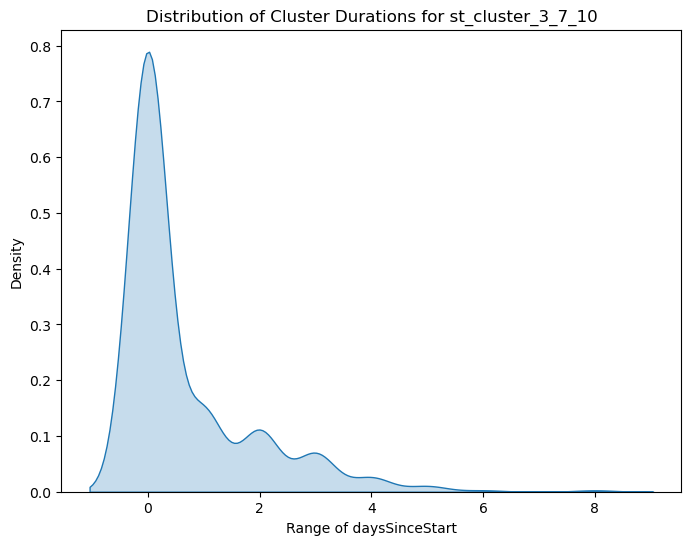

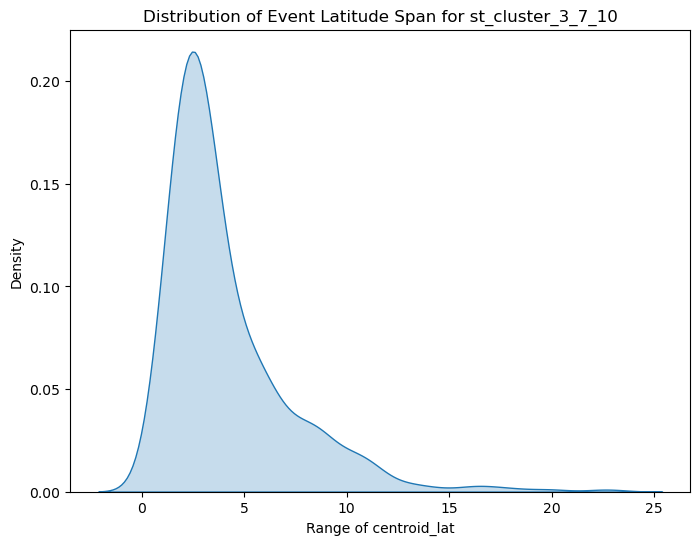

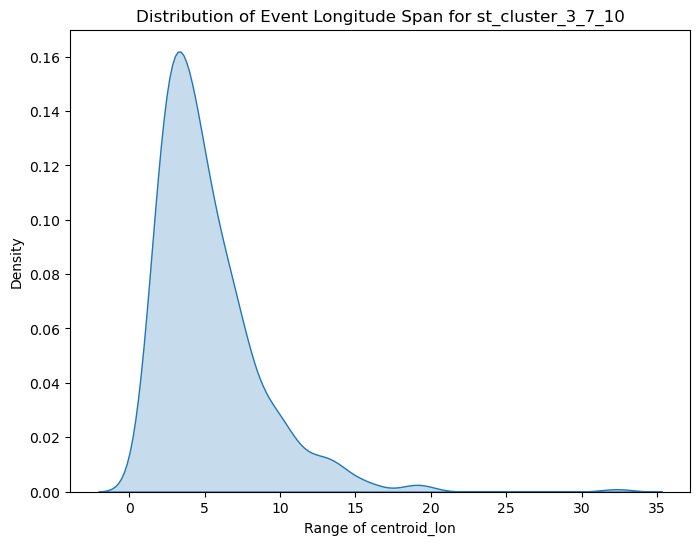


Analyzing st_cluster field: st_cluster_3_14_3


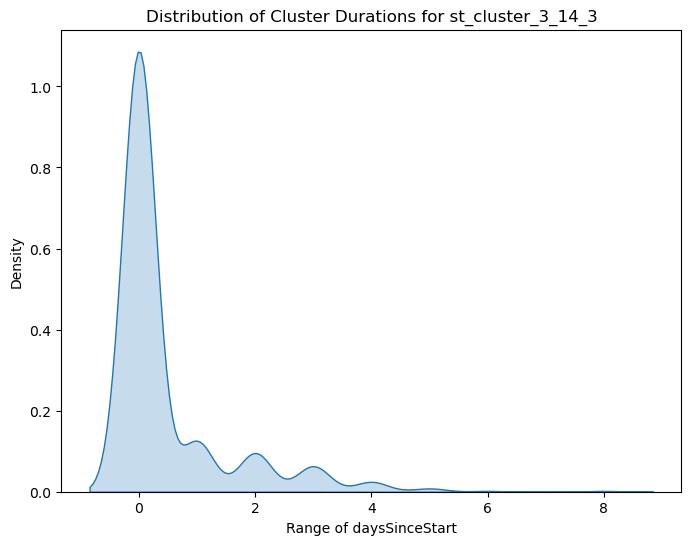

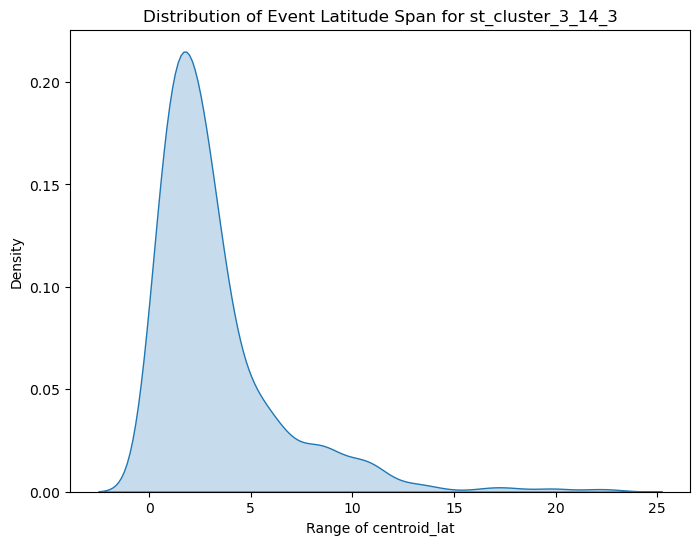

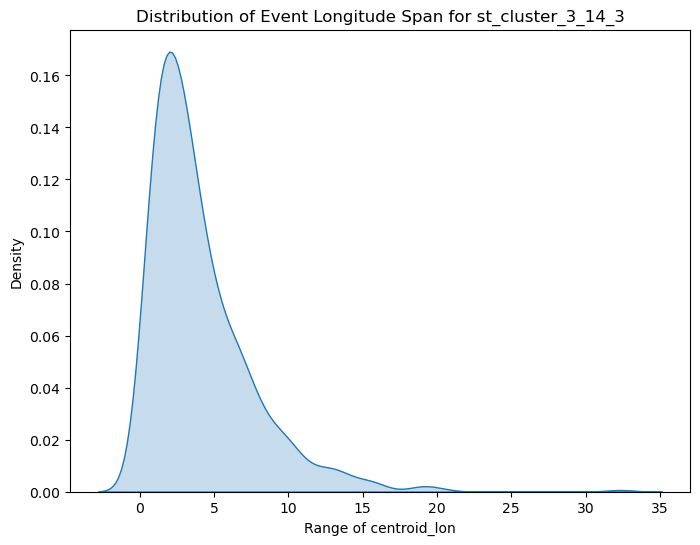


Analyzing st_cluster field: st_cluster_3_14_5


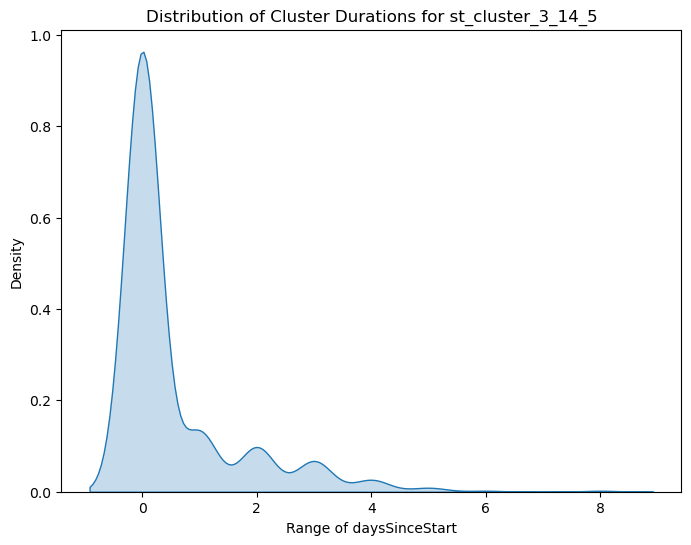

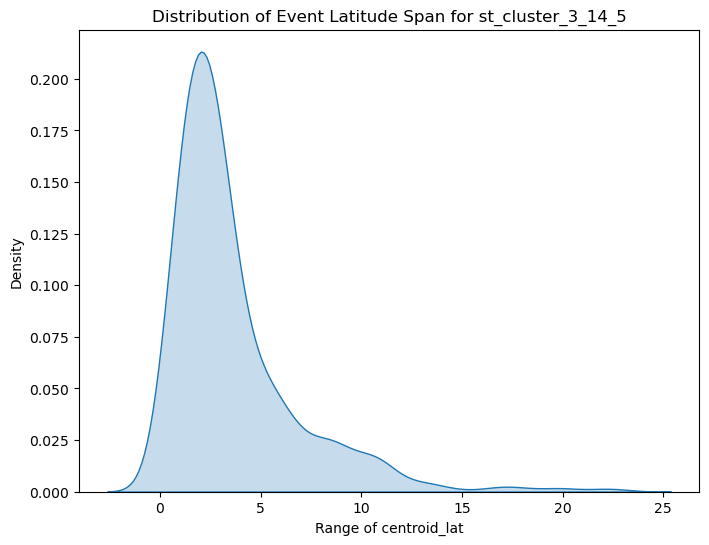

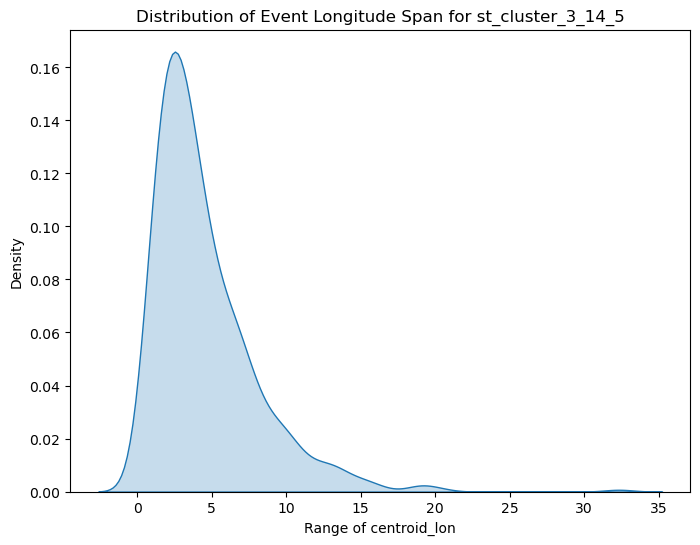


Analyzing st_cluster field: st_cluster_3_14_7


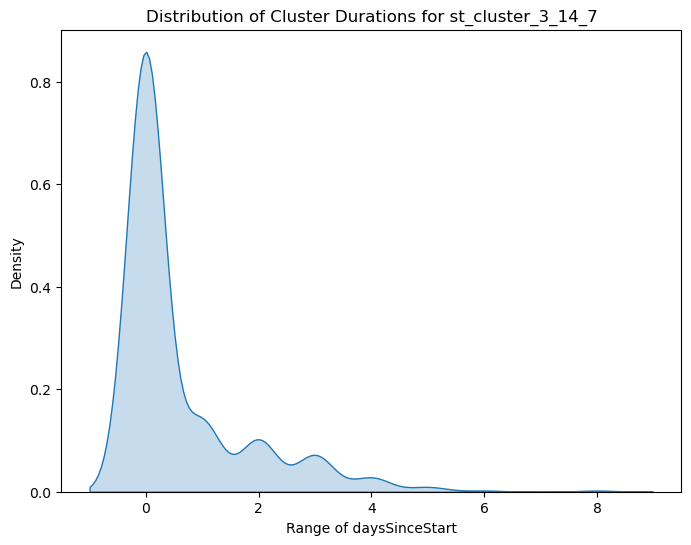

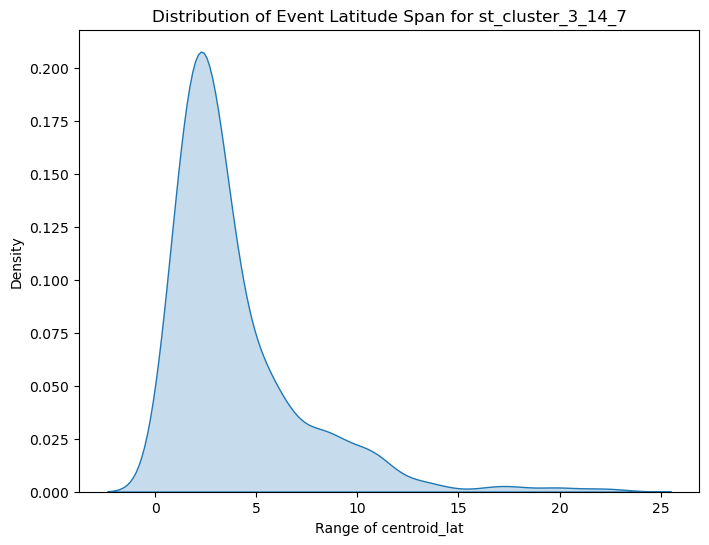

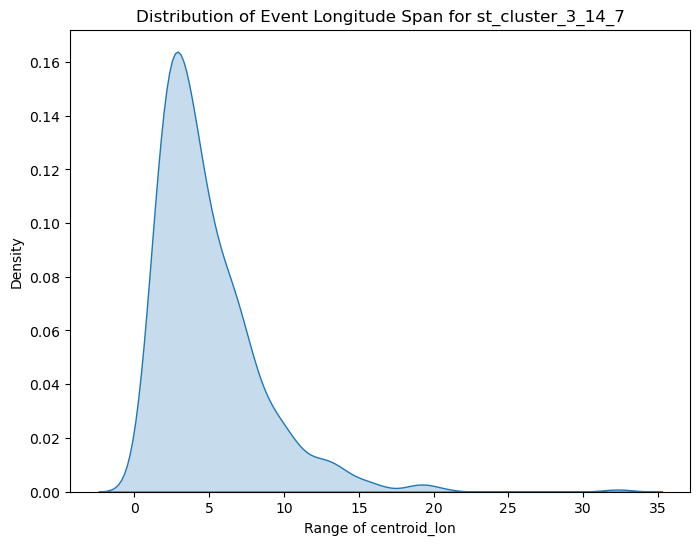


Analyzing st_cluster field: st_cluster_3_14_10


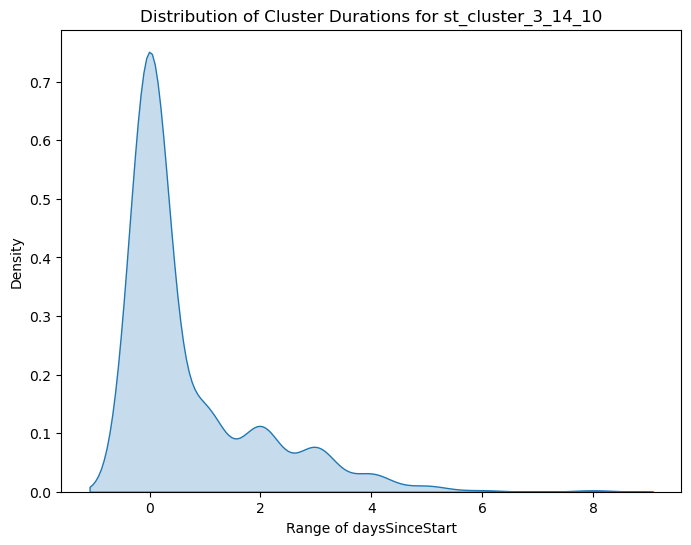

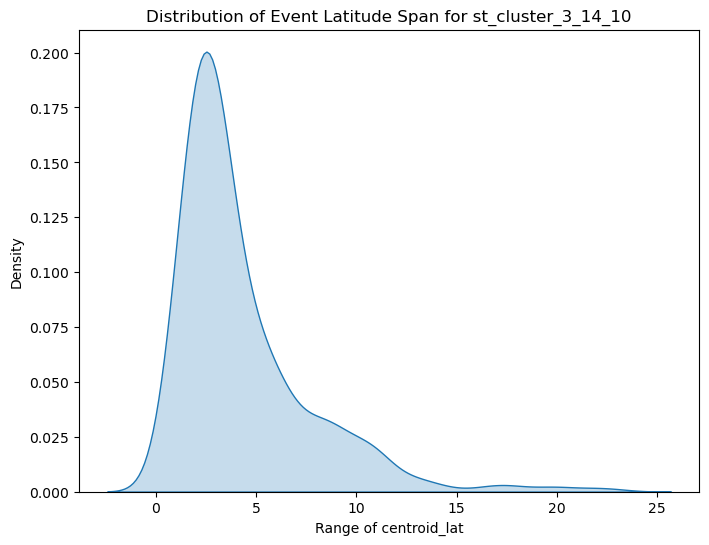

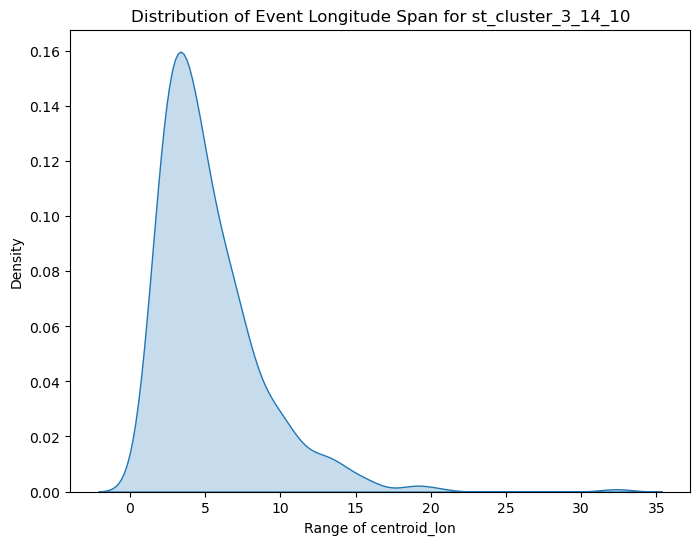


Analyzing st_cluster field: st_cluster_3_30_3


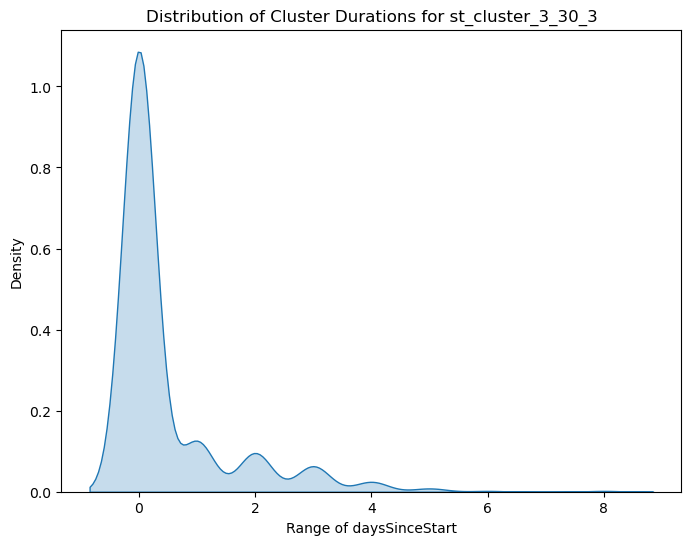

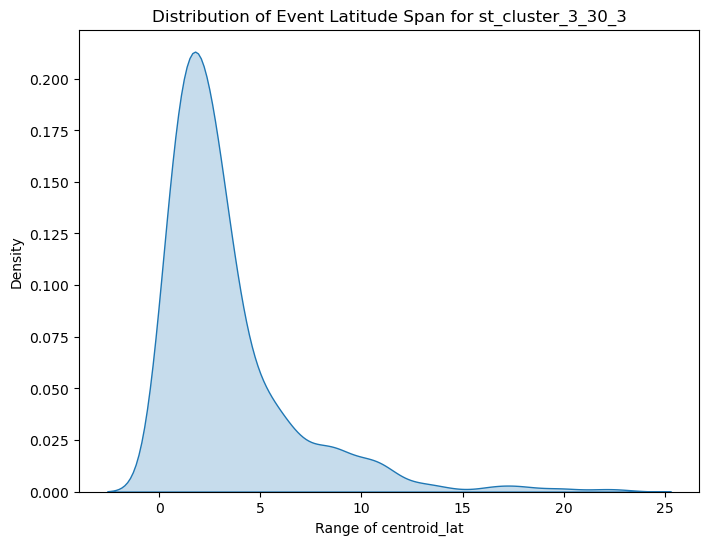

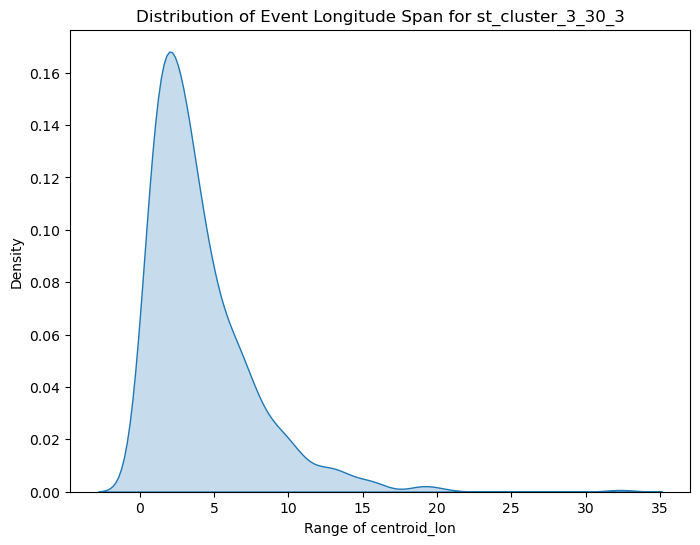


Analyzing st_cluster field: st_cluster_3_30_5


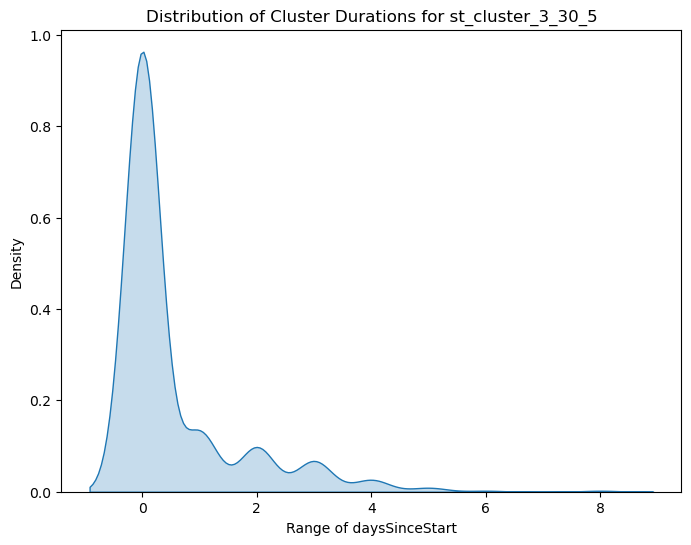

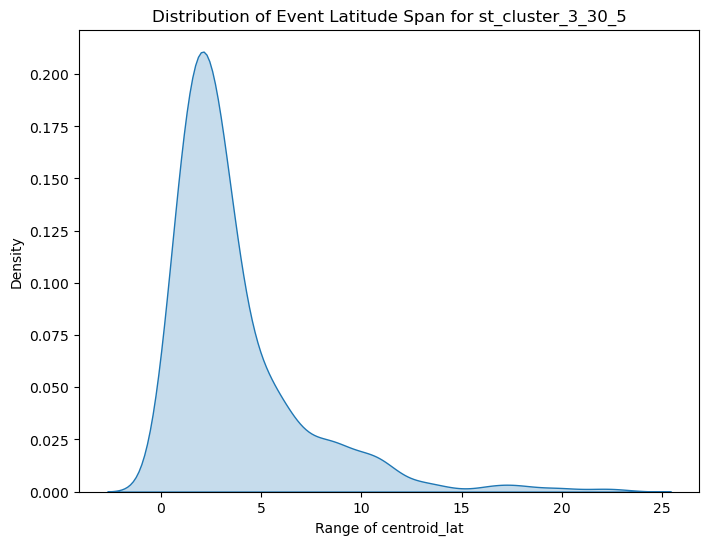

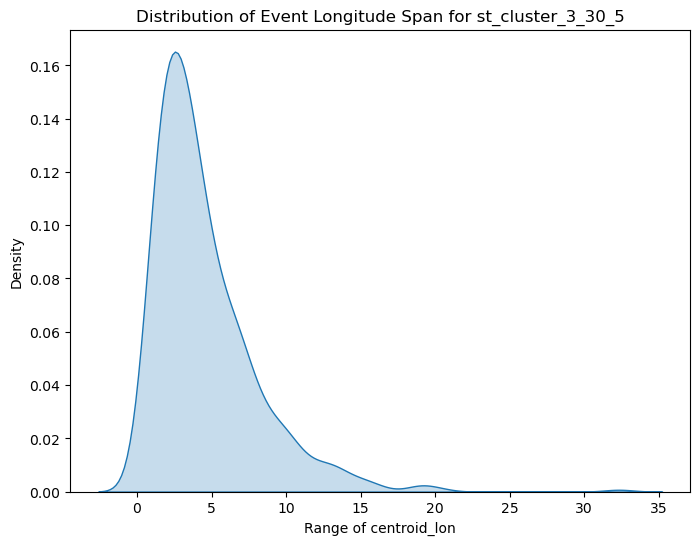


Analyzing st_cluster field: st_cluster_3_30_7


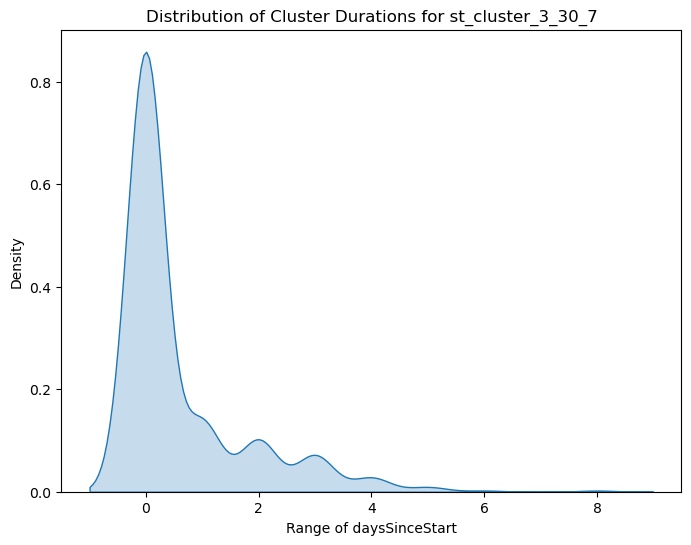

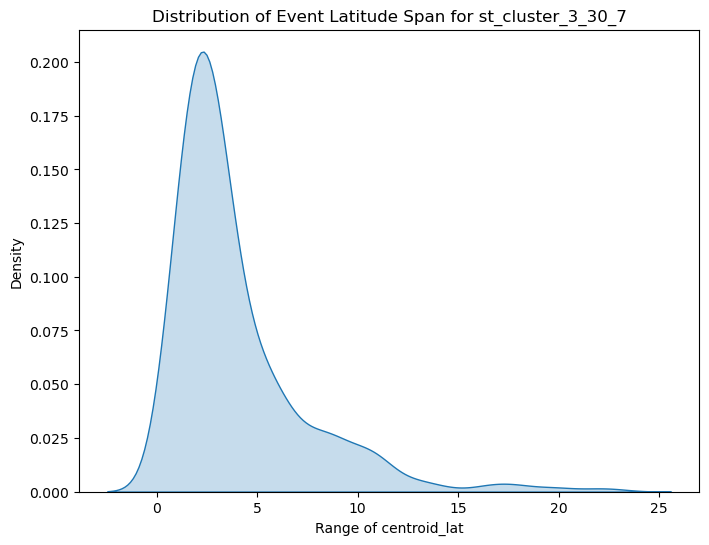

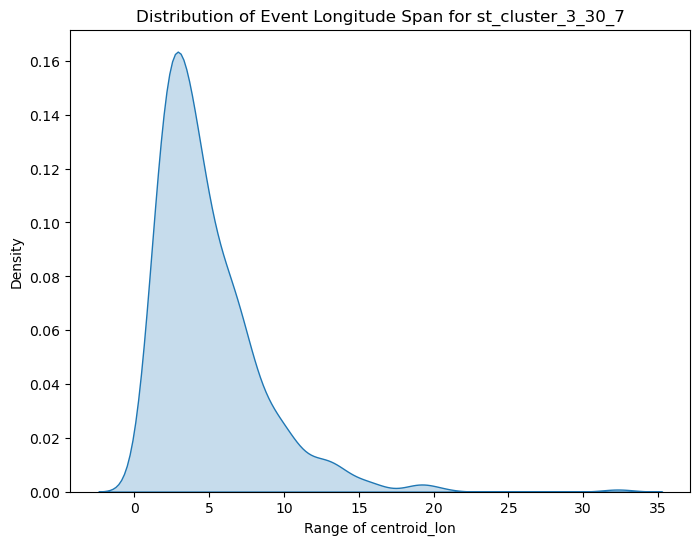


Analyzing st_cluster field: st_cluster_3_30_10


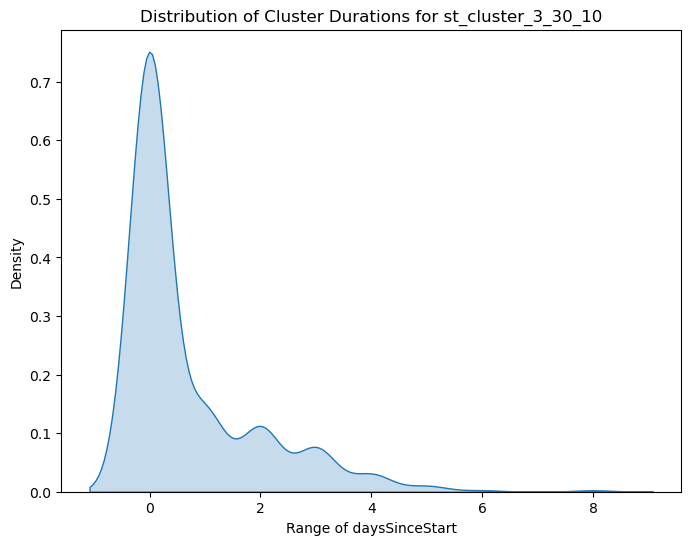

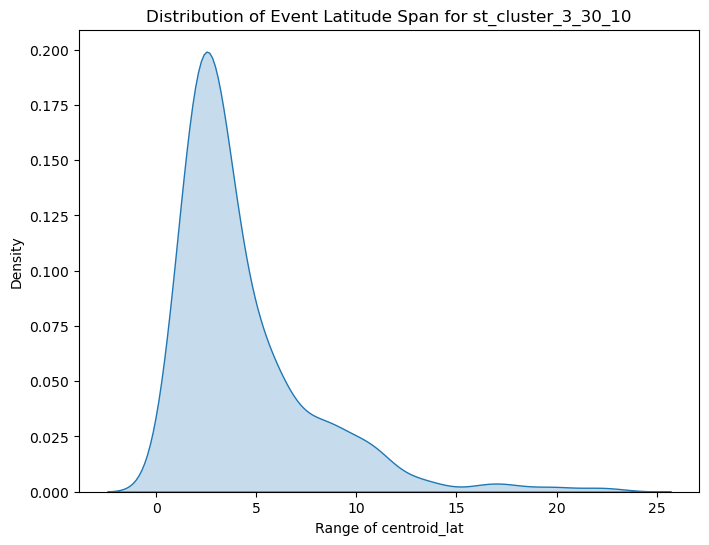

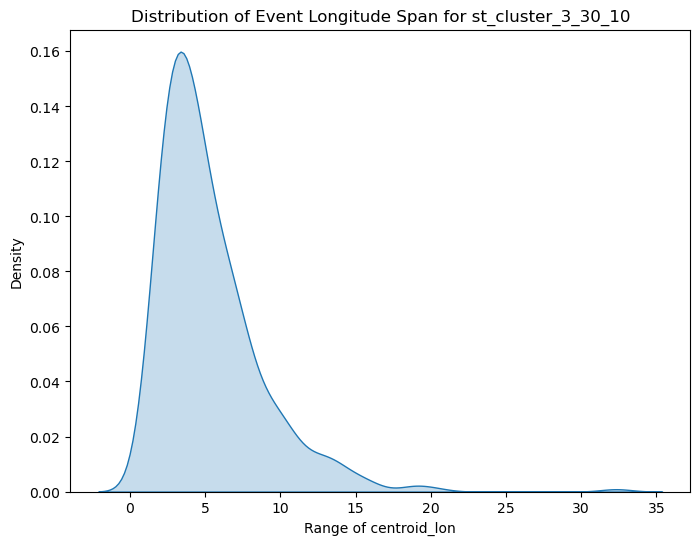


Analyzing st_cluster field: st_cluster_4_1_3


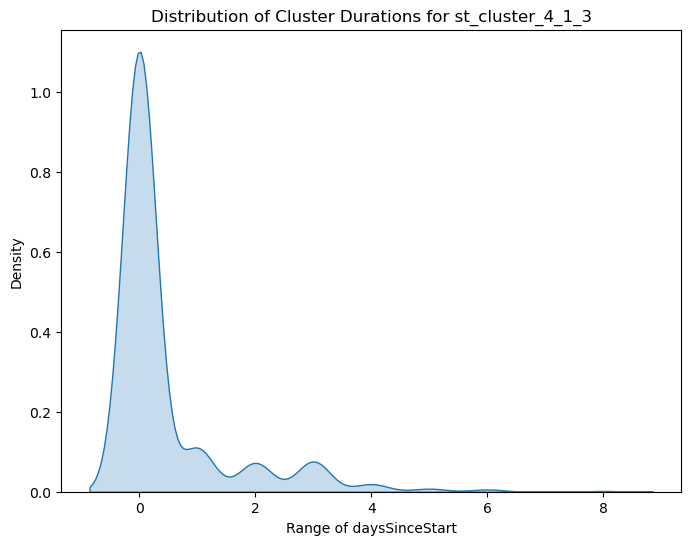

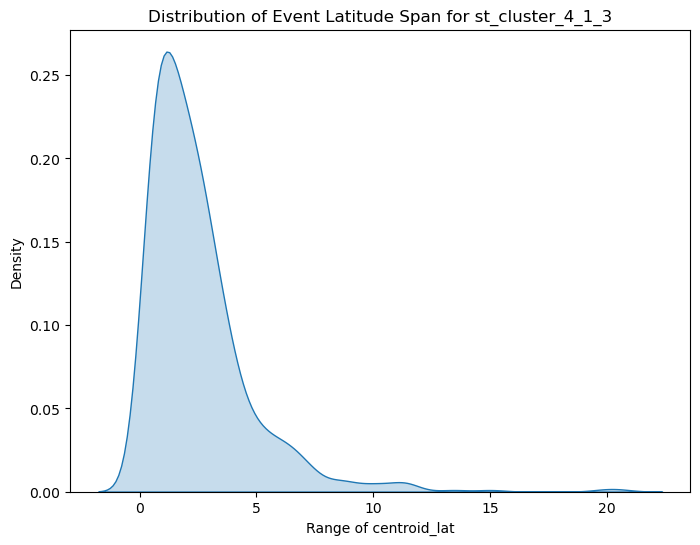

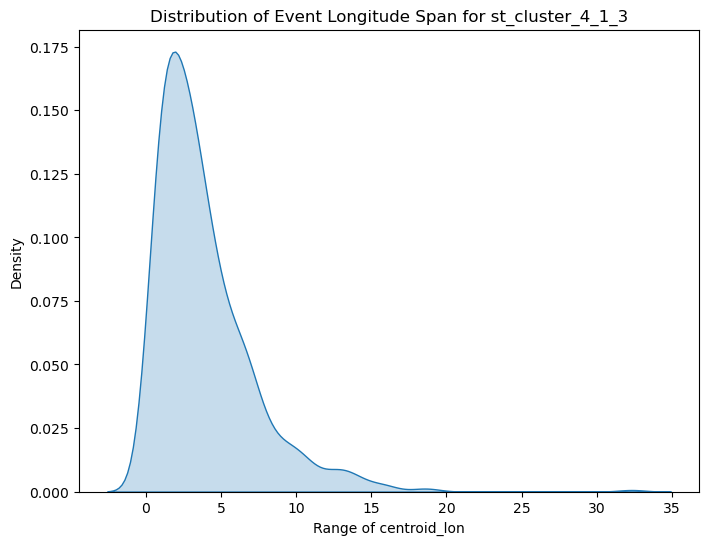


Analyzing st_cluster field: st_cluster_4_1_5


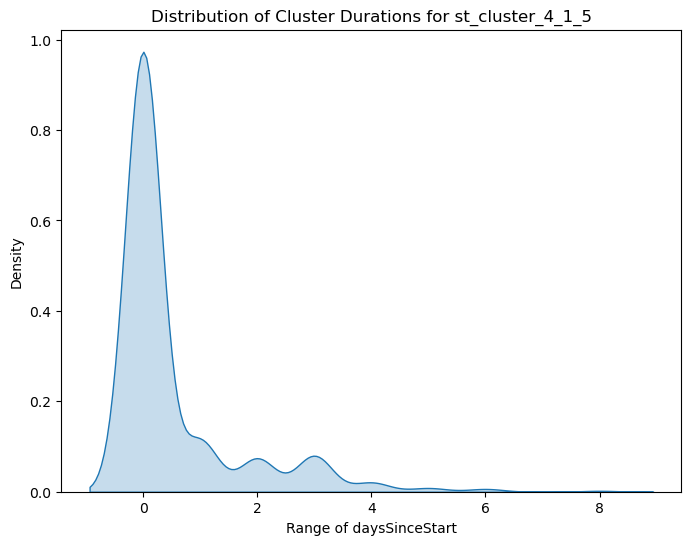

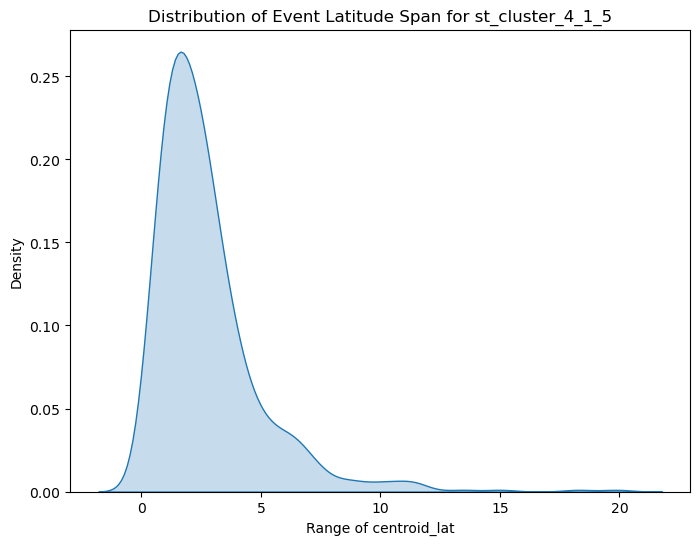

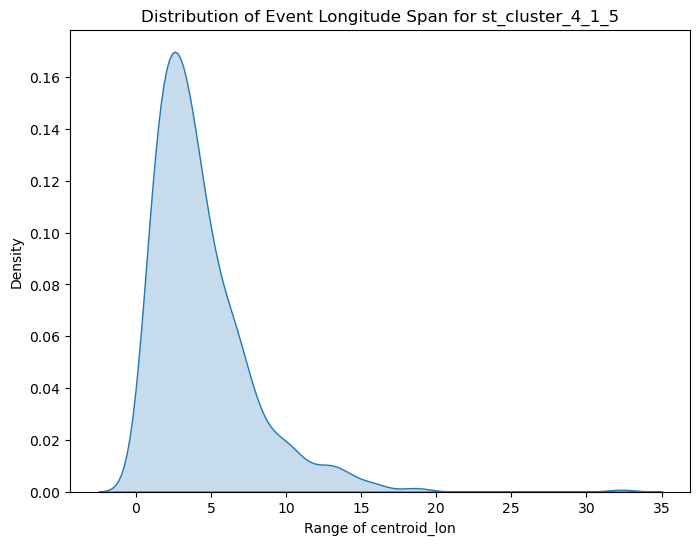


Analyzing st_cluster field: st_cluster_4_1_7


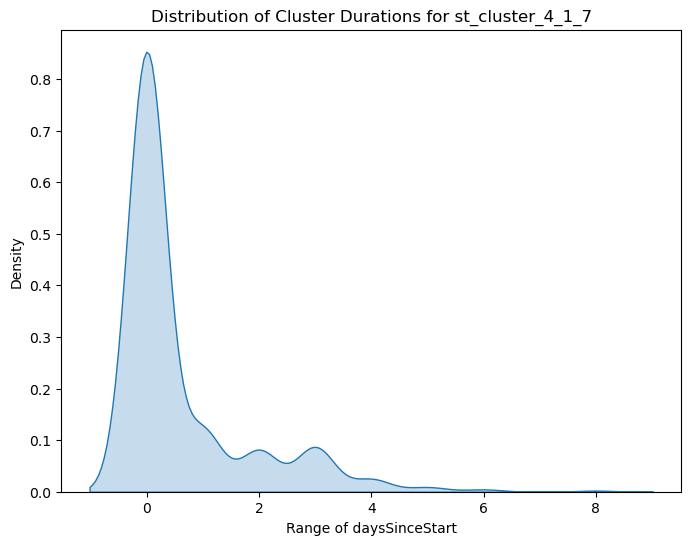

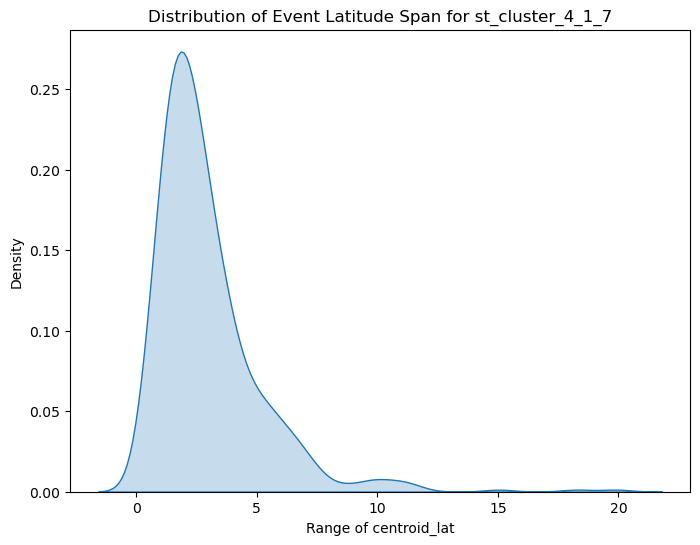

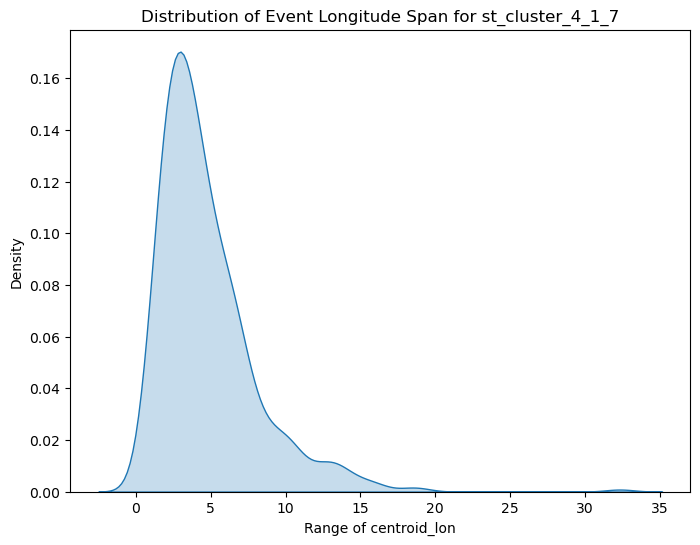


Analyzing st_cluster field: st_cluster_4_1_10


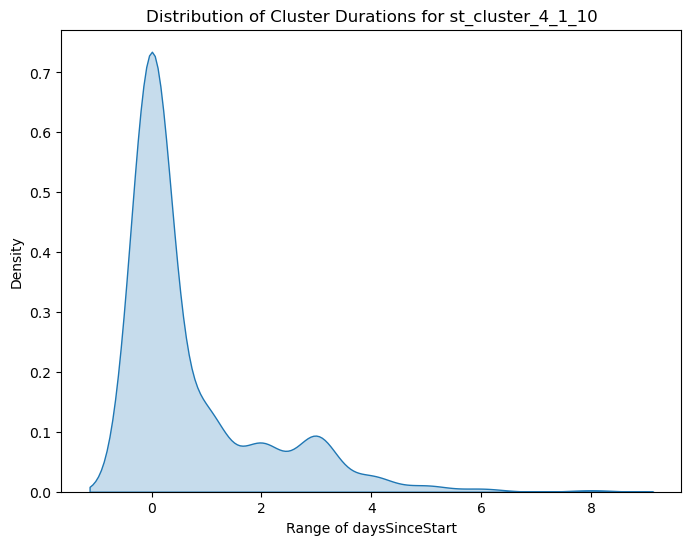

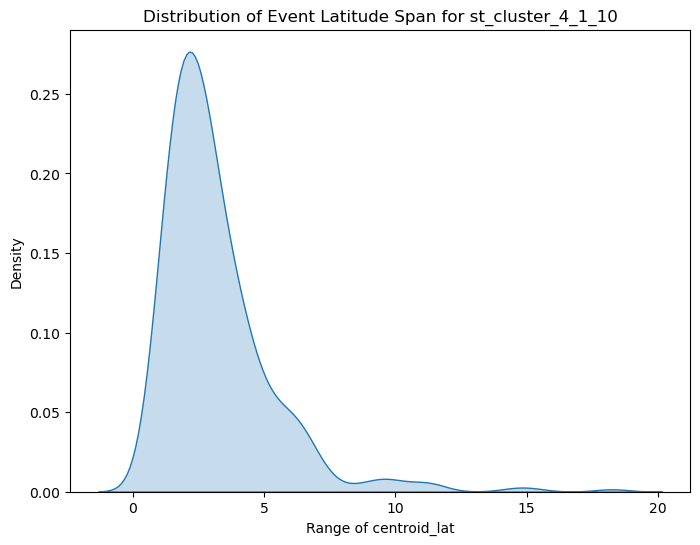

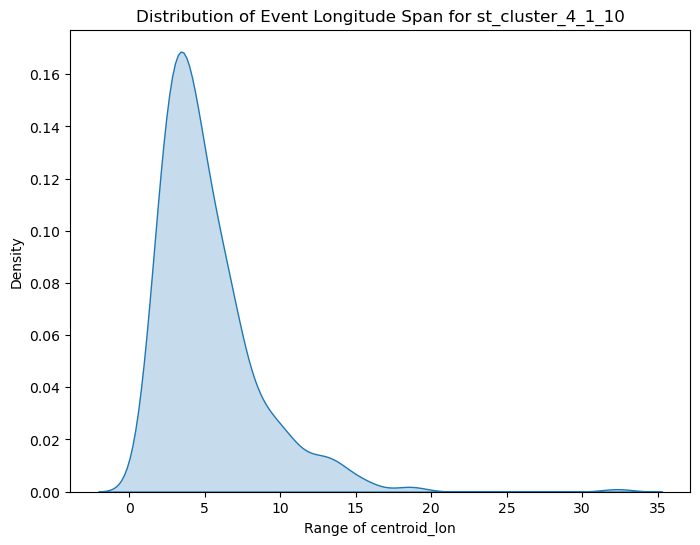


Analyzing st_cluster field: st_cluster_4_3_3


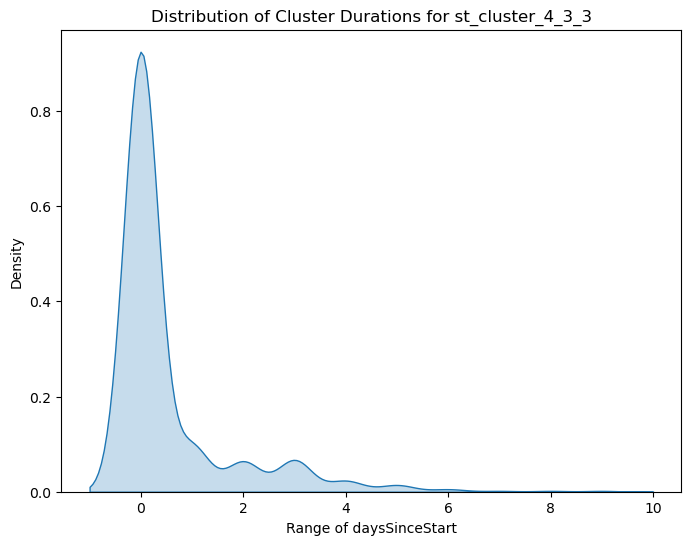

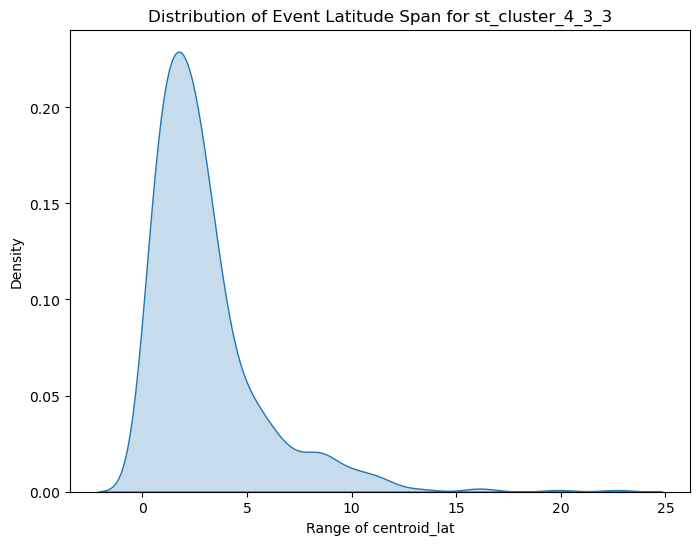

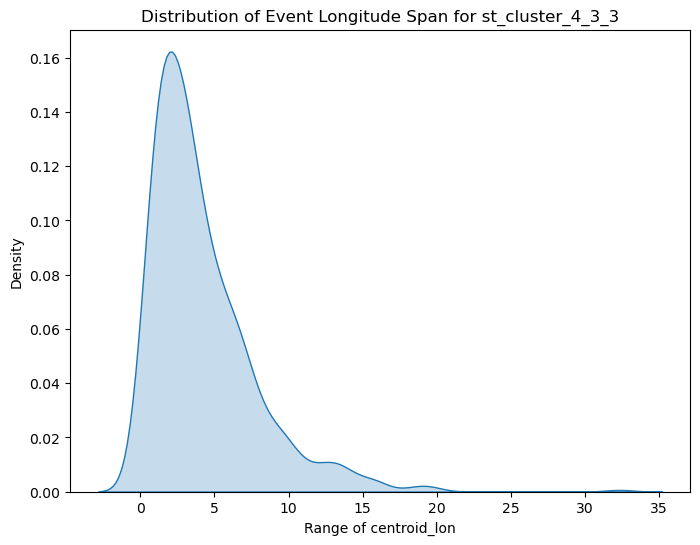


Analyzing st_cluster field: st_cluster_4_3_5


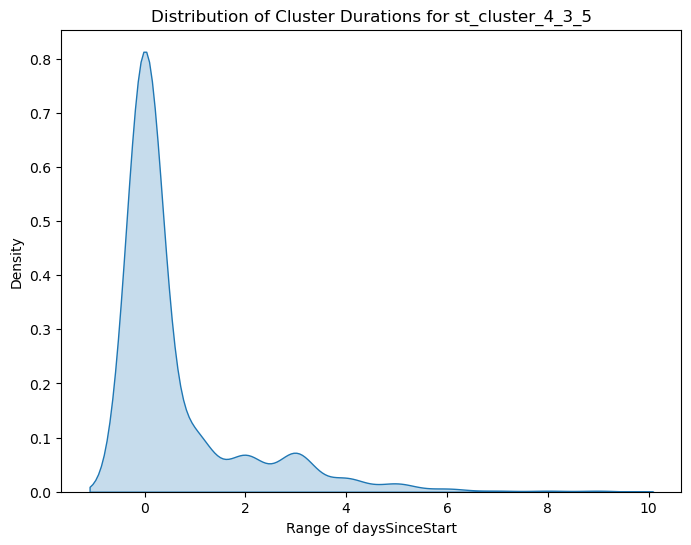

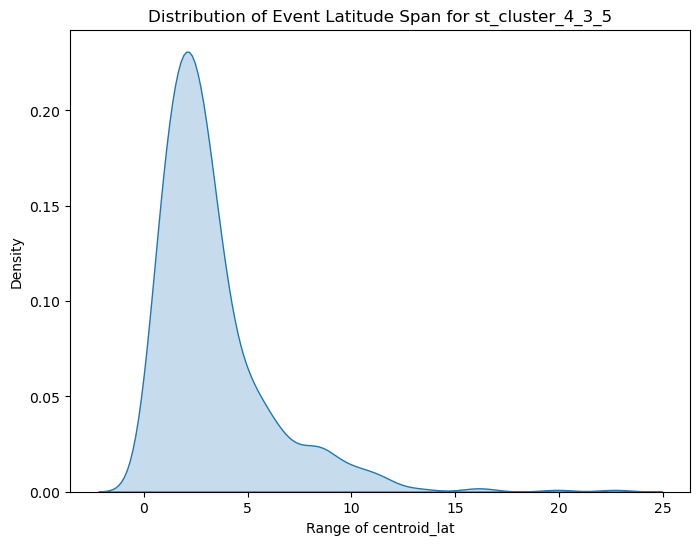

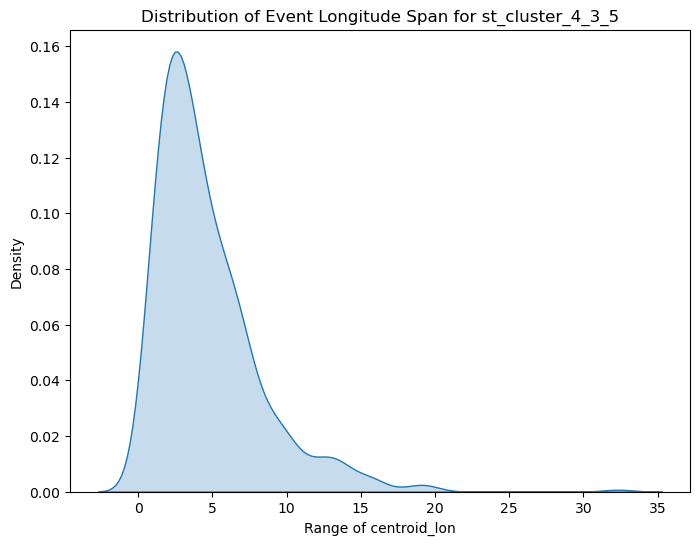


Analyzing st_cluster field: st_cluster_4_3_7


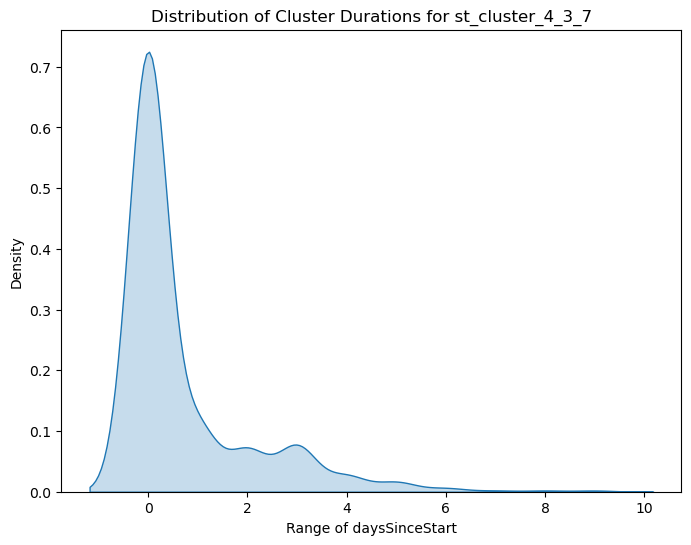

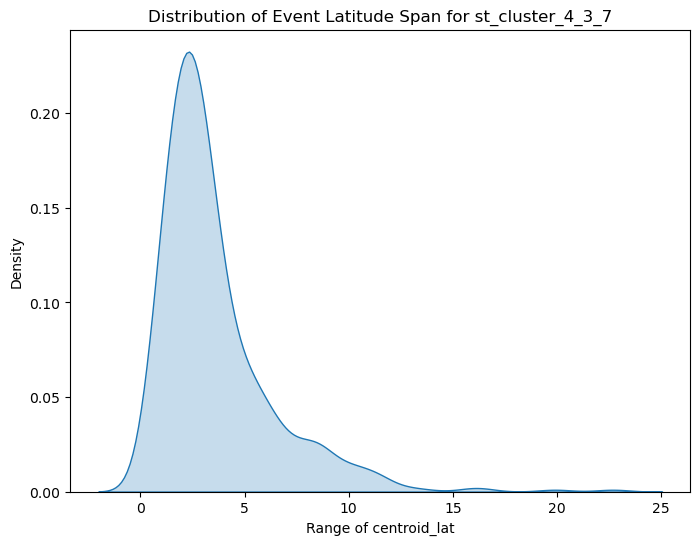

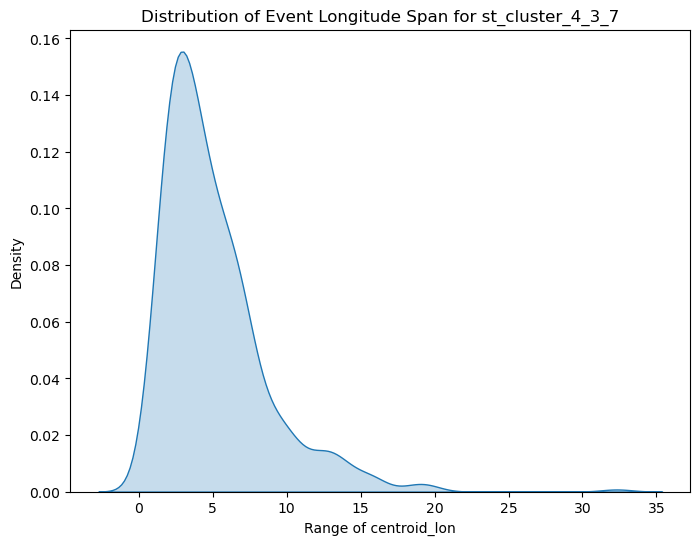


Analyzing st_cluster field: st_cluster_4_3_10


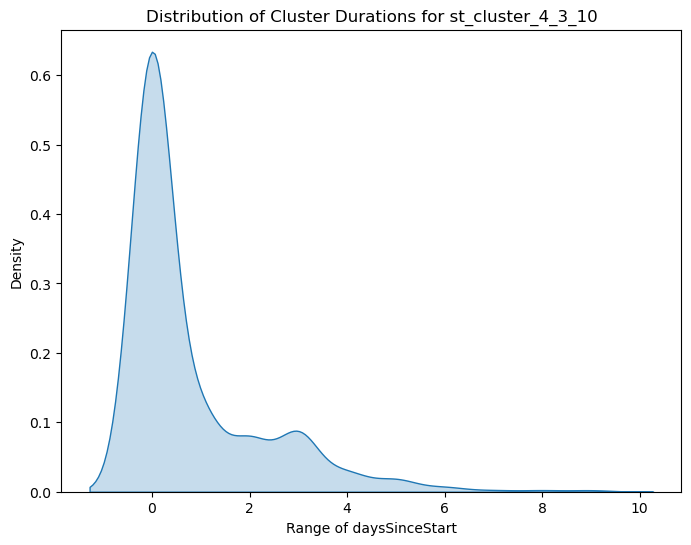

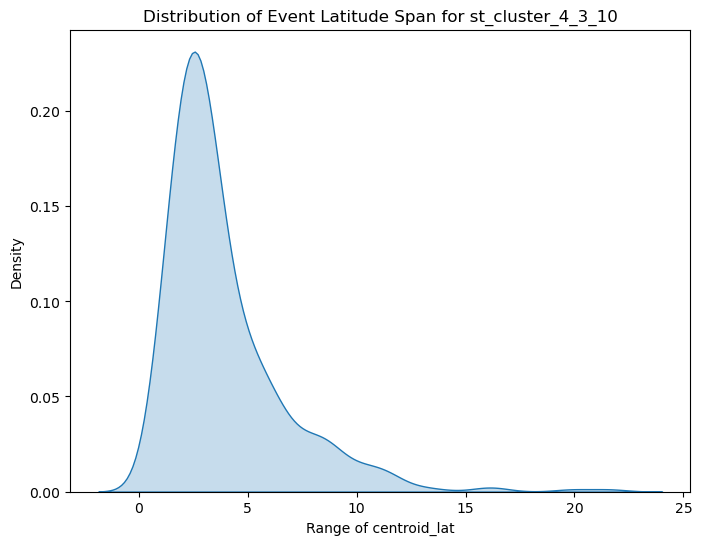

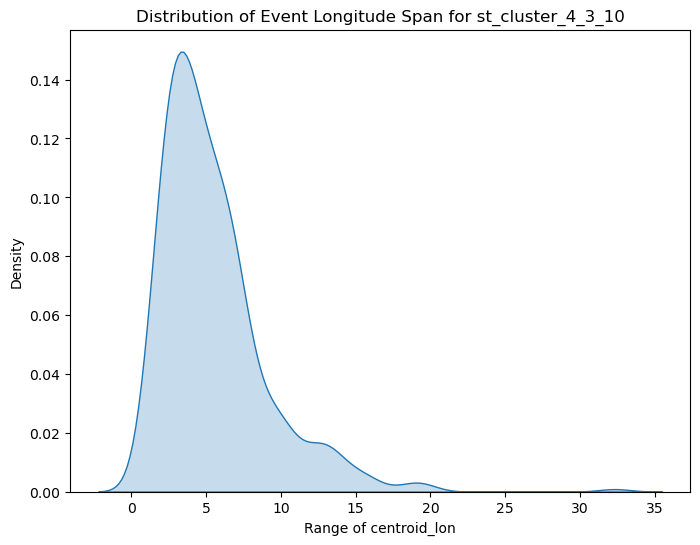


Analyzing st_cluster field: st_cluster_4_5_3


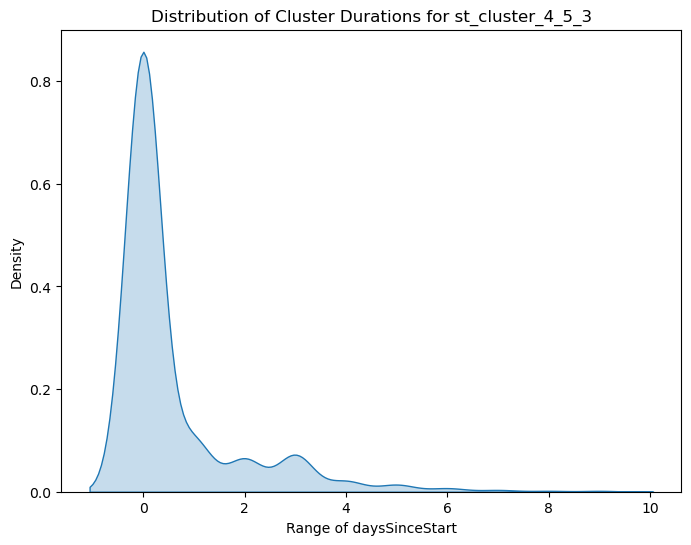

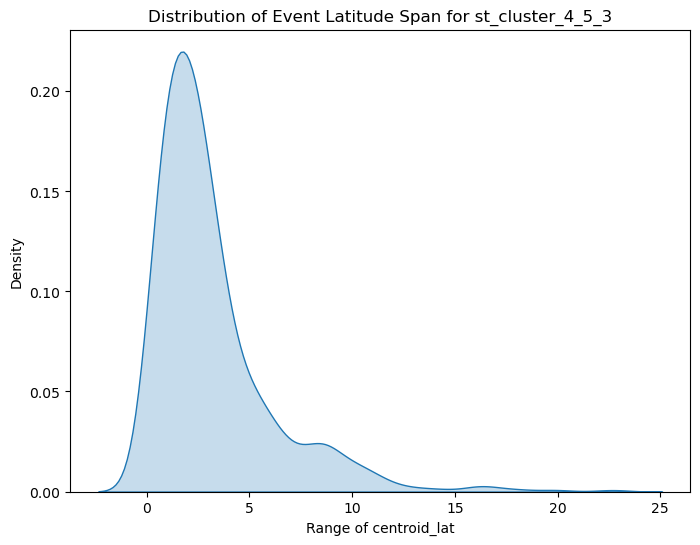

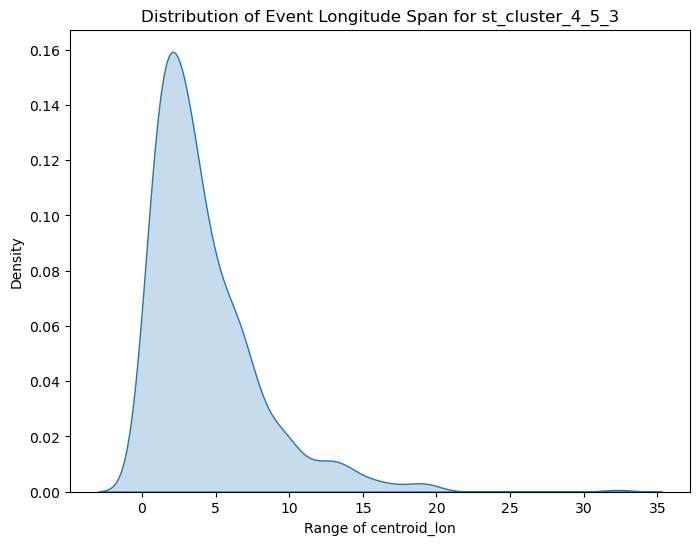


Analyzing st_cluster field: st_cluster_4_5_5


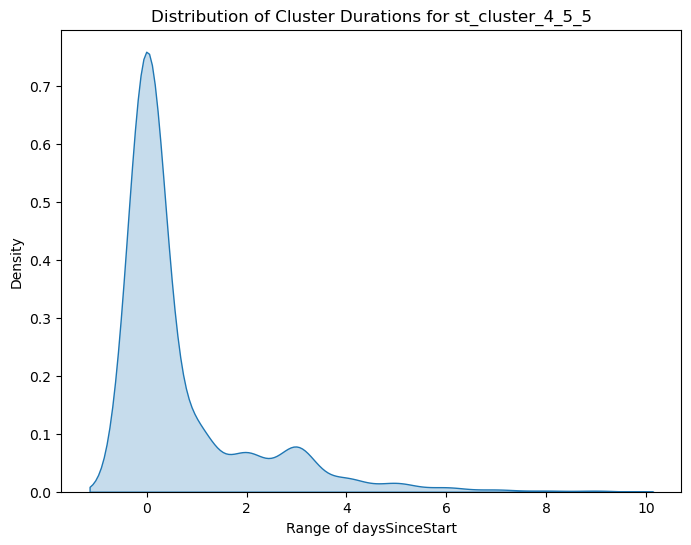

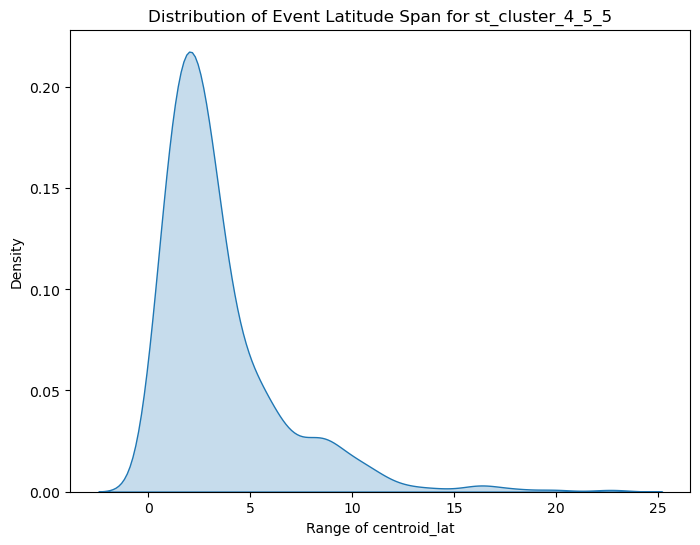

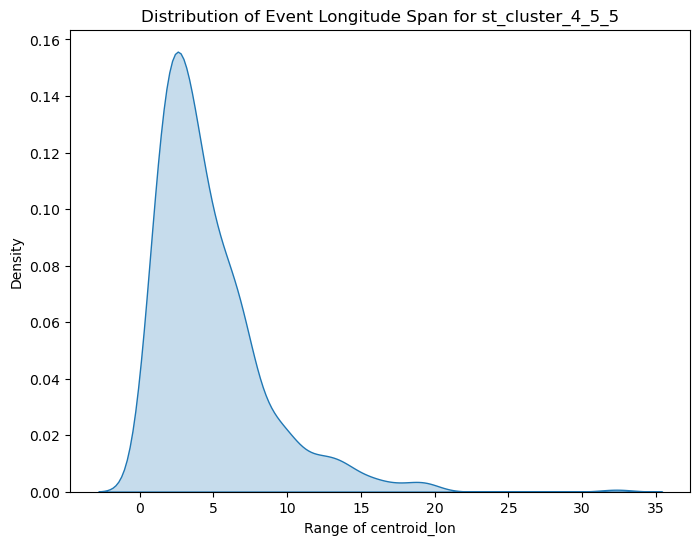


Analyzing st_cluster field: st_cluster_4_5_7


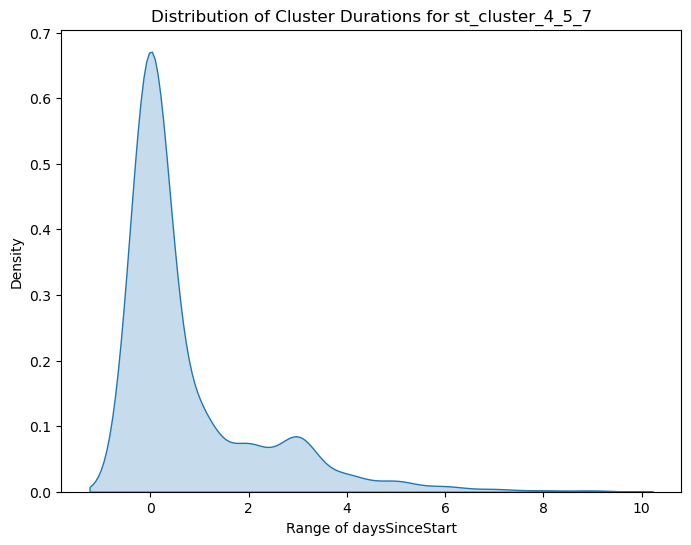

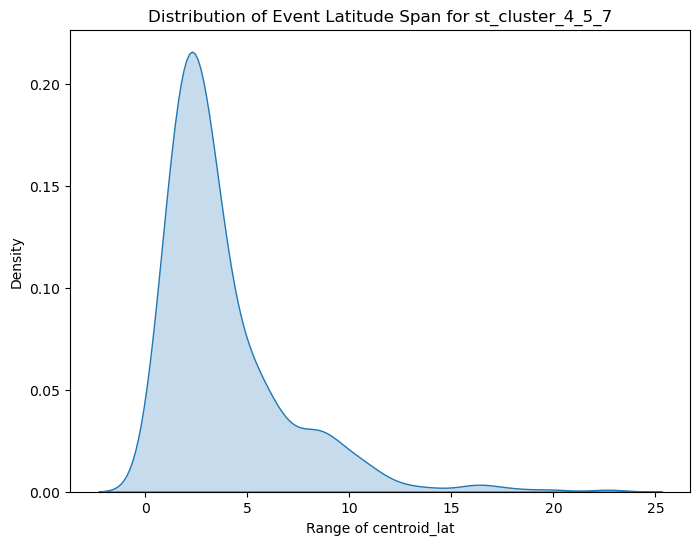

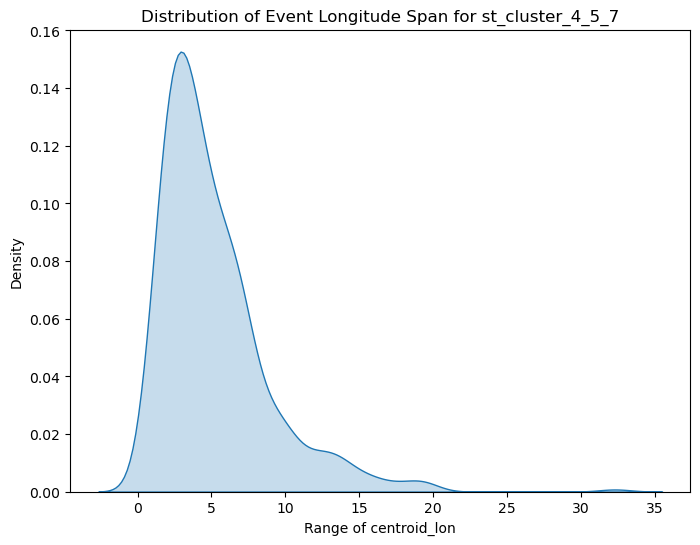


Analyzing st_cluster field: st_cluster_4_5_10


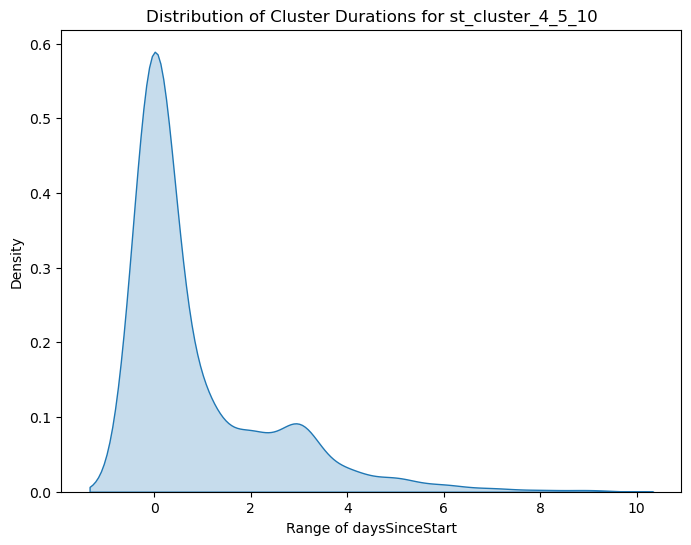

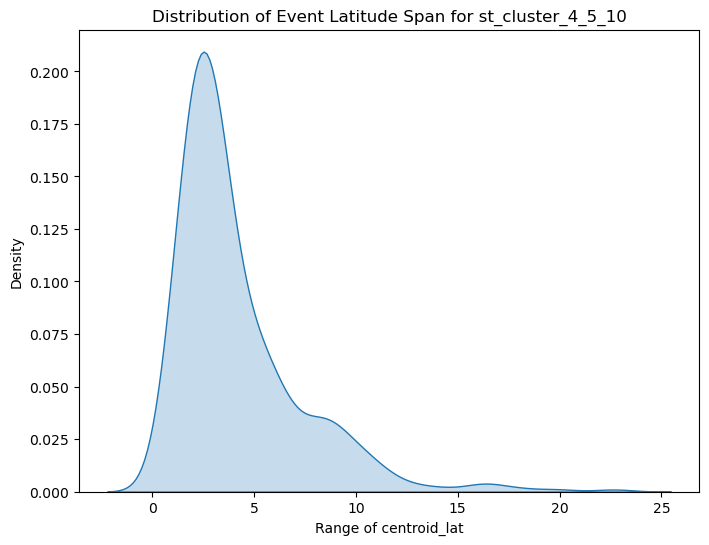

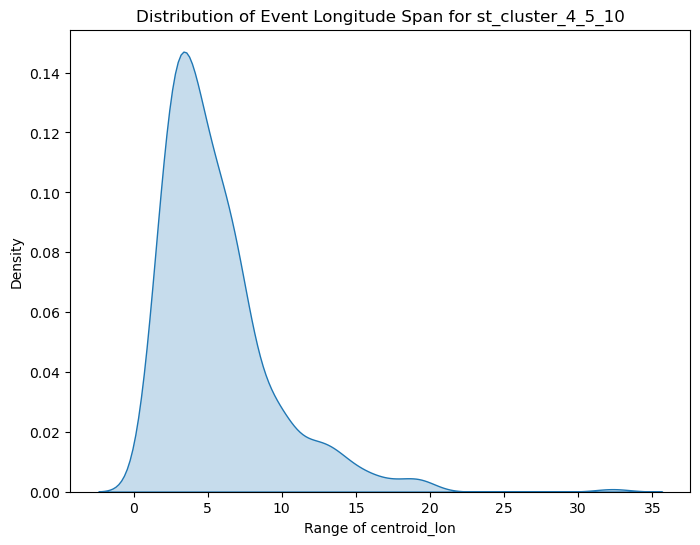


Analyzing st_cluster field: st_cluster_4_7_3


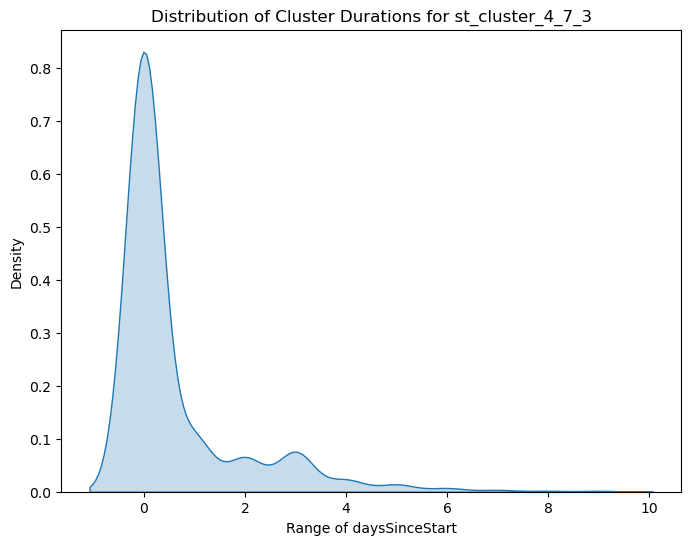

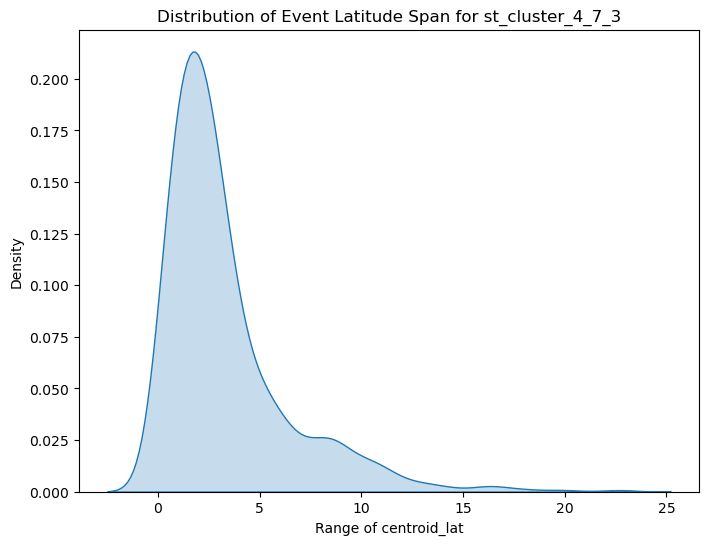

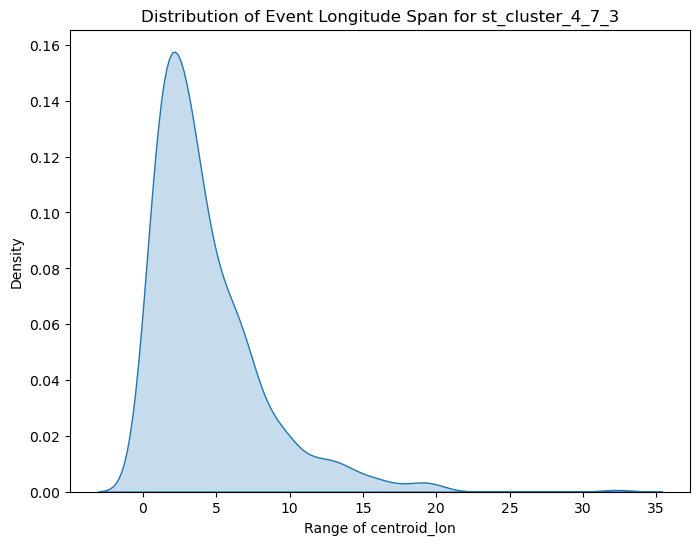


Analyzing st_cluster field: st_cluster_4_7_5


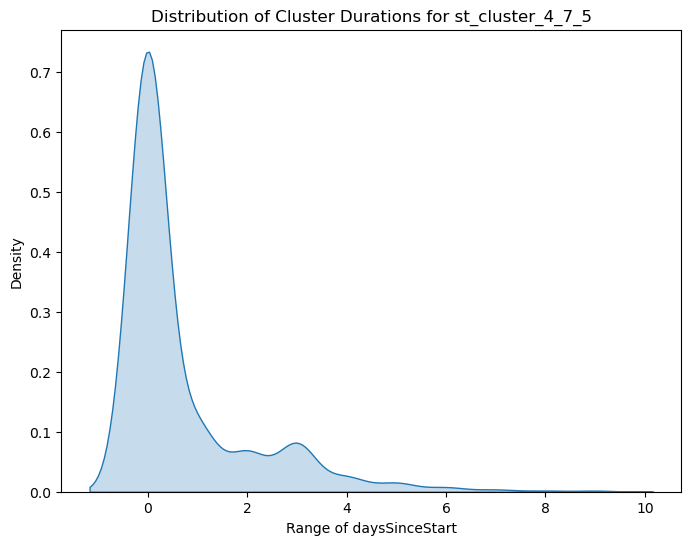

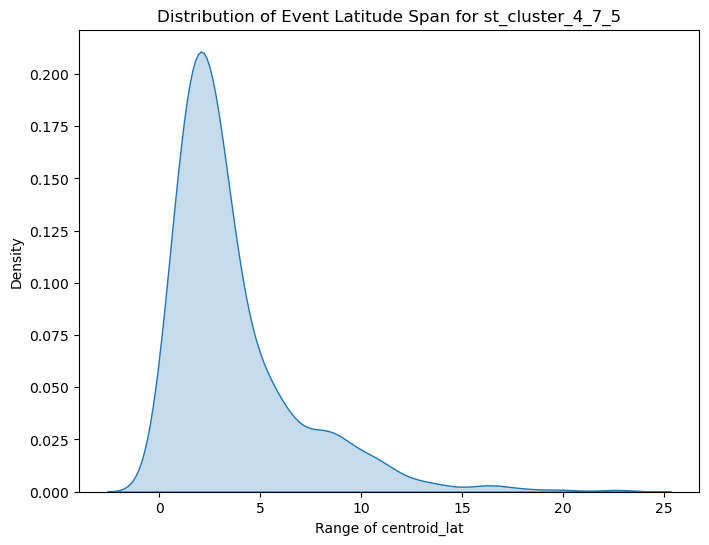

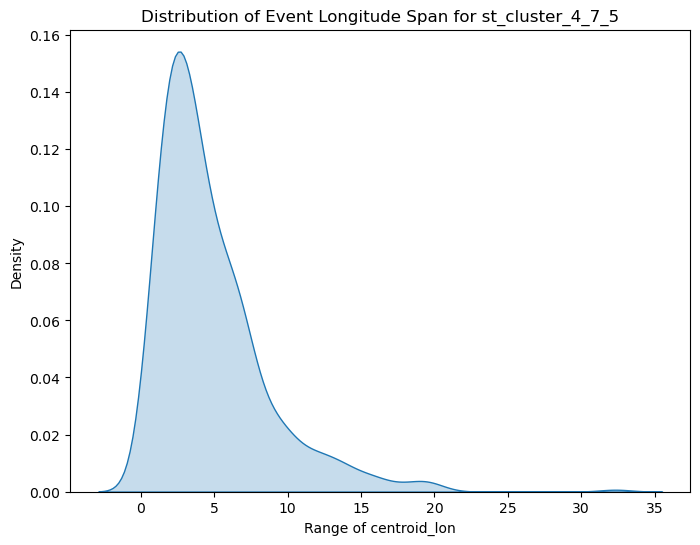


Analyzing st_cluster field: st_cluster_4_7_7


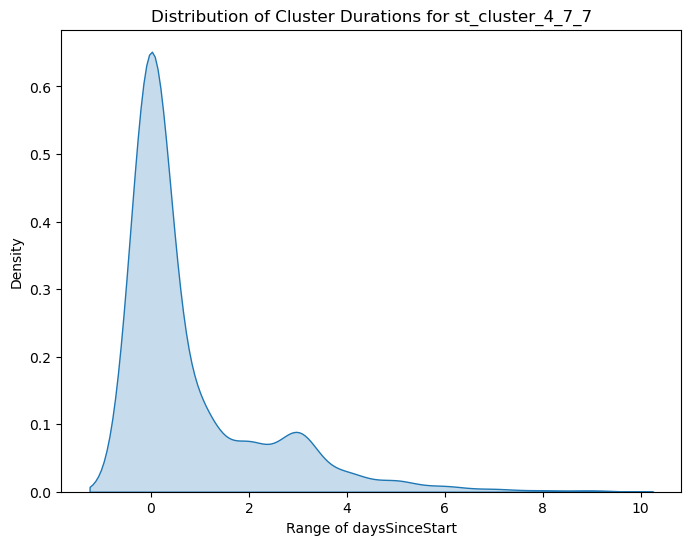

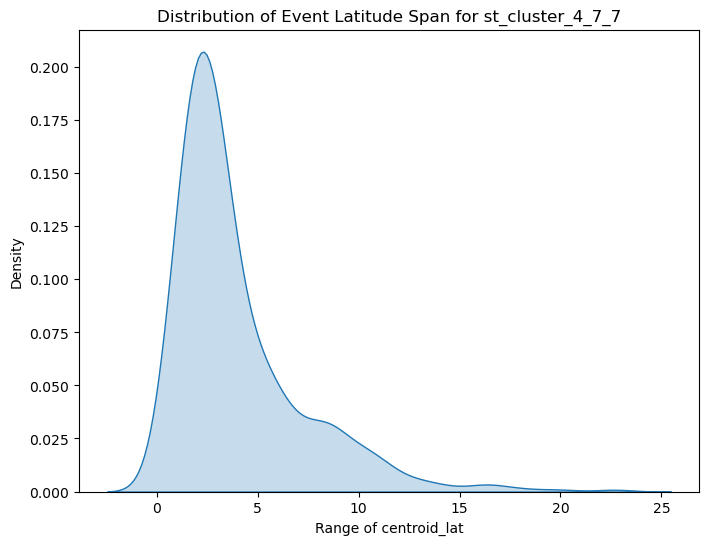

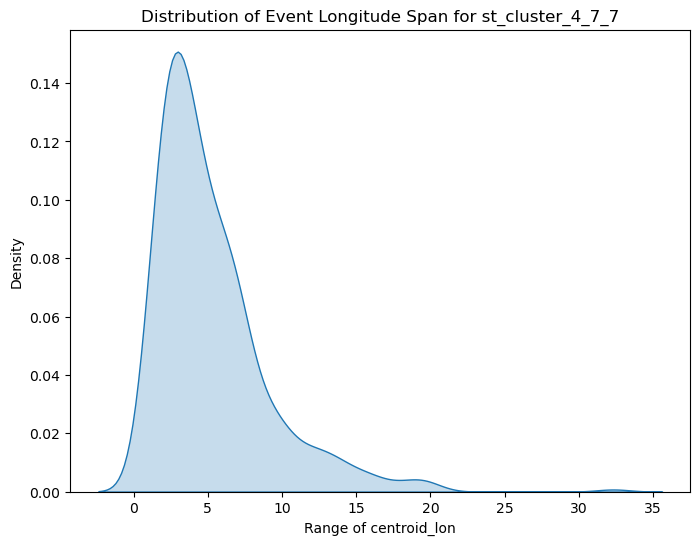


Analyzing st_cluster field: st_cluster_4_7_10


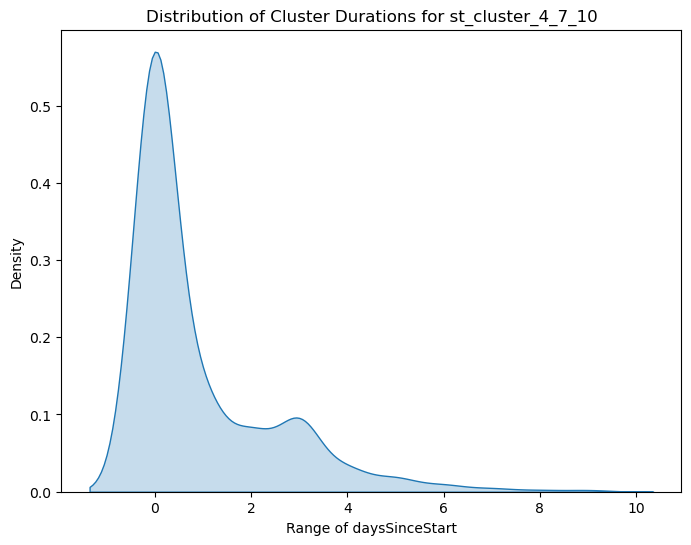

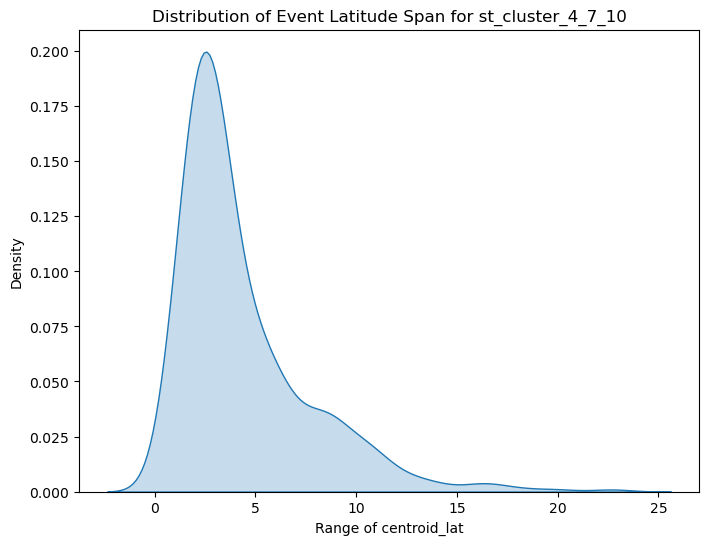

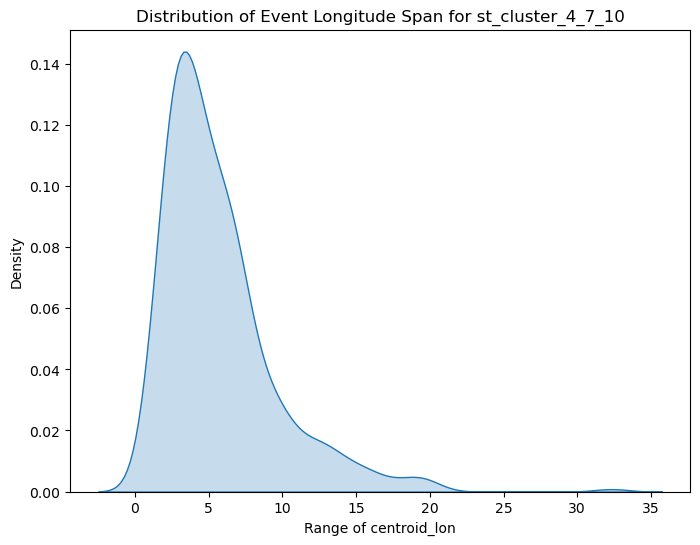


Analyzing st_cluster field: st_cluster_4_14_3


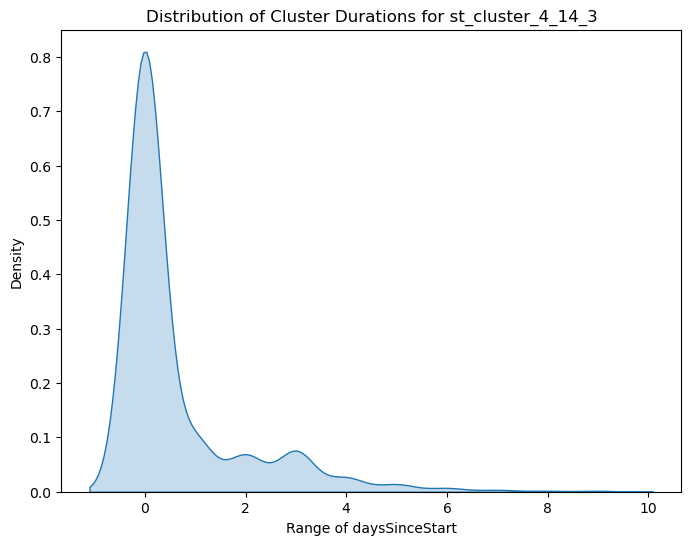

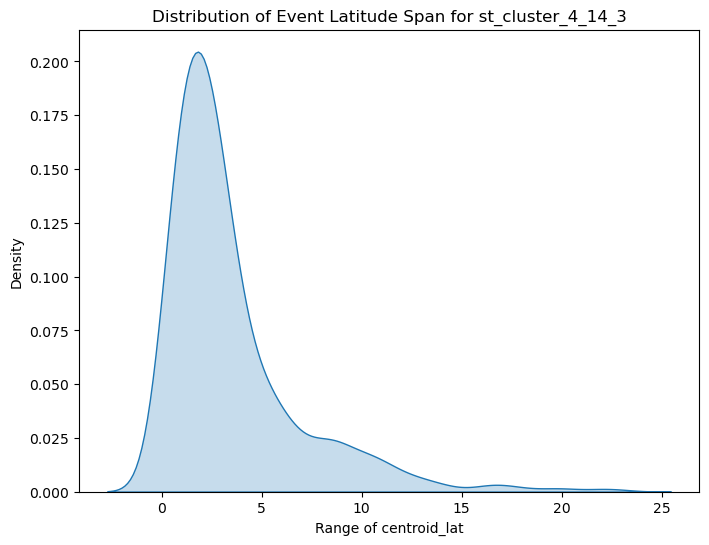

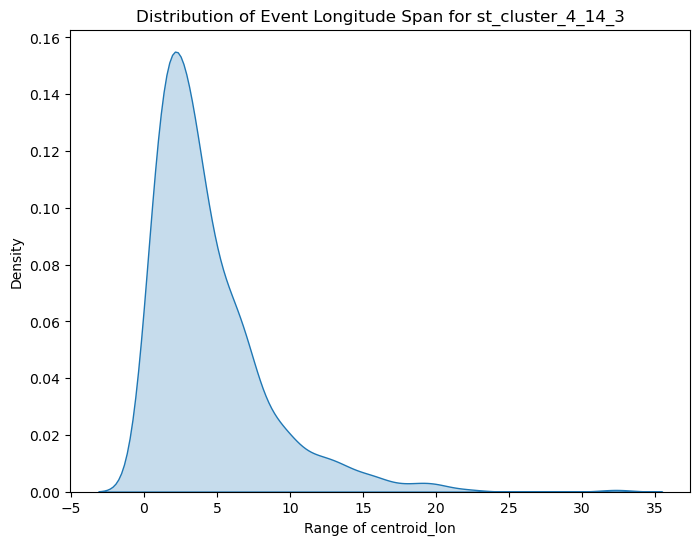


Analyzing st_cluster field: st_cluster_4_14_5


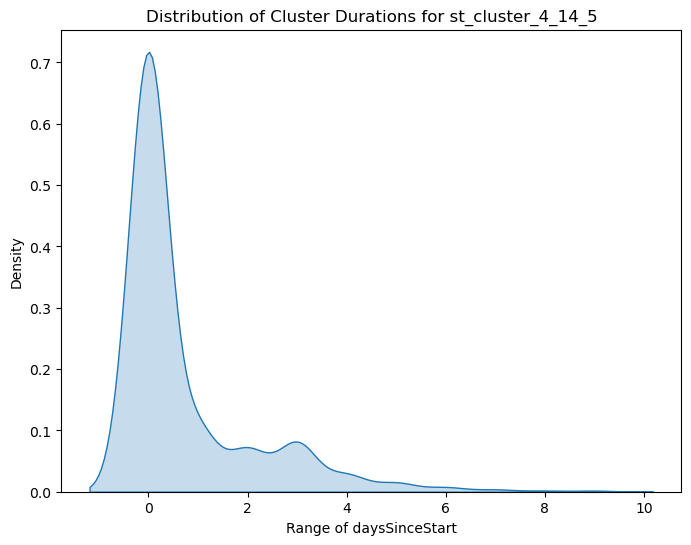

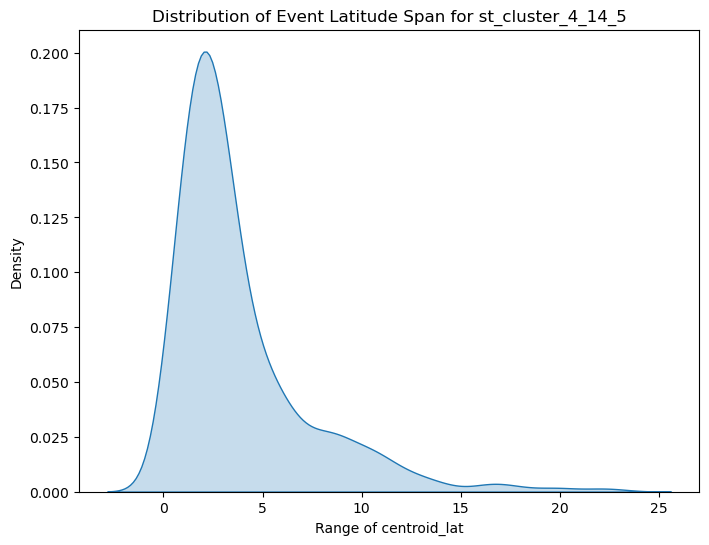

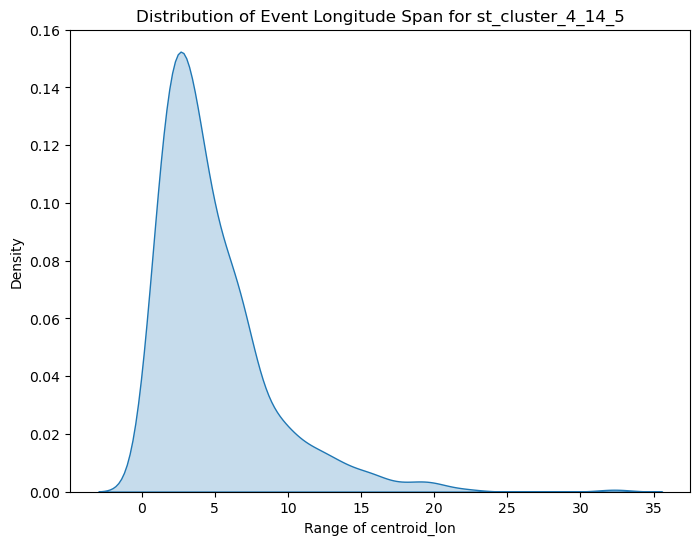


Analyzing st_cluster field: st_cluster_4_14_7


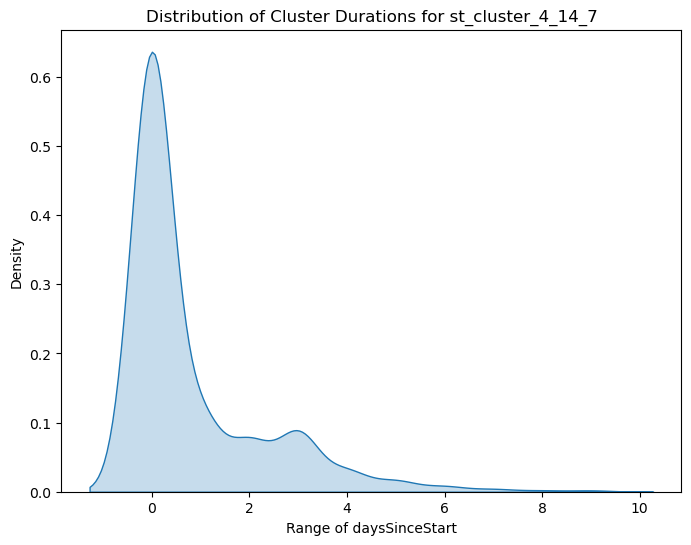

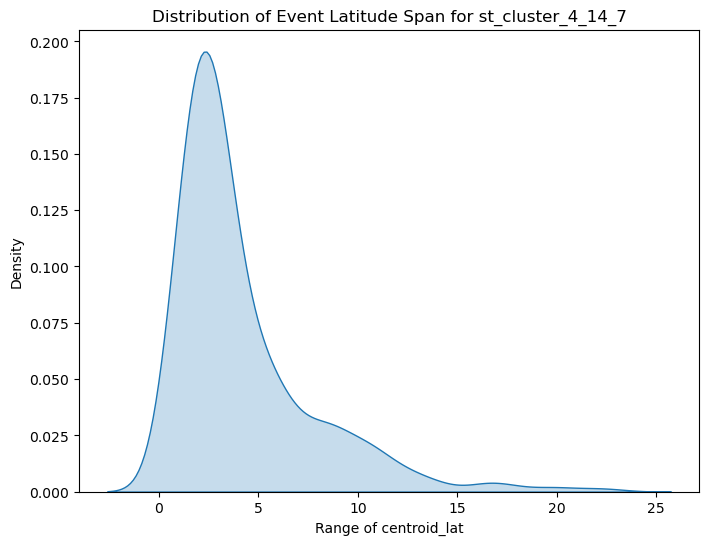

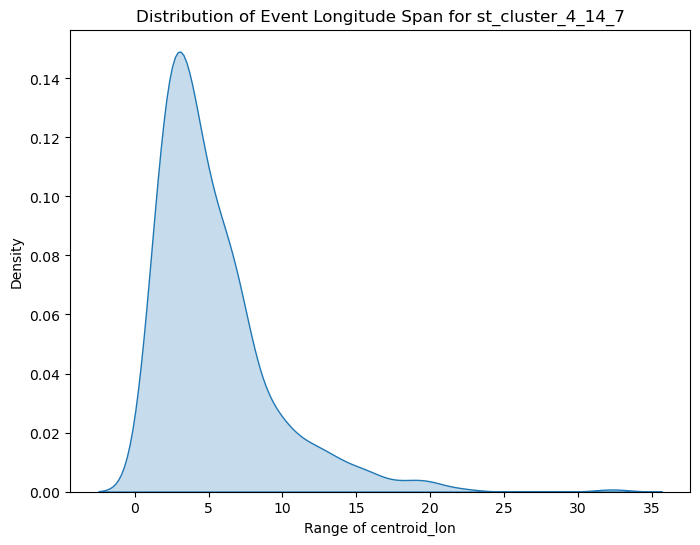


Analyzing st_cluster field: st_cluster_4_14_10


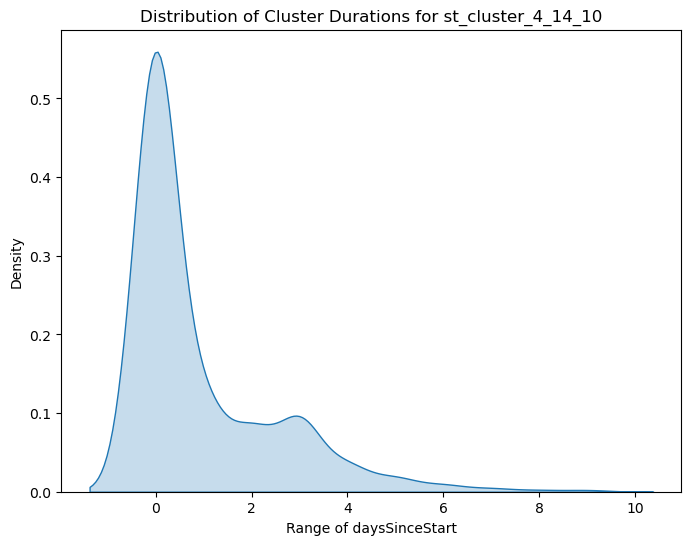

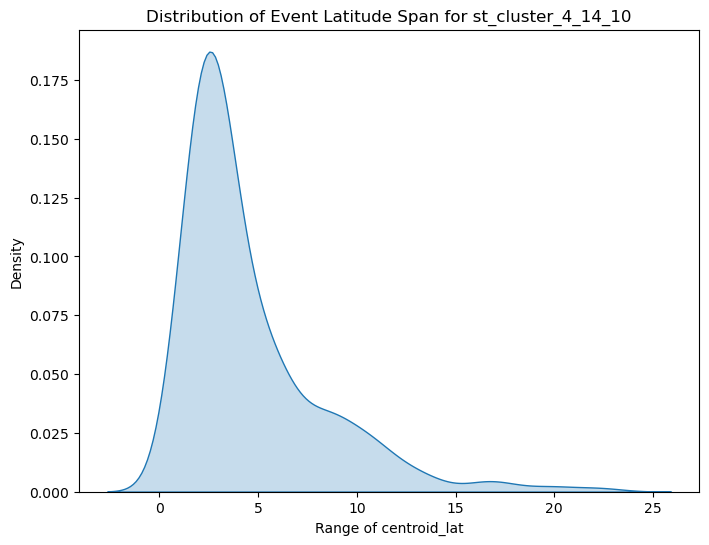

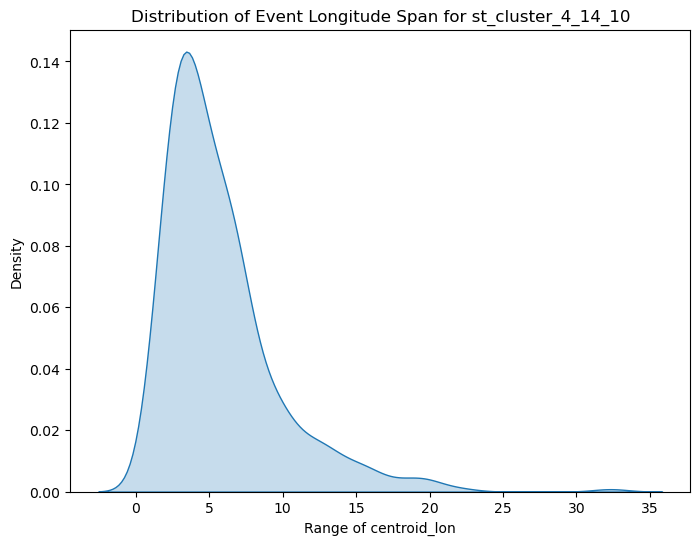


Analyzing st_cluster field: st_cluster_4_30_3


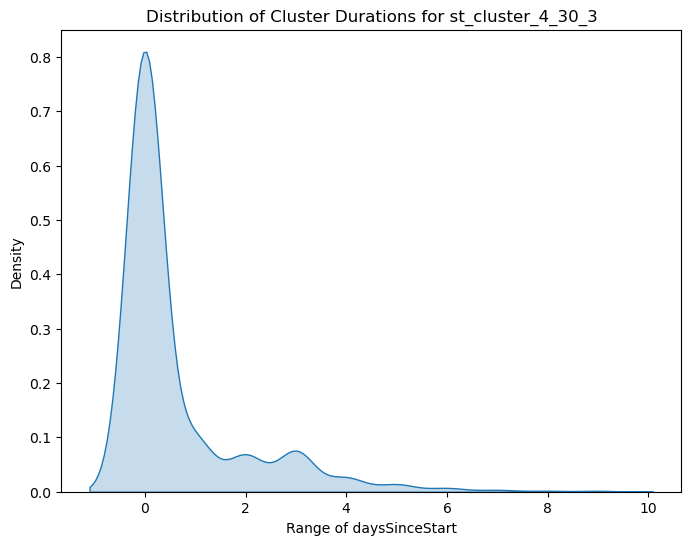

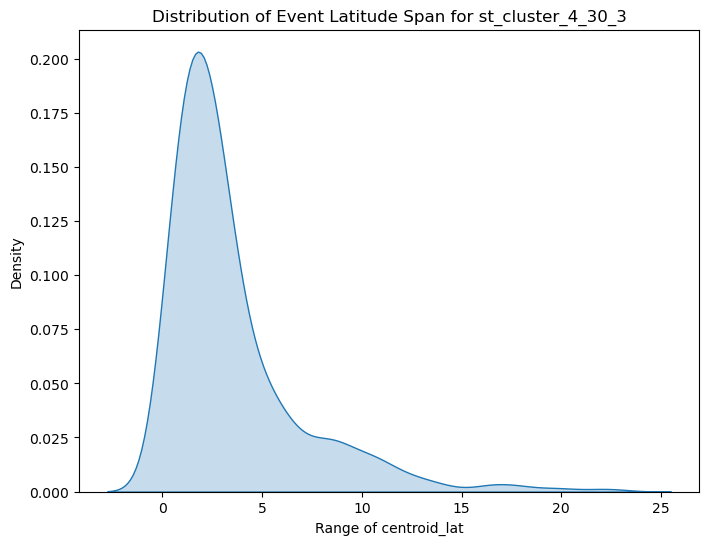

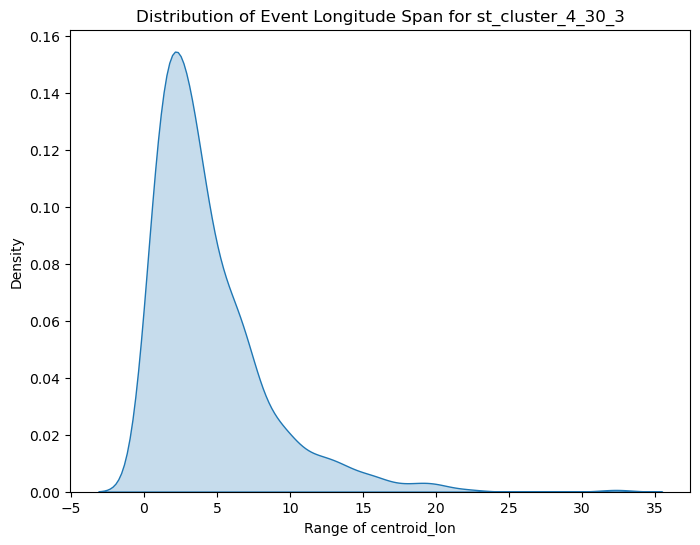


Analyzing st_cluster field: st_cluster_4_30_5


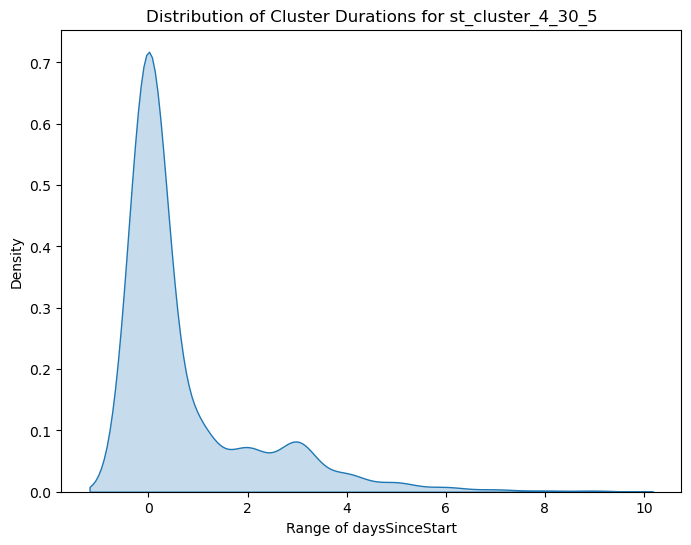

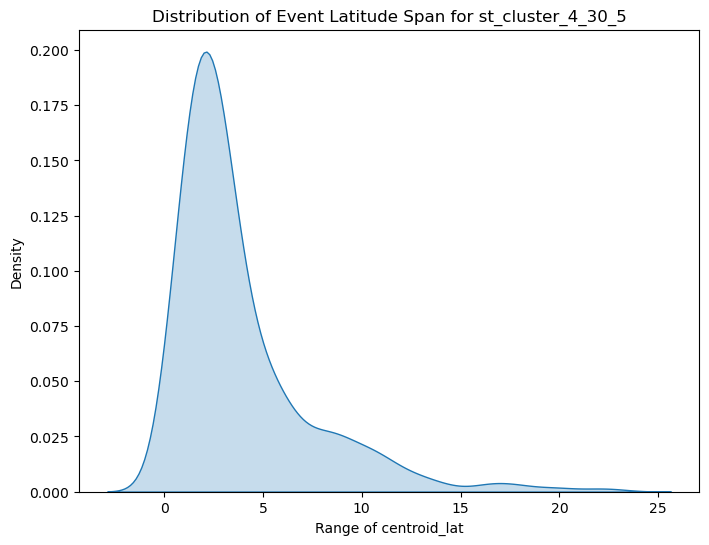

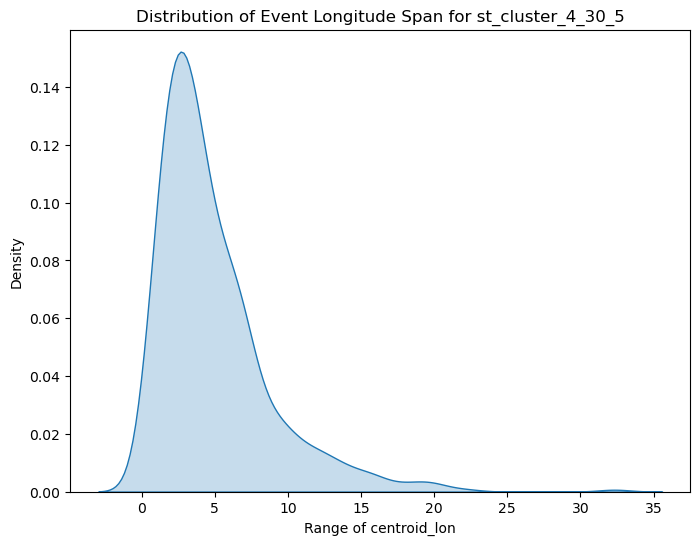


Analyzing st_cluster field: st_cluster_4_30_7


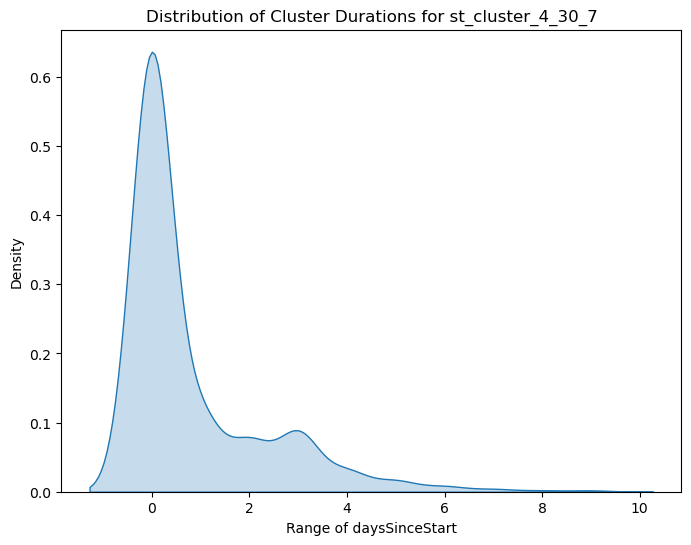

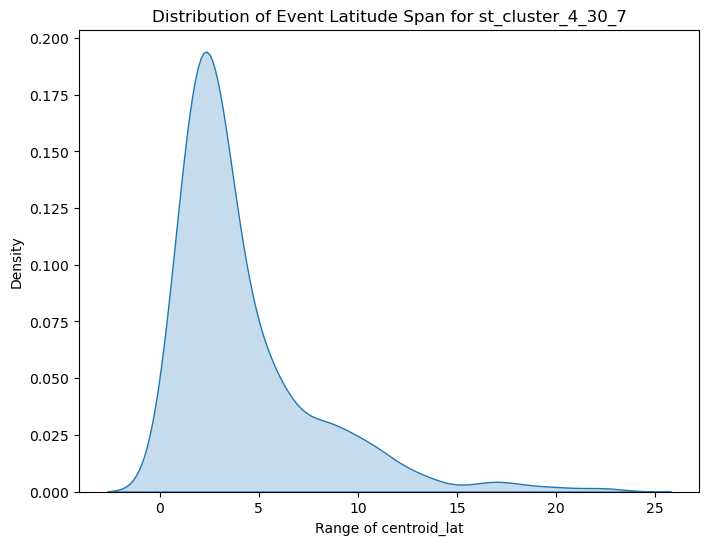

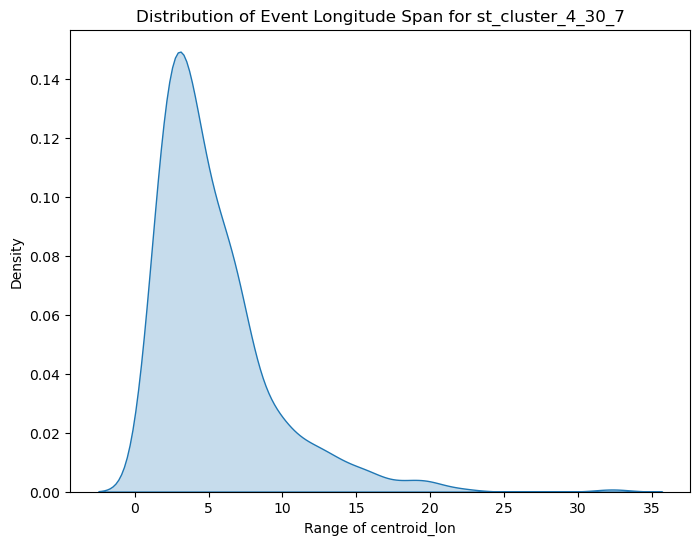


Analyzing st_cluster field: st_cluster_4_30_10


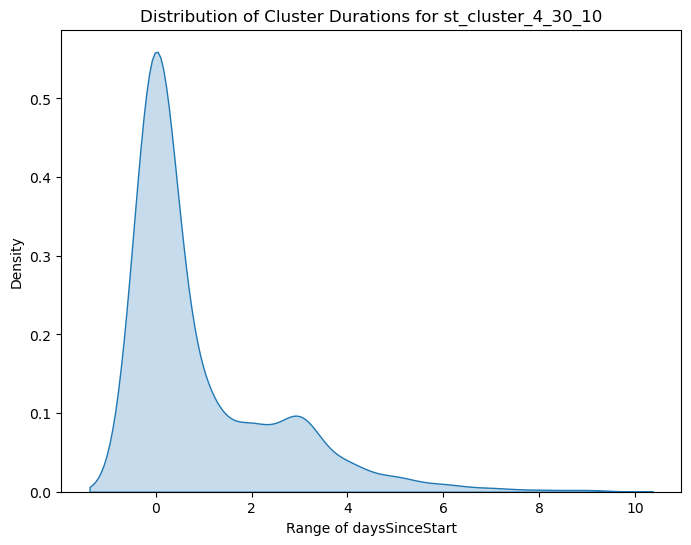

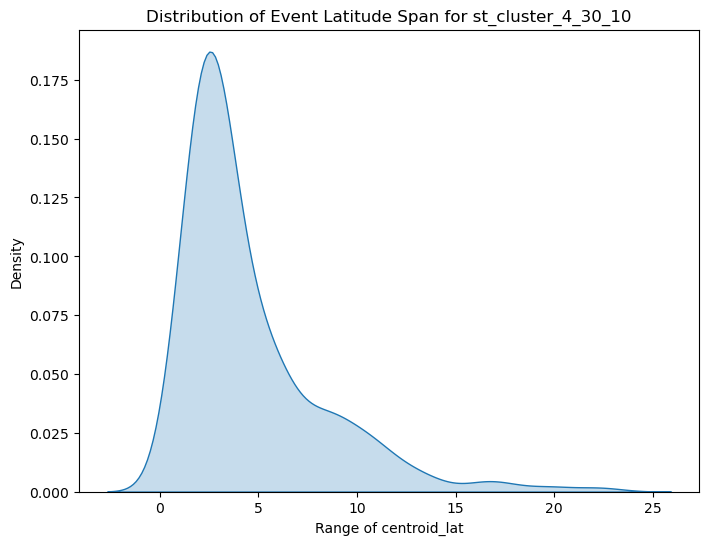

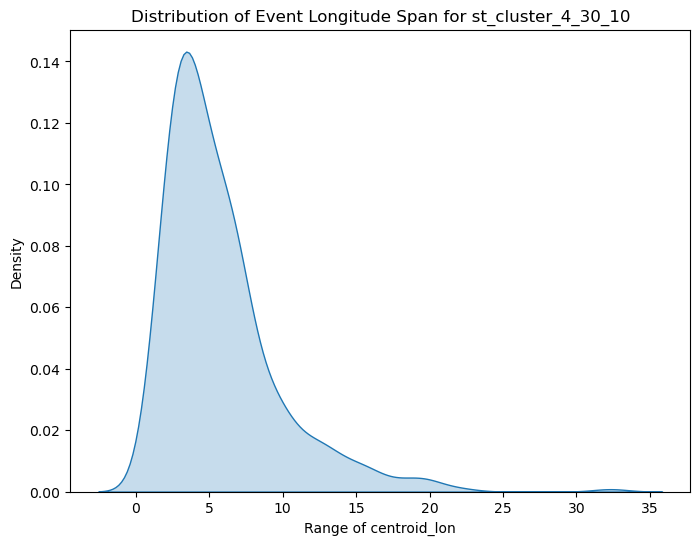

In [22]:
check_disaster_grouping(disasters, st_cluster_fields, 'disasterNumber', 'declarationTitle')

# Choose optimal parameters

In [23]:
# Load sensitivity to optimize
sensitivity_df = pd.read_csv("Clusters/cluster_sensitivities_di.csv")

# Selecting relevant columns
objectives = sensitivity_df[["percent_clustered", "count_complex_cases"]]
scaler = MinMaxScaler()

# Normalize 'percent_clustered' and 'total_clusters' (maximize), and 'count_complex_cases' (minimize)
objectives["percent_clustered"] = scaler.fit_transform(objectives[["percent_clustered"]])
objectives["count_complex_cases"] = 1 - scaler.fit_transform(objectives[["count_complex_cases"]])

# Calculate a combined score (weighted equally)
sensitivity_df["combined_score"] = (
    objectives["percent_clustered"] +
    objectives["count_complex_cases"]
)

# Find the row with the highest combined score
best_combination = sensitivity_df.loc[sensitivity_df["combined_score"].idxmax()]

# Display the best parameter combination and scores
best_combination

/tmp/ipykernel_6754/2582124978.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  objectives["percent_clustered"] = scaler.fit_transform(objectives[["percent_clustered"]])
/tmp/ipykernel_6754/2582124978.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  objectives["count_complex_cases"] = 1 - scaler.fit_transform(objectives[["count_complex_cases"]])


space_thres              4.000000
time_thres              30.000000
num_thres                3.000000
total_clusters         652.000000
percent_clustered       99.313591
avg_duration             0.643185
avg_lat_span             3.515911
avg_lon_span             4.420230
max_duration             9.000000
max_lat_span            22.680000
max_lon_span            32.320000
var_duration             1.785065
var_lat_span            11.784291
var_lon_span            14.821293
count_complex_cases      0.000000
combined_score           2.000000
Name: 109, dtype: float64

In [11]:
# Parameters for ST_DBSCAN
"""
if best_combination['space_thres'] != 0.5:
    space_thres = int(best_combination['space_thres']) # Spatial threshold
time_thres = int(best_combination['time_thres'])   # Temporal threshold
num_thres = int(best_combination['num_thres'])    # Minimum number of points to form a cluster
"""
space_thres = 3 # Spatial threshold
time_thres = 5  # Temporal threshold
num_thres = 7 # Minimum number of points to form a cluster

In [12]:
# Find the largest cluster by size
var = f'st_cluster_{space_thres}_{time_thres}_{num_thres}'
largest_cluster = disasters[var].value_counts().idxmax()
print(largest_cluster)

5


/tmp/ipykernel_1152/663790639.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hurricane_katrina['centroid_lon'] += np.random.uniform(-0.1, 0.1, size=len(hurricane_katrina))
/tmp/ipykernel_1152/663790639.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hurricane_katrina['centroid_lat'] += np.random.uniform(-0.1, 0.1, size=len(hurricane_katrina))


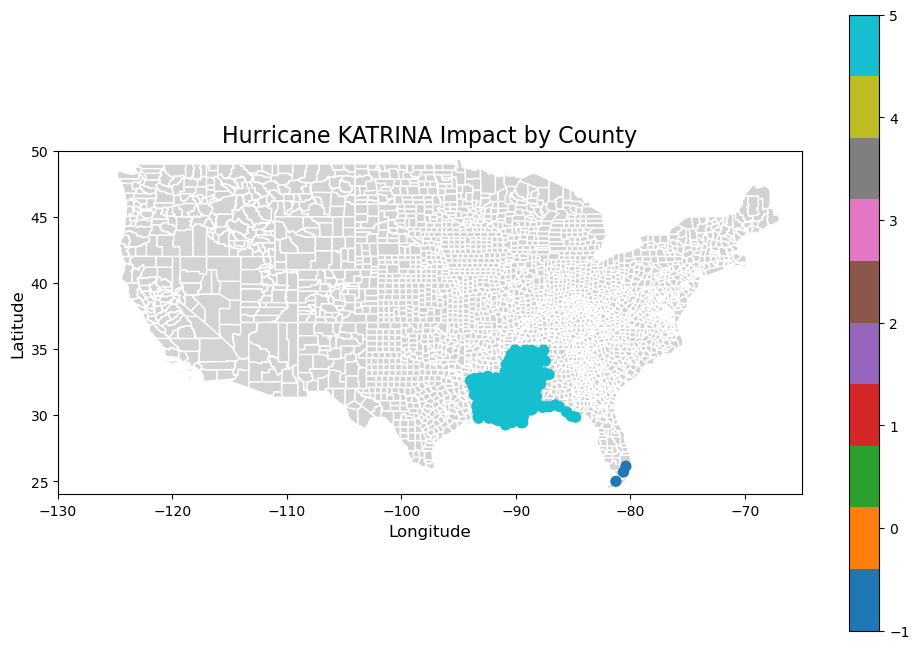

In [13]:
name = 'KATRINA'
# Assume disasters is already a DataFrame
# Filter the dataframe to only include Hurricane Katrina
hurricane_katrina = disasters[disasters['declarationTitle'] == f'HURRICANE {name}']

# Convert var to string
disasters[var] = disasters[var].astype(str)

# Add jitter to coordinates to differentiate overlapping points
hurricane_katrina['centroid_lon'] += np.random.uniform(-0.1, 0.1, size=len(hurricane_katrina))
hurricane_katrina['centroid_lat'] += np.random.uniform(-0.1, 0.1, size=len(hurricane_katrina))

# Convert to GeoDataFrame for geospatial plotting
gdf_points = gpd.GeoDataFrame(
    hurricane_katrina,
    geometry=gpd.points_from_xy(hurricane_katrina['centroid_lon'], hurricane_katrina['centroid_lat']),
    crs="EPSG:4326"  # WGS 84
)

# Load the county shapefile
county_shapefile_path = '../Local_Data/Geospatial/tl_2019_us_county.shp'
gdf_counties = gpd.read_file(county_shapefile_path)

# Define the extent for the southern US
southern_us_extent =  [-130, -65, 24, 50]  # [min_longitude, max_longitude, min_latitude, max_latitude] [-106, -75, 25, 36]

# Plot the map
fig, ax = plt.subplots(figsize=(12, 8))

# Plot counties
gdf_counties.plot(ax=ax, color='lightgrey', edgecolor='white')

# Plot Hurricane Katrina points
gdf_points.plot(
    ax=ax,
    column=var,  # Use this column for color coding
    cmap='tab10',  # Discrete color map
    markersize=50,
    legend=True
)

# Set the extent to the southern US
ax.set_xlim(southern_us_extent[0], southern_us_extent[1])
ax.set_ylim(southern_us_extent[2], southern_us_extent[3])

# Add titles and labels
ax.set_title(f'Hurricane {name} Impact by County', fontsize=16)
ax.set_xlabel('Longitude', fontsize=12)
ax.set_ylabel('Latitude', fontsize=12)

plt.show()

In [14]:
set(hurricane_katrina[var])

{-1, 5}

/tmp/ipykernel_1152/249031938.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_x['centroid_lon'] += np.random.uniform(-0.1, 0.1, size=len(cluster_x))
/tmp/ipykernel_1152/249031938.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_x['centroid_lat'] += np.random.uniform(-0.1, 0.1, size=len(cluster_x))


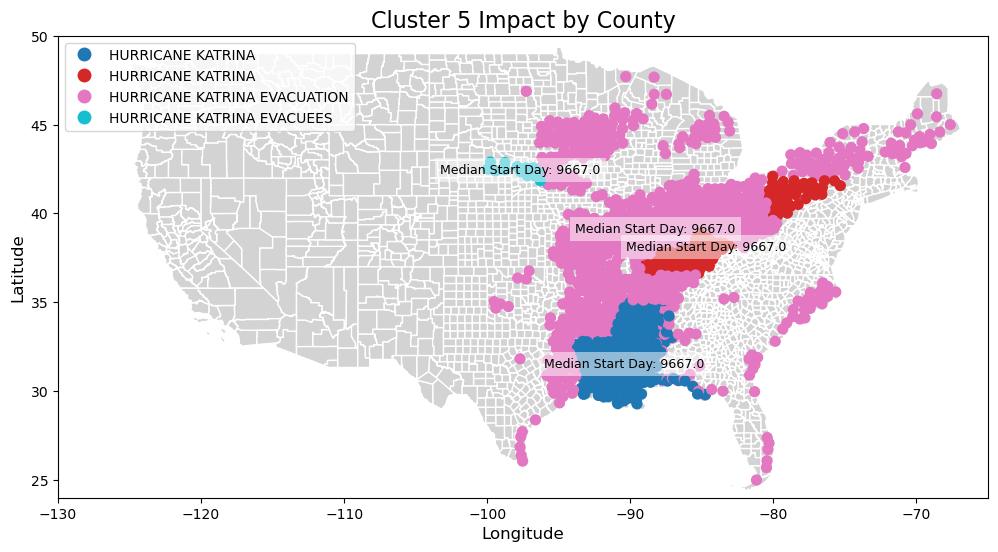

In [15]:
number = largest_cluster.astype(str)
# Assume disasters is already a DataFrame
# Convert var to string
disasters[var] = disasters[var].astype(str)

# Filter the dataframe to only include Hurricane Katrina
cluster_x = disasters[disasters[var] == number]

# Add jitter to coordinates to differentiate overlapping points
cluster_x['centroid_lon'] += np.random.uniform(-0.1, 0.1, size=len(cluster_x))
cluster_x['centroid_lat'] += np.random.uniform(-0.1, 0.1, size=len(cluster_x))

# Compute median latitude, longitude, and daysSinceStart for each declarationTitle
median_data = cluster_x.groupby('declarationTitle').agg(
    median_lat=('centroid_lat', 'median'),
    median_lon=('centroid_lon', 'median'),
    median_daysSinceStart=('daysSinceStart', 'median')
).reset_index()


# Convert to GeoDataFrame for geospatial plotting
gdf_points = gpd.GeoDataFrame(
    cluster_x,
    geometry=gpd.points_from_xy(cluster_x['centroid_lon'], cluster_x['centroid_lat']),
    crs="EPSG:4326"  # WGS 84
)

# Load the county shapefile
county_shapefile_path = '../Local_Data/Geospatial/tl_2019_us_county.shp'
gdf_counties = gpd.read_file(county_shapefile_path)

# Define the extent for the southern US
southern_us_extent =  [-130, -65, 24, 50]  # [min_longitude, max_longitude, min_latitude, max_latitude] [-106, -75, 25, 36]

# Plot the map
fig, ax = plt.subplots(figsize=(12, 8))

# Plot counties
gdf_counties.plot(ax=ax, color='lightgrey', edgecolor='white')

# Plot Hurricane Katrina points
gdf_points.plot(
    ax=ax,
    column='declarationTitle',  # Use this column for color coding
    cmap='tab10',  # Discrete color map
    markersize=50,
    legend=True
)

# Plot the median points for each declarationTitle
for _, row in median_data.iterrows():
    ax.text(
        row['median_lon'], row['median_lat'],
        f"Median Start Day: {row['median_daysSinceStart']:.1f}",
        fontsize=9, color='black', ha='center', va='center',
        bbox=dict(facecolor='white', alpha=0.5, edgecolor='none')
    )

# Set the extent to the southern US
ax.set_xlim(southern_us_extent[0], southern_us_extent[1])
ax.set_ylim(southern_us_extent[2], southern_us_extent[3])

# Add titles and labels
ax.set_title(f'Cluster {number} Impact by County', fontsize=16)
ax.set_xlabel('Longitude', fontsize=12)
ax.set_ylabel('Latitude', fontsize=12)

plt.show()

In [16]:
# Assume disasters is already a DataFrame
number = largest_cluster.astype(str)
disasters[var] = disasters[var].astype(str)
#number = '469'

/tmp/ipykernel_1152/2348706229.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_x['centroid_lon'] += np.random.uniform(-0.1, 0.1, size=len(cluster_x))
/tmp/ipykernel_1152/2348706229.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_x['centroid_lat'] += np.random.uniform(-0.1, 0.1, size=len(cluster_x))


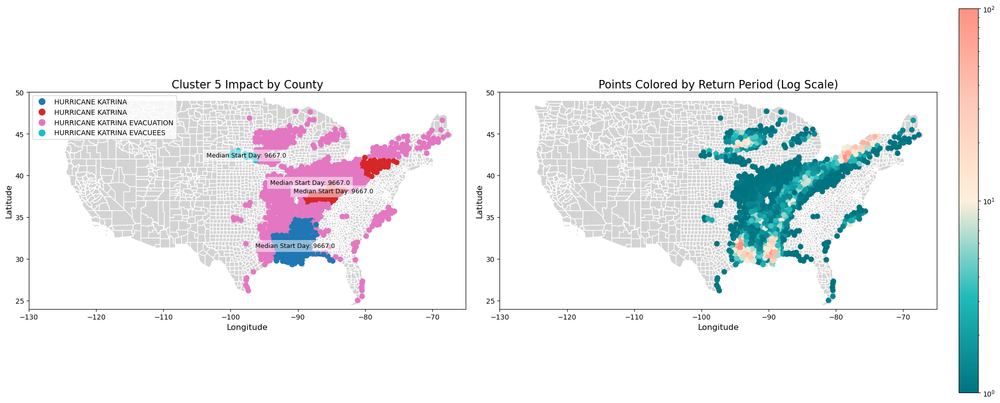

In [20]:
# Custom color palette for mapping
colors = ['#007380', '#21BBBB', '#FFEFDB', '#ffcab7', '#ff9183']
cmap_left = mcolors.LinearSegmentedColormap.from_list('custom_cmap', colors, N=256)
norm = mcolors.LogNorm(vmin=1, vmax=100)  # Log normalization

# Filter the dataframe to only include Hurricane Katrina
cluster_x = disasters[disasters[var] == number]

# Add jitter to coordinates to differentiate overlapping points
cluster_x['centroid_lon'] += np.random.uniform(-0.1, 0.1, size=len(cluster_x))
cluster_x['centroid_lat'] += np.random.uniform(-0.1, 0.1, size=len(cluster_x))

# Compute median latitude, longitude, and daysSinceStart for each declarationTitle
median_data = cluster_x.groupby('declarationTitle').agg(
    median_lat=('centroid_lat', 'median'),
    median_lon=('centroid_lon', 'median'),
    median_daysSinceStart=('daysSinceStart', 'median')
).reset_index()

# Convert to GeoDataFrame for geospatial plotting
gdf_points = gpd.GeoDataFrame(
    cluster_x,
    geometry=gpd.points_from_xy(cluster_x['centroid_lon'], cluster_x['centroid_lat']),
    crs="EPSG:4326"
)

# Load the county shapefile
county_shapefile_path = '../Local_Data/Geospatial/tl_2019_us_county.shp'
gdf_counties = gpd.read_file(county_shapefile_path)

# Define the extent for the southern US
southern_us_extent = [-130, -65, 24, 50]

# Create the figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(20, 8), constrained_layout=True)

# First subplot: original plot
ax1 = axes[0]
gdf_counties.plot(ax=ax1, color='lightgrey', edgecolor='white')
gdf_points.plot(
    ax=ax1,
    column='declarationTitle',
    cmap='tab10',
    markersize=50,
    legend=True
)

# Plot median points
for _, row in median_data.iterrows():
    ax1.text(
        row['median_lon'], row['median_lat'],
        f"Median Start Day: {row['median_daysSinceStart']:.1f}",
        fontsize=9, color='black', ha='center', va='center',
        bbox=dict(facecolor='white', alpha=0.5, edgecolor='none')
    )

# Set extent and labels for the first subplot
ax1.set_xlim(southern_us_extent[0], southern_us_extent[1])
ax1.set_ylim(southern_us_extent[2], southern_us_extent[3])
ax1.set_title(f'Cluster {number} Impact by County', fontsize=16)
ax1.set_xlabel('Longitude', fontsize=12)
ax1.set_ylabel('Latitude', fontsize=12)

# Second subplot: points colored by 'returnPeriod_MSWEP_1d' with log colormap
ax2 = axes[1]
gdf_counties.plot(ax=ax2, color='lightgrey', edgecolor='white')
gdf_points.plot(
    ax=ax2,
    column='returnPeriod_MSWEP_1d',
    cmap=cmap_left,
    markersize=50,
    legend=True,
    norm=norm
)

# Set extent and labels for the second subplot
ax2.set_xlim(southern_us_extent[0], southern_us_extent[1])
ax2.set_ylim(southern_us_extent[2], southern_us_extent[3])
ax2.set_title('Points Colored by Return Period (Log Scale)', fontsize=16)
ax2.set_xlabel('Longitude', fontsize=12)
ax2.set_ylabel('Latitude', fontsize=12)

# Show the plot
plt.show()

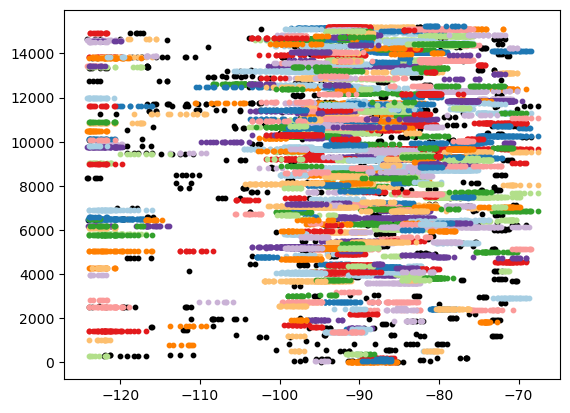

Total clusters extracted: 537


In [31]:
# Ensure the data chunk is properly prepared
st_chunk = disasters[['centroid_lat', 'centroid_lon', 'daysSinceStart']].values
st_chunk = st_chunk[~np.isnan(st_chunk).any(axis=1)]

if st_chunk.size == 0:
    raise ValueError("No valid data points for clustering.")

# Instantiate ST_DBSCAN
st_dbscan = ST_DBSCAN(eps1=space_thres, eps2=time_thres, min_samples=num_thres)

# Fit the data
st_dbscan.fit(st_chunk)

# Add cluster labels to the original DataFrame
disasters['st_cluster'] = st_dbscan.labels  # Use labels_ if applicable

plot(st_chunk, st_dbscan.labels)

print(f"Total clusters extracted: {disasters['st_cluster'].max()}")

In [32]:
print(f"Total clusters extracted: {disasters['st_cluster'].max()}")
print(f"Percent unclustered: {len(disasters[disasters['st_cluster']==-1])/len(disasters)*100}%")

Total clusters extracted: 537
Percent unclustered: 3.9301823887036673%


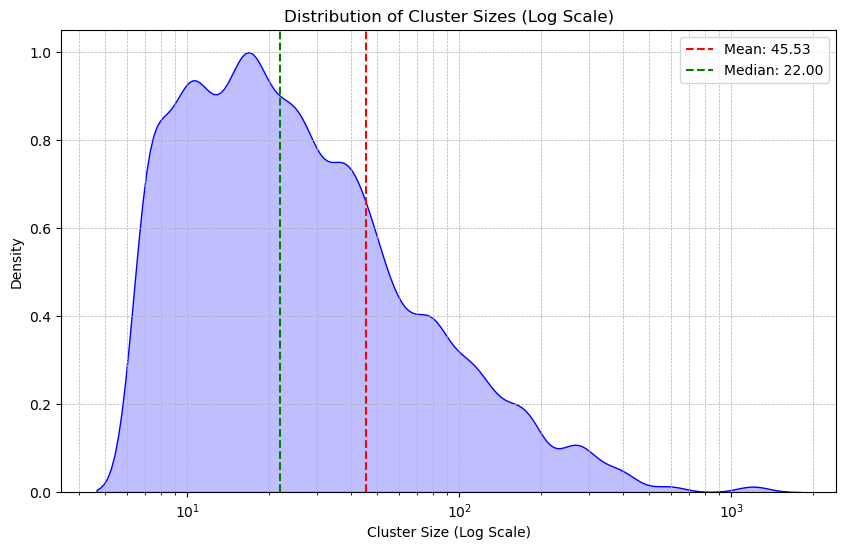

In [33]:
cluster_sizes = disasters[disasters['st_cluster'] != -1].groupby(['st_cluster']).size()
mean_size = cluster_sizes.mean()
median_size = cluster_sizes.median()

plt.figure(figsize=(10, 6))
sns.kdeplot(cluster_sizes, fill=True, log_scale=True, bw_adjust=0.5, color='blue')
plt.axvline(mean_size, color='red', linestyle='--', linewidth=1.5, label=f'Mean: {mean_size:.2f}')
plt.axvline(median_size, color='green', linestyle='--', linewidth=1.5, label=f'Median: {median_size:.2f}')
plt.title("Distribution of Cluster Sizes (Log Scale)")
plt.xlabel("Cluster Size (Log Scale)")
plt.ylabel("Density")
plt.legend()
plt.grid(True, which="both", linestyle='--', linewidth=0.5)
plt.show()

In [34]:
# Save the result
disasters.to_csv(f"{temp_folder}/clustered_disasters.csv", index=False)

print("Clustering complete. Output saved to 'clustered_disasters.csv'.")

Clustering complete. Output saved to 'clustered_disasters.csv'.
